In [1]:
import torch
from torch.autograd import Variable
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import os
import imageio
import pickle
from logger import Logger

In [2]:
# Parameters
image_size = 64
label_dim = 2
G_input_dim = 100
G_output_dim = 3
D_input_dim = 3
D_output_dim = 1
num_filters = [1024, 512, 256, 128]

learning_rate = 0.0002
betas = (0.5, 0.999)
batch_size = 128
num_epochs = 60

data_dir = '/scratch/ns4767/resized_celebA_hair/'
save_dir = 'CelebA_cDCGAN_hair_results/'
if not os.path.exists(save_dir):
    os.mkdir(save_dir)

In [3]:
transform = transforms.Compose([transforms.Resize((image_size,image_size)),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

celebA_data = dsets.ImageFolder(data_dir, transform=transform)
celebA_data.imgs.sort()

data_loader = torch.utils.data.DataLoader(dataset=celebA_data,
                                          batch_size=batch_size,
                                          shuffle=False)

In [4]:
# For logger
def to_np(x):
    return x.data.cpu().numpy()


def to_var(x):
    if torch.cuda.is_available():
        x = x.cuda()
    return Variable(x)


# De-normalization
def denorm(x):
    out = (x + 1) / 2
    return out.clamp(0, 1)

In [5]:
# Generator model
class Generator(torch.nn.Module):
    def __init__(self, input_dim, label_dim, num_filters, output_dim):
        super(Generator, self).__init__()

        # Hidden layers
        self.hidden_layer1 = torch.nn.Sequential()
        self.hidden_layer2 = torch.nn.Sequential()
        self.hidden_layer = torch.nn.Sequential()
        for i in range(len(num_filters)):
            # Deconvolutional layer
            if i == 0:
                # For input
                input_deconv = torch.nn.ConvTranspose2d(input_dim, int(num_filters[i]/2), kernel_size=4, stride=1, padding=0)
                self.hidden_layer1.add_module('input_deconv', input_deconv)

                # Initializer
                torch.nn.init.normal_(input_deconv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(input_deconv.bias, 0.0)

                # Batch normalization
                self.hidden_layer1.add_module('input_bn', torch.nn.BatchNorm2d(int(num_filters[i]/2)))

                # Activation
                self.hidden_layer1.add_module('input_act', torch.nn.ReLU())

                # For label
                label_deconv = torch.nn.ConvTranspose2d(label_dim, int(num_filters[i]/2), kernel_size=4, stride=1, padding=0)
                self.hidden_layer2.add_module('label_deconv', label_deconv)

                # Initializer
                torch.nn.init.normal_(label_deconv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(label_deconv.bias, 0.0)

                # Batch normalization
                self.hidden_layer2.add_module('label_bn', torch.nn.BatchNorm2d(int(num_filters[i]/2)))

                # Activation
                self.hidden_layer2.add_module('label_act', torch.nn.ReLU())
            else:
                deconv = torch.nn.ConvTranspose2d(num_filters[i-1], num_filters[i], kernel_size=4, stride=2, padding=1)

                deconv_name = 'deconv' + str(i + 1)
                self.hidden_layer.add_module(deconv_name, deconv)

                # Initializer
                torch.nn.init.normal_(deconv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(deconv.bias, 0.0)

                # Batch normalization
                bn_name = 'bn' + str(i + 1)
                self.hidden_layer.add_module(bn_name, torch.nn.BatchNorm2d(num_filters[i]))

                # Activation
                act_name = 'act' + str(i + 1)
                self.hidden_layer.add_module(act_name, torch.nn.ReLU())

        # Output layer
        self.output_layer = torch.nn.Sequential()
        # Deconvolutional layer
        out = torch.nn.ConvTranspose2d(num_filters[i], output_dim, kernel_size=4, stride=2, padding=1)
        self.output_layer.add_module('out', out)
        # Initializer
        torch.nn.init.normal_(out.weight, mean=0.0, std=0.02)
        torch.nn.init.constant_(out.bias, 0.0)
        # Activation
        self.output_layer.add_module('act', torch.nn.Tanh())

    def forward(self, z, c):
        h1 = self.hidden_layer1(z)
        h2 = self.hidden_layer2(c)
        x = torch.cat([h1, h2], 1)
        h = self.hidden_layer(x)
        out = self.output_layer(h)
        return out

In [6]:
# Discriminator model
class Discriminator(torch.nn.Module):
    def __init__(self, input_dim, label_dim, num_filters, output_dim):
        super(Discriminator, self).__init__()

        self.hidden_layer1 = torch.nn.Sequential()
        self.hidden_layer2 = torch.nn.Sequential()
        self.hidden_layer = torch.nn.Sequential()
        for i in range(len(num_filters)):
            # Convolutional layer
            if i == 0:
                # For input
                input_conv = torch.nn.Conv2d(input_dim, int(num_filters[i]/2), kernel_size=4, stride=2, padding=1)
                self.hidden_layer1.add_module('input_conv', input_conv)

                # Initializer
                torch.nn.init.normal_(input_conv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(input_conv.bias, 0.0)

                # Activation
                self.hidden_layer1.add_module('input_act', torch.nn.LeakyReLU(0.2))

                # For label
                label_conv = torch.nn.Conv2d(label_dim, int(num_filters[i]/2), kernel_size=4, stride=2, padding=1)
                self.hidden_layer2.add_module('label_conv', label_conv)

                # Initializer
                torch.nn.init.normal_(label_conv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(label_conv.bias, 0.0)

                # Activation
                self.hidden_layer2.add_module('label_act', torch.nn.LeakyReLU(0.2))
            else:
                conv = torch.nn.Conv2d(num_filters[i-1], num_filters[i], kernel_size=4, stride=2, padding=1)

                conv_name = 'conv' + str(i + 1)
                self.hidden_layer.add_module(conv_name, conv)

                # Initializer
                torch.nn.init.normal_(conv.weight, mean=0.0, std=0.02)
                torch.nn.init.constant_(conv.bias, 0.0)

                # Batch normalization
                bn_name = 'bn' + str(i + 1)
                self.hidden_layer.add_module(bn_name, torch.nn.BatchNorm2d(num_filters[i]))

                # Activation
                act_name = 'act' + str(i + 1)
                self.hidden_layer.add_module(act_name, torch.nn.LeakyReLU(0.2))

        # Output layer
        self.output_layer = torch.nn.Sequential()
        # Convolutional layer
        out = torch.nn.Conv2d(num_filters[i], output_dim, kernel_size=4, stride=1, padding=0)
        self.output_layer.add_module('out', out)
        # Initializer
        torch.nn.init.normal_(out.weight, mean=0.0, std=0.02)
        torch.nn.init.constant_(out.bias, 0.0)
        # Activation
        self.output_layer.add_module('act', torch.nn.Sigmoid())

    def forward(self, z, c):
        h1 = self.hidden_layer1(z)
        h2 = self.hidden_layer2(c)
        x = torch.cat([h1, h2], 1)
        h = self.hidden_layer(x)
        out = self.output_layer(h)
        return out


In [7]:
# Plot losses
def plot_loss(d_losses, g_losses, num_epoch, save=False, save_dir='CelebA_cDCGAN_results/', show=True):
    fig, ax = plt.subplots()
    ax.set_xlim(0, num_epochs)
    ax.set_ylim(0, max(np.max(g_losses), np.max(d_losses))*1.1)
    plt.xlabel('Epoch {0}'.format(num_epoch + 1))
    plt.ylabel('Loss values')
    plt.plot(d_losses, label='Discriminator')
    plt.plot(g_losses, label='Generator')
    plt.legend()

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'CelebA_cDCGAN_losses_epoch_{:d}'.format(num_epoch + 1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

In [8]:
def plot_result(generator, noise, label, num_epoch, save=False, save_dir='CelebA_cDCGAN_results/', show=True, fig_size=(5, 5)):
    generator.eval()

    noise = Variable(noise.cuda())
    label = Variable(label.cuda())
    gen_image = generator(noise, label)
    gen_image = denorm(gen_image)

    generator.train()

    n_rows = np.sqrt(noise.size()[0]).astype(np.int32)
    n_cols = np.sqrt(noise.size()[0]).astype(np.int32)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=fig_size)
    for ax, img in zip(axes.flatten(), gen_image):
        ax.axis('off')
        ax.set_adjustable('box')
        # Scale to 0-255
        img = (((img - img.min()) * 255) / (img.max() - img.min())).cpu().data.numpy().transpose(1, 2, 0).astype(
            np.uint8)
        # ax.imshow(img.cpu().data.view(image_size, image_size, 3).numpy(), cmap=None, aspect='equal')
        ax.imshow(img, cmap=None, aspect='equal')
    plt.subplots_adjust(wspace=0, hspace=0)
    title = 'Epoch {0}'.format(num_epoch + 1)
    fig.text(0.5, 0.04, title, ha='center')

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'CelebA_cDCGAN_epoch_{:d}'.format(num_epoch+1) + '.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()


In [9]:
def plot_morp_result(generator, save=False, save_dir='CelebA_cDCGAN_results/', show=True, fig_size=(10, 10)):
    source_z_ = torch.randn(10, G_input_dim)
    z_ = torch.zeros(10*10, G_input_dim)
    for i in range(5):
        for j in range(10):
            z_[i * 20 + j] = (source_z_[i * 2 + 1] - source_z_[i * 2]) / 9 * (j + 1) + source_z_[i * 2]

    for i in range(5):
        z_[i * 20 + 10:i * 20 + 20] = z_[i * 20:i * 20 + 10]

    y_ = torch.cat([torch.zeros(10, 1), torch.ones(10, 1)], 0).type(torch.LongTensor).squeeze()
    y_ = torch.cat([y_, y_, y_, y_, y_], 0)
    y_label_ = onehot[y_]
    noise = z_.view(-1, G_input_dim, 1, 1)
    label = y_label_.view(-1, label_dim, 1, 1)

    generator.eval()

    noise = Variable(noise.cuda())
    label = Variable(label.cuda())
    gen_image = generator(noise, label)
    gen_image = denorm(gen_image)

    generator.train()

    n_rows = np.sqrt(noise.size()[0]).astype(np.int32)
    n_cols = np.sqrt(noise.size()[0]).astype(np.int32)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=fig_size)
    for ax, img in zip(axes.flatten(), gen_image):
        ax.axis('off')
        ax.set_adjustable('box')
        # Scale to 0-255
        img = (((img - img.min()) * 255) / (img.max() - img.min())).cpu().data.numpy().transpose(1, 2, 0).astype(
            np.uint8)
        ax.imshow(img, cmap=None, aspect='equal')
    plt.subplots_adjust(wspace=0, hspace=0)

    # save figure
    if save:
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        save_fn = save_dir + 'CelebA_cDCGAN_noise_morp.png'
        plt.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

In [10]:
# Models
G = Generator(G_input_dim, label_dim, num_filters, G_output_dim)
D = Discriminator(D_input_dim, label_dim, num_filters[::-1], D_output_dim)
G.cuda()
D.cuda()
print(G)
print(D)

Generator(
  (hidden_layer1): Sequential(
    (input_deconv): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (input_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (input_act): ReLU()
  )
  (hidden_layer2): Sequential(
    (label_deconv): ConvTranspose2d(2, 512, kernel_size=(4, 4), stride=(1, 1))
    (label_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (label_act): ReLU()
  )
  (hidden_layer): Sequential(
    (deconv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act2): ReLU()
    (deconv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act3): ReLU()
    (deconv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padd

In [11]:
# Set the logger
D_log_dir = save_dir + 'D_logs'
G_log_dir = save_dir + 'G_logs'
if not os.path.exists(D_log_dir):
    os.mkdir(D_log_dir)
D_logger = Logger(D_log_dir)

if not os.path.exists(G_log_dir):
    os.mkdir(G_log_dir)
G_logger = Logger(G_log_dir)

In [12]:
# Loss function
criterion = torch.nn.BCELoss()

# Optimizers
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas=betas)
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas=betas)

In [13]:
with open('hair_label.pkl', 'rb') as fp:
    label = pickle.load(fp)
label = torch.LongTensor(label).squeeze()

In [14]:
# Label preprocess
onehot = torch.zeros(label_dim, label_dim)
onehot = onehot.scatter_(1, torch.LongTensor([0, 1]).view(label_dim, 1), 1).view(label_dim, label_dim, 1, 1)
fill = torch.zeros([label_dim, label_dim, image_size, image_size])
for i in range(label_dim):
    fill[i, i, :, :] = 1

In [15]:
# fixed noise & label
temp_noise0_ = torch.randn(4, G_input_dim)
temp_noise0_ = torch.cat([temp_noise0_, temp_noise0_], 0)
temp_noise1_ = torch.randn(4, G_input_dim)
temp_noise1_ = torch.cat([temp_noise1_, temp_noise1_], 0)

fixed_noise = torch.cat([temp_noise0_, temp_noise1_], 0)
fixed_label = torch.cat([torch.zeros(4), torch.ones(4), torch.zeros(4), torch.ones(4)], 0).type(torch.LongTensor).squeeze()

fixed_noise = fixed_noise.view(-1, G_input_dim, 1, 1)
fixed_label = onehot[fixed_label]

Epoch [1/60], Step [1/686], D_loss: 2.1382, G_loss: 17.9653
Epoch [1/60], Step [2/686], D_loss: 6.9650, G_loss: 19.7670
Epoch [1/60], Step [3/686], D_loss: 1.1726, G_loss: 19.5747
Epoch [1/60], Step [4/686], D_loss: 7.0972, G_loss: 23.7208
Epoch [1/60], Step [5/686], D_loss: 1.4931, G_loss: 12.8864
Epoch [1/60], Step [6/686], D_loss: 4.4476, G_loss: 21.2904
Epoch [1/60], Step [7/686], D_loss: 0.9632, G_loss: 16.4402
Epoch [1/60], Step [8/686], D_loss: 2.8189, G_loss: 20.0575
Epoch [1/60], Step [9/686], D_loss: 4.8293, G_loss: 26.2849
Epoch [1/60], Step [10/686], D_loss: 2.2247, G_loss: 16.1480
Epoch [1/60], Step [11/686], D_loss: 3.8783, G_loss: 18.7206
Epoch [1/60], Step [12/686], D_loss: 2.4167, G_loss: 28.1624
Epoch [1/60], Step [13/686], D_loss: 4.9182, G_loss: 17.0726
Epoch [1/60], Step [14/686], D_loss: 0.3351, G_loss: 0.6756
Epoch [1/60], Step [15/686], D_loss: 12.1358, G_loss: 22.8502
Epoch [1/60], Step [16/686], D_loss: 3.3959, G_loss: 18.4624
Epoch [1/60], Step [17/686], D_lo

Epoch [1/60], Step [137/686], D_loss: 1.6413, G_loss: 3.2840
Epoch [1/60], Step [138/686], D_loss: 1.6530, G_loss: 4.7824
Epoch [1/60], Step [139/686], D_loss: 0.9316, G_loss: 3.7778
Epoch [1/60], Step [140/686], D_loss: 0.5627, G_loss: 2.8004
Epoch [1/60], Step [141/686], D_loss: 0.6545, G_loss: 5.0974
Epoch [1/60], Step [142/686], D_loss: 0.6294, G_loss: 4.2955
Epoch [1/60], Step [143/686], D_loss: 0.4013, G_loss: 3.0007
Epoch [1/60], Step [144/686], D_loss: 0.6577, G_loss: 5.0552
Epoch [1/60], Step [145/686], D_loss: 0.4825, G_loss: 4.8911
Epoch [1/60], Step [146/686], D_loss: 0.3342, G_loss: 3.9215
Epoch [1/60], Step [147/686], D_loss: 0.7947, G_loss: 5.5361
Epoch [1/60], Step [148/686], D_loss: 0.9623, G_loss: 4.6433
Epoch [1/60], Step [149/686], D_loss: 0.6832, G_loss: 3.4702
Epoch [1/60], Step [150/686], D_loss: 1.1243, G_loss: 6.1002
Epoch [1/60], Step [151/686], D_loss: 1.3795, G_loss: 4.5777
Epoch [1/60], Step [152/686], D_loss: 0.8018, G_loss: 2.1693
Epoch [1/60], Step [153/

Epoch [1/60], Step [272/686], D_loss: 0.7834, G_loss: 5.7388
Epoch [1/60], Step [273/686], D_loss: 0.1836, G_loss: 5.0198
Epoch [1/60], Step [274/686], D_loss: 0.1105, G_loss: 4.7384
Epoch [1/60], Step [275/686], D_loss: 0.2128, G_loss: 4.2487
Epoch [1/60], Step [276/686], D_loss: 0.3682, G_loss: 7.0350
Epoch [1/60], Step [277/686], D_loss: 0.4486, G_loss: 5.4231
Epoch [1/60], Step [278/686], D_loss: 0.7012, G_loss: 9.7360
Epoch [1/60], Step [279/686], D_loss: 0.7450, G_loss: 6.2879
Epoch [1/60], Step [280/686], D_loss: 0.5126, G_loss: 4.1160
Epoch [1/60], Step [281/686], D_loss: 1.2782, G_loss: 10.7580
Epoch [1/60], Step [282/686], D_loss: 1.2591, G_loss: 8.9215
Epoch [1/60], Step [283/686], D_loss: 0.6259, G_loss: 4.2383
Epoch [1/60], Step [284/686], D_loss: 0.5988, G_loss: 4.5593
Epoch [1/60], Step [285/686], D_loss: 1.3304, G_loss: 11.4209
Epoch [1/60], Step [286/686], D_loss: 1.5080, G_loss: 9.3033
Epoch [1/60], Step [287/686], D_loss: 0.9184, G_loss: 3.3646
Epoch [1/60], Step [28

Epoch [1/60], Step [407/686], D_loss: 1.2601, G_loss: 9.7321
Epoch [1/60], Step [408/686], D_loss: 1.7889, G_loss: 6.5479
Epoch [1/60], Step [409/686], D_loss: 0.3388, G_loss: 3.7887
Epoch [1/60], Step [410/686], D_loss: 1.3227, G_loss: 8.5230
Epoch [1/60], Step [411/686], D_loss: 1.0163, G_loss: 6.0056
Epoch [1/60], Step [412/686], D_loss: 0.3894, G_loss: 3.0384
Epoch [1/60], Step [413/686], D_loss: 1.3778, G_loss: 5.7221
Epoch [1/60], Step [414/686], D_loss: 1.0378, G_loss: 4.3496
Epoch [1/60], Step [415/686], D_loss: 0.5060, G_loss: 2.7290
Epoch [1/60], Step [416/686], D_loss: 0.7702, G_loss: 6.9119
Epoch [1/60], Step [417/686], D_loss: 0.4318, G_loss: 5.8586
Epoch [1/60], Step [418/686], D_loss: 0.6321, G_loss: 7.0231
Epoch [1/60], Step [419/686], D_loss: 0.5760, G_loss: 3.5440
Epoch [1/60], Step [420/686], D_loss: 1.0145, G_loss: 8.6608
Epoch [1/60], Step [421/686], D_loss: 0.8111, G_loss: 7.9452
Epoch [1/60], Step [422/686], D_loss: 0.7547, G_loss: 5.4720
Epoch [1/60], Step [423/

Epoch [1/60], Step [542/686], D_loss: 0.4938, G_loss: 2.7187
Epoch [1/60], Step [543/686], D_loss: 0.6956, G_loss: 4.4025
Epoch [1/60], Step [544/686], D_loss: 0.5070, G_loss: 5.1231
Epoch [1/60], Step [545/686], D_loss: 0.4500, G_loss: 5.0439
Epoch [1/60], Step [546/686], D_loss: 1.1116, G_loss: 6.1518
Epoch [1/60], Step [547/686], D_loss: 1.5197, G_loss: 6.7490
Epoch [1/60], Step [548/686], D_loss: 0.4904, G_loss: 5.1299
Epoch [1/60], Step [549/686], D_loss: 1.2391, G_loss: 8.4007
Epoch [1/60], Step [550/686], D_loss: 1.1328, G_loss: 9.5955
Epoch [1/60], Step [551/686], D_loss: 0.9268, G_loss: 6.7916
Epoch [1/60], Step [552/686], D_loss: 0.5880, G_loss: 4.6792
Epoch [1/60], Step [553/686], D_loss: 0.8248, G_loss: 4.2963
Epoch [1/60], Step [554/686], D_loss: 1.3565, G_loss: 6.0997
Epoch [1/60], Step [555/686], D_loss: 0.7181, G_loss: 6.8781
Epoch [1/60], Step [556/686], D_loss: 0.6922, G_loss: 4.9821
Epoch [1/60], Step [557/686], D_loss: 0.7719, G_loss: 3.2304
Epoch [1/60], Step [558/

Epoch [1/60], Step [677/686], D_loss: 2.0709, G_loss: 1.6827
Epoch [1/60], Step [678/686], D_loss: 1.9580, G_loss: 3.0292
Epoch [1/60], Step [679/686], D_loss: 1.0871, G_loss: 1.8571
Epoch [1/60], Step [680/686], D_loss: 1.2916, G_loss: 0.8110
Epoch [1/60], Step [681/686], D_loss: 1.1748, G_loss: 2.6047
Epoch [1/60], Step [682/686], D_loss: 1.1244, G_loss: 1.4115
Epoch [1/60], Step [683/686], D_loss: 0.8583, G_loss: 2.6818
Epoch [1/60], Step [684/686], D_loss: 1.7697, G_loss: 2.8839
Epoch [1/60], Step [685/686], D_loss: 0.6530, G_loss: 3.3656
Epoch [1/60], Step [686/686], D_loss: 0.8141, G_loss: 1.1923


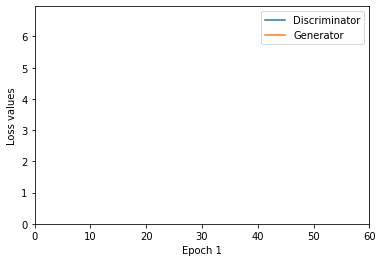

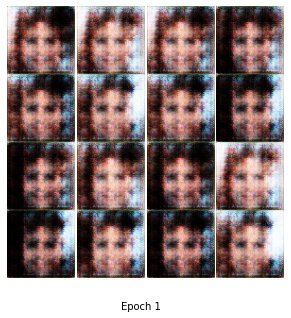

Epoch [2/60], Step [1/686], D_loss: 2.3367, G_loss: 6.5282
Epoch [2/60], Step [2/686], D_loss: 2.0932, G_loss: 2.5092
Epoch [2/60], Step [3/686], D_loss: 0.5991, G_loss: 1.3811
Epoch [2/60], Step [4/686], D_loss: 1.3207, G_loss: 2.0198
Epoch [2/60], Step [5/686], D_loss: 0.9442, G_loss: 0.2356
Epoch [2/60], Step [6/686], D_loss: 2.2291, G_loss: 6.3891
Epoch [2/60], Step [7/686], D_loss: 3.3022, G_loss: 1.9980
Epoch [2/60], Step [8/686], D_loss: 1.0634, G_loss: 1.6875
Epoch [2/60], Step [9/686], D_loss: 1.1964, G_loss: 3.7740
Epoch [2/60], Step [10/686], D_loss: 1.6306, G_loss: 1.2917
Epoch [2/60], Step [11/686], D_loss: 1.2826, G_loss: 1.0160
Epoch [2/60], Step [12/686], D_loss: 0.9110, G_loss: 2.4127
Epoch [2/60], Step [13/686], D_loss: 1.2404, G_loss: 0.8251
Epoch [2/60], Step [14/686], D_loss: 1.2112, G_loss: 2.7216
Epoch [2/60], Step [15/686], D_loss: 1.3748, G_loss: 1.8909
Epoch [2/60], Step [16/686], D_loss: 1.8266, G_loss: 2.4221
Epoch [2/60], Step [17/686], D_loss: 1.0945, G_lo

Epoch [2/60], Step [138/686], D_loss: 1.1928, G_loss: 1.8855
Epoch [2/60], Step [139/686], D_loss: 1.5928, G_loss: 5.4577
Epoch [2/60], Step [140/686], D_loss: 1.3773, G_loss: 2.7176
Epoch [2/60], Step [141/686], D_loss: 0.3539, G_loss: 2.0264
Epoch [2/60], Step [142/686], D_loss: 1.1251, G_loss: 5.4910
Epoch [2/60], Step [143/686], D_loss: 0.4685, G_loss: 3.8713
Epoch [2/60], Step [144/686], D_loss: 0.7530, G_loss: 1.7859
Epoch [2/60], Step [145/686], D_loss: 1.6286, G_loss: 5.0252
Epoch [2/60], Step [146/686], D_loss: 0.4823, G_loss: 4.3364
Epoch [2/60], Step [147/686], D_loss: 1.7691, G_loss: 1.7545
Epoch [2/60], Step [148/686], D_loss: 1.7442, G_loss: 3.7827
Epoch [2/60], Step [149/686], D_loss: 0.9808, G_loss: 2.6987
Epoch [2/60], Step [150/686], D_loss: 0.3758, G_loss: 2.4768
Epoch [2/60], Step [151/686], D_loss: 1.1532, G_loss: 5.3043
Epoch [2/60], Step [152/686], D_loss: 1.3629, G_loss: 2.9975
Epoch [2/60], Step [153/686], D_loss: 0.3681, G_loss: 0.7716
Epoch [2/60], Step [154/

Epoch [2/60], Step [273/686], D_loss: 0.5087, G_loss: 2.3042
Epoch [2/60], Step [274/686], D_loss: 0.6246, G_loss: 2.0670
Epoch [2/60], Step [275/686], D_loss: 1.0288, G_loss: 2.0144
Epoch [2/60], Step [276/686], D_loss: 0.8383, G_loss: 2.6358
Epoch [2/60], Step [277/686], D_loss: 1.7145, G_loss: 1.8631
Epoch [2/60], Step [278/686], D_loss: 1.0135, G_loss: 2.6882
Epoch [2/60], Step [279/686], D_loss: 0.8229, G_loss: 1.7203
Epoch [2/60], Step [280/686], D_loss: 0.8915, G_loss: 1.8956
Epoch [2/60], Step [281/686], D_loss: 0.9378, G_loss: 2.2953
Epoch [2/60], Step [282/686], D_loss: 0.4953, G_loss: 2.5338
Epoch [2/60], Step [283/686], D_loss: 0.7447, G_loss: 1.0135
Epoch [2/60], Step [284/686], D_loss: 0.8382, G_loss: 3.2140
Epoch [2/60], Step [285/686], D_loss: 0.6692, G_loss: 3.9173
Epoch [2/60], Step [286/686], D_loss: 0.9578, G_loss: 2.2232
Epoch [2/60], Step [287/686], D_loss: 0.4996, G_loss: 1.6383
Epoch [2/60], Step [288/686], D_loss: 0.6291, G_loss: 2.3095
Epoch [2/60], Step [289/

Epoch [2/60], Step [408/686], D_loss: 1.4977, G_loss: 1.4340
Epoch [2/60], Step [409/686], D_loss: 0.6263, G_loss: 2.2346
Epoch [2/60], Step [410/686], D_loss: 0.4042, G_loss: 2.7624
Epoch [2/60], Step [411/686], D_loss: 1.0658, G_loss: 1.0087
Epoch [2/60], Step [412/686], D_loss: 1.7931, G_loss: 5.9825
Epoch [2/60], Step [413/686], D_loss: 2.6477, G_loss: 1.4874
Epoch [2/60], Step [414/686], D_loss: 0.9038, G_loss: 3.0225
Epoch [2/60], Step [415/686], D_loss: 0.9884, G_loss: 3.4110
Epoch [2/60], Step [416/686], D_loss: 0.5688, G_loss: 2.7758
Epoch [2/60], Step [417/686], D_loss: 0.7392, G_loss: 2.4504
Epoch [2/60], Step [418/686], D_loss: 1.1678, G_loss: 3.1771
Epoch [2/60], Step [419/686], D_loss: 1.3716, G_loss: 2.1041
Epoch [2/60], Step [420/686], D_loss: 0.9034, G_loss: 1.3521
Epoch [2/60], Step [421/686], D_loss: 0.4147, G_loss: 3.7133
Epoch [2/60], Step [422/686], D_loss: 0.6579, G_loss: 2.0073
Epoch [2/60], Step [423/686], D_loss: 0.6220, G_loss: 1.6049
Epoch [2/60], Step [424/

Epoch [2/60], Step [543/686], D_loss: 0.5224, G_loss: 4.0402
Epoch [2/60], Step [544/686], D_loss: 0.5070, G_loss: 3.5322
Epoch [2/60], Step [545/686], D_loss: 0.3843, G_loss: 2.9824
Epoch [2/60], Step [546/686], D_loss: 1.2924, G_loss: 2.0968
Epoch [2/60], Step [547/686], D_loss: 1.5757, G_loss: 5.4977
Epoch [2/60], Step [548/686], D_loss: 0.7870, G_loss: 2.9297
Epoch [2/60], Step [549/686], D_loss: 0.8895, G_loss: 0.9080
Epoch [2/60], Step [550/686], D_loss: 1.0763, G_loss: 4.7691
Epoch [2/60], Step [551/686], D_loss: 0.9244, G_loss: 2.0432
Epoch [2/60], Step [552/686], D_loss: 1.5834, G_loss: 5.9881
Epoch [2/60], Step [553/686], D_loss: 0.6906, G_loss: 4.2045
Epoch [2/60], Step [554/686], D_loss: 0.6710, G_loss: 1.4209
Epoch [2/60], Step [555/686], D_loss: 0.8924, G_loss: 3.3961
Epoch [2/60], Step [556/686], D_loss: 0.6687, G_loss: 5.2294
Epoch [2/60], Step [557/686], D_loss: 0.7394, G_loss: 2.9130
Epoch [2/60], Step [558/686], D_loss: 0.8522, G_loss: 3.3521
Epoch [2/60], Step [559/

Epoch [2/60], Step [678/686], D_loss: 0.8237, G_loss: 2.4108
Epoch [2/60], Step [679/686], D_loss: 1.1464, G_loss: 6.4056
Epoch [2/60], Step [680/686], D_loss: 2.3041, G_loss: 0.8207
Epoch [2/60], Step [681/686], D_loss: 0.6445, G_loss: 2.1039
Epoch [2/60], Step [682/686], D_loss: 0.6894, G_loss: 2.0444
Epoch [2/60], Step [683/686], D_loss: 0.3391, G_loss: 3.0289
Epoch [2/60], Step [684/686], D_loss: 0.7328, G_loss: 3.5976
Epoch [2/60], Step [685/686], D_loss: 0.1535, G_loss: 1.9034
Epoch [2/60], Step [686/686], D_loss: 0.8092, G_loss: 0.8498


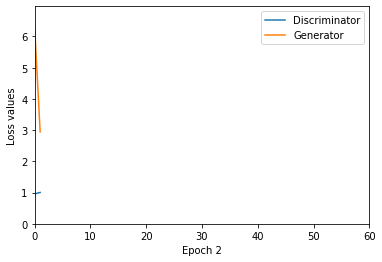

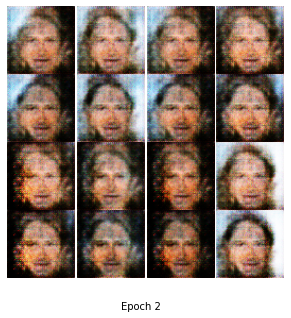

Epoch [3/60], Step [1/686], D_loss: 1.4043, G_loss: 2.6388
Epoch [3/60], Step [2/686], D_loss: 0.8458, G_loss: 2.7693
Epoch [3/60], Step [3/686], D_loss: 0.3767, G_loss: 0.9072
Epoch [3/60], Step [4/686], D_loss: 0.7931, G_loss: 1.1620
Epoch [3/60], Step [5/686], D_loss: 0.7509, G_loss: 1.0642
Epoch [3/60], Step [6/686], D_loss: 0.8891, G_loss: 2.0303
Epoch [3/60], Step [7/686], D_loss: 1.0622, G_loss: 1.5247
Epoch [3/60], Step [8/686], D_loss: 2.9485, G_loss: 4.4955
Epoch [3/60], Step [9/686], D_loss: 1.4447, G_loss: 1.5792
Epoch [3/60], Step [10/686], D_loss: 0.7459, G_loss: 1.6452
Epoch [3/60], Step [11/686], D_loss: 0.6207, G_loss: 1.4300
Epoch [3/60], Step [12/686], D_loss: 1.0704, G_loss: 3.3984
Epoch [3/60], Step [13/686], D_loss: 1.5057, G_loss: 0.7849
Epoch [3/60], Step [14/686], D_loss: 0.9572, G_loss: 2.6264
Epoch [3/60], Step [15/686], D_loss: 0.6628, G_loss: 2.2027
Epoch [3/60], Step [16/686], D_loss: 0.7151, G_loss: 1.9723
Epoch [3/60], Step [17/686], D_loss: 0.8226, G_lo

Epoch [3/60], Step [138/686], D_loss: 0.7583, G_loss: 1.8924
Epoch [3/60], Step [139/686], D_loss: 1.0245, G_loss: 2.2814
Epoch [3/60], Step [140/686], D_loss: 0.6650, G_loss: 2.2250
Epoch [3/60], Step [141/686], D_loss: 1.2749, G_loss: 4.3072
Epoch [3/60], Step [142/686], D_loss: 1.6742, G_loss: 1.5003
Epoch [3/60], Step [143/686], D_loss: 0.5182, G_loss: 1.1513
Epoch [3/60], Step [144/686], D_loss: 0.9567, G_loss: 1.8210
Epoch [3/60], Step [145/686], D_loss: 0.9469, G_loss: 2.3648
Epoch [3/60], Step [146/686], D_loss: 0.4924, G_loss: 2.0926
Epoch [3/60], Step [147/686], D_loss: 1.5050, G_loss: 2.1826
Epoch [3/60], Step [148/686], D_loss: 1.0970, G_loss: 2.2007
Epoch [3/60], Step [149/686], D_loss: 0.7427, G_loss: 2.8928
Epoch [3/60], Step [150/686], D_loss: 0.6181, G_loss: 2.2045
Epoch [3/60], Step [151/686], D_loss: 0.7150, G_loss: 1.1966
Epoch [3/60], Step [152/686], D_loss: 1.1747, G_loss: 3.3043
Epoch [3/60], Step [153/686], D_loss: 1.1930, G_loss: 1.4234
Epoch [3/60], Step [154/

Epoch [3/60], Step [273/686], D_loss: 0.6975, G_loss: 1.3704
Epoch [3/60], Step [274/686], D_loss: 1.3191, G_loss: 4.8426
Epoch [3/60], Step [275/686], D_loss: 2.8731, G_loss: 1.7175
Epoch [3/60], Step [276/686], D_loss: 0.9505, G_loss: 1.3096
Epoch [3/60], Step [277/686], D_loss: 1.6179, G_loss: 3.0048
Epoch [3/60], Step [278/686], D_loss: 1.2294, G_loss: 2.0094
Epoch [3/60], Step [279/686], D_loss: 1.2995, G_loss: 2.8227
Epoch [3/60], Step [280/686], D_loss: 0.9672, G_loss: 1.4449
Epoch [3/60], Step [281/686], D_loss: 1.7031, G_loss: 5.1344
Epoch [3/60], Step [282/686], D_loss: 1.3616, G_loss: 2.8639
Epoch [3/60], Step [283/686], D_loss: 0.8582, G_loss: 1.0119
Epoch [3/60], Step [284/686], D_loss: 1.1056, G_loss: 2.7385
Epoch [3/60], Step [285/686], D_loss: 0.3953, G_loss: 3.7571
Epoch [3/60], Step [286/686], D_loss: 1.2301, G_loss: 1.6979
Epoch [3/60], Step [287/686], D_loss: 0.6786, G_loss: 1.2924
Epoch [3/60], Step [288/686], D_loss: 1.3368, G_loss: 4.6849
Epoch [3/60], Step [289/

Epoch [3/60], Step [408/686], D_loss: 0.7713, G_loss: 0.2494
Epoch [3/60], Step [409/686], D_loss: 1.5816, G_loss: 5.1271
Epoch [3/60], Step [410/686], D_loss: 0.5753, G_loss: 4.2643
Epoch [3/60], Step [411/686], D_loss: 1.7451, G_loss: 1.5418
Epoch [3/60], Step [412/686], D_loss: 1.4983, G_loss: 3.2592
Epoch [3/60], Step [413/686], D_loss: 0.9730, G_loss: 2.0953
Epoch [3/60], Step [414/686], D_loss: 0.3586, G_loss: 3.2189
Epoch [3/60], Step [415/686], D_loss: 1.3048, G_loss: 1.6420
Epoch [3/60], Step [416/686], D_loss: 1.0466, G_loss: 4.4294
Epoch [3/60], Step [417/686], D_loss: 0.9512, G_loss: 3.5840
Epoch [3/60], Step [418/686], D_loss: 0.9313, G_loss: 1.5081
Epoch [3/60], Step [419/686], D_loss: 1.8985, G_loss: 3.2574
Epoch [3/60], Step [420/686], D_loss: 0.7773, G_loss: 3.4553
Epoch [3/60], Step [421/686], D_loss: 0.5281, G_loss: 2.1901
Epoch [3/60], Step [422/686], D_loss: 1.0914, G_loss: 1.9299
Epoch [3/60], Step [423/686], D_loss: 0.9925, G_loss: 0.5970
Epoch [3/60], Step [424/

Epoch [3/60], Step [543/686], D_loss: 0.7077, G_loss: 2.0538
Epoch [3/60], Step [544/686], D_loss: 0.7666, G_loss: 1.4341
Epoch [3/60], Step [545/686], D_loss: 1.2856, G_loss: 5.0864
Epoch [3/60], Step [546/686], D_loss: 2.7126, G_loss: 1.0792
Epoch [3/60], Step [547/686], D_loss: 1.8188, G_loss: 3.5942
Epoch [3/60], Step [548/686], D_loss: 0.5898, G_loss: 3.5214
Epoch [3/60], Step [549/686], D_loss: 1.0261, G_loss: 1.3396
Epoch [3/60], Step [550/686], D_loss: 1.4326, G_loss: 3.4358
Epoch [3/60], Step [551/686], D_loss: 1.1864, G_loss: 2.3368
Epoch [3/60], Step [552/686], D_loss: 0.9475, G_loss: 1.1015
Epoch [3/60], Step [553/686], D_loss: 1.0483, G_loss: 2.6107
Epoch [3/60], Step [554/686], D_loss: 0.9971, G_loss: 2.4729
Epoch [3/60], Step [555/686], D_loss: 0.8103, G_loss: 1.6340
Epoch [3/60], Step [556/686], D_loss: 0.9776, G_loss: 2.9457
Epoch [3/60], Step [557/686], D_loss: 0.5443, G_loss: 1.6730
Epoch [3/60], Step [558/686], D_loss: 0.7948, G_loss: 2.0641
Epoch [3/60], Step [559/

Epoch [3/60], Step [678/686], D_loss: 1.0571, G_loss: 2.8807
Epoch [3/60], Step [679/686], D_loss: 1.8819, G_loss: 5.9886
Epoch [3/60], Step [680/686], D_loss: 2.5308, G_loss: 1.6170
Epoch [3/60], Step [681/686], D_loss: 0.8773, G_loss: 2.4164
Epoch [3/60], Step [682/686], D_loss: 1.2806, G_loss: 1.2567
Epoch [3/60], Step [683/686], D_loss: 0.3119, G_loss: 0.9993
Epoch [3/60], Step [684/686], D_loss: 0.8638, G_loss: 3.2734
Epoch [3/60], Step [685/686], D_loss: 0.7014, G_loss: 4.9977
Epoch [3/60], Step [686/686], D_loss: 1.7613, G_loss: 0.3878


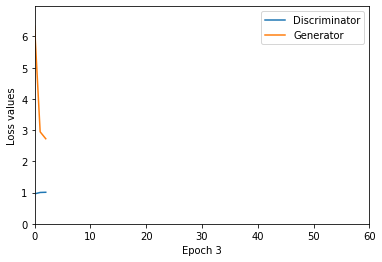

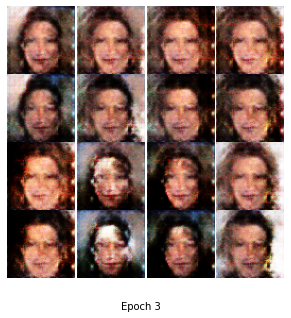

Epoch [4/60], Step [1/686], D_loss: 1.7419, G_loss: 5.0961
Epoch [4/60], Step [2/686], D_loss: 1.0151, G_loss: 3.6777
Epoch [4/60], Step [3/686], D_loss: 0.3472, G_loss: 0.5571
Epoch [4/60], Step [4/686], D_loss: 0.8904, G_loss: 0.6610
Epoch [4/60], Step [5/686], D_loss: 0.7448, G_loss: 2.9549
Epoch [4/60], Step [6/686], D_loss: 0.8664, G_loss: 5.0246
Epoch [4/60], Step [7/686], D_loss: 1.7842, G_loss: 0.2271
Epoch [4/60], Step [8/686], D_loss: 1.9313, G_loss: 2.0945
Epoch [4/60], Step [9/686], D_loss: 0.6613, G_loss: 1.3790
Epoch [4/60], Step [10/686], D_loss: 0.5306, G_loss: 1.3330
Epoch [4/60], Step [11/686], D_loss: 1.0399, G_loss: 4.3925
Epoch [4/60], Step [12/686], D_loss: 0.3968, G_loss: 1.7278
Epoch [4/60], Step [13/686], D_loss: 0.7554, G_loss: 0.6176
Epoch [4/60], Step [14/686], D_loss: 0.3828, G_loss: 0.8886
Epoch [4/60], Step [15/686], D_loss: 0.6284, G_loss: 4.3103
Epoch [4/60], Step [16/686], D_loss: 0.9592, G_loss: 1.1621
Epoch [4/60], Step [17/686], D_loss: 0.7848, G_lo

Epoch [4/60], Step [138/686], D_loss: 0.9428, G_loss: 2.3427
Epoch [4/60], Step [139/686], D_loss: 0.7059, G_loss: 1.1234
Epoch [4/60], Step [140/686], D_loss: 0.7691, G_loss: 2.5229
Epoch [4/60], Step [141/686], D_loss: 0.5283, G_loss: 2.0700
Epoch [4/60], Step [142/686], D_loss: 0.9771, G_loss: 2.4416
Epoch [4/60], Step [143/686], D_loss: 0.7524, G_loss: 2.6025
Epoch [4/60], Step [144/686], D_loss: 0.8256, G_loss: 2.2603
Epoch [4/60], Step [145/686], D_loss: 0.8184, G_loss: 1.5356
Epoch [4/60], Step [146/686], D_loss: 0.6981, G_loss: 4.1737
Epoch [4/60], Step [147/686], D_loss: 1.7162, G_loss: 1.2090
Epoch [4/60], Step [148/686], D_loss: 1.2168, G_loss: 2.8737
Epoch [4/60], Step [149/686], D_loss: 0.6729, G_loss: 4.3958
Epoch [4/60], Step [150/686], D_loss: 0.4322, G_loss: 2.4012
Epoch [4/60], Step [151/686], D_loss: 0.7060, G_loss: 2.9600
Epoch [4/60], Step [152/686], D_loss: 0.9343, G_loss: 0.8140
Epoch [4/60], Step [153/686], D_loss: 0.5323, G_loss: 1.2442
Epoch [4/60], Step [154/

Epoch [4/60], Step [273/686], D_loss: 0.4946, G_loss: 1.2615
Epoch [4/60], Step [274/686], D_loss: 0.8138, G_loss: 3.3813
Epoch [4/60], Step [275/686], D_loss: 1.7818, G_loss: 3.3969
Epoch [4/60], Step [276/686], D_loss: 1.0508, G_loss: 2.5021
Epoch [4/60], Step [277/686], D_loss: 1.2592, G_loss: 0.2191
Epoch [4/60], Step [278/686], D_loss: 1.7886, G_loss: 3.0080
Epoch [4/60], Step [279/686], D_loss: 1.0303, G_loss: 2.9722
Epoch [4/60], Step [280/686], D_loss: 1.1329, G_loss: 1.1158
Epoch [4/60], Step [281/686], D_loss: 0.9851, G_loss: 3.9543
Epoch [4/60], Step [282/686], D_loss: 0.6642, G_loss: 4.6428
Epoch [4/60], Step [283/686], D_loss: 1.3994, G_loss: 0.7790
Epoch [4/60], Step [284/686], D_loss: 1.0442, G_loss: 1.7377
Epoch [4/60], Step [285/686], D_loss: 0.4030, G_loss: 2.5212
Epoch [4/60], Step [286/686], D_loss: 0.7642, G_loss: 0.8537
Epoch [4/60], Step [287/686], D_loss: 0.8498, G_loss: 1.4778
Epoch [4/60], Step [288/686], D_loss: 1.5409, G_loss: 3.4892
Epoch [4/60], Step [289/

Epoch [4/60], Step [408/686], D_loss: 0.7479, G_loss: 1.3444
Epoch [4/60], Step [409/686], D_loss: 0.4896, G_loss: 3.1105
Epoch [4/60], Step [410/686], D_loss: 0.4141, G_loss: 2.0077
Epoch [4/60], Step [411/686], D_loss: 1.6786, G_loss: 0.2445
Epoch [4/60], Step [412/686], D_loss: 3.5465, G_loss: 5.1629
Epoch [4/60], Step [413/686], D_loss: 2.3517, G_loss: 2.4476
Epoch [4/60], Step [414/686], D_loss: 0.1863, G_loss: 1.3065
Epoch [4/60], Step [415/686], D_loss: 1.3040, G_loss: 3.7585
Epoch [4/60], Step [416/686], D_loss: 0.4226, G_loss: 3.7227
Epoch [4/60], Step [417/686], D_loss: 0.6301, G_loss: 2.5493
Epoch [4/60], Step [418/686], D_loss: 0.9128, G_loss: 1.2056
Epoch [4/60], Step [419/686], D_loss: 1.2984, G_loss: 1.2029
Epoch [4/60], Step [420/686], D_loss: 0.6119, G_loss: 1.5138
Epoch [4/60], Step [421/686], D_loss: 0.8280, G_loss: 4.3060
Epoch [4/60], Step [422/686], D_loss: 1.0513, G_loss: 2.3057
Epoch [4/60], Step [423/686], D_loss: 1.1245, G_loss: 0.4499
Epoch [4/60], Step [424/

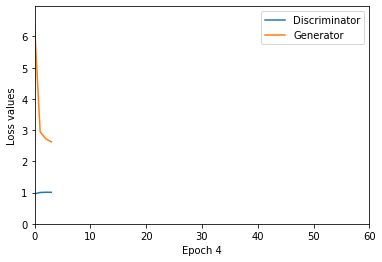

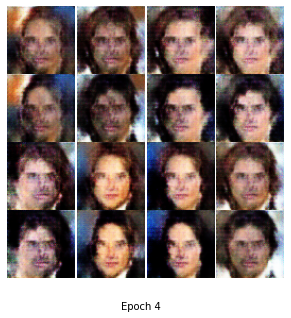

Epoch [5/60], Step [1/686], D_loss: 0.4445, G_loss: 2.8625
Epoch [5/60], Step [2/686], D_loss: 0.4281, G_loss: 1.0444
Epoch [5/60], Step [3/686], D_loss: 0.6648, G_loss: 3.3348
Epoch [5/60], Step [4/686], D_loss: 2.0275, G_loss: 1.0574
Epoch [5/60], Step [5/686], D_loss: 0.9113, G_loss: 2.8845
Epoch [5/60], Step [6/686], D_loss: 0.8403, G_loss: 4.9187
Epoch [5/60], Step [7/686], D_loss: 1.9420, G_loss: 0.7810
Epoch [5/60], Step [8/686], D_loss: 0.3117, G_loss: 0.0745
Epoch [5/60], Step [9/686], D_loss: 1.1060, G_loss: 3.9921
Epoch [5/60], Step [10/686], D_loss: 1.0765, G_loss: 1.4280
Epoch [5/60], Step [11/686], D_loss: 0.6932, G_loss: 2.3240
Epoch [5/60], Step [12/686], D_loss: 1.3583, G_loss: 5.8493
Epoch [5/60], Step [13/686], D_loss: 1.9839, G_loss: 2.7234
Epoch [5/60], Step [14/686], D_loss: 0.5097, G_loss: 1.3007
Epoch [5/60], Step [15/686], D_loss: 1.1402, G_loss: 3.9476
Epoch [5/60], Step [16/686], D_loss: 1.3669, G_loss: 2.0234
Epoch [5/60], Step [17/686], D_loss: 0.4296, G_lo

Epoch [5/60], Step [138/686], D_loss: 0.8263, G_loss: 3.3025
Epoch [5/60], Step [139/686], D_loss: 0.9633, G_loss: 0.9288
Epoch [5/60], Step [140/686], D_loss: 2.1010, G_loss: 3.3932
Epoch [5/60], Step [141/686], D_loss: 1.2834, G_loss: 1.9971
Epoch [5/60], Step [142/686], D_loss: 0.7584, G_loss: 0.6491
Epoch [5/60], Step [143/686], D_loss: 2.7483, G_loss: 5.3199
Epoch [5/60], Step [144/686], D_loss: 1.7957, G_loss: 2.6306
Epoch [5/60], Step [145/686], D_loss: 0.8443, G_loss: 0.8872
Epoch [5/60], Step [146/686], D_loss: 0.6771, G_loss: 1.8921
Epoch [5/60], Step [147/686], D_loss: 0.7468, G_loss: 3.3393
Epoch [5/60], Step [148/686], D_loss: 0.8705, G_loss: 2.3860
Epoch [5/60], Step [149/686], D_loss: 0.3577, G_loss: 1.5213
Epoch [5/60], Step [150/686], D_loss: 0.8721, G_loss: 2.5685
Epoch [5/60], Step [151/686], D_loss: 0.6702, G_loss: 3.3159
Epoch [5/60], Step [152/686], D_loss: 0.9393, G_loss: 0.6592
Epoch [5/60], Step [153/686], D_loss: 1.7581, G_loss: 4.9618
Epoch [5/60], Step [154/

Epoch [5/60], Step [273/686], D_loss: 0.5752, G_loss: 1.1647
Epoch [5/60], Step [274/686], D_loss: 0.6566, G_loss: 2.9261
Epoch [5/60], Step [275/686], D_loss: 1.4047, G_loss: 0.4446
Epoch [5/60], Step [276/686], D_loss: 2.1035, G_loss: 3.4529
Epoch [5/60], Step [277/686], D_loss: 2.1079, G_loss: 1.7000
Epoch [5/60], Step [278/686], D_loss: 0.9938, G_loss: 1.0487
Epoch [5/60], Step [279/686], D_loss: 0.9035, G_loss: 0.6285
Epoch [5/60], Step [280/686], D_loss: 1.1514, G_loss: 3.2683
Epoch [5/60], Step [281/686], D_loss: 0.7075, G_loss: 2.9261
Epoch [5/60], Step [282/686], D_loss: 0.2818, G_loss: 2.6609
Epoch [5/60], Step [283/686], D_loss: 0.4101, G_loss: 2.5410
Epoch [5/60], Step [284/686], D_loss: 0.5759, G_loss: 1.3961
Epoch [5/60], Step [285/686], D_loss: 0.1714, G_loss: 2.7250
Epoch [5/60], Step [286/686], D_loss: 0.8913, G_loss: 2.0101
Epoch [5/60], Step [287/686], D_loss: 1.0329, G_loss: 1.2139
Epoch [5/60], Step [288/686], D_loss: 1.3659, G_loss: 0.5356
Epoch [5/60], Step [289/

Epoch [5/60], Step [408/686], D_loss: 1.3014, G_loss: 2.2447
Epoch [5/60], Step [409/686], D_loss: 0.1665, G_loss: 2.6144
Epoch [5/60], Step [410/686], D_loss: 0.3613, G_loss: 1.3821
Epoch [5/60], Step [411/686], D_loss: 1.7766, G_loss: 1.3168
Epoch [5/60], Step [412/686], D_loss: 1.2835, G_loss: 1.2772
Epoch [5/60], Step [413/686], D_loss: 1.5830, G_loss: 0.2919
Epoch [5/60], Step [414/686], D_loss: 0.6140, G_loss: 1.7810
Epoch [5/60], Step [415/686], D_loss: 1.3136, G_loss: 4.1108
Epoch [5/60], Step [416/686], D_loss: 0.6992, G_loss: 4.7752
Epoch [5/60], Step [417/686], D_loss: 0.9706, G_loss: 3.1694
Epoch [5/60], Step [418/686], D_loss: 0.7078, G_loss: 1.1608
Epoch [5/60], Step [419/686], D_loss: 1.7834, G_loss: 2.9454
Epoch [5/60], Step [420/686], D_loss: 1.0437, G_loss: 4.6078
Epoch [5/60], Step [421/686], D_loss: 0.6730, G_loss: 2.9612
Epoch [5/60], Step [422/686], D_loss: 0.6628, G_loss: 1.4831
Epoch [5/60], Step [423/686], D_loss: 2.1559, G_loss: 4.2352
Epoch [5/60], Step [424/

Epoch [5/60], Step [543/686], D_loss: 0.7147, G_loss: 3.0446
Epoch [5/60], Step [544/686], D_loss: 1.4191, G_loss: 4.4887
Epoch [5/60], Step [545/686], D_loss: 0.5547, G_loss: 4.4423
Epoch [5/60], Step [546/686], D_loss: 1.2938, G_loss: 0.2333
Epoch [5/60], Step [547/686], D_loss: 2.5964, G_loss: 2.9491
Epoch [5/60], Step [548/686], D_loss: 0.2890, G_loss: 3.1760
Epoch [5/60], Step [549/686], D_loss: 1.1951, G_loss: 0.8828
Epoch [5/60], Step [550/686], D_loss: 0.9905, G_loss: 2.9570
Epoch [5/60], Step [551/686], D_loss: 1.1694, G_loss: 2.5911
Epoch [5/60], Step [552/686], D_loss: 1.2086, G_loss: 0.5799
Epoch [5/60], Step [553/686], D_loss: 1.3117, G_loss: 2.3193
Epoch [5/60], Step [554/686], D_loss: 0.9020, G_loss: 1.6322
Epoch [5/60], Step [555/686], D_loss: 1.7168, G_loss: 3.7234
Epoch [5/60], Step [556/686], D_loss: 1.3224, G_loss: 1.5542
Epoch [5/60], Step [557/686], D_loss: 0.9402, G_loss: 2.2093
Epoch [5/60], Step [558/686], D_loss: 0.8081, G_loss: 2.2582
Epoch [5/60], Step [559/

Epoch [5/60], Step [678/686], D_loss: 0.7889, G_loss: 2.4769
Epoch [5/60], Step [679/686], D_loss: 1.0824, G_loss: 7.8073
Epoch [5/60], Step [680/686], D_loss: 3.2559, G_loss: 3.7785
Epoch [5/60], Step [681/686], D_loss: 0.7155, G_loss: 3.6913
Epoch [5/60], Step [682/686], D_loss: 1.4213, G_loss: 4.7475
Epoch [5/60], Step [683/686], D_loss: 0.7964, G_loss: 5.7651
Epoch [5/60], Step [684/686], D_loss: 0.9884, G_loss: 0.4428
Epoch [5/60], Step [685/686], D_loss: 1.6878, G_loss: 5.5592
Epoch [5/60], Step [686/686], D_loss: 1.3128, G_loss: 2.6391


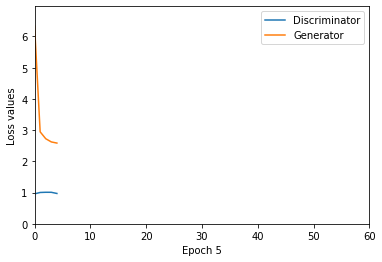

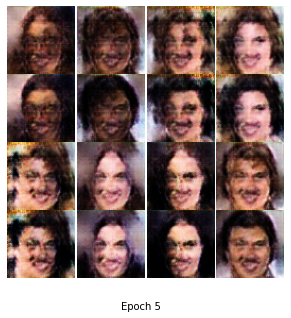

Epoch [6/60], Step [1/686], D_loss: 0.4290, G_loss: 1.9588
Epoch [6/60], Step [2/686], D_loss: 0.6038, G_loss: 1.8068
Epoch [6/60], Step [3/686], D_loss: 0.3310, G_loss: 2.7185
Epoch [6/60], Step [4/686], D_loss: 1.1548, G_loss: 2.4740
Epoch [6/60], Step [5/686], D_loss: 1.1696, G_loss: 4.0498
Epoch [6/60], Step [6/686], D_loss: 0.4721, G_loss: 1.4037
Epoch [6/60], Step [7/686], D_loss: 0.7410, G_loss: 1.8974
Epoch [6/60], Step [8/686], D_loss: 0.6695, G_loss: 1.8381
Epoch [6/60], Step [9/686], D_loss: 0.5786, G_loss: 1.8178
Epoch [6/60], Step [10/686], D_loss: 0.4676, G_loss: 1.0716
Epoch [6/60], Step [11/686], D_loss: 0.4410, G_loss: 0.9843
Epoch [6/60], Step [12/686], D_loss: 0.9085, G_loss: 1.7350
Epoch [6/60], Step [13/686], D_loss: 1.5176, G_loss: 1.0743
Epoch [6/60], Step [14/686], D_loss: 0.7833, G_loss: 4.0779
Epoch [6/60], Step [15/686], D_loss: 0.4214, G_loss: 2.1073
Epoch [6/60], Step [16/686], D_loss: 0.6596, G_loss: 2.0013
Epoch [6/60], Step [17/686], D_loss: 0.4370, G_lo

Epoch [6/60], Step [138/686], D_loss: 1.0778, G_loss: 1.2874
Epoch [6/60], Step [139/686], D_loss: 0.7742, G_loss: 1.8254
Epoch [6/60], Step [140/686], D_loss: 1.0506, G_loss: 2.0328
Epoch [6/60], Step [141/686], D_loss: 0.4902, G_loss: 1.2006
Epoch [6/60], Step [142/686], D_loss: 0.5976, G_loss: 0.6421
Epoch [6/60], Step [143/686], D_loss: 0.4242, G_loss: 1.8240
Epoch [6/60], Step [144/686], D_loss: 0.9240, G_loss: 2.5897
Epoch [6/60], Step [145/686], D_loss: 0.6437, G_loss: 1.3792
Epoch [6/60], Step [146/686], D_loss: 0.1475, G_loss: 1.0923
Epoch [6/60], Step [147/686], D_loss: 0.8080, G_loss: 1.7491
Epoch [6/60], Step [148/686], D_loss: 0.4076, G_loss: 1.1160
Epoch [6/60], Step [149/686], D_loss: 0.4135, G_loss: 0.7744
Epoch [6/60], Step [150/686], D_loss: 0.2981, G_loss: 1.4165
Epoch [6/60], Step [151/686], D_loss: 0.4562, G_loss: 0.4382
Epoch [6/60], Step [152/686], D_loss: 0.6281, G_loss: 1.4057
Epoch [6/60], Step [153/686], D_loss: 0.9496, G_loss: 3.0049
Epoch [6/60], Step [154/

Epoch [6/60], Step [273/686], D_loss: 0.5278, G_loss: 1.6431
Epoch [6/60], Step [274/686], D_loss: 0.7128, G_loss: 1.7796
Epoch [6/60], Step [275/686], D_loss: 1.0234, G_loss: 3.1844
Epoch [6/60], Step [276/686], D_loss: 0.2964, G_loss: 1.6117
Epoch [6/60], Step [277/686], D_loss: 2.2552, G_loss: 2.3733
Epoch [6/60], Step [278/686], D_loss: 0.6057, G_loss: 2.1623
Epoch [6/60], Step [279/686], D_loss: 0.9727, G_loss: 1.9250
Epoch [6/60], Step [280/686], D_loss: 1.0393, G_loss: 1.0490
Epoch [6/60], Step [281/686], D_loss: 0.3702, G_loss: 2.3056
Epoch [6/60], Step [282/686], D_loss: 0.1959, G_loss: 1.6266
Epoch [6/60], Step [283/686], D_loss: 0.6714, G_loss: 1.6673
Epoch [6/60], Step [284/686], D_loss: 0.4147, G_loss: 1.9027
Epoch [6/60], Step [285/686], D_loss: 0.2179, G_loss: 1.8706
Epoch [6/60], Step [286/686], D_loss: 0.4295, G_loss: 2.0925
Epoch [6/60], Step [287/686], D_loss: 0.7410, G_loss: 1.6196
Epoch [6/60], Step [288/686], D_loss: 0.8141, G_loss: 0.7748
Epoch [6/60], Step [289/

Epoch [6/60], Step [408/686], D_loss: 0.7368, G_loss: 2.6955
Epoch [6/60], Step [409/686], D_loss: 0.1163, G_loss: 0.9448
Epoch [6/60], Step [410/686], D_loss: 1.0977, G_loss: 2.1460
Epoch [6/60], Step [411/686], D_loss: 1.1068, G_loss: 2.5743
Epoch [6/60], Step [412/686], D_loss: 0.6202, G_loss: 0.9147
Epoch [6/60], Step [413/686], D_loss: 1.3906, G_loss: 1.5094
Epoch [6/60], Step [414/686], D_loss: 0.1840, G_loss: 0.8422
Epoch [6/60], Step [415/686], D_loss: 0.6317, G_loss: 1.0761
Epoch [6/60], Step [416/686], D_loss: 0.1777, G_loss: 2.7360
Epoch [6/60], Step [417/686], D_loss: 0.2821, G_loss: 1.6771
Epoch [6/60], Step [418/686], D_loss: 0.4512, G_loss: 0.9415
Epoch [6/60], Step [419/686], D_loss: 0.8088, G_loss: 2.2571
Epoch [6/60], Step [420/686], D_loss: 0.5743, G_loss: 2.2977
Epoch [6/60], Step [421/686], D_loss: 0.6090, G_loss: 3.4521
Epoch [6/60], Step [422/686], D_loss: 0.4375, G_loss: 2.9131
Epoch [6/60], Step [423/686], D_loss: 0.7320, G_loss: 2.0944
Epoch [6/60], Step [424/

Epoch [6/60], Step [543/686], D_loss: 0.3485, G_loss: 2.4250
Epoch [6/60], Step [544/686], D_loss: 0.4525, G_loss: 1.4662
Epoch [6/60], Step [545/686], D_loss: 0.5113, G_loss: 1.8573
Epoch [6/60], Step [546/686], D_loss: 1.4774, G_loss: 2.0713
Epoch [6/60], Step [547/686], D_loss: 0.7971, G_loss: 1.6036
Epoch [6/60], Step [548/686], D_loss: 0.5314, G_loss: 1.6780
Epoch [6/60], Step [549/686], D_loss: 0.8872, G_loss: 1.3038
Epoch [6/60], Step [550/686], D_loss: 0.6785, G_loss: 1.2531
Epoch [6/60], Step [551/686], D_loss: 0.9061, G_loss: 1.9216
Epoch [6/60], Step [552/686], D_loss: 0.7536, G_loss: 1.1503
Epoch [6/60], Step [553/686], D_loss: 0.3562, G_loss: 1.1617
Epoch [6/60], Step [554/686], D_loss: 1.0935, G_loss: 0.7732
Epoch [6/60], Step [555/686], D_loss: 0.7439, G_loss: 2.1261
Epoch [6/60], Step [556/686], D_loss: 0.7170, G_loss: 1.0907
Epoch [6/60], Step [557/686], D_loss: 0.6600, G_loss: 2.3606
Epoch [6/60], Step [558/686], D_loss: 0.7237, G_loss: 1.7494
Epoch [6/60], Step [559/

Epoch [6/60], Step [678/686], D_loss: 0.3157, G_loss: 1.5071
Epoch [6/60], Step [679/686], D_loss: 0.3964, G_loss: 1.4475
Epoch [6/60], Step [680/686], D_loss: 0.3680, G_loss: 1.9234
Epoch [6/60], Step [681/686], D_loss: 0.3621, G_loss: 1.8669
Epoch [6/60], Step [682/686], D_loss: 0.9592, G_loss: 3.6150
Epoch [6/60], Step [683/686], D_loss: 0.3070, G_loss: 2.2131
Epoch [6/60], Step [684/686], D_loss: 0.5854, G_loss: 2.3651
Epoch [6/60], Step [685/686], D_loss: 0.6483, G_loss: 3.4536
Epoch [6/60], Step [686/686], D_loss: 0.4214, G_loss: 4.0764


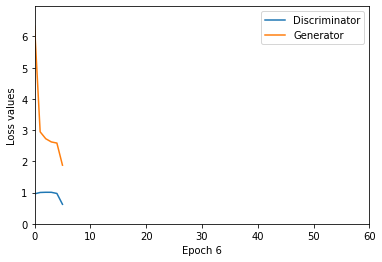

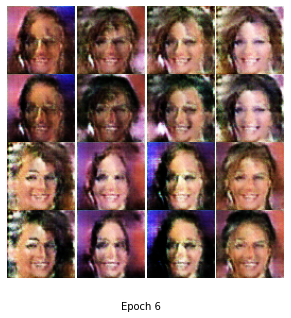

Epoch [7/60], Step [1/686], D_loss: 0.4686, G_loss: 1.2934
Epoch [7/60], Step [2/686], D_loss: 0.5282, G_loss: 2.1378
Epoch [7/60], Step [3/686], D_loss: 0.1925, G_loss: 3.8761
Epoch [7/60], Step [4/686], D_loss: 0.7594, G_loss: 2.4291
Epoch [7/60], Step [5/686], D_loss: 0.3488, G_loss: 1.8884
Epoch [7/60], Step [6/686], D_loss: 0.4319, G_loss: 2.6376
Epoch [7/60], Step [7/686], D_loss: 0.5533, G_loss: 2.1200
Epoch [7/60], Step [8/686], D_loss: 0.4509, G_loss: 2.1170
Epoch [7/60], Step [9/686], D_loss: 1.4804, G_loss: 2.6672
Epoch [7/60], Step [10/686], D_loss: 0.5154, G_loss: 2.2768
Epoch [7/60], Step [11/686], D_loss: 0.4034, G_loss: 1.7832
Epoch [7/60], Step [12/686], D_loss: 0.2416, G_loss: 2.9875
Epoch [7/60], Step [13/686], D_loss: 0.9856, G_loss: 3.4982
Epoch [7/60], Step [14/686], D_loss: 0.2488, G_loss: 1.6849
Epoch [7/60], Step [15/686], D_loss: 0.2873, G_loss: 2.8606
Epoch [7/60], Step [16/686], D_loss: 0.3482, G_loss: 2.2886
Epoch [7/60], Step [17/686], D_loss: 0.4098, G_lo

Epoch [7/60], Step [138/686], D_loss: 0.3330, G_loss: 1.8422
Epoch [7/60], Step [139/686], D_loss: 0.5579, G_loss: 1.8364
Epoch [7/60], Step [140/686], D_loss: 0.4194, G_loss: 2.6328
Epoch [7/60], Step [141/686], D_loss: 0.3806, G_loss: 2.9786
Epoch [7/60], Step [142/686], D_loss: 0.4130, G_loss: 2.4632
Epoch [7/60], Step [143/686], D_loss: 0.2352, G_loss: 2.1380
Epoch [7/60], Step [144/686], D_loss: 0.3559, G_loss: 1.9215
Epoch [7/60], Step [145/686], D_loss: 0.4572, G_loss: 1.7777
Epoch [7/60], Step [146/686], D_loss: 1.3594, G_loss: 4.1010
Epoch [7/60], Step [147/686], D_loss: 1.2559, G_loss: 3.6293
Epoch [7/60], Step [148/686], D_loss: 0.9405, G_loss: 2.0827
Epoch [7/60], Step [149/686], D_loss: 0.4403, G_loss: 1.8430
Epoch [7/60], Step [150/686], D_loss: 0.2104, G_loss: 1.5323
Epoch [7/60], Step [151/686], D_loss: 0.3382, G_loss: 2.2100
Epoch [7/60], Step [152/686], D_loss: 0.4155, G_loss: 2.2510
Epoch [7/60], Step [153/686], D_loss: 0.5589, G_loss: 2.4720
Epoch [7/60], Step [154/

Epoch [7/60], Step [273/686], D_loss: 0.4239, G_loss: 1.4640
Epoch [7/60], Step [274/686], D_loss: 0.4483, G_loss: 2.4841
Epoch [7/60], Step [275/686], D_loss: 0.9799, G_loss: 3.0889
Epoch [7/60], Step [276/686], D_loss: 0.6265, G_loss: 2.2436
Epoch [7/60], Step [277/686], D_loss: 0.9695, G_loss: 0.6950
Epoch [7/60], Step [278/686], D_loss: 0.5313, G_loss: 1.0585
Epoch [7/60], Step [279/686], D_loss: 0.8091, G_loss: 2.4100
Epoch [7/60], Step [280/686], D_loss: 0.6981, G_loss: 2.4058
Epoch [7/60], Step [281/686], D_loss: 0.3161, G_loss: 2.5962
Epoch [7/60], Step [282/686], D_loss: 0.1939, G_loss: 1.8811
Epoch [7/60], Step [283/686], D_loss: 0.3803, G_loss: 2.9155
Epoch [7/60], Step [284/686], D_loss: 0.5806, G_loss: 2.4567
Epoch [7/60], Step [285/686], D_loss: 0.2095, G_loss: 2.5416
Epoch [7/60], Step [286/686], D_loss: 0.6325, G_loss: 1.5201
Epoch [7/60], Step [287/686], D_loss: 0.5500, G_loss: 2.7972
Epoch [7/60], Step [288/686], D_loss: 0.4552, G_loss: 1.8078
Epoch [7/60], Step [289/

Epoch [7/60], Step [408/686], D_loss: 0.7074, G_loss: 2.2363
Epoch [7/60], Step [409/686], D_loss: 0.2537, G_loss: 2.2622
Epoch [7/60], Step [410/686], D_loss: 0.7628, G_loss: 2.4847
Epoch [7/60], Step [411/686], D_loss: 1.0565, G_loss: 3.0611
Epoch [7/60], Step [412/686], D_loss: 0.3951, G_loss: 1.9146
Epoch [7/60], Step [413/686], D_loss: 0.6428, G_loss: 1.1387
Epoch [7/60], Step [414/686], D_loss: 0.2794, G_loss: 1.2646
Epoch [7/60], Step [415/686], D_loss: 1.0308, G_loss: 3.3604
Epoch [7/60], Step [416/686], D_loss: 0.2863, G_loss: 2.9149
Epoch [7/60], Step [417/686], D_loss: 0.4255, G_loss: 2.9360
Epoch [7/60], Step [418/686], D_loss: 1.2638, G_loss: 3.2388
Epoch [7/60], Step [419/686], D_loss: 1.2144, G_loss: 1.9040
Epoch [7/60], Step [420/686], D_loss: 0.4359, G_loss: 1.1985
Epoch [7/60], Step [421/686], D_loss: 0.2580, G_loss: 1.6412
Epoch [7/60], Step [422/686], D_loss: 0.3603, G_loss: 1.3080
Epoch [7/60], Step [423/686], D_loss: 0.6662, G_loss: 1.7747
Epoch [7/60], Step [424/

Epoch [7/60], Step [543/686], D_loss: 1.2006, G_loss: 2.5534
Epoch [7/60], Step [544/686], D_loss: 0.7995, G_loss: 2.8634
Epoch [7/60], Step [545/686], D_loss: 0.2975, G_loss: 3.5667
Epoch [7/60], Step [546/686], D_loss: 1.1176, G_loss: 1.9756
Epoch [7/60], Step [547/686], D_loss: 0.6940, G_loss: 1.2925
Epoch [7/60], Step [548/686], D_loss: 0.5331, G_loss: 1.7885
Epoch [7/60], Step [549/686], D_loss: 0.5298, G_loss: 2.4146
Epoch [7/60], Step [550/686], D_loss: 0.9265, G_loss: 1.9394
Epoch [7/60], Step [551/686], D_loss: 0.7547, G_loss: 2.2665
Epoch [7/60], Step [552/686], D_loss: 0.7156, G_loss: 2.0775
Epoch [7/60], Step [553/686], D_loss: 0.6891, G_loss: 1.9344
Epoch [7/60], Step [554/686], D_loss: 0.6957, G_loss: 2.7618
Epoch [7/60], Step [555/686], D_loss: 0.6668, G_loss: 2.2512
Epoch [7/60], Step [556/686], D_loss: 0.5425, G_loss: 1.8268
Epoch [7/60], Step [557/686], D_loss: 0.3965, G_loss: 2.3185
Epoch [7/60], Step [558/686], D_loss: 0.6857, G_loss: 1.4829
Epoch [7/60], Step [559/

Epoch [7/60], Step [678/686], D_loss: 0.4118, G_loss: 2.2399
Epoch [7/60], Step [679/686], D_loss: 0.3892, G_loss: 2.2974
Epoch [7/60], Step [680/686], D_loss: 0.4268, G_loss: 2.1797
Epoch [7/60], Step [681/686], D_loss: 0.3588, G_loss: 3.7610
Epoch [7/60], Step [682/686], D_loss: 0.3993, G_loss: 2.1548
Epoch [7/60], Step [683/686], D_loss: 0.1818, G_loss: 2.7510
Epoch [7/60], Step [684/686], D_loss: 0.2603, G_loss: 2.3477
Epoch [7/60], Step [685/686], D_loss: 0.1607, G_loss: 1.8343
Epoch [7/60], Step [686/686], D_loss: 0.4340, G_loss: 3.0345


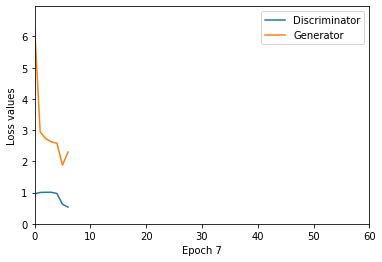

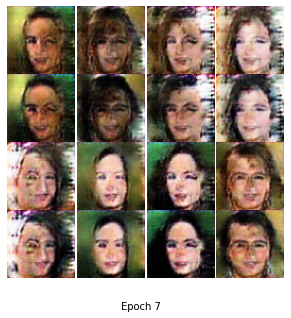

Epoch [8/60], Step [1/686], D_loss: 0.3316, G_loss: 2.4995
Epoch [8/60], Step [2/686], D_loss: 0.4471, G_loss: 2.5242
Epoch [8/60], Step [3/686], D_loss: 0.2732, G_loss: 3.6231
Epoch [8/60], Step [4/686], D_loss: 0.6328, G_loss: 2.8925
Epoch [8/60], Step [5/686], D_loss: 0.4624, G_loss: 2.3469
Epoch [8/60], Step [6/686], D_loss: 0.3688, G_loss: 2.5115
Epoch [8/60], Step [7/686], D_loss: 0.4920, G_loss: 2.4946
Epoch [8/60], Step [8/686], D_loss: 0.3995, G_loss: 1.3433
Epoch [8/60], Step [9/686], D_loss: 0.4441, G_loss: 1.8103
Epoch [8/60], Step [10/686], D_loss: 0.2583, G_loss: 2.4135
Epoch [8/60], Step [11/686], D_loss: 0.5117, G_loss: 3.1002
Epoch [8/60], Step [12/686], D_loss: 0.1956, G_loss: 3.9489
Epoch [8/60], Step [13/686], D_loss: 0.2996, G_loss: 1.8806
Epoch [8/60], Step [14/686], D_loss: 0.1343, G_loss: 2.5953
Epoch [8/60], Step [15/686], D_loss: 0.5925, G_loss: 3.6937
Epoch [8/60], Step [16/686], D_loss: 0.2090, G_loss: 2.8729
Epoch [8/60], Step [17/686], D_loss: 0.4354, G_lo

Epoch [8/60], Step [138/686], D_loss: 0.6413, G_loss: 2.7888
Epoch [8/60], Step [139/686], D_loss: 0.7149, G_loss: 2.2461
Epoch [8/60], Step [140/686], D_loss: 0.3485, G_loss: 1.3997
Epoch [8/60], Step [141/686], D_loss: 1.3457, G_loss: 3.7294
Epoch [8/60], Step [142/686], D_loss: 0.7413, G_loss: 3.3284
Epoch [8/60], Step [143/686], D_loss: 0.3145, G_loss: 3.1020
Epoch [8/60], Step [144/686], D_loss: 0.5500, G_loss: 2.9395
Epoch [8/60], Step [145/686], D_loss: 0.4097, G_loss: 1.3452
Epoch [8/60], Step [146/686], D_loss: 0.4495, G_loss: 2.0924
Epoch [8/60], Step [147/686], D_loss: 0.5626, G_loss: 3.0369
Epoch [8/60], Step [148/686], D_loss: 0.6044, G_loss: 1.7482
Epoch [8/60], Step [149/686], D_loss: 0.6109, G_loss: 2.4081
Epoch [8/60], Step [150/686], D_loss: 0.3430, G_loss: 3.1305
Epoch [8/60], Step [151/686], D_loss: 0.4126, G_loss: 3.7893
Epoch [8/60], Step [152/686], D_loss: 0.3969, G_loss: 2.9396
Epoch [8/60], Step [153/686], D_loss: 0.4604, G_loss: 1.0561
Epoch [8/60], Step [154/

Epoch [8/60], Step [273/686], D_loss: 0.2481, G_loss: 2.1731
Epoch [8/60], Step [274/686], D_loss: 0.4614, G_loss: 2.2468
Epoch [8/60], Step [275/686], D_loss: 0.6018, G_loss: 2.1312
Epoch [8/60], Step [276/686], D_loss: 0.5998, G_loss: 3.8805
Epoch [8/60], Step [277/686], D_loss: 1.5846, G_loss: 2.4205
Epoch [8/60], Step [278/686], D_loss: 0.5343, G_loss: 2.0524
Epoch [8/60], Step [279/686], D_loss: 0.3475, G_loss: 1.8497
Epoch [8/60], Step [280/686], D_loss: 0.3322, G_loss: 2.1301
Epoch [8/60], Step [281/686], D_loss: 0.2539, G_loss: 1.5088
Epoch [8/60], Step [282/686], D_loss: 0.5939, G_loss: 3.7772
Epoch [8/60], Step [283/686], D_loss: 0.3794, G_loss: 3.6795
Epoch [8/60], Step [284/686], D_loss: 0.3962, G_loss: 2.5651
Epoch [8/60], Step [285/686], D_loss: 0.2825, G_loss: 2.2535
Epoch [8/60], Step [286/686], D_loss: 0.6142, G_loss: 1.3563
Epoch [8/60], Step [287/686], D_loss: 1.0658, G_loss: 4.2760
Epoch [8/60], Step [288/686], D_loss: 0.8036, G_loss: 4.0268
Epoch [8/60], Step [289/

Epoch [8/60], Step [408/686], D_loss: 0.7411, G_loss: 2.1629
Epoch [8/60], Step [409/686], D_loss: 0.4954, G_loss: 3.2159
Epoch [8/60], Step [410/686], D_loss: 0.1544, G_loss: 2.4450
Epoch [8/60], Step [411/686], D_loss: 0.9586, G_loss: 2.3705
Epoch [8/60], Step [412/686], D_loss: 0.3614, G_loss: 1.9174
Epoch [8/60], Step [413/686], D_loss: 0.8616, G_loss: 3.1045
Epoch [8/60], Step [414/686], D_loss: 0.2380, G_loss: 3.1286
Epoch [8/60], Step [415/686], D_loss: 0.7179, G_loss: 1.4565
Epoch [8/60], Step [416/686], D_loss: 0.3135, G_loss: 2.6818
Epoch [8/60], Step [417/686], D_loss: 0.5179, G_loss: 2.1787
Epoch [8/60], Step [418/686], D_loss: 0.5463, G_loss: 3.2211
Epoch [8/60], Step [419/686], D_loss: 0.8379, G_loss: 2.1015
Epoch [8/60], Step [420/686], D_loss: 0.4120, G_loss: 2.5256
Epoch [8/60], Step [421/686], D_loss: 0.3638, G_loss: 3.6807
Epoch [8/60], Step [422/686], D_loss: 0.4222, G_loss: 2.9767
Epoch [8/60], Step [423/686], D_loss: 0.7033, G_loss: 2.0457
Epoch [8/60], Step [424/

Epoch [8/60], Step [543/686], D_loss: 0.5818, G_loss: 3.1306
Epoch [8/60], Step [544/686], D_loss: 0.2379, G_loss: 3.8875
Epoch [8/60], Step [545/686], D_loss: 0.1461, G_loss: 2.7449
Epoch [8/60], Step [546/686], D_loss: 0.6058, G_loss: 2.4400
Epoch [8/60], Step [547/686], D_loss: 0.7126, G_loss: 3.3427
Epoch [8/60], Step [548/686], D_loss: 0.3330, G_loss: 3.6213
Epoch [8/60], Step [549/686], D_loss: 0.5753, G_loss: 2.5007
Epoch [8/60], Step [550/686], D_loss: 0.4796, G_loss: 3.0986
Epoch [8/60], Step [551/686], D_loss: 0.4916, G_loss: 3.5483
Epoch [8/60], Step [552/686], D_loss: 0.3206, G_loss: 3.6138
Epoch [8/60], Step [553/686], D_loss: 0.3056, G_loss: 2.6985
Epoch [8/60], Step [554/686], D_loss: 0.1524, G_loss: 2.8121
Epoch [8/60], Step [555/686], D_loss: 0.5650, G_loss: 3.9883
Epoch [8/60], Step [556/686], D_loss: 0.4253, G_loss: 3.0092
Epoch [8/60], Step [557/686], D_loss: 0.3588, G_loss: 3.6333
Epoch [8/60], Step [558/686], D_loss: 0.4800, G_loss: 3.4854
Epoch [8/60], Step [559/

Epoch [8/60], Step [678/686], D_loss: 0.4642, G_loss: 2.9388
Epoch [8/60], Step [679/686], D_loss: 0.2605, G_loss: 1.9946
Epoch [8/60], Step [680/686], D_loss: 0.3396, G_loss: 3.1130
Epoch [8/60], Step [681/686], D_loss: 0.2548, G_loss: 4.0088
Epoch [8/60], Step [682/686], D_loss: 0.4381, G_loss: 4.3212
Epoch [8/60], Step [683/686], D_loss: 0.2476, G_loss: 1.7889
Epoch [8/60], Step [684/686], D_loss: 0.2367, G_loss: 1.5133
Epoch [8/60], Step [685/686], D_loss: 0.2719, G_loss: 2.5638
Epoch [8/60], Step [686/686], D_loss: 0.5079, G_loss: 4.6229


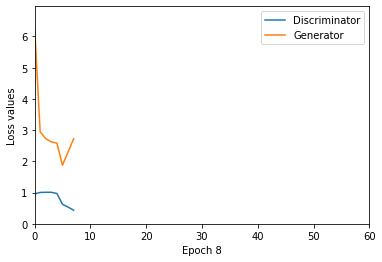

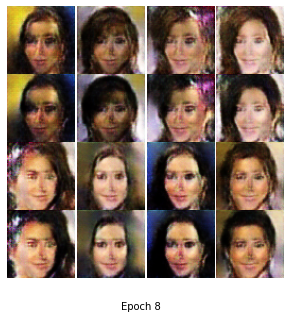

Epoch [9/60], Step [1/686], D_loss: 0.2494, G_loss: 1.4218
Epoch [9/60], Step [2/686], D_loss: 0.2695, G_loss: 2.8547
Epoch [9/60], Step [3/686], D_loss: 0.1375, G_loss: 1.8378
Epoch [9/60], Step [4/686], D_loss: 0.6245, G_loss: 2.5236
Epoch [9/60], Step [5/686], D_loss: 1.1055, G_loss: 5.0298
Epoch [9/60], Step [6/686], D_loss: 0.6684, G_loss: 5.0156
Epoch [9/60], Step [7/686], D_loss: 0.6154, G_loss: 1.6796
Epoch [9/60], Step [8/686], D_loss: 0.8463, G_loss: 4.1736
Epoch [9/60], Step [9/686], D_loss: 0.2608, G_loss: 4.4821
Epoch [9/60], Step [10/686], D_loss: 0.2888, G_loss: 4.3801
Epoch [9/60], Step [11/686], D_loss: 0.2750, G_loss: 2.4412
Epoch [9/60], Step [12/686], D_loss: 0.4698, G_loss: 2.8882
Epoch [9/60], Step [13/686], D_loss: 0.2869, G_loss: 2.1472
Epoch [9/60], Step [14/686], D_loss: 0.2872, G_loss: 3.1318
Epoch [9/60], Step [15/686], D_loss: 0.2270, G_loss: 1.9262
Epoch [9/60], Step [16/686], D_loss: 0.1794, G_loss: 2.0746
Epoch [9/60], Step [17/686], D_loss: 0.5905, G_lo

Epoch [9/60], Step [138/686], D_loss: 0.1798, G_loss: 4.5249
Epoch [9/60], Step [139/686], D_loss: 0.3411, G_loss: 3.8020
Epoch [9/60], Step [140/686], D_loss: 0.1862, G_loss: 1.7896
Epoch [9/60], Step [141/686], D_loss: 0.1708, G_loss: 1.7795
Epoch [9/60], Step [142/686], D_loss: 0.4599, G_loss: 4.1191
Epoch [9/60], Step [143/686], D_loss: 0.1738, G_loss: 4.6943
Epoch [9/60], Step [144/686], D_loss: 0.2797, G_loss: 2.8522
Epoch [9/60], Step [145/686], D_loss: 0.5545, G_loss: 3.0369
Epoch [9/60], Step [146/686], D_loss: 0.1900, G_loss: 3.9612
Epoch [9/60], Step [147/686], D_loss: 0.5651, G_loss: 2.5898
Epoch [9/60], Step [148/686], D_loss: 0.6831, G_loss: 3.2287
Epoch [9/60], Step [149/686], D_loss: 0.5743, G_loss: 5.3943
Epoch [9/60], Step [150/686], D_loss: 0.3379, G_loss: 5.4119
Epoch [9/60], Step [151/686], D_loss: 0.2626, G_loss: 3.6965
Epoch [9/60], Step [152/686], D_loss: 0.2490, G_loss: 2.9179
Epoch [9/60], Step [153/686], D_loss: 0.2234, G_loss: 2.2621
Epoch [9/60], Step [154/

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch [12/60], Step [587/686], D_loss: 0.1775, G_loss: 5.0547
Epoch [12/60], Step [588/686], D_loss: 0.3402, G_loss: 3.4463
Epoch [12/60], Step [589/686], D_loss: 0.1317, G_loss: 3.3650
Epoch [12/60], Step [590/686], D_loss: 0.1721, G_loss: 2.6537
Epoch [12/60], Step [591/686], D_loss: 0.2923, G_loss: 3.2577
Epoch [12/60], Step [592/686], D_loss: 0.1906, G_loss: 3.9558
Epoch [12/60], Step [593/686], D_loss: 0.1040, G_loss: 3.0444
Epoch [12/60], Step [594/686], D_loss: 0.3026, G_loss: 3.4578
Epoch [12/60], Step [595/686], D_loss: 0.0994, G_loss: 3.7224
Epoch [12/60], Step [596/686], D_loss: 0.1766, G_loss: 3.5965
Epoch [12/60], Step [597/686], D_loss: 0.2739, G_loss: 3.2357
Epoch [12/60], Step [598/686], D_loss: 0.2249, G_loss: 2.6373
Epoch [12/60], Step [599/686], D_loss: 0.1394, G_loss: 3.0358
Epoch [12/60], Step [600/686], D_loss: 0.1576, G_loss: 3.4468
Epoch [12/60], Step [601/686], D_loss: 0.1969, G_loss: 2.1583
Epoch [12/60], Step [602/686], D_loss: 0.1470, G_loss: 2.6525
Epoch [1

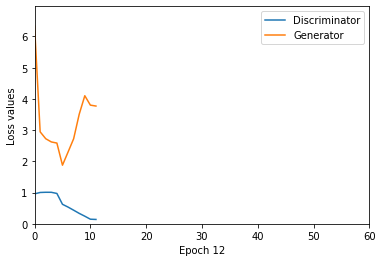

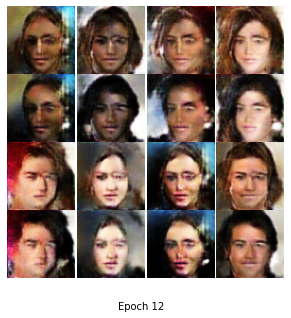

Epoch [13/60], Step [1/686], D_loss: 0.1528, G_loss: 4.0692
Epoch [13/60], Step [2/686], D_loss: 0.0641, G_loss: 4.1212
Epoch [13/60], Step [3/686], D_loss: 0.1294, G_loss: 4.9094
Epoch [13/60], Step [4/686], D_loss: 0.1606, G_loss: 3.9177
Epoch [13/60], Step [5/686], D_loss: 0.1905, G_loss: 3.0083
Epoch [13/60], Step [6/686], D_loss: 0.0993, G_loss: 3.9331
Epoch [13/60], Step [7/686], D_loss: 0.1366, G_loss: 3.2763
Epoch [13/60], Step [8/686], D_loss: 0.1710, G_loss: 3.3669
Epoch [13/60], Step [9/686], D_loss: 0.1003, G_loss: 3.7357
Epoch [13/60], Step [10/686], D_loss: 0.1219, G_loss: 3.8912
Epoch [13/60], Step [11/686], D_loss: 0.0953, G_loss: 3.1276
Epoch [13/60], Step [12/686], D_loss: 0.1703, G_loss: 2.4824
Epoch [13/60], Step [13/686], D_loss: 0.1740, G_loss: 3.8784
Epoch [13/60], Step [14/686], D_loss: 0.1961, G_loss: 3.8303
Epoch [13/60], Step [15/686], D_loss: 0.1177, G_loss: 4.6900
Epoch [13/60], Step [16/686], D_loss: 0.1878, G_loss: 4.1042
Epoch [13/60], Step [17/686], D_l

Epoch [13/60], Step [135/686], D_loss: 0.1366, G_loss: 3.5543
Epoch [13/60], Step [136/686], D_loss: 0.1552, G_loss: 2.7730
Epoch [13/60], Step [137/686], D_loss: 0.0724, G_loss: 2.3165
Epoch [13/60], Step [138/686], D_loss: 0.0973, G_loss: 3.7177
Epoch [13/60], Step [139/686], D_loss: 0.1677, G_loss: 3.1734
Epoch [13/60], Step [140/686], D_loss: 0.1200, G_loss: 4.4291
Epoch [13/60], Step [141/686], D_loss: 0.1643, G_loss: 4.0861
Epoch [13/60], Step [142/686], D_loss: 0.0740, G_loss: 3.4943
Epoch [13/60], Step [143/686], D_loss: 0.0362, G_loss: 2.6724
Epoch [13/60], Step [144/686], D_loss: 0.0999, G_loss: 4.1280
Epoch [13/60], Step [145/686], D_loss: 0.1073, G_loss: 5.2508
Epoch [13/60], Step [146/686], D_loss: 0.1319, G_loss: 3.9123
Epoch [13/60], Step [147/686], D_loss: 0.2570, G_loss: 4.0307
Epoch [13/60], Step [148/686], D_loss: 0.1041, G_loss: 5.0236
Epoch [13/60], Step [149/686], D_loss: 0.1498, G_loss: 4.1509
Epoch [13/60], Step [150/686], D_loss: 0.0864, G_loss: 3.2573
Epoch [1

Epoch [13/60], Step [268/686], D_loss: 0.0715, G_loss: 3.6872
Epoch [13/60], Step [269/686], D_loss: 0.2585, G_loss: 4.2307
Epoch [13/60], Step [270/686], D_loss: 0.2341, G_loss: 3.2998
Epoch [13/60], Step [271/686], D_loss: 0.1214, G_loss: 3.7926
Epoch [13/60], Step [272/686], D_loss: 0.1913, G_loss: 3.5807
Epoch [13/60], Step [273/686], D_loss: 0.1338, G_loss: 4.3961
Epoch [13/60], Step [274/686], D_loss: 0.0785, G_loss: 3.2528
Epoch [13/60], Step [275/686], D_loss: 0.1690, G_loss: 2.9271
Epoch [13/60], Step [276/686], D_loss: 0.0723, G_loss: 4.2334
Epoch [13/60], Step [277/686], D_loss: 0.2788, G_loss: 3.6368
Epoch [13/60], Step [278/686], D_loss: 0.0582, G_loss: 2.8680
Epoch [13/60], Step [279/686], D_loss: 0.0798, G_loss: 3.9683
Epoch [13/60], Step [280/686], D_loss: 0.1724, G_loss: 2.7457
Epoch [13/60], Step [281/686], D_loss: 0.1486, G_loss: 4.7512
Epoch [13/60], Step [282/686], D_loss: 0.0554, G_loss: 3.8997
Epoch [13/60], Step [283/686], D_loss: 0.1464, G_loss: 4.2968
Epoch [1

Epoch [13/60], Step [401/686], D_loss: 0.0924, G_loss: 3.5477
Epoch [13/60], Step [402/686], D_loss: 0.1534, G_loss: 4.8067
Epoch [13/60], Step [403/686], D_loss: 0.1193, G_loss: 3.3215
Epoch [13/60], Step [404/686], D_loss: 0.1303, G_loss: 4.3985
Epoch [13/60], Step [405/686], D_loss: 0.0960, G_loss: 4.2658
Epoch [13/60], Step [406/686], D_loss: 0.1080, G_loss: 4.4575
Epoch [13/60], Step [407/686], D_loss: 0.1195, G_loss: 4.8075
Epoch [13/60], Step [408/686], D_loss: 0.2099, G_loss: 4.9376
Epoch [13/60], Step [409/686], D_loss: 0.0466, G_loss: 4.2531
Epoch [13/60], Step [410/686], D_loss: 0.0473, G_loss: 3.3022
Epoch [13/60], Step [411/686], D_loss: 0.1403, G_loss: 4.6081
Epoch [13/60], Step [412/686], D_loss: 0.0969, G_loss: 3.7894
Epoch [13/60], Step [413/686], D_loss: 0.3580, G_loss: 3.1532
Epoch [13/60], Step [414/686], D_loss: 0.0936, G_loss: 3.9066
Epoch [13/60], Step [415/686], D_loss: 0.2412, G_loss: 2.6054
Epoch [13/60], Step [416/686], D_loss: 0.0532, G_loss: 4.3860
Epoch [1

Epoch [13/60], Step [534/686], D_loss: 0.1252, G_loss: 3.2545
Epoch [13/60], Step [535/686], D_loss: 0.1087, G_loss: 3.8426
Epoch [13/60], Step [536/686], D_loss: 0.1107, G_loss: 4.4762
Epoch [13/60], Step [537/686], D_loss: 0.1549, G_loss: 4.0963
Epoch [13/60], Step [538/686], D_loss: 0.2496, G_loss: 3.9697
Epoch [13/60], Step [539/686], D_loss: 0.0728, G_loss: 4.6051
Epoch [13/60], Step [540/686], D_loss: 0.0576, G_loss: 4.1597
Epoch [13/60], Step [541/686], D_loss: 0.1000, G_loss: 5.1666
Epoch [13/60], Step [542/686], D_loss: 0.2053, G_loss: 4.2276
Epoch [13/60], Step [543/686], D_loss: 0.1504, G_loss: 4.6103
Epoch [13/60], Step [544/686], D_loss: 0.1155, G_loss: 4.1434
Epoch [13/60], Step [545/686], D_loss: 0.0534, G_loss: 4.3277
Epoch [13/60], Step [546/686], D_loss: 0.2629, G_loss: 4.2868
Epoch [13/60], Step [547/686], D_loss: 0.2063, G_loss: 4.3459
Epoch [13/60], Step [548/686], D_loss: 0.1304, G_loss: 4.9928
Epoch [13/60], Step [549/686], D_loss: 0.2465, G_loss: 3.7864
Epoch [1

Epoch [13/60], Step [667/686], D_loss: 0.1519, G_loss: 2.8809
Epoch [13/60], Step [668/686], D_loss: 0.0693, G_loss: 3.0754
Epoch [13/60], Step [669/686], D_loss: 0.1343, G_loss: 4.2589
Epoch [13/60], Step [670/686], D_loss: 0.1085, G_loss: 3.9890
Epoch [13/60], Step [671/686], D_loss: 0.1143, G_loss: 3.3080
Epoch [13/60], Step [672/686], D_loss: 0.0959, G_loss: 3.7181
Epoch [13/60], Step [673/686], D_loss: 0.0793, G_loss: 4.3518
Epoch [13/60], Step [674/686], D_loss: 0.0852, G_loss: 3.9358
Epoch [13/60], Step [675/686], D_loss: 0.1244, G_loss: 4.5318
Epoch [13/60], Step [676/686], D_loss: 0.0898, G_loss: 4.1233
Epoch [13/60], Step [677/686], D_loss: 0.2519, G_loss: 4.2809
Epoch [13/60], Step [678/686], D_loss: 0.0974, G_loss: 3.1704
Epoch [13/60], Step [679/686], D_loss: 0.1042, G_loss: 4.5929
Epoch [13/60], Step [680/686], D_loss: 0.1259, G_loss: 3.9458
Epoch [13/60], Step [681/686], D_loss: 0.1223, G_loss: 3.6474
Epoch [13/60], Step [682/686], D_loss: 0.1359, G_loss: 3.9738
Epoch [1

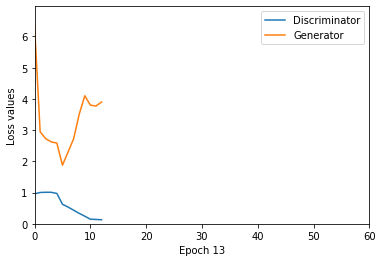

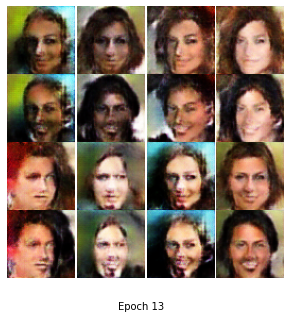

Epoch [14/60], Step [1/686], D_loss: 0.1572, G_loss: 4.0428
Epoch [14/60], Step [2/686], D_loss: 0.1467, G_loss: 3.7252
Epoch [14/60], Step [3/686], D_loss: 0.1895, G_loss: 4.3147
Epoch [14/60], Step [4/686], D_loss: 0.2408, G_loss: 4.2907
Epoch [14/60], Step [5/686], D_loss: 0.2249, G_loss: 3.7132
Epoch [14/60], Step [6/686], D_loss: 0.0853, G_loss: 2.8880
Epoch [14/60], Step [7/686], D_loss: 0.0861, G_loss: 4.5749
Epoch [14/60], Step [8/686], D_loss: 0.1235, G_loss: 3.3801
Epoch [14/60], Step [9/686], D_loss: 0.1254, G_loss: 2.9236
Epoch [14/60], Step [10/686], D_loss: 0.1351, G_loss: 2.7720
Epoch [14/60], Step [11/686], D_loss: 0.1541, G_loss: 3.3473
Epoch [14/60], Step [12/686], D_loss: 0.1258, G_loss: 3.9904
Epoch [14/60], Step [13/686], D_loss: 0.1045, G_loss: 3.0905
Epoch [14/60], Step [14/686], D_loss: 0.1068, G_loss: 3.5284
Epoch [14/60], Step [15/686], D_loss: 0.1447, G_loss: 3.3293
Epoch [14/60], Step [16/686], D_loss: 0.1116, G_loss: 4.7232
Epoch [14/60], Step [17/686], D_l

Epoch [14/60], Step [135/686], D_loss: 0.1026, G_loss: 3.3855
Epoch [14/60], Step [136/686], D_loss: 0.1059, G_loss: 3.4989
Epoch [14/60], Step [137/686], D_loss: 0.1664, G_loss: 4.2217
Epoch [14/60], Step [138/686], D_loss: 0.0881, G_loss: 3.8193
Epoch [14/60], Step [139/686], D_loss: 0.0915, G_loss: 3.2896
Epoch [14/60], Step [140/686], D_loss: 0.0789, G_loss: 3.4383
Epoch [14/60], Step [141/686], D_loss: 0.0813, G_loss: 3.7366
Epoch [14/60], Step [142/686], D_loss: 0.0958, G_loss: 3.9966
Epoch [14/60], Step [143/686], D_loss: 0.0480, G_loss: 3.7874
Epoch [14/60], Step [144/686], D_loss: 0.0885, G_loss: 5.6351
Epoch [14/60], Step [145/686], D_loss: 0.0587, G_loss: 3.0546
Epoch [14/60], Step [146/686], D_loss: 0.0760, G_loss: 2.9118
Epoch [14/60], Step [147/686], D_loss: 0.1240, G_loss: 4.0314
Epoch [14/60], Step [148/686], D_loss: 0.0934, G_loss: 4.0321
Epoch [14/60], Step [149/686], D_loss: 0.0817, G_loss: 3.9439
Epoch [14/60], Step [150/686], D_loss: 0.2293, G_loss: 3.4623
Epoch [1

Epoch [14/60], Step [268/686], D_loss: 0.0498, G_loss: 3.0787
Epoch [14/60], Step [269/686], D_loss: 0.3650, G_loss: 5.4526
Epoch [14/60], Step [270/686], D_loss: 0.0882, G_loss: 3.5844
Epoch [14/60], Step [271/686], D_loss: 0.0490, G_loss: 3.5806
Epoch [14/60], Step [272/686], D_loss: 0.2195, G_loss: 3.9815
Epoch [14/60], Step [273/686], D_loss: 0.1026, G_loss: 4.1612
Epoch [14/60], Step [274/686], D_loss: 0.0614, G_loss: 4.2767
Epoch [14/60], Step [275/686], D_loss: 0.1260, G_loss: 3.8605
Epoch [14/60], Step [276/686], D_loss: 0.0763, G_loss: 3.4225
Epoch [14/60], Step [277/686], D_loss: 0.3104, G_loss: 4.0352
Epoch [14/60], Step [278/686], D_loss: 0.1407, G_loss: 3.6531
Epoch [14/60], Step [279/686], D_loss: 0.1215, G_loss: 3.7423
Epoch [14/60], Step [280/686], D_loss: 0.0977, G_loss: 3.0779
Epoch [14/60], Step [281/686], D_loss: 0.1339, G_loss: 3.3938
Epoch [14/60], Step [282/686], D_loss: 0.0751, G_loss: 2.6652
Epoch [14/60], Step [283/686], D_loss: 0.2039, G_loss: 4.0959
Epoch [1

Epoch [14/60], Step [401/686], D_loss: 0.1375, G_loss: 4.6529
Epoch [14/60], Step [402/686], D_loss: 0.1302, G_loss: 3.6729
Epoch [14/60], Step [403/686], D_loss: 0.1982, G_loss: 3.8402
Epoch [14/60], Step [404/686], D_loss: 0.0749, G_loss: 3.5155
Epoch [14/60], Step [405/686], D_loss: 0.1415, G_loss: 3.5621
Epoch [14/60], Step [406/686], D_loss: 0.1155, G_loss: 3.8548
Epoch [14/60], Step [407/686], D_loss: 0.1947, G_loss: 2.9468
Epoch [14/60], Step [408/686], D_loss: 0.2599, G_loss: 3.3680
Epoch [14/60], Step [409/686], D_loss: 0.0870, G_loss: 3.0577
Epoch [14/60], Step [410/686], D_loss: 0.2244, G_loss: 3.7729
Epoch [14/60], Step [411/686], D_loss: 0.2563, G_loss: 4.2063
Epoch [14/60], Step [412/686], D_loss: 0.1758, G_loss: 4.1738
Epoch [14/60], Step [413/686], D_loss: 0.2678, G_loss: 3.7964
Epoch [14/60], Step [414/686], D_loss: 0.1065, G_loss: 4.0536
Epoch [14/60], Step [415/686], D_loss: 0.2543, G_loss: 3.6749
Epoch [14/60], Step [416/686], D_loss: 0.1243, G_loss: 3.8742
Epoch [1

Epoch [14/60], Step [534/686], D_loss: 0.0992, G_loss: 4.1677
Epoch [14/60], Step [535/686], D_loss: 0.1602, G_loss: 4.6498
Epoch [14/60], Step [536/686], D_loss: 0.0664, G_loss: 4.4184
Epoch [14/60], Step [537/686], D_loss: 0.1277, G_loss: 4.2919
Epoch [14/60], Step [538/686], D_loss: 0.0949, G_loss: 3.7880
Epoch [14/60], Step [539/686], D_loss: 0.0937, G_loss: 3.2990
Epoch [14/60], Step [540/686], D_loss: 0.1055, G_loss: 4.2744
Epoch [14/60], Step [541/686], D_loss: 0.0644, G_loss: 4.9123
Epoch [14/60], Step [542/686], D_loss: 0.1257, G_loss: 5.1481
Epoch [14/60], Step [543/686], D_loss: 0.0547, G_loss: 3.8517
Epoch [14/60], Step [544/686], D_loss: 0.0555, G_loss: 3.3053
Epoch [14/60], Step [545/686], D_loss: 0.1043, G_loss: 3.6471
Epoch [14/60], Step [546/686], D_loss: 0.1597, G_loss: 4.4852
Epoch [14/60], Step [547/686], D_loss: 0.1320, G_loss: 3.4221
Epoch [14/60], Step [548/686], D_loss: 0.0511, G_loss: 3.5586
Epoch [14/60], Step [549/686], D_loss: 0.1281, G_loss: 3.2859
Epoch [1

Epoch [14/60], Step [667/686], D_loss: 0.0541, G_loss: 4.1357
Epoch [14/60], Step [668/686], D_loss: 0.0795, G_loss: 4.4008
Epoch [14/60], Step [669/686], D_loss: 0.1229, G_loss: 3.8507
Epoch [14/60], Step [670/686], D_loss: 0.0726, G_loss: 4.3579
Epoch [14/60], Step [671/686], D_loss: 0.1422, G_loss: 3.9599
Epoch [14/60], Step [672/686], D_loss: 0.0932, G_loss: 4.5418
Epoch [14/60], Step [673/686], D_loss: 0.0788, G_loss: 3.9441
Epoch [14/60], Step [674/686], D_loss: 0.0542, G_loss: 4.1145
Epoch [14/60], Step [675/686], D_loss: 0.1034, G_loss: 4.7085
Epoch [14/60], Step [676/686], D_loss: 0.0636, G_loss: 5.2666
Epoch [14/60], Step [677/686], D_loss: 0.1470, G_loss: 3.8200
Epoch [14/60], Step [678/686], D_loss: 0.0934, G_loss: 4.4771
Epoch [14/60], Step [679/686], D_loss: 0.1792, G_loss: 4.9159
Epoch [14/60], Step [680/686], D_loss: 0.1033, G_loss: 4.7903
Epoch [14/60], Step [681/686], D_loss: 0.0791, G_loss: 4.0512
Epoch [14/60], Step [682/686], D_loss: 0.0801, G_loss: 3.9016
Epoch [1

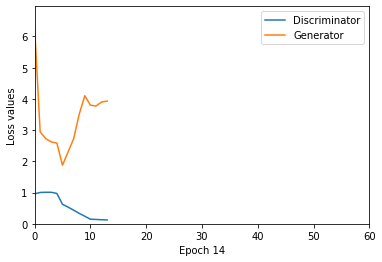

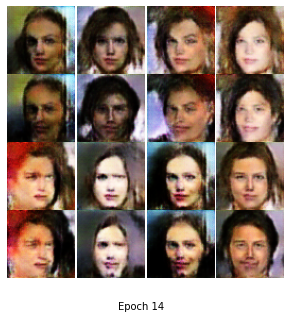

Epoch [15/60], Step [1/686], D_loss: 0.1177, G_loss: 3.2269
Epoch [15/60], Step [2/686], D_loss: 0.1677, G_loss: 4.3643
Epoch [15/60], Step [3/686], D_loss: 0.0633, G_loss: 3.2949
Epoch [15/60], Step [4/686], D_loss: 0.2094, G_loss: 3.3334
Epoch [15/60], Step [5/686], D_loss: 0.1782, G_loss: 4.5246
Epoch [15/60], Step [6/686], D_loss: 0.1748, G_loss: 4.1893
Epoch [15/60], Step [7/686], D_loss: 0.1183, G_loss: 4.1792
Epoch [15/60], Step [8/686], D_loss: 0.1723, G_loss: 4.2210
Epoch [15/60], Step [9/686], D_loss: 0.1075, G_loss: 3.6658
Epoch [15/60], Step [10/686], D_loss: 0.1364, G_loss: 4.2825
Epoch [15/60], Step [11/686], D_loss: 0.1287, G_loss: 4.0239
Epoch [15/60], Step [12/686], D_loss: 0.1024, G_loss: 4.2049
Epoch [15/60], Step [13/686], D_loss: 0.0966, G_loss: 4.5339
Epoch [15/60], Step [14/686], D_loss: 0.1485, G_loss: 4.4016
Epoch [15/60], Step [15/686], D_loss: 0.0498, G_loss: 3.5152
Epoch [15/60], Step [16/686], D_loss: 0.0787, G_loss: 4.4215
Epoch [15/60], Step [17/686], D_l

Epoch [15/60], Step [135/686], D_loss: 0.1534, G_loss: 4.2957
Epoch [15/60], Step [136/686], D_loss: 0.1014, G_loss: 2.8405
Epoch [15/60], Step [137/686], D_loss: 0.1354, G_loss: 3.3657
Epoch [15/60], Step [138/686], D_loss: 0.0805, G_loss: 2.9865
Epoch [15/60], Step [139/686], D_loss: 0.1679, G_loss: 3.5502
Epoch [15/60], Step [140/686], D_loss: 0.1289, G_loss: 4.2289
Epoch [15/60], Step [141/686], D_loss: 0.1563, G_loss: 3.8061
Epoch [15/60], Step [142/686], D_loss: 0.1070, G_loss: 3.7106
Epoch [15/60], Step [143/686], D_loss: 0.1156, G_loss: 4.3944
Epoch [15/60], Step [144/686], D_loss: 0.0918, G_loss: 4.9895
Epoch [15/60], Step [145/686], D_loss: 0.1194, G_loss: 4.3789
Epoch [15/60], Step [146/686], D_loss: 0.0644, G_loss: 4.8714
Epoch [15/60], Step [147/686], D_loss: 0.2752, G_loss: 3.9066
Epoch [15/60], Step [148/686], D_loss: 0.0723, G_loss: 3.6022
Epoch [15/60], Step [149/686], D_loss: 0.1120, G_loss: 3.3468
Epoch [15/60], Step [150/686], D_loss: 0.0757, G_loss: 3.4945
Epoch [1

Epoch [15/60], Step [268/686], D_loss: 0.0633, G_loss: 4.2899
Epoch [15/60], Step [269/686], D_loss: 0.3521, G_loss: 3.8558
Epoch [15/60], Step [270/686], D_loss: 0.0731, G_loss: 3.6338
Epoch [15/60], Step [271/686], D_loss: 0.0743, G_loss: 4.4941
Epoch [15/60], Step [272/686], D_loss: 0.2261, G_loss: 3.5397
Epoch [15/60], Step [273/686], D_loss: 0.0934, G_loss: 4.0264
Epoch [15/60], Step [274/686], D_loss: 0.1244, G_loss: 3.3451
Epoch [15/60], Step [275/686], D_loss: 0.1734, G_loss: 3.5971
Epoch [15/60], Step [276/686], D_loss: 0.1218, G_loss: 3.2847
Epoch [15/60], Step [277/686], D_loss: 0.2555, G_loss: 3.3150
Epoch [15/60], Step [278/686], D_loss: 0.1321, G_loss: 3.9576
Epoch [15/60], Step [279/686], D_loss: 0.1333, G_loss: 3.5370
Epoch [15/60], Step [280/686], D_loss: 0.1786, G_loss: 3.1397
Epoch [15/60], Step [281/686], D_loss: 0.1197, G_loss: 3.5597
Epoch [15/60], Step [282/686], D_loss: 0.0533, G_loss: 4.6398
Epoch [15/60], Step [283/686], D_loss: 0.1514, G_loss: 4.4835
Epoch [1

Epoch [15/60], Step [401/686], D_loss: 0.0929, G_loss: 4.6797
Epoch [15/60], Step [402/686], D_loss: 0.1348, G_loss: 4.9273
Epoch [15/60], Step [403/686], D_loss: 0.0942, G_loss: 3.6449
Epoch [15/60], Step [404/686], D_loss: 0.0722, G_loss: 5.7006
Epoch [15/60], Step [405/686], D_loss: 0.0794, G_loss: 3.1219
Epoch [15/60], Step [406/686], D_loss: 0.0806, G_loss: 2.9016
Epoch [15/60], Step [407/686], D_loss: 0.0830, G_loss: 3.9622
Epoch [15/60], Step [408/686], D_loss: 0.1314, G_loss: 3.5821
Epoch [15/60], Step [409/686], D_loss: 0.0894, G_loss: 4.2111
Epoch [15/60], Step [410/686], D_loss: 0.1469, G_loss: 4.9822
Epoch [15/60], Step [411/686], D_loss: 0.1938, G_loss: 4.5692
Epoch [15/60], Step [412/686], D_loss: 0.0876, G_loss: 3.1754
Epoch [15/60], Step [413/686], D_loss: 0.2377, G_loss: 2.9003
Epoch [15/60], Step [414/686], D_loss: 0.1348, G_loss: 4.2826
Epoch [15/60], Step [415/686], D_loss: 0.1394, G_loss: 4.6010
Epoch [15/60], Step [416/686], D_loss: 0.1061, G_loss: 4.0042
Epoch [1

Epoch [15/60], Step [534/686], D_loss: 0.0718, G_loss: 4.2186
Epoch [15/60], Step [535/686], D_loss: 0.1773, G_loss: 3.9342
Epoch [15/60], Step [536/686], D_loss: 0.0340, G_loss: 4.4578
Epoch [15/60], Step [537/686], D_loss: 0.0716, G_loss: 3.9619
Epoch [15/60], Step [538/686], D_loss: 0.1493, G_loss: 3.6203
Epoch [15/60], Step [539/686], D_loss: 0.0622, G_loss: 3.4555
Epoch [15/60], Step [540/686], D_loss: 0.1125, G_loss: 3.7231
Epoch [15/60], Step [541/686], D_loss: 0.0982, G_loss: 4.2133
Epoch [15/60], Step [542/686], D_loss: 0.1258, G_loss: 3.7470
Epoch [15/60], Step [543/686], D_loss: 0.0639, G_loss: 3.6112
Epoch [15/60], Step [544/686], D_loss: 0.0643, G_loss: 4.1889
Epoch [15/60], Step [545/686], D_loss: 0.1142, G_loss: 5.3482
Epoch [15/60], Step [546/686], D_loss: 0.2311, G_loss: 3.9294
Epoch [15/60], Step [547/686], D_loss: 0.1346, G_loss: 3.7485
Epoch [15/60], Step [548/686], D_loss: 0.1551, G_loss: 3.4438
Epoch [15/60], Step [549/686], D_loss: 0.1447, G_loss: 4.9328
Epoch [1

Epoch [15/60], Step [667/686], D_loss: 0.0841, G_loss: 4.0556
Epoch [15/60], Step [668/686], D_loss: 0.0926, G_loss: 3.9807
Epoch [15/60], Step [669/686], D_loss: 0.1468, G_loss: 3.9124
Epoch [15/60], Step [670/686], D_loss: 0.0549, G_loss: 4.0021
Epoch [15/60], Step [671/686], D_loss: 0.0653, G_loss: 4.1358
Epoch [15/60], Step [672/686], D_loss: 0.1512, G_loss: 4.5412
Epoch [15/60], Step [673/686], D_loss: 0.0519, G_loss: 3.3482
Epoch [15/60], Step [674/686], D_loss: 0.0337, G_loss: 4.3655
Epoch [15/60], Step [675/686], D_loss: 0.1176, G_loss: 4.0239
Epoch [15/60], Step [676/686], D_loss: 0.0534, G_loss: 4.5293
Epoch [15/60], Step [677/686], D_loss: 0.1349, G_loss: 3.5301
Epoch [15/60], Step [678/686], D_loss: 0.0537, G_loss: 4.0842
Epoch [15/60], Step [679/686], D_loss: 0.1248, G_loss: 4.9269
Epoch [15/60], Step [680/686], D_loss: 0.0936, G_loss: 4.6486
Epoch [15/60], Step [681/686], D_loss: 0.0580, G_loss: 2.7861
Epoch [15/60], Step [682/686], D_loss: 0.0681, G_loss: 3.6194
Epoch [1

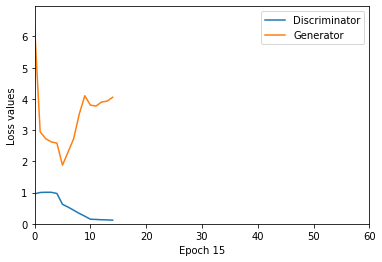

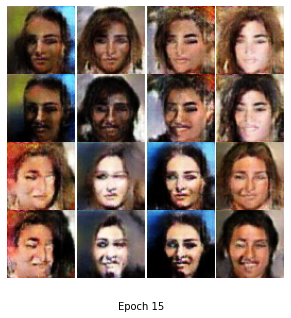

Epoch [16/60], Step [1/686], D_loss: 0.0862, G_loss: 3.6617
Epoch [16/60], Step [2/686], D_loss: 0.1033, G_loss: 3.7800
Epoch [16/60], Step [3/686], D_loss: 0.1462, G_loss: 4.9063
Epoch [16/60], Step [4/686], D_loss: 0.1975, G_loss: 4.0731
Epoch [16/60], Step [5/686], D_loss: 0.1641, G_loss: 3.6949
Epoch [16/60], Step [6/686], D_loss: 0.1525, G_loss: 4.8940
Epoch [16/60], Step [7/686], D_loss: 0.1041, G_loss: 4.0968
Epoch [16/60], Step [8/686], D_loss: 0.1716, G_loss: 4.0878
Epoch [16/60], Step [9/686], D_loss: 0.1543, G_loss: 3.1915
Epoch [16/60], Step [10/686], D_loss: 0.2079, G_loss: 4.4904
Epoch [16/60], Step [11/686], D_loss: 0.1261, G_loss: 4.6482
Epoch [16/60], Step [12/686], D_loss: 0.0636, G_loss: 4.8714
Epoch [16/60], Step [13/686], D_loss: 0.0722, G_loss: 3.7274
Epoch [16/60], Step [14/686], D_loss: 0.0720, G_loss: 3.7035
Epoch [16/60], Step [15/686], D_loss: 0.0637, G_loss: 4.2005
Epoch [16/60], Step [16/686], D_loss: 0.1012, G_loss: 6.3588
Epoch [16/60], Step [17/686], D_l

Epoch [16/60], Step [135/686], D_loss: 0.1156, G_loss: 3.5628
Epoch [16/60], Step [136/686], D_loss: 0.1529, G_loss: 2.5277
Epoch [16/60], Step [137/686], D_loss: 0.1378, G_loss: 3.2327
Epoch [16/60], Step [138/686], D_loss: 0.0736, G_loss: 3.2841
Epoch [16/60], Step [139/686], D_loss: 0.2216, G_loss: 4.4101
Epoch [16/60], Step [140/686], D_loss: 0.0812, G_loss: 4.4585
Epoch [16/60], Step [141/686], D_loss: 0.0763, G_loss: 4.5713
Epoch [16/60], Step [142/686], D_loss: 0.0916, G_loss: 3.2317
Epoch [16/60], Step [143/686], D_loss: 0.0963, G_loss: 5.3091
Epoch [16/60], Step [144/686], D_loss: 0.1061, G_loss: 4.3753
Epoch [16/60], Step [145/686], D_loss: 0.0898, G_loss: 3.3949
Epoch [16/60], Step [146/686], D_loss: 0.0512, G_loss: 4.1588
Epoch [16/60], Step [147/686], D_loss: 0.1758, G_loss: 3.5113
Epoch [16/60], Step [148/686], D_loss: 0.0751, G_loss: 3.1866
Epoch [16/60], Step [149/686], D_loss: 0.0847, G_loss: 3.0831
Epoch [16/60], Step [150/686], D_loss: 0.0667, G_loss: 3.9126
Epoch [1

Epoch [16/60], Step [268/686], D_loss: 0.1084, G_loss: 3.8922
Epoch [16/60], Step [269/686], D_loss: 0.3507, G_loss: 3.2208
Epoch [16/60], Step [270/686], D_loss: 0.0790, G_loss: 3.0204
Epoch [16/60], Step [271/686], D_loss: 0.1224, G_loss: 4.1401
Epoch [16/60], Step [272/686], D_loss: 0.1609, G_loss: 4.0989
Epoch [16/60], Step [273/686], D_loss: 0.1267, G_loss: 3.4253
Epoch [16/60], Step [274/686], D_loss: 0.0694, G_loss: 4.9617
Epoch [16/60], Step [275/686], D_loss: 0.1400, G_loss: 3.2451
Epoch [16/60], Step [276/686], D_loss: 0.0727, G_loss: 4.0478
Epoch [16/60], Step [277/686], D_loss: 0.2089, G_loss: 2.7782
Epoch [16/60], Step [278/686], D_loss: 0.1717, G_loss: 2.8915
Epoch [16/60], Step [279/686], D_loss: 0.1144, G_loss: 3.4140
Epoch [16/60], Step [280/686], D_loss: 0.1249, G_loss: 3.0539
Epoch [16/60], Step [281/686], D_loss: 0.1373, G_loss: 2.8990
Epoch [16/60], Step [282/686], D_loss: 0.0964, G_loss: 3.6977
Epoch [16/60], Step [283/686], D_loss: 0.1286, G_loss: 3.5878
Epoch [1

Epoch [16/60], Step [401/686], D_loss: 0.1258, G_loss: 4.8610
Epoch [16/60], Step [402/686], D_loss: 0.0727, G_loss: 5.2359
Epoch [16/60], Step [403/686], D_loss: 0.1202, G_loss: 3.4865
Epoch [16/60], Step [404/686], D_loss: 0.1792, G_loss: 3.8770
Epoch [16/60], Step [405/686], D_loss: 0.1981, G_loss: 3.8102
Epoch [16/60], Step [406/686], D_loss: 0.0671, G_loss: 5.3790
Epoch [16/60], Step [407/686], D_loss: 0.1399, G_loss: 4.0019
Epoch [16/60], Step [408/686], D_loss: 0.2288, G_loss: 3.1456
Epoch [16/60], Step [409/686], D_loss: 0.1692, G_loss: 4.3984
Epoch [16/60], Step [410/686], D_loss: 0.0675, G_loss: 3.5551
Epoch [16/60], Step [411/686], D_loss: 0.1963, G_loss: 4.1515
Epoch [16/60], Step [412/686], D_loss: 0.0595, G_loss: 3.5468
Epoch [16/60], Step [413/686], D_loss: 0.1436, G_loss: 4.2140
Epoch [16/60], Step [414/686], D_loss: 0.0607, G_loss: 4.3342
Epoch [16/60], Step [415/686], D_loss: 0.3318, G_loss: 3.6066
Epoch [16/60], Step [416/686], D_loss: 0.1075, G_loss: 5.1646
Epoch [1

Epoch [16/60], Step [534/686], D_loss: 0.1100, G_loss: 4.3244
Epoch [16/60], Step [535/686], D_loss: 0.1304, G_loss: 3.3033
Epoch [16/60], Step [536/686], D_loss: 0.0590, G_loss: 4.4899
Epoch [16/60], Step [537/686], D_loss: 0.1124, G_loss: 3.5102
Epoch [16/60], Step [538/686], D_loss: 0.1344, G_loss: 4.3319
Epoch [16/60], Step [539/686], D_loss: 0.0458, G_loss: 4.4505
Epoch [16/60], Step [540/686], D_loss: 0.0378, G_loss: 4.5753
Epoch [16/60], Step [541/686], D_loss: 0.0545, G_loss: 4.2187
Epoch [16/60], Step [542/686], D_loss: 0.1477, G_loss: 3.7741
Epoch [16/60], Step [543/686], D_loss: 0.0365, G_loss: 3.6919
Epoch [16/60], Step [544/686], D_loss: 0.0778, G_loss: 3.5252
Epoch [16/60], Step [545/686], D_loss: 0.0634, G_loss: 3.1336
Epoch [16/60], Step [546/686], D_loss: 0.1411, G_loss: 3.9925
Epoch [16/60], Step [547/686], D_loss: 0.1055, G_loss: 3.6539
Epoch [16/60], Step [548/686], D_loss: 0.1036, G_loss: 3.5034
Epoch [16/60], Step [549/686], D_loss: 0.2152, G_loss: 2.5059
Epoch [1

Epoch [16/60], Step [667/686], D_loss: 0.0607, G_loss: 4.6322
Epoch [16/60], Step [668/686], D_loss: 0.0440, G_loss: 4.8679
Epoch [16/60], Step [669/686], D_loss: 0.1059, G_loss: 3.8934
Epoch [16/60], Step [670/686], D_loss: 0.0581, G_loss: 3.6956
Epoch [16/60], Step [671/686], D_loss: 0.0768, G_loss: 4.9409
Epoch [16/60], Step [672/686], D_loss: 0.0818, G_loss: 3.9571
Epoch [16/60], Step [673/686], D_loss: 0.0537, G_loss: 3.2836
Epoch [16/60], Step [674/686], D_loss: 0.0399, G_loss: 4.4292
Epoch [16/60], Step [675/686], D_loss: 0.1345, G_loss: 3.5038
Epoch [16/60], Step [676/686], D_loss: 0.1051, G_loss: 4.2185
Epoch [16/60], Step [677/686], D_loss: 0.1309, G_loss: 5.2567
Epoch [16/60], Step [678/686], D_loss: 0.0850, G_loss: 5.5748
Epoch [16/60], Step [679/686], D_loss: 0.1549, G_loss: 4.0708
Epoch [16/60], Step [680/686], D_loss: 0.1311, G_loss: 4.2474
Epoch [16/60], Step [681/686], D_loss: 0.1025, G_loss: 4.1133
Epoch [16/60], Step [682/686], D_loss: 0.1044, G_loss: 3.2346
Epoch [1

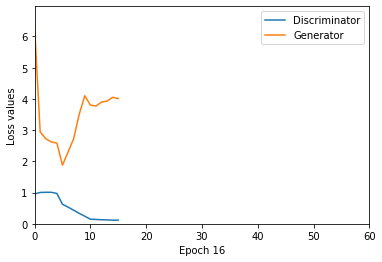

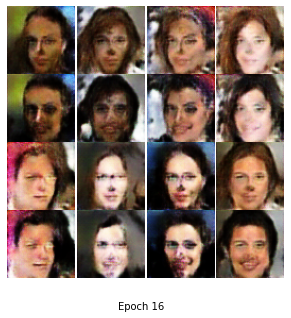

Epoch [17/60], Step [1/686], D_loss: 0.1363, G_loss: 3.3787
Epoch [17/60], Step [2/686], D_loss: 0.0902, G_loss: 4.1543
Epoch [17/60], Step [3/686], D_loss: 0.0685, G_loss: 3.9259
Epoch [17/60], Step [4/686], D_loss: 0.1159, G_loss: 4.4731
Epoch [17/60], Step [5/686], D_loss: 0.1944, G_loss: 4.2179
Epoch [17/60], Step [6/686], D_loss: 0.0742, G_loss: 3.2880
Epoch [17/60], Step [7/686], D_loss: 0.0643, G_loss: 3.4345
Epoch [17/60], Step [8/686], D_loss: 0.0728, G_loss: 2.7889
Epoch [17/60], Step [9/686], D_loss: 0.1603, G_loss: 3.2731
Epoch [17/60], Step [10/686], D_loss: 0.1000, G_loss: 4.1100
Epoch [17/60], Step [11/686], D_loss: 0.0866, G_loss: 3.8158
Epoch [17/60], Step [12/686], D_loss: 0.1657, G_loss: 4.2030
Epoch [17/60], Step [13/686], D_loss: 0.0930, G_loss: 4.7456
Epoch [17/60], Step [14/686], D_loss: 0.1397, G_loss: 4.1528
Epoch [17/60], Step [15/686], D_loss: 0.0518, G_loss: 4.4330
Epoch [17/60], Step [16/686], D_loss: 0.1088, G_loss: 4.6114
Epoch [17/60], Step [17/686], D_l

Epoch [17/60], Step [135/686], D_loss: 0.2104, G_loss: 3.4164
Epoch [17/60], Step [136/686], D_loss: 0.1387, G_loss: 3.7603
Epoch [17/60], Step [137/686], D_loss: 0.2194, G_loss: 3.6164
Epoch [17/60], Step [138/686], D_loss: 0.1221, G_loss: 3.1217
Epoch [17/60], Step [139/686], D_loss: 0.1747, G_loss: 4.2447
Epoch [17/60], Step [140/686], D_loss: 0.1537, G_loss: 4.5640
Epoch [17/60], Step [141/686], D_loss: 0.1207, G_loss: 4.4846
Epoch [17/60], Step [142/686], D_loss: 0.1164, G_loss: 4.4002
Epoch [17/60], Step [143/686], D_loss: 0.0747, G_loss: 4.6614
Epoch [17/60], Step [144/686], D_loss: 0.1494, G_loss: 4.6533
Epoch [17/60], Step [145/686], D_loss: 0.1082, G_loss: 4.7798
Epoch [17/60], Step [146/686], D_loss: 0.0525, G_loss: 3.7353
Epoch [17/60], Step [147/686], D_loss: 0.3275, G_loss: 3.7113
Epoch [17/60], Step [148/686], D_loss: 0.0869, G_loss: 3.8897
Epoch [17/60], Step [149/686], D_loss: 0.1817, G_loss: 3.1680
Epoch [17/60], Step [150/686], D_loss: 0.0494, G_loss: 3.3175
Epoch [1

Epoch [17/60], Step [268/686], D_loss: 0.0257, G_loss: 2.9852
Epoch [17/60], Step [269/686], D_loss: 0.1966, G_loss: 3.4627
Epoch [17/60], Step [270/686], D_loss: 0.1335, G_loss: 3.4539
Epoch [17/60], Step [271/686], D_loss: 0.0907, G_loss: 4.3258
Epoch [17/60], Step [272/686], D_loss: 0.1476, G_loss: 3.5621
Epoch [17/60], Step [273/686], D_loss: 0.0648, G_loss: 4.6376
Epoch [17/60], Step [274/686], D_loss: 0.0904, G_loss: 4.4878
Epoch [17/60], Step [275/686], D_loss: 0.1630, G_loss: 3.4862
Epoch [17/60], Step [276/686], D_loss: 0.0696, G_loss: 3.8337
Epoch [17/60], Step [277/686], D_loss: 0.3100, G_loss: 2.6625
Epoch [17/60], Step [278/686], D_loss: 0.2736, G_loss: 3.0842
Epoch [17/60], Step [279/686], D_loss: 0.0559, G_loss: 3.5244
Epoch [17/60], Step [280/686], D_loss: 0.0890, G_loss: 3.5733
Epoch [17/60], Step [281/686], D_loss: 0.1101, G_loss: 3.7877
Epoch [17/60], Step [282/686], D_loss: 0.0466, G_loss: 3.4895
Epoch [17/60], Step [283/686], D_loss: 0.1189, G_loss: 3.7282
Epoch [1

Epoch [17/60], Step [401/686], D_loss: 0.0901, G_loss: 4.1103
Epoch [17/60], Step [402/686], D_loss: 0.0769, G_loss: 4.3561
Epoch [17/60], Step [403/686], D_loss: 0.1024, G_loss: 3.8235
Epoch [17/60], Step [404/686], D_loss: 0.1028, G_loss: 3.9968
Epoch [17/60], Step [405/686], D_loss: 0.0773, G_loss: 4.5057
Epoch [17/60], Step [406/686], D_loss: 0.0864, G_loss: 4.0541
Epoch [17/60], Step [407/686], D_loss: 0.1051, G_loss: 4.1930
Epoch [17/60], Step [408/686], D_loss: 0.1404, G_loss: 2.8743
Epoch [17/60], Step [409/686], D_loss: 0.0582, G_loss: 3.7692
Epoch [17/60], Step [410/686], D_loss: 0.0933, G_loss: 4.0365
Epoch [17/60], Step [411/686], D_loss: 0.1510, G_loss: 3.6101
Epoch [17/60], Step [412/686], D_loss: 0.0774, G_loss: 4.0205
Epoch [17/60], Step [413/686], D_loss: 0.1540, G_loss: 4.1566
Epoch [17/60], Step [414/686], D_loss: 0.0502, G_loss: 4.7184
Epoch [17/60], Step [415/686], D_loss: 0.1225, G_loss: 3.8573
Epoch [17/60], Step [416/686], D_loss: 0.0575, G_loss: 3.9566
Epoch [1

Epoch [17/60], Step [534/686], D_loss: 0.1273, G_loss: 4.3742
Epoch [17/60], Step [535/686], D_loss: 0.1227, G_loss: 4.6823
Epoch [17/60], Step [536/686], D_loss: 0.0768, G_loss: 3.4383
Epoch [17/60], Step [537/686], D_loss: 0.0699, G_loss: 3.5469
Epoch [17/60], Step [538/686], D_loss: 0.0808, G_loss: 5.1896
Epoch [17/60], Step [539/686], D_loss: 0.0768, G_loss: 4.3823
Epoch [17/60], Step [540/686], D_loss: 0.0340, G_loss: 4.1269
Epoch [17/60], Step [541/686], D_loss: 0.0642, G_loss: 4.5591
Epoch [17/60], Step [542/686], D_loss: 0.1012, G_loss: 3.4168
Epoch [17/60], Step [543/686], D_loss: 0.0808, G_loss: 3.9357
Epoch [17/60], Step [544/686], D_loss: 0.0377, G_loss: 3.6607
Epoch [17/60], Step [545/686], D_loss: 0.0905, G_loss: 3.5139
Epoch [17/60], Step [546/686], D_loss: 0.1636, G_loss: 3.5050
Epoch [17/60], Step [547/686], D_loss: 0.0682, G_loss: 3.8349
Epoch [17/60], Step [548/686], D_loss: 0.0395, G_loss: 4.9539
Epoch [17/60], Step [549/686], D_loss: 0.1290, G_loss: 3.5205
Epoch [1

Epoch [17/60], Step [667/686], D_loss: 0.0628, G_loss: 4.2420
Epoch [17/60], Step [668/686], D_loss: 0.0498, G_loss: 4.9248
Epoch [17/60], Step [669/686], D_loss: 0.0980, G_loss: 4.4161
Epoch [17/60], Step [670/686], D_loss: 0.1274, G_loss: 4.7198
Epoch [17/60], Step [671/686], D_loss: 0.0746, G_loss: 5.0135
Epoch [17/60], Step [672/686], D_loss: 0.1232, G_loss: 5.2093
Epoch [17/60], Step [673/686], D_loss: 0.0726, G_loss: 5.5087
Epoch [17/60], Step [674/686], D_loss: 0.0483, G_loss: 4.1412
Epoch [17/60], Step [675/686], D_loss: 0.0881, G_loss: 5.0561
Epoch [17/60], Step [676/686], D_loss: 0.0555, G_loss: 4.7982
Epoch [17/60], Step [677/686], D_loss: 0.1009, G_loss: 4.4427
Epoch [17/60], Step [678/686], D_loss: 0.0779, G_loss: 4.2384
Epoch [17/60], Step [679/686], D_loss: 0.1046, G_loss: 4.5261
Epoch [17/60], Step [680/686], D_loss: 0.1348, G_loss: 4.1077
Epoch [17/60], Step [681/686], D_loss: 0.1390, G_loss: 4.3070
Epoch [17/60], Step [682/686], D_loss: 0.1003, G_loss: 5.2110
Epoch [1

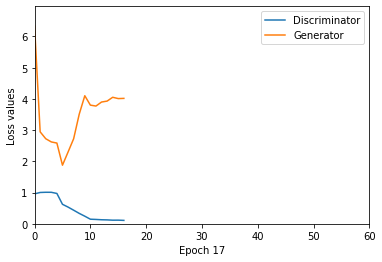

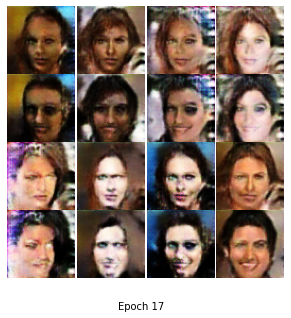

Epoch [18/60], Step [1/686], D_loss: 0.0817, G_loss: 3.8632
Epoch [18/60], Step [2/686], D_loss: 0.0775, G_loss: 4.6157
Epoch [18/60], Step [3/686], D_loss: 0.0793, G_loss: 5.3201
Epoch [18/60], Step [4/686], D_loss: 0.1170, G_loss: 4.3032
Epoch [18/60], Step [5/686], D_loss: 0.1374, G_loss: 3.6210
Epoch [18/60], Step [6/686], D_loss: 0.1039, G_loss: 3.8050
Epoch [18/60], Step [7/686], D_loss: 0.1298, G_loss: 4.3784
Epoch [18/60], Step [8/686], D_loss: 0.0799, G_loss: 4.2037
Epoch [18/60], Step [9/686], D_loss: 0.0835, G_loss: 4.2713
Epoch [18/60], Step [10/686], D_loss: 0.0778, G_loss: 3.7342
Epoch [18/60], Step [11/686], D_loss: 0.1005, G_loss: 3.5783
Epoch [18/60], Step [12/686], D_loss: 0.0453, G_loss: 4.8913
Epoch [18/60], Step [13/686], D_loss: 0.0776, G_loss: 2.8749
Epoch [18/60], Step [14/686], D_loss: 0.1047, G_loss: 4.0030
Epoch [18/60], Step [15/686], D_loss: 0.1342, G_loss: 3.8292
Epoch [18/60], Step [16/686], D_loss: 0.0822, G_loss: 3.2766
Epoch [18/60], Step [17/686], D_l

Epoch [18/60], Step [135/686], D_loss: 0.1627, G_loss: 4.3651
Epoch [18/60], Step [136/686], D_loss: 0.1399, G_loss: 4.3681
Epoch [18/60], Step [137/686], D_loss: 0.1948, G_loss: 4.8624
Epoch [18/60], Step [138/686], D_loss: 0.1206, G_loss: 3.8681
Epoch [18/60], Step [139/686], D_loss: 0.0902, G_loss: 4.9617
Epoch [18/60], Step [140/686], D_loss: 0.0966, G_loss: 4.1958
Epoch [18/60], Step [141/686], D_loss: 0.1118, G_loss: 3.2229
Epoch [18/60], Step [142/686], D_loss: 0.0722, G_loss: 4.7665
Epoch [18/60], Step [143/686], D_loss: 0.0833, G_loss: 3.7796
Epoch [18/60], Step [144/686], D_loss: 0.1160, G_loss: 4.2450
Epoch [18/60], Step [145/686], D_loss: 0.1135, G_loss: 4.3079
Epoch [18/60], Step [146/686], D_loss: 0.0806, G_loss: 4.3554
Epoch [18/60], Step [147/686], D_loss: 0.1754, G_loss: 3.8401
Epoch [18/60], Step [148/686], D_loss: 0.1184, G_loss: 4.8530
Epoch [18/60], Step [149/686], D_loss: 0.0863, G_loss: 2.9863
Epoch [18/60], Step [150/686], D_loss: 0.1089, G_loss: 3.9805
Epoch [1

Epoch [18/60], Step [268/686], D_loss: 0.0606, G_loss: 3.9687
Epoch [18/60], Step [269/686], D_loss: 0.2543, G_loss: 4.4475
Epoch [18/60], Step [270/686], D_loss: 0.1118, G_loss: 4.9730
Epoch [18/60], Step [271/686], D_loss: 0.0569, G_loss: 5.1918
Epoch [18/60], Step [272/686], D_loss: 0.1261, G_loss: 4.2025
Epoch [18/60], Step [273/686], D_loss: 0.0787, G_loss: 4.9347
Epoch [18/60], Step [274/686], D_loss: 0.0585, G_loss: 3.8807
Epoch [18/60], Step [275/686], D_loss: 0.1289, G_loss: 3.6856
Epoch [18/60], Step [276/686], D_loss: 0.0698, G_loss: 4.1945
Epoch [18/60], Step [277/686], D_loss: 0.2065, G_loss: 3.7252
Epoch [18/60], Step [278/686], D_loss: 0.0765, G_loss: 4.0440
Epoch [18/60], Step [279/686], D_loss: 0.1446, G_loss: 3.5101
Epoch [18/60], Step [280/686], D_loss: 0.0560, G_loss: 4.2541
Epoch [18/60], Step [281/686], D_loss: 0.0777, G_loss: 3.7807
Epoch [18/60], Step [282/686], D_loss: 0.0551, G_loss: 3.9681
Epoch [18/60], Step [283/686], D_loss: 0.0491, G_loss: 5.2388
Epoch [1

Epoch [18/60], Step [401/686], D_loss: 0.0575, G_loss: 4.4156
Epoch [18/60], Step [402/686], D_loss: 0.0526, G_loss: 4.8887
Epoch [18/60], Step [403/686], D_loss: 0.0749, G_loss: 4.6298
Epoch [18/60], Step [404/686], D_loss: 0.0792, G_loss: 5.5924
Epoch [18/60], Step [405/686], D_loss: 0.0851, G_loss: 4.8946
Epoch [18/60], Step [406/686], D_loss: 0.0795, G_loss: 4.1752
Epoch [18/60], Step [407/686], D_loss: 0.0963, G_loss: 4.7818
Epoch [18/60], Step [408/686], D_loss: 0.0989, G_loss: 4.3441
Epoch [18/60], Step [409/686], D_loss: 0.0294, G_loss: 5.0772
Epoch [18/60], Step [410/686], D_loss: 0.0642, G_loss: 4.8871
Epoch [18/60], Step [411/686], D_loss: 0.1224, G_loss: 3.6300
Epoch [18/60], Step [412/686], D_loss: 0.1457, G_loss: 4.6924
Epoch [18/60], Step [413/686], D_loss: 0.1353, G_loss: 4.3172
Epoch [18/60], Step [414/686], D_loss: 0.0432, G_loss: 4.8196
Epoch [18/60], Step [415/686], D_loss: 0.1351, G_loss: 4.3705
Epoch [18/60], Step [416/686], D_loss: 0.0296, G_loss: 4.7796
Epoch [1

Epoch [18/60], Step [534/686], D_loss: 0.0758, G_loss: 4.5894
Epoch [18/60], Step [535/686], D_loss: 0.0815, G_loss: 5.0550
Epoch [18/60], Step [536/686], D_loss: 0.0422, G_loss: 4.8549
Epoch [18/60], Step [537/686], D_loss: 0.0593, G_loss: 4.4836
Epoch [18/60], Step [538/686], D_loss: 0.0384, G_loss: 4.2543
Epoch [18/60], Step [539/686], D_loss: 0.0746, G_loss: 4.7468
Epoch [18/60], Step [540/686], D_loss: 0.0692, G_loss: 5.5717
Epoch [18/60], Step [541/686], D_loss: 0.0806, G_loss: 4.7490
Epoch [18/60], Step [542/686], D_loss: 0.1301, G_loss: 4.8861
Epoch [18/60], Step [543/686], D_loss: 0.0429, G_loss: 4.5209
Epoch [18/60], Step [544/686], D_loss: 0.0276, G_loss: 4.5405
Epoch [18/60], Step [545/686], D_loss: 0.0676, G_loss: 5.5446
Epoch [18/60], Step [546/686], D_loss: 0.0640, G_loss: 4.7805
Epoch [18/60], Step [547/686], D_loss: 0.1188, G_loss: 4.4548
Epoch [18/60], Step [548/686], D_loss: 0.0339, G_loss: 4.2538
Epoch [18/60], Step [549/686], D_loss: 0.0909, G_loss: 4.4028
Epoch [1

Epoch [18/60], Step [667/686], D_loss: 0.0529, G_loss: 4.4070
Epoch [18/60], Step [668/686], D_loss: 0.0277, G_loss: 4.6200
Epoch [18/60], Step [669/686], D_loss: 0.1068, G_loss: 4.9529
Epoch [18/60], Step [670/686], D_loss: 0.0429, G_loss: 4.2954
Epoch [18/60], Step [671/686], D_loss: 0.0850, G_loss: 4.5140
Epoch [18/60], Step [672/686], D_loss: 0.0557, G_loss: 3.6201
Epoch [18/60], Step [673/686], D_loss: 0.0654, G_loss: 4.5592
Epoch [18/60], Step [674/686], D_loss: 0.0377, G_loss: 4.2471
Epoch [18/60], Step [675/686], D_loss: 0.0348, G_loss: 4.7784
Epoch [18/60], Step [676/686], D_loss: 0.0328, G_loss: 3.7232
Epoch [18/60], Step [677/686], D_loss: 0.0616, G_loss: 5.0459
Epoch [18/60], Step [678/686], D_loss: 0.0499, G_loss: 5.0591
Epoch [18/60], Step [679/686], D_loss: 0.0843, G_loss: 4.9267
Epoch [18/60], Step [680/686], D_loss: 0.0610, G_loss: 3.5983
Epoch [18/60], Step [681/686], D_loss: 0.0415, G_loss: 3.1826
Epoch [18/60], Step [682/686], D_loss: 0.1395, G_loss: 4.2098
Epoch [1

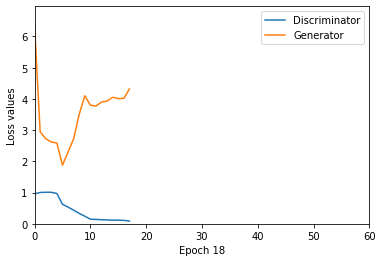

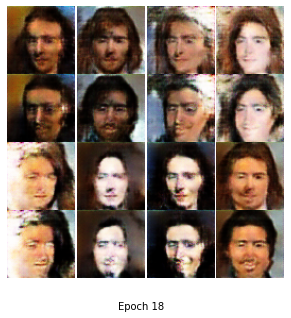

Epoch [19/60], Step [1/686], D_loss: 0.0995, G_loss: 4.0951
Epoch [19/60], Step [2/686], D_loss: 0.0433, G_loss: 3.6937
Epoch [19/60], Step [3/686], D_loss: 0.0550, G_loss: 3.8219
Epoch [19/60], Step [4/686], D_loss: 0.0914, G_loss: 2.5535
Epoch [19/60], Step [5/686], D_loss: 0.1375, G_loss: 4.4317
Epoch [19/60], Step [6/686], D_loss: 0.0374, G_loss: 3.8526
Epoch [19/60], Step [7/686], D_loss: 0.0690, G_loss: 3.9449
Epoch [19/60], Step [8/686], D_loss: 0.1239, G_loss: 3.1352
Epoch [19/60], Step [9/686], D_loss: 0.0883, G_loss: 3.8586
Epoch [19/60], Step [10/686], D_loss: 0.1242, G_loss: 3.5607
Epoch [19/60], Step [11/686], D_loss: 0.0979, G_loss: 4.5019
Epoch [19/60], Step [12/686], D_loss: 0.0620, G_loss: 4.3657
Epoch [19/60], Step [13/686], D_loss: 0.0886, G_loss: 4.1891
Epoch [19/60], Step [14/686], D_loss: 0.0779, G_loss: 3.8974
Epoch [19/60], Step [15/686], D_loss: 0.0758, G_loss: 4.2971
Epoch [19/60], Step [16/686], D_loss: 0.0516, G_loss: 3.5109
Epoch [19/60], Step [17/686], D_l

Epoch [19/60], Step [135/686], D_loss: 0.0805, G_loss: 3.6220
Epoch [19/60], Step [136/686], D_loss: 0.1797, G_loss: 4.3826
Epoch [19/60], Step [137/686], D_loss: 0.1130, G_loss: 3.2509
Epoch [19/60], Step [138/686], D_loss: 0.0797, G_loss: 4.5240
Epoch [19/60], Step [139/686], D_loss: 0.0539, G_loss: 3.9603
Epoch [19/60], Step [140/686], D_loss: 0.1098, G_loss: 4.0007
Epoch [19/60], Step [141/686], D_loss: 0.1048, G_loss: 3.7208
Epoch [19/60], Step [142/686], D_loss: 0.1188, G_loss: 4.7873
Epoch [19/60], Step [143/686], D_loss: 0.0422, G_loss: 5.5931
Epoch [19/60], Step [144/686], D_loss: 0.0815, G_loss: 4.5907
Epoch [19/60], Step [145/686], D_loss: 0.1117, G_loss: 3.6837
Epoch [19/60], Step [146/686], D_loss: 0.0640, G_loss: 5.6081
Epoch [19/60], Step [147/686], D_loss: 0.2432, G_loss: 5.3134
Epoch [19/60], Step [148/686], D_loss: 0.0418, G_loss: 3.4545
Epoch [19/60], Step [149/686], D_loss: 0.1080, G_loss: 3.4162
Epoch [19/60], Step [150/686], D_loss: 0.0721, G_loss: 4.4115
Epoch [1

Epoch [19/60], Step [268/686], D_loss: 0.0432, G_loss: 3.9118
Epoch [19/60], Step [269/686], D_loss: 0.2042, G_loss: 3.7722
Epoch [19/60], Step [270/686], D_loss: 0.0495, G_loss: 3.0751
Epoch [19/60], Step [271/686], D_loss: 0.3055, G_loss: 4.6458
Epoch [19/60], Step [272/686], D_loss: 0.1248, G_loss: 5.5781
Epoch [19/60], Step [273/686], D_loss: 0.0620, G_loss: 5.2541
Epoch [19/60], Step [274/686], D_loss: 0.1017, G_loss: 5.0367
Epoch [19/60], Step [275/686], D_loss: 0.1578, G_loss: 4.2021
Epoch [19/60], Step [276/686], D_loss: 0.0710, G_loss: 4.3316
Epoch [19/60], Step [277/686], D_loss: 0.2124, G_loss: 4.0712
Epoch [19/60], Step [278/686], D_loss: 0.1128, G_loss: 3.7999
Epoch [19/60], Step [279/686], D_loss: 0.0693, G_loss: 2.7769
Epoch [19/60], Step [280/686], D_loss: 0.1598, G_loss: 3.2669
Epoch [19/60], Step [281/686], D_loss: 0.1279, G_loss: 5.4580
Epoch [19/60], Step [282/686], D_loss: 0.0930, G_loss: 5.1441
Epoch [19/60], Step [283/686], D_loss: 0.1491, G_loss: 5.0680
Epoch [1

Epoch [19/60], Step [401/686], D_loss: 0.1115, G_loss: 4.4263
Epoch [19/60], Step [402/686], D_loss: 0.0755, G_loss: 4.9418
Epoch [19/60], Step [403/686], D_loss: 0.0837, G_loss: 4.8717
Epoch [19/60], Step [404/686], D_loss: 0.0682, G_loss: 4.3478
Epoch [19/60], Step [405/686], D_loss: 0.0622, G_loss: 4.2082
Epoch [19/60], Step [406/686], D_loss: 0.0432, G_loss: 4.9327
Epoch [19/60], Step [407/686], D_loss: 0.0718, G_loss: 4.0950
Epoch [19/60], Step [408/686], D_loss: 0.0888, G_loss: 3.6271
Epoch [19/60], Step [409/686], D_loss: 0.0602, G_loss: 3.4488
Epoch [19/60], Step [410/686], D_loss: 0.0440, G_loss: 4.9879
Epoch [19/60], Step [411/686], D_loss: 0.2010, G_loss: 3.3940
Epoch [19/60], Step [412/686], D_loss: 0.0788, G_loss: 3.4573
Epoch [19/60], Step [413/686], D_loss: 0.1385, G_loss: 4.3507
Epoch [19/60], Step [414/686], D_loss: 0.0764, G_loss: 4.5067
Epoch [19/60], Step [415/686], D_loss: 0.0924, G_loss: 3.8026
Epoch [19/60], Step [416/686], D_loss: 0.1047, G_loss: 3.3127
Epoch [1

Epoch [19/60], Step [534/686], D_loss: 0.1146, G_loss: 3.8245
Epoch [19/60], Step [535/686], D_loss: 0.1394, G_loss: 4.0810
Epoch [19/60], Step [536/686], D_loss: 0.0591, G_loss: 4.3427
Epoch [19/60], Step [537/686], D_loss: 0.0799, G_loss: 4.9077
Epoch [19/60], Step [538/686], D_loss: 0.0832, G_loss: 3.4848
Epoch [19/60], Step [539/686], D_loss: 0.0787, G_loss: 3.9589
Epoch [19/60], Step [540/686], D_loss: 0.0538, G_loss: 4.6021
Epoch [19/60], Step [541/686], D_loss: 0.0530, G_loss: 5.1852
Epoch [19/60], Step [542/686], D_loss: 0.1605, G_loss: 5.2783
Epoch [19/60], Step [543/686], D_loss: 0.0832, G_loss: 3.5419
Epoch [19/60], Step [544/686], D_loss: 0.0593, G_loss: 4.6078
Epoch [19/60], Step [545/686], D_loss: 0.0812, G_loss: 4.8538
Epoch [19/60], Step [546/686], D_loss: 0.1529, G_loss: 4.2443
Epoch [19/60], Step [547/686], D_loss: 0.0911, G_loss: 3.0071
Epoch [19/60], Step [548/686], D_loss: 0.0564, G_loss: 3.8393
Epoch [19/60], Step [549/686], D_loss: 0.1459, G_loss: 4.9827
Epoch [1

Epoch [19/60], Step [667/686], D_loss: 0.0870, G_loss: 3.2378
Epoch [19/60], Step [668/686], D_loss: 0.0316, G_loss: 4.8208
Epoch [19/60], Step [669/686], D_loss: 0.0848, G_loss: 4.4675
Epoch [19/60], Step [670/686], D_loss: 0.0661, G_loss: 4.4066
Epoch [19/60], Step [671/686], D_loss: 0.0834, G_loss: 3.9362
Epoch [19/60], Step [672/686], D_loss: 0.0937, G_loss: 3.2871
Epoch [19/60], Step [673/686], D_loss: 0.0607, G_loss: 3.8220
Epoch [19/60], Step [674/686], D_loss: 0.0705, G_loss: 4.0945
Epoch [19/60], Step [675/686], D_loss: 0.0560, G_loss: 4.5737
Epoch [19/60], Step [676/686], D_loss: 0.0635, G_loss: 4.8057
Epoch [19/60], Step [677/686], D_loss: 0.0908, G_loss: 4.3114
Epoch [19/60], Step [678/686], D_loss: 0.0498, G_loss: 3.6587
Epoch [19/60], Step [679/686], D_loss: 0.1059, G_loss: 4.4733
Epoch [19/60], Step [680/686], D_loss: 0.1302, G_loss: 4.1674
Epoch [19/60], Step [681/686], D_loss: 0.0580, G_loss: 3.3236
Epoch [19/60], Step [682/686], D_loss: 0.0587, G_loss: 4.4490
Epoch [1

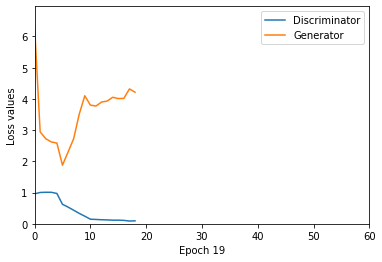

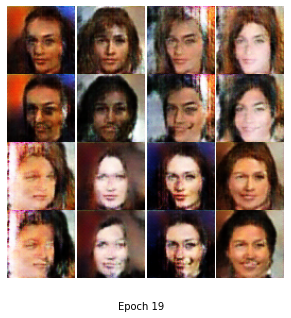

Epoch [20/60], Step [1/686], D_loss: 0.1187, G_loss: 2.8712
Epoch [20/60], Step [2/686], D_loss: 0.0578, G_loss: 4.5917
Epoch [20/60], Step [3/686], D_loss: 0.0518, G_loss: 4.9473
Epoch [20/60], Step [4/686], D_loss: 0.1353, G_loss: 4.0719
Epoch [20/60], Step [5/686], D_loss: 0.0740, G_loss: 3.3527
Epoch [20/60], Step [6/686], D_loss: 0.0683, G_loss: 4.1045
Epoch [20/60], Step [7/686], D_loss: 0.0693, G_loss: 4.6701
Epoch [20/60], Step [8/686], D_loss: 0.0471, G_loss: 3.8014
Epoch [20/60], Step [9/686], D_loss: 0.1108, G_loss: 4.4811
Epoch [20/60], Step [10/686], D_loss: 0.0540, G_loss: 2.7790
Epoch [20/60], Step [11/686], D_loss: 0.1359, G_loss: 3.0228
Epoch [20/60], Step [12/686], D_loss: 0.1371, G_loss: 5.5196
Epoch [20/60], Step [13/686], D_loss: 0.1342, G_loss: 3.8022
Epoch [20/60], Step [14/686], D_loss: 0.0803, G_loss: 4.6387
Epoch [20/60], Step [15/686], D_loss: 0.0643, G_loss: 4.6676
Epoch [20/60], Step [16/686], D_loss: 0.0563, G_loss: 4.1785
Epoch [20/60], Step [17/686], D_l

Epoch [20/60], Step [135/686], D_loss: 0.1204, G_loss: 4.9384
Epoch [20/60], Step [136/686], D_loss: 0.1373, G_loss: 3.8551
Epoch [20/60], Step [137/686], D_loss: 0.0990, G_loss: 3.4035
Epoch [20/60], Step [138/686], D_loss: 0.0740, G_loss: 3.9863
Epoch [20/60], Step [139/686], D_loss: 0.0877, G_loss: 3.9420
Epoch [20/60], Step [140/686], D_loss: 0.1636, G_loss: 5.0506
Epoch [20/60], Step [141/686], D_loss: 0.0731, G_loss: 4.5495
Epoch [20/60], Step [142/686], D_loss: 0.0625, G_loss: 5.2593
Epoch [20/60], Step [143/686], D_loss: 0.0269, G_loss: 4.8507
Epoch [20/60], Step [144/686], D_loss: 0.0993, G_loss: 5.2212
Epoch [20/60], Step [145/686], D_loss: 0.0522, G_loss: 4.8631
Epoch [20/60], Step [146/686], D_loss: 0.0323, G_loss: 4.8128
Epoch [20/60], Step [147/686], D_loss: 0.2255, G_loss: 4.5305
Epoch [20/60], Step [148/686], D_loss: 0.0349, G_loss: 3.9095
Epoch [20/60], Step [149/686], D_loss: 0.0745, G_loss: 3.8859
Epoch [20/60], Step [150/686], D_loss: 0.0402, G_loss: 3.7055
Epoch [2

Epoch [20/60], Step [268/686], D_loss: 0.0478, G_loss: 4.6630
Epoch [20/60], Step [269/686], D_loss: 0.2721, G_loss: 3.9569
Epoch [20/60], Step [270/686], D_loss: 0.0350, G_loss: 4.3959
Epoch [20/60], Step [271/686], D_loss: 0.0955, G_loss: 3.9168
Epoch [20/60], Step [272/686], D_loss: 0.1518, G_loss: 3.2456
Epoch [20/60], Step [273/686], D_loss: 0.1169, G_loss: 4.2604
Epoch [20/60], Step [274/686], D_loss: 0.0887, G_loss: 4.2173
Epoch [20/60], Step [275/686], D_loss: 0.1491, G_loss: 4.4574
Epoch [20/60], Step [276/686], D_loss: 0.0725, G_loss: 4.5990
Epoch [20/60], Step [277/686], D_loss: 0.2659, G_loss: 3.3912
Epoch [20/60], Step [278/686], D_loss: 0.1182, G_loss: 3.7068
Epoch [20/60], Step [279/686], D_loss: 0.0819, G_loss: 2.8592
Epoch [20/60], Step [280/686], D_loss: 0.2983, G_loss: 4.8911
Epoch [20/60], Step [281/686], D_loss: 0.0869, G_loss: 4.3232
Epoch [20/60], Step [282/686], D_loss: 0.0546, G_loss: 5.2999
Epoch [20/60], Step [283/686], D_loss: 0.1486, G_loss: 3.8928
Epoch [2

Epoch [20/60], Step [401/686], D_loss: 0.0608, G_loss: 4.7458
Epoch [20/60], Step [402/686], D_loss: 0.1261, G_loss: 4.9149
Epoch [20/60], Step [403/686], D_loss: 0.0740, G_loss: 4.2189
Epoch [20/60], Step [404/686], D_loss: 0.0512, G_loss: 4.9215
Epoch [20/60], Step [405/686], D_loss: 0.0749, G_loss: 3.4745
Epoch [20/60], Step [406/686], D_loss: 0.0671, G_loss: 3.9637
Epoch [20/60], Step [407/686], D_loss: 0.0878, G_loss: 3.9576
Epoch [20/60], Step [408/686], D_loss: 0.0866, G_loss: 3.5132
Epoch [20/60], Step [409/686], D_loss: 0.0649, G_loss: 5.2089
Epoch [20/60], Step [410/686], D_loss: 0.0628, G_loss: 4.6621
Epoch [20/60], Step [411/686], D_loss: 0.1534, G_loss: 5.3952
Epoch [20/60], Step [412/686], D_loss: 0.0758, G_loss: 4.7928
Epoch [20/60], Step [413/686], D_loss: 0.0959, G_loss: 4.6425
Epoch [20/60], Step [414/686], D_loss: 0.0517, G_loss: 3.7999
Epoch [20/60], Step [415/686], D_loss: 0.1351, G_loss: 3.1025
Epoch [20/60], Step [416/686], D_loss: 0.0538, G_loss: 3.3351
Epoch [2

Epoch [20/60], Step [534/686], D_loss: 0.0696, G_loss: 4.9924
Epoch [20/60], Step [535/686], D_loss: 0.0996, G_loss: 4.8502
Epoch [20/60], Step [536/686], D_loss: 0.0747, G_loss: 4.5557
Epoch [20/60], Step [537/686], D_loss: 0.0916, G_loss: 5.0843
Epoch [20/60], Step [538/686], D_loss: 0.0810, G_loss: 4.9419
Epoch [20/60], Step [539/686], D_loss: 0.0900, G_loss: 4.9039
Epoch [20/60], Step [540/686], D_loss: 0.0564, G_loss: 5.5135
Epoch [20/60], Step [541/686], D_loss: 0.0723, G_loss: 4.6362
Epoch [20/60], Step [542/686], D_loss: 0.1864, G_loss: 3.8632
Epoch [20/60], Step [543/686], D_loss: 0.0344, G_loss: 4.5548
Epoch [20/60], Step [544/686], D_loss: 0.0516, G_loss: 4.7360
Epoch [20/60], Step [545/686], D_loss: 0.0552, G_loss: 4.7213
Epoch [20/60], Step [546/686], D_loss: 0.1064, G_loss: 4.6051
Epoch [20/60], Step [547/686], D_loss: 0.0772, G_loss: 4.3856
Epoch [20/60], Step [548/686], D_loss: 0.0495, G_loss: 4.1567
Epoch [20/60], Step [549/686], D_loss: 0.1007, G_loss: 4.6170
Epoch [2

Epoch [20/60], Step [667/686], D_loss: 0.1204, G_loss: 3.4570
Epoch [20/60], Step [668/686], D_loss: 0.0258, G_loss: 4.0780
Epoch [20/60], Step [669/686], D_loss: 0.1324, G_loss: 4.2474
Epoch [20/60], Step [670/686], D_loss: 0.0648, G_loss: 5.1461
Epoch [20/60], Step [671/686], D_loss: 0.0661, G_loss: 4.8221
Epoch [20/60], Step [672/686], D_loss: 0.1202, G_loss: 3.3090
Epoch [20/60], Step [673/686], D_loss: 0.0641, G_loss: 3.8809
Epoch [20/60], Step [674/686], D_loss: 0.0664, G_loss: 3.8723
Epoch [20/60], Step [675/686], D_loss: 0.0816, G_loss: 4.8020
Epoch [20/60], Step [676/686], D_loss: 0.0461, G_loss: 4.4877
Epoch [20/60], Step [677/686], D_loss: 0.1068, G_loss: 3.6738
Epoch [20/60], Step [678/686], D_loss: 0.0857, G_loss: 3.2631
Epoch [20/60], Step [679/686], D_loss: 0.1709, G_loss: 4.6615
Epoch [20/60], Step [680/686], D_loss: 0.1092, G_loss: 3.2996
Epoch [20/60], Step [681/686], D_loss: 0.0912, G_loss: 4.5446
Epoch [20/60], Step [682/686], D_loss: 0.0836, G_loss: 4.1130
Epoch [2

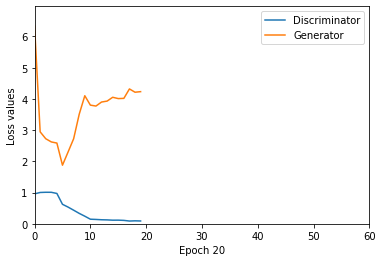

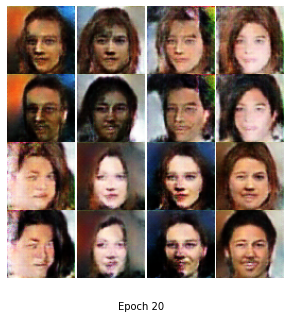

Epoch [21/60], Step [1/686], D_loss: 0.1121, G_loss: 4.3104
Epoch [21/60], Step [2/686], D_loss: 0.0504, G_loss: 4.4114
Epoch [21/60], Step [3/686], D_loss: 0.0592, G_loss: 3.6197
Epoch [21/60], Step [4/686], D_loss: 0.1565, G_loss: 3.7391
Epoch [21/60], Step [5/686], D_loss: 0.1220, G_loss: 3.7273
Epoch [21/60], Step [6/686], D_loss: 0.1205, G_loss: 3.4430
Epoch [21/60], Step [7/686], D_loss: 0.0918, G_loss: 4.3176
Epoch [21/60], Step [8/686], D_loss: 0.0875, G_loss: 3.0414
Epoch [21/60], Step [9/686], D_loss: 0.1308, G_loss: 3.6453
Epoch [21/60], Step [10/686], D_loss: 0.1081, G_loss: 3.7946
Epoch [21/60], Step [11/686], D_loss: 0.0750, G_loss: 3.3310
Epoch [21/60], Step [12/686], D_loss: 0.2191, G_loss: 4.5590
Epoch [21/60], Step [13/686], D_loss: 0.1569, G_loss: 4.2920
Epoch [21/60], Step [14/686], D_loss: 0.1019, G_loss: 4.8495
Epoch [21/60], Step [15/686], D_loss: 0.0701, G_loss: 3.9804
Epoch [21/60], Step [16/686], D_loss: 0.0738, G_loss: 4.2265
Epoch [21/60], Step [17/686], D_l

Epoch [21/60], Step [135/686], D_loss: 0.1190, G_loss: 4.1293
Epoch [21/60], Step [136/686], D_loss: 0.1621, G_loss: 3.7910
Epoch [21/60], Step [137/686], D_loss: 0.1298, G_loss: 4.6093
Epoch [21/60], Step [138/686], D_loss: 0.0846, G_loss: 4.0933
Epoch [21/60], Step [139/686], D_loss: 0.1230, G_loss: 3.4068
Epoch [21/60], Step [140/686], D_loss: 0.1559, G_loss: 4.8799
Epoch [21/60], Step [141/686], D_loss: 0.0693, G_loss: 5.1359
Epoch [21/60], Step [142/686], D_loss: 0.1081, G_loss: 5.2182
Epoch [21/60], Step [143/686], D_loss: 0.0586, G_loss: 4.0793
Epoch [21/60], Step [144/686], D_loss: 0.1040, G_loss: 5.6788
Epoch [21/60], Step [145/686], D_loss: 0.0833, G_loss: 4.6247
Epoch [21/60], Step [146/686], D_loss: 0.0702, G_loss: 4.4804
Epoch [21/60], Step [147/686], D_loss: 0.1570, G_loss: 4.4302
Epoch [21/60], Step [148/686], D_loss: 0.0814, G_loss: 2.5807
Epoch [21/60], Step [149/686], D_loss: 0.1450, G_loss: 3.5113
Epoch [21/60], Step [150/686], D_loss: 0.0488, G_loss: 3.4359
Epoch [2

Epoch [21/60], Step [268/686], D_loss: 0.0416, G_loss: 3.4912
Epoch [21/60], Step [269/686], D_loss: 0.2461, G_loss: 3.9349
Epoch [21/60], Step [270/686], D_loss: 0.0503, G_loss: 3.5163
Epoch [21/60], Step [271/686], D_loss: 0.0603, G_loss: 4.0875
Epoch [21/60], Step [272/686], D_loss: 0.1072, G_loss: 4.0287
Epoch [21/60], Step [273/686], D_loss: 0.0566, G_loss: 4.6301
Epoch [21/60], Step [274/686], D_loss: 0.1618, G_loss: 3.3514
Epoch [21/60], Step [275/686], D_loss: 0.1275, G_loss: 3.1303
Epoch [21/60], Step [276/686], D_loss: 0.0554, G_loss: 3.3630
Epoch [21/60], Step [277/686], D_loss: 0.2260, G_loss: 3.0390
Epoch [21/60], Step [278/686], D_loss: 0.1397, G_loss: 3.4237
Epoch [21/60], Step [279/686], D_loss: 0.0699, G_loss: 3.4681
Epoch [21/60], Step [280/686], D_loss: 0.2466, G_loss: 3.7292
Epoch [21/60], Step [281/686], D_loss: 0.1727, G_loss: 4.4381
Epoch [21/60], Step [282/686], D_loss: 0.0563, G_loss: 4.8256
Epoch [21/60], Step [283/686], D_loss: 0.1426, G_loss: 4.8560
Epoch [2

Epoch [21/60], Step [401/686], D_loss: 0.0565, G_loss: 4.9362
Epoch [21/60], Step [402/686], D_loss: 0.0921, G_loss: 4.1926
Epoch [21/60], Step [403/686], D_loss: 0.0855, G_loss: 5.1754
Epoch [21/60], Step [404/686], D_loss: 0.0473, G_loss: 3.9012
Epoch [21/60], Step [405/686], D_loss: 0.0820, G_loss: 4.7751
Epoch [21/60], Step [406/686], D_loss: 0.0507, G_loss: 3.6353
Epoch [21/60], Step [407/686], D_loss: 0.1156, G_loss: 3.2285
Epoch [21/60], Step [408/686], D_loss: 0.1814, G_loss: 3.4054
Epoch [21/60], Step [409/686], D_loss: 0.0467, G_loss: 3.8904
Epoch [21/60], Step [410/686], D_loss: 0.0715, G_loss: 4.9202
Epoch [21/60], Step [411/686], D_loss: 0.1003, G_loss: 3.8976
Epoch [21/60], Step [412/686], D_loss: 0.0514, G_loss: 4.7879
Epoch [21/60], Step [413/686], D_loss: 0.1532, G_loss: 5.4751
Epoch [21/60], Step [414/686], D_loss: 0.0737, G_loss: 4.1463
Epoch [21/60], Step [415/686], D_loss: 0.1797, G_loss: 3.5197
Epoch [21/60], Step [416/686], D_loss: 0.0890, G_loss: 4.3280
Epoch [2

Epoch [21/60], Step [534/686], D_loss: 0.0980, G_loss: 4.5233
Epoch [21/60], Step [535/686], D_loss: 0.1544, G_loss: 5.2583
Epoch [21/60], Step [536/686], D_loss: 0.0504, G_loss: 4.5808
Epoch [21/60], Step [537/686], D_loss: 0.0730, G_loss: 5.0063
Epoch [21/60], Step [538/686], D_loss: 0.1078, G_loss: 4.3795
Epoch [21/60], Step [539/686], D_loss: 0.0704, G_loss: 4.8329
Epoch [21/60], Step [540/686], D_loss: 0.0418, G_loss: 4.1091
Epoch [21/60], Step [541/686], D_loss: 0.0636, G_loss: 5.6149
Epoch [21/60], Step [542/686], D_loss: 0.1329, G_loss: 4.6789
Epoch [21/60], Step [543/686], D_loss: 0.0424, G_loss: 3.9623
Epoch [21/60], Step [544/686], D_loss: 0.0490, G_loss: 4.7044
Epoch [21/60], Step [545/686], D_loss: 0.0393, G_loss: 4.4771
Epoch [21/60], Step [546/686], D_loss: 0.1199, G_loss: 5.0589
Epoch [21/60], Step [547/686], D_loss: 0.0943, G_loss: 4.3348
Epoch [21/60], Step [548/686], D_loss: 0.0513, G_loss: 3.7084
Epoch [21/60], Step [549/686], D_loss: 0.1334, G_loss: 3.6100
Epoch [2

Epoch [21/60], Step [667/686], D_loss: 0.0545, G_loss: 4.6025
Epoch [21/60], Step [668/686], D_loss: 0.0491, G_loss: 4.0488
Epoch [21/60], Step [669/686], D_loss: 0.1263, G_loss: 4.5355
Epoch [21/60], Step [670/686], D_loss: 0.0817, G_loss: 5.0395
Epoch [21/60], Step [671/686], D_loss: 0.0920, G_loss: 3.5938
Epoch [21/60], Step [672/686], D_loss: 0.0635, G_loss: 4.0097
Epoch [21/60], Step [673/686], D_loss: 0.0601, G_loss: 5.5243
Epoch [21/60], Step [674/686], D_loss: 0.0378, G_loss: 4.6326
Epoch [21/60], Step [675/686], D_loss: 0.0750, G_loss: 4.9959
Epoch [21/60], Step [676/686], D_loss: 0.0275, G_loss: 5.1391
Epoch [21/60], Step [677/686], D_loss: 0.0929, G_loss: 4.5250
Epoch [21/60], Step [678/686], D_loss: 0.0592, G_loss: 4.8409
Epoch [21/60], Step [679/686], D_loss: 0.1241, G_loss: 4.4091
Epoch [21/60], Step [680/686], D_loss: 0.0543, G_loss: 3.5653
Epoch [21/60], Step [681/686], D_loss: 0.0923, G_loss: 4.0824
Epoch [21/60], Step [682/686], D_loss: 0.0615, G_loss: 4.3702
Epoch [2

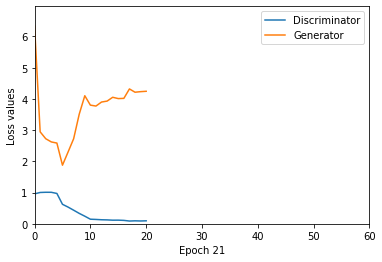

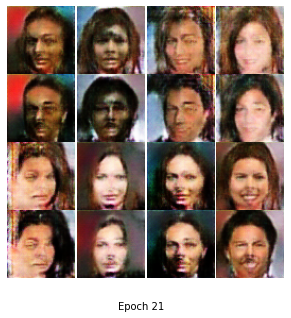

Epoch [22/60], Step [1/686], D_loss: 0.0988, G_loss: 3.1290
Epoch [22/60], Step [2/686], D_loss: 0.0595, G_loss: 4.6539
Epoch [22/60], Step [3/686], D_loss: 0.0447, G_loss: 3.7503
Epoch [22/60], Step [4/686], D_loss: 0.1487, G_loss: 4.6761
Epoch [22/60], Step [5/686], D_loss: 0.0705, G_loss: 4.4978
Epoch [22/60], Step [6/686], D_loss: 0.0715, G_loss: 4.5044
Epoch [22/60], Step [7/686], D_loss: 0.1297, G_loss: 3.8424
Epoch [22/60], Step [8/686], D_loss: 0.0737, G_loss: 4.7677
Epoch [22/60], Step [9/686], D_loss: 0.1058, G_loss: 3.0924
Epoch [22/60], Step [10/686], D_loss: 0.0752, G_loss: 3.4451
Epoch [22/60], Step [11/686], D_loss: 0.0881, G_loss: 3.6675
Epoch [22/60], Step [12/686], D_loss: 0.0967, G_loss: 4.4152
Epoch [22/60], Step [13/686], D_loss: 0.0962, G_loss: 4.9270
Epoch [22/60], Step [14/686], D_loss: 0.1321, G_loss: 3.4706
Epoch [22/60], Step [15/686], D_loss: 0.0997, G_loss: 3.7374
Epoch [22/60], Step [16/686], D_loss: 0.0450, G_loss: 3.5644
Epoch [22/60], Step [17/686], D_l

Epoch [22/60], Step [135/686], D_loss: 0.1907, G_loss: 3.0675
Epoch [22/60], Step [136/686], D_loss: 0.1340, G_loss: 3.8540
Epoch [22/60], Step [137/686], D_loss: 0.1202, G_loss: 2.8744
Epoch [22/60], Step [138/686], D_loss: 0.0879, G_loss: 3.7391
Epoch [22/60], Step [139/686], D_loss: 0.0801, G_loss: 3.2224
Epoch [22/60], Step [140/686], D_loss: 0.1114, G_loss: 4.0646
Epoch [22/60], Step [141/686], D_loss: 0.0689, G_loss: 4.2422
Epoch [22/60], Step [142/686], D_loss: 0.0491, G_loss: 4.0409
Epoch [22/60], Step [143/686], D_loss: 0.0449, G_loss: 3.4608
Epoch [22/60], Step [144/686], D_loss: 0.0843, G_loss: 5.2728
Epoch [22/60], Step [145/686], D_loss: 0.0406, G_loss: 4.0982
Epoch [22/60], Step [146/686], D_loss: 0.0468, G_loss: 5.4434
Epoch [22/60], Step [147/686], D_loss: 0.2354, G_loss: 4.0301
Epoch [22/60], Step [148/686], D_loss: 0.0647, G_loss: 3.8750
Epoch [22/60], Step [149/686], D_loss: 0.0900, G_loss: 4.2862
Epoch [22/60], Step [150/686], D_loss: 0.1195, G_loss: 4.0756
Epoch [2

Epoch [22/60], Step [268/686], D_loss: 0.0377, G_loss: 4.8219
Epoch [22/60], Step [269/686], D_loss: 0.3165, G_loss: 3.9585
Epoch [22/60], Step [270/686], D_loss: 0.0995, G_loss: 2.6481
Epoch [22/60], Step [271/686], D_loss: 0.1332, G_loss: 4.6273
Epoch [22/60], Step [272/686], D_loss: 0.1342, G_loss: 3.7348
Epoch [22/60], Step [273/686], D_loss: 0.1376, G_loss: 4.5214
Epoch [22/60], Step [274/686], D_loss: 0.0953, G_loss: 4.7111
Epoch [22/60], Step [275/686], D_loss: 0.1397, G_loss: 3.7481
Epoch [22/60], Step [276/686], D_loss: 0.0902, G_loss: 3.6140
Epoch [22/60], Step [277/686], D_loss: 0.2662, G_loss: 4.0584
Epoch [22/60], Step [278/686], D_loss: 0.0718, G_loss: 3.5486
Epoch [22/60], Step [279/686], D_loss: 0.1293, G_loss: 3.9156
Epoch [22/60], Step [280/686], D_loss: 0.1676, G_loss: 4.0746
Epoch [22/60], Step [281/686], D_loss: 0.1672, G_loss: 4.3530
Epoch [22/60], Step [282/686], D_loss: 0.0473, G_loss: 3.6108
Epoch [22/60], Step [283/686], D_loss: 0.1622, G_loss: 4.1328
Epoch [2

Epoch [22/60], Step [401/686], D_loss: 0.0613, G_loss: 4.9970
Epoch [22/60], Step [402/686], D_loss: 0.0550, G_loss: 3.9408
Epoch [22/60], Step [403/686], D_loss: 0.1526, G_loss: 4.7913
Epoch [22/60], Step [404/686], D_loss: 0.0735, G_loss: 4.0461
Epoch [22/60], Step [405/686], D_loss: 0.1179, G_loss: 4.7568
Epoch [22/60], Step [406/686], D_loss: 0.1361, G_loss: 4.8861
Epoch [22/60], Step [407/686], D_loss: 0.1389, G_loss: 4.3067
Epoch [22/60], Step [408/686], D_loss: 0.1422, G_loss: 4.5906
Epoch [22/60], Step [409/686], D_loss: 0.0372, G_loss: 4.1239
Epoch [22/60], Step [410/686], D_loss: 0.0536, G_loss: 4.1065
Epoch [22/60], Step [411/686], D_loss: 0.1546, G_loss: 4.2507
Epoch [22/60], Step [412/686], D_loss: 0.0976, G_loss: 5.1005
Epoch [22/60], Step [413/686], D_loss: 0.1402, G_loss: 3.9108
Epoch [22/60], Step [414/686], D_loss: 0.0825, G_loss: 4.4080
Epoch [22/60], Step [415/686], D_loss: 0.1241, G_loss: 4.2221
Epoch [22/60], Step [416/686], D_loss: 0.0704, G_loss: 3.2125
Epoch [2

Epoch [22/60], Step [534/686], D_loss: 0.0820, G_loss: 5.3854
Epoch [22/60], Step [535/686], D_loss: 0.1173, G_loss: 3.8315
Epoch [22/60], Step [536/686], D_loss: 0.1237, G_loss: 3.4159
Epoch [22/60], Step [537/686], D_loss: 0.0548, G_loss: 4.8257
Epoch [22/60], Step [538/686], D_loss: 0.1303, G_loss: 4.1485
Epoch [22/60], Step [539/686], D_loss: 0.0602, G_loss: 4.9377
Epoch [22/60], Step [540/686], D_loss: 0.0328, G_loss: 4.1762
Epoch [22/60], Step [541/686], D_loss: 0.1134, G_loss: 4.6304
Epoch [22/60], Step [542/686], D_loss: 0.1429, G_loss: 4.6061
Epoch [22/60], Step [543/686], D_loss: 0.0532, G_loss: 4.5456
Epoch [22/60], Step [544/686], D_loss: 0.0509, G_loss: 3.3558
Epoch [22/60], Step [545/686], D_loss: 0.0738, G_loss: 3.4986
Epoch [22/60], Step [546/686], D_loss: 0.1137, G_loss: 5.0019
Epoch [22/60], Step [547/686], D_loss: 0.0837, G_loss: 4.1677
Epoch [22/60], Step [548/686], D_loss: 0.0904, G_loss: 5.3600
Epoch [22/60], Step [549/686], D_loss: 0.0713, G_loss: 4.7059
Epoch [2

Epoch [22/60], Step [667/686], D_loss: 0.0378, G_loss: 4.9372
Epoch [22/60], Step [668/686], D_loss: 0.0524, G_loss: 4.6738
Epoch [22/60], Step [669/686], D_loss: 0.0902, G_loss: 4.6770
Epoch [22/60], Step [670/686], D_loss: 0.0666, G_loss: 4.3934
Epoch [22/60], Step [671/686], D_loss: 0.0648, G_loss: 3.9276
Epoch [22/60], Step [672/686], D_loss: 0.1210, G_loss: 5.2967
Epoch [22/60], Step [673/686], D_loss: 0.0610, G_loss: 4.5280
Epoch [22/60], Step [674/686], D_loss: 0.0456, G_loss: 3.0342
Epoch [22/60], Step [675/686], D_loss: 0.1020, G_loss: 4.5629
Epoch [22/60], Step [676/686], D_loss: 0.0691, G_loss: 3.3757
Epoch [22/60], Step [677/686], D_loss: 0.0566, G_loss: 3.4615
Epoch [22/60], Step [678/686], D_loss: 0.0419, G_loss: 4.7216
Epoch [22/60], Step [679/686], D_loss: 0.0965, G_loss: 3.8076
Epoch [22/60], Step [680/686], D_loss: 0.1314, G_loss: 4.5629
Epoch [22/60], Step [681/686], D_loss: 0.0690, G_loss: 3.8116
Epoch [22/60], Step [682/686], D_loss: 0.0690, G_loss: 4.0924
Epoch [2

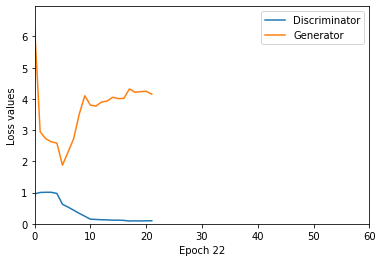

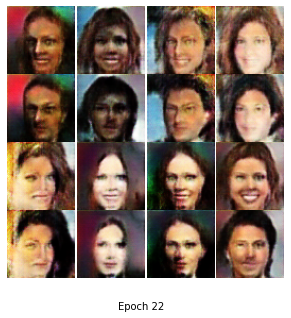

Epoch [23/60], Step [1/686], D_loss: 0.0929, G_loss: 3.5325
Epoch [23/60], Step [2/686], D_loss: 0.1104, G_loss: 3.7417
Epoch [23/60], Step [3/686], D_loss: 0.0481, G_loss: 4.1766
Epoch [23/60], Step [4/686], D_loss: 0.0988, G_loss: 3.4669
Epoch [23/60], Step [5/686], D_loss: 0.1294, G_loss: 3.4542
Epoch [23/60], Step [6/686], D_loss: 0.0827, G_loss: 3.9277
Epoch [23/60], Step [7/686], D_loss: 0.0799, G_loss: 3.2370
Epoch [23/60], Step [8/686], D_loss: 0.0992, G_loss: 4.0534
Epoch [23/60], Step [9/686], D_loss: 0.1230, G_loss: 3.0069
Epoch [23/60], Step [10/686], D_loss: 0.0947, G_loss: 3.8997
Epoch [23/60], Step [11/686], D_loss: 0.0749, G_loss: 2.5497
Epoch [23/60], Step [12/686], D_loss: 0.0726, G_loss: 4.7684
Epoch [23/60], Step [13/686], D_loss: 0.0979, G_loss: 5.5293
Epoch [23/60], Step [14/686], D_loss: 0.1777, G_loss: 4.0513
Epoch [23/60], Step [15/686], D_loss: 0.0670, G_loss: 4.1744
Epoch [23/60], Step [16/686], D_loss: 0.0491, G_loss: 4.6497
Epoch [23/60], Step [17/686], D_l

Epoch [23/60], Step [135/686], D_loss: 0.1707, G_loss: 3.6605
Epoch [23/60], Step [136/686], D_loss: 0.1188, G_loss: 3.8725
Epoch [23/60], Step [137/686], D_loss: 0.0944, G_loss: 4.5187
Epoch [23/60], Step [138/686], D_loss: 0.0660, G_loss: 4.1364
Epoch [23/60], Step [139/686], D_loss: 0.1691, G_loss: 4.8267
Epoch [23/60], Step [140/686], D_loss: 0.1007, G_loss: 4.5515
Epoch [23/60], Step [141/686], D_loss: 0.0791, G_loss: 4.6163
Epoch [23/60], Step [142/686], D_loss: 0.0729, G_loss: 4.0434
Epoch [23/60], Step [143/686], D_loss: 0.0806, G_loss: 4.4724
Epoch [23/60], Step [144/686], D_loss: 0.0591, G_loss: 4.2312
Epoch [23/60], Step [145/686], D_loss: 0.1540, G_loss: 5.3009
Epoch [23/60], Step [146/686], D_loss: 0.0511, G_loss: 5.1037
Epoch [23/60], Step [147/686], D_loss: 0.1701, G_loss: 4.1257
Epoch [23/60], Step [148/686], D_loss: 0.0662, G_loss: 4.7663
Epoch [23/60], Step [149/686], D_loss: 0.1238, G_loss: 4.5025
Epoch [23/60], Step [150/686], D_loss: 0.0699, G_loss: 3.8731
Epoch [2

Epoch [23/60], Step [268/686], D_loss: 0.0587, G_loss: 4.9493
Epoch [23/60], Step [269/686], D_loss: 0.2299, G_loss: 3.6395
Epoch [23/60], Step [270/686], D_loss: 0.0863, G_loss: 5.0038
Epoch [23/60], Step [271/686], D_loss: 0.0551, G_loss: 4.2407
Epoch [23/60], Step [272/686], D_loss: 0.0784, G_loss: 4.7983
Epoch [23/60], Step [273/686], D_loss: 0.0661, G_loss: 4.0458
Epoch [23/60], Step [274/686], D_loss: 0.1100, G_loss: 3.5888
Epoch [23/60], Step [275/686], D_loss: 0.1420, G_loss: 4.1762
Epoch [23/60], Step [276/686], D_loss: 0.0682, G_loss: 3.3368
Epoch [23/60], Step [277/686], D_loss: 0.1653, G_loss: 3.7052
Epoch [23/60], Step [278/686], D_loss: 0.1372, G_loss: 3.8883
Epoch [23/60], Step [279/686], D_loss: 0.0464, G_loss: 2.7847
Epoch [23/60], Step [280/686], D_loss: 0.0471, G_loss: 4.6851
Epoch [23/60], Step [281/686], D_loss: 0.0943, G_loss: 3.9954
Epoch [23/60], Step [282/686], D_loss: 0.1078, G_loss: 4.8027
Epoch [23/60], Step [283/686], D_loss: 0.0688, G_loss: 5.0091
Epoch [2

Epoch [23/60], Step [401/686], D_loss: 0.0651, G_loss: 4.6013
Epoch [23/60], Step [402/686], D_loss: 0.1658, G_loss: 4.6495
Epoch [23/60], Step [403/686], D_loss: 0.1043, G_loss: 3.3630
Epoch [23/60], Step [404/686], D_loss: 0.0486, G_loss: 4.7901
Epoch [23/60], Step [405/686], D_loss: 0.1234, G_loss: 4.2214
Epoch [23/60], Step [406/686], D_loss: 0.0473, G_loss: 4.4802
Epoch [23/60], Step [407/686], D_loss: 0.0568, G_loss: 4.4501
Epoch [23/60], Step [408/686], D_loss: 0.1703, G_loss: 3.9351
Epoch [23/60], Step [409/686], D_loss: 0.0543, G_loss: 4.3972
Epoch [23/60], Step [410/686], D_loss: 0.0376, G_loss: 4.5383
Epoch [23/60], Step [411/686], D_loss: 0.1557, G_loss: 4.7822
Epoch [23/60], Step [412/686], D_loss: 0.1097, G_loss: 4.5947
Epoch [23/60], Step [413/686], D_loss: 0.1149, G_loss: 4.8053
Epoch [23/60], Step [414/686], D_loss: 0.0509, G_loss: 4.4269
Epoch [23/60], Step [415/686], D_loss: 0.1508, G_loss: 5.4056
Epoch [23/60], Step [416/686], D_loss: 0.0894, G_loss: 4.1531
Epoch [2

Epoch [23/60], Step [534/686], D_loss: 0.0642, G_loss: 4.0037
Epoch [23/60], Step [535/686], D_loss: 0.0854, G_loss: 4.7116
Epoch [23/60], Step [536/686], D_loss: 0.0479, G_loss: 5.2111
Epoch [23/60], Step [537/686], D_loss: 0.1191, G_loss: 5.5593
Epoch [23/60], Step [538/686], D_loss: 0.1317, G_loss: 3.9262
Epoch [23/60], Step [539/686], D_loss: 0.0518, G_loss: 5.7135
Epoch [23/60], Step [540/686], D_loss: 0.0558, G_loss: 4.5603
Epoch [23/60], Step [541/686], D_loss: 0.0774, G_loss: 5.1946
Epoch [23/60], Step [542/686], D_loss: 0.1171, G_loss: 4.4523
Epoch [23/60], Step [543/686], D_loss: 0.0473, G_loss: 4.4936
Epoch [23/60], Step [544/686], D_loss: 0.0482, G_loss: 3.7655
Epoch [23/60], Step [545/686], D_loss: 0.0857, G_loss: 4.3046
Epoch [23/60], Step [546/686], D_loss: 0.0947, G_loss: 3.4703
Epoch [23/60], Step [547/686], D_loss: 0.0484, G_loss: 4.1591
Epoch [23/60], Step [548/686], D_loss: 0.0296, G_loss: 3.1699
Epoch [23/60], Step [549/686], D_loss: 0.1372, G_loss: 4.5502
Epoch [2

Epoch [23/60], Step [667/686], D_loss: 0.0945, G_loss: 4.9682
Epoch [23/60], Step [668/686], D_loss: 0.0455, G_loss: 5.4661
Epoch [23/60], Step [669/686], D_loss: 0.0528, G_loss: 3.9159
Epoch [23/60], Step [670/686], D_loss: 0.0573, G_loss: 4.5321
Epoch [23/60], Step [671/686], D_loss: 0.0647, G_loss: 3.9074
Epoch [23/60], Step [672/686], D_loss: 0.0511, G_loss: 4.0973
Epoch [23/60], Step [673/686], D_loss: 0.1065, G_loss: 4.2221
Epoch [23/60], Step [674/686], D_loss: 0.0491, G_loss: 4.6295
Epoch [23/60], Step [675/686], D_loss: 0.0955, G_loss: 4.2652
Epoch [23/60], Step [676/686], D_loss: 0.0451, G_loss: 4.8344
Epoch [23/60], Step [677/686], D_loss: 0.0492, G_loss: 5.9106
Epoch [23/60], Step [678/686], D_loss: 0.0891, G_loss: 4.4751
Epoch [23/60], Step [679/686], D_loss: 0.0953, G_loss: 3.4851
Epoch [23/60], Step [680/686], D_loss: 0.1707, G_loss: 3.5589
Epoch [23/60], Step [681/686], D_loss: 0.0554, G_loss: 4.1630
Epoch [23/60], Step [682/686], D_loss: 0.0806, G_loss: 4.6957
Epoch [2

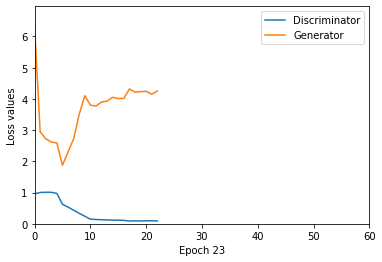

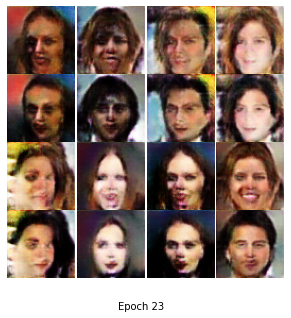

Epoch [24/60], Step [1/686], D_loss: 0.0709, G_loss: 4.9603
Epoch [24/60], Step [2/686], D_loss: 0.0641, G_loss: 3.4603
Epoch [24/60], Step [3/686], D_loss: 0.0302, G_loss: 3.9780
Epoch [24/60], Step [4/686], D_loss: 0.1416, G_loss: 4.2395
Epoch [24/60], Step [5/686], D_loss: 0.1344, G_loss: 4.6392
Epoch [24/60], Step [6/686], D_loss: 0.0887, G_loss: 4.6450
Epoch [24/60], Step [7/686], D_loss: 0.0953, G_loss: 4.2086
Epoch [24/60], Step [8/686], D_loss: 0.1159, G_loss: 2.9810
Epoch [24/60], Step [9/686], D_loss: 0.0864, G_loss: 4.6192
Epoch [24/60], Step [10/686], D_loss: 0.1609, G_loss: 4.8799
Epoch [24/60], Step [11/686], D_loss: 0.0724, G_loss: 4.4997
Epoch [24/60], Step [12/686], D_loss: 0.0537, G_loss: 4.3800
Epoch [24/60], Step [13/686], D_loss: 0.0848, G_loss: 4.0404
Epoch [24/60], Step [14/686], D_loss: 0.1282, G_loss: 3.4091
Epoch [24/60], Step [15/686], D_loss: 0.0839, G_loss: 4.3703
Epoch [24/60], Step [16/686], D_loss: 0.0605, G_loss: 5.3080
Epoch [24/60], Step [17/686], D_l

Epoch [24/60], Step [135/686], D_loss: 0.1197, G_loss: 4.0625
Epoch [24/60], Step [136/686], D_loss: 0.1044, G_loss: 4.5342
Epoch [24/60], Step [137/686], D_loss: 0.1406, G_loss: 3.7603
Epoch [24/60], Step [138/686], D_loss: 0.0768, G_loss: 3.4055
Epoch [24/60], Step [139/686], D_loss: 0.1168, G_loss: 4.5979
Epoch [24/60], Step [140/686], D_loss: 0.0645, G_loss: 4.5232
Epoch [24/60], Step [141/686], D_loss: 0.0599, G_loss: 3.5983
Epoch [24/60], Step [142/686], D_loss: 0.0786, G_loss: 3.7896
Epoch [24/60], Step [143/686], D_loss: 0.0347, G_loss: 4.0362
Epoch [24/60], Step [144/686], D_loss: 0.0547, G_loss: 4.8334
Epoch [24/60], Step [145/686], D_loss: 0.1237, G_loss: 4.0625
Epoch [24/60], Step [146/686], D_loss: 0.0540, G_loss: 4.5168
Epoch [24/60], Step [147/686], D_loss: 0.1514, G_loss: 5.3584
Epoch [24/60], Step [148/686], D_loss: 0.0469, G_loss: 4.8624
Epoch [24/60], Step [149/686], D_loss: 0.1396, G_loss: 4.3014
Epoch [24/60], Step [150/686], D_loss: 0.0484, G_loss: 3.8885
Epoch [2

Epoch [24/60], Step [268/686], D_loss: 0.0406, G_loss: 3.9953
Epoch [24/60], Step [269/686], D_loss: 0.2627, G_loss: 3.5706
Epoch [24/60], Step [270/686], D_loss: 0.0654, G_loss: 4.7005
Epoch [24/60], Step [271/686], D_loss: 0.0620, G_loss: 3.2828
Epoch [24/60], Step [272/686], D_loss: 0.1576, G_loss: 4.0536
Epoch [24/60], Step [273/686], D_loss: 0.0384, G_loss: 4.1952
Epoch [24/60], Step [274/686], D_loss: 0.0466, G_loss: 5.6158
Epoch [24/60], Step [275/686], D_loss: 0.1666, G_loss: 5.6130
Epoch [24/60], Step [276/686], D_loss: 0.0605, G_loss: 5.4252
Epoch [24/60], Step [277/686], D_loss: 0.2547, G_loss: 4.2013
Epoch [24/60], Step [278/686], D_loss: 0.0782, G_loss: 4.2249
Epoch [24/60], Step [279/686], D_loss: 0.0629, G_loss: 3.6070
Epoch [24/60], Step [280/686], D_loss: 0.1292, G_loss: 4.2298
Epoch [24/60], Step [281/686], D_loss: 0.0794, G_loss: 3.9120
Epoch [24/60], Step [282/686], D_loss: 0.0291, G_loss: 5.4579
Epoch [24/60], Step [283/686], D_loss: 0.0972, G_loss: 4.4646
Epoch [2

Epoch [24/60], Step [401/686], D_loss: 0.0623, G_loss: 4.8783
Epoch [24/60], Step [402/686], D_loss: 0.0703, G_loss: 5.3555
Epoch [24/60], Step [403/686], D_loss: 0.0664, G_loss: 4.8567
Epoch [24/60], Step [404/686], D_loss: 0.1035, G_loss: 3.4593
Epoch [24/60], Step [405/686], D_loss: 0.0966, G_loss: 4.7773
Epoch [24/60], Step [406/686], D_loss: 0.0693, G_loss: 4.6785
Epoch [24/60], Step [407/686], D_loss: 0.0940, G_loss: 5.2593
Epoch [24/60], Step [408/686], D_loss: 0.1263, G_loss: 4.2454
Epoch [24/60], Step [409/686], D_loss: 0.0647, G_loss: 4.4525
Epoch [24/60], Step [410/686], D_loss: 0.0279, G_loss: 5.6992
Epoch [24/60], Step [411/686], D_loss: 0.0996, G_loss: 4.9406
Epoch [24/60], Step [412/686], D_loss: 0.0563, G_loss: 4.8236
Epoch [24/60], Step [413/686], D_loss: 0.1685, G_loss: 5.4493
Epoch [24/60], Step [414/686], D_loss: 0.0745, G_loss: 4.4682
Epoch [24/60], Step [415/686], D_loss: 0.1347, G_loss: 4.4020
Epoch [24/60], Step [416/686], D_loss: 0.0443, G_loss: 4.2950
Epoch [2

Epoch [24/60], Step [534/686], D_loss: 0.0383, G_loss: 4.9414
Epoch [24/60], Step [535/686], D_loss: 0.0830, G_loss: 5.0616
Epoch [24/60], Step [536/686], D_loss: 0.0252, G_loss: 4.9862
Epoch [24/60], Step [537/686], D_loss: 0.0769, G_loss: 4.2808
Epoch [24/60], Step [538/686], D_loss: 0.0556, G_loss: 5.2766
Epoch [24/60], Step [539/686], D_loss: 0.0497, G_loss: 4.1855
Epoch [24/60], Step [540/686], D_loss: 0.0296, G_loss: 4.9864
Epoch [24/60], Step [541/686], D_loss: 0.0372, G_loss: 4.6928
Epoch [24/60], Step [542/686], D_loss: 0.0773, G_loss: 4.5532
Epoch [24/60], Step [543/686], D_loss: 0.0680, G_loss: 5.0839
Epoch [24/60], Step [544/686], D_loss: 0.0395, G_loss: 4.0599
Epoch [24/60], Step [545/686], D_loss: 0.0387, G_loss: 4.6406
Epoch [24/60], Step [546/686], D_loss: 0.0826, G_loss: 4.8453
Epoch [24/60], Step [547/686], D_loss: 0.0656, G_loss: 4.0729
Epoch [24/60], Step [548/686], D_loss: 0.0639, G_loss: 4.0811
Epoch [24/60], Step [549/686], D_loss: 0.1411, G_loss: 3.6288
Epoch [2

Epoch [24/60], Step [667/686], D_loss: 0.0780, G_loss: 4.5060
Epoch [24/60], Step [668/686], D_loss: 0.0456, G_loss: 3.8297
Epoch [24/60], Step [669/686], D_loss: 0.0603, G_loss: 5.1013
Epoch [24/60], Step [670/686], D_loss: 0.0304, G_loss: 3.8108
Epoch [24/60], Step [671/686], D_loss: 0.0557, G_loss: 5.6349
Epoch [24/60], Step [672/686], D_loss: 0.0715, G_loss: 4.0809
Epoch [24/60], Step [673/686], D_loss: 0.0415, G_loss: 4.9839
Epoch [24/60], Step [674/686], D_loss: 0.0409, G_loss: 4.9900
Epoch [24/60], Step [675/686], D_loss: 0.0608, G_loss: 5.2784
Epoch [24/60], Step [676/686], D_loss: 0.0622, G_loss: 5.0208
Epoch [24/60], Step [677/686], D_loss: 0.1761, G_loss: 5.1649
Epoch [24/60], Step [678/686], D_loss: 0.0631, G_loss: 5.5487
Epoch [24/60], Step [679/686], D_loss: 0.1237, G_loss: 5.2928
Epoch [24/60], Step [680/686], D_loss: 0.0781, G_loss: 3.5495
Epoch [24/60], Step [681/686], D_loss: 0.0605, G_loss: 3.6092
Epoch [24/60], Step [682/686], D_loss: 0.0624, G_loss: 3.9916
Epoch [2

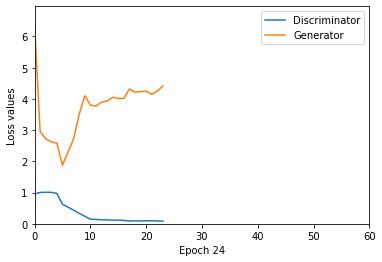

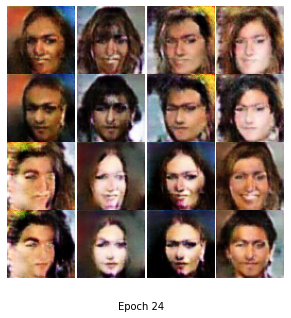

Epoch [25/60], Step [1/686], D_loss: 0.0701, G_loss: 3.9727
Epoch [25/60], Step [2/686], D_loss: 0.0404, G_loss: 4.4316
Epoch [25/60], Step [3/686], D_loss: 0.0868, G_loss: 4.4268
Epoch [25/60], Step [4/686], D_loss: 0.1388, G_loss: 5.0968
Epoch [25/60], Step [5/686], D_loss: 0.1020, G_loss: 3.9243
Epoch [25/60], Step [6/686], D_loss: 0.0459, G_loss: 3.9725
Epoch [25/60], Step [7/686], D_loss: 0.0515, G_loss: 4.4112
Epoch [25/60], Step [8/686], D_loss: 0.0769, G_loss: 4.2295
Epoch [25/60], Step [9/686], D_loss: 0.0465, G_loss: 3.7497
Epoch [25/60], Step [10/686], D_loss: 0.1032, G_loss: 3.3835
Epoch [25/60], Step [11/686], D_loss: 0.0691, G_loss: 4.4127
Epoch [25/60], Step [12/686], D_loss: 0.0396, G_loss: 3.8015
Epoch [25/60], Step [13/686], D_loss: 0.0790, G_loss: 4.6355
Epoch [25/60], Step [14/686], D_loss: 0.0882, G_loss: 5.5249
Epoch [25/60], Step [15/686], D_loss: 0.0653, G_loss: 4.3254
Epoch [25/60], Step [16/686], D_loss: 0.0509, G_loss: 4.1029
Epoch [25/60], Step [17/686], D_l

Epoch [25/60], Step [135/686], D_loss: 0.1033, G_loss: 3.2536
Epoch [25/60], Step [136/686], D_loss: 0.1251, G_loss: 4.6425
Epoch [25/60], Step [137/686], D_loss: 0.0611, G_loss: 5.0885
Epoch [25/60], Step [138/686], D_loss: 0.0587, G_loss: 3.9264
Epoch [25/60], Step [139/686], D_loss: 0.0661, G_loss: 3.9856
Epoch [25/60], Step [140/686], D_loss: 0.0484, G_loss: 3.9508
Epoch [25/60], Step [141/686], D_loss: 0.0572, G_loss: 3.2260
Epoch [25/60], Step [142/686], D_loss: 0.0427, G_loss: 4.1206
Epoch [25/60], Step [143/686], D_loss: 0.0107, G_loss: 4.4629
Epoch [25/60], Step [144/686], D_loss: 0.0527, G_loss: 5.1210
Epoch [25/60], Step [145/686], D_loss: 0.0887, G_loss: 4.7561
Epoch [25/60], Step [146/686], D_loss: 0.0275, G_loss: 5.0827
Epoch [25/60], Step [147/686], D_loss: 0.1688, G_loss: 3.7699
Epoch [25/60], Step [148/686], D_loss: 0.0852, G_loss: 4.6426
Epoch [25/60], Step [149/686], D_loss: 0.1148, G_loss: 3.0569
Epoch [25/60], Step [150/686], D_loss: 0.0660, G_loss: 4.7378
Epoch [2

Epoch [25/60], Step [268/686], D_loss: 0.0328, G_loss: 4.3357
Epoch [25/60], Step [269/686], D_loss: 0.2789, G_loss: 3.3555
Epoch [25/60], Step [270/686], D_loss: 0.1721, G_loss: 4.8527
Epoch [25/60], Step [271/686], D_loss: 0.0512, G_loss: 4.7160
Epoch [25/60], Step [272/686], D_loss: 0.0752, G_loss: 4.8745
Epoch [25/60], Step [273/686], D_loss: 0.0530, G_loss: 4.2180
Epoch [25/60], Step [274/686], D_loss: 0.0508, G_loss: 4.7235
Epoch [25/60], Step [275/686], D_loss: 0.1391, G_loss: 4.6177
Epoch [25/60], Step [276/686], D_loss: 0.0585, G_loss: 3.3301
Epoch [25/60], Step [277/686], D_loss: 0.1934, G_loss: 4.3978
Epoch [25/60], Step [278/686], D_loss: 0.0496, G_loss: 3.2211
Epoch [25/60], Step [279/686], D_loss: 0.1100, G_loss: 3.9977
Epoch [25/60], Step [280/686], D_loss: 0.0600, G_loss: 4.7246
Epoch [25/60], Step [281/686], D_loss: 0.1277, G_loss: 4.6175
Epoch [25/60], Step [282/686], D_loss: 0.0410, G_loss: 4.2990
Epoch [25/60], Step [283/686], D_loss: 0.1069, G_loss: 4.3195
Epoch [2

Epoch [25/60], Step [401/686], D_loss: 0.0494, G_loss: 4.4267
Epoch [25/60], Step [402/686], D_loss: 0.0749, G_loss: 3.6524
Epoch [25/60], Step [403/686], D_loss: 0.0880, G_loss: 4.5630
Epoch [25/60], Step [404/686], D_loss: 0.0843, G_loss: 4.4238
Epoch [25/60], Step [405/686], D_loss: 0.0488, G_loss: 5.3431
Epoch [25/60], Step [406/686], D_loss: 0.0470, G_loss: 4.3489
Epoch [25/60], Step [407/686], D_loss: 0.1785, G_loss: 4.4257
Epoch [25/60], Step [408/686], D_loss: 0.0801, G_loss: 4.5538
Epoch [25/60], Step [409/686], D_loss: 0.0280, G_loss: 4.4564
Epoch [25/60], Step [410/686], D_loss: 0.0340, G_loss: 5.4543
Epoch [25/60], Step [411/686], D_loss: 0.1361, G_loss: 4.2888
Epoch [25/60], Step [412/686], D_loss: 0.0688, G_loss: 4.6931
Epoch [25/60], Step [413/686], D_loss: 0.1611, G_loss: 3.6784
Epoch [25/60], Step [414/686], D_loss: 0.0500, G_loss: 3.6369
Epoch [25/60], Step [415/686], D_loss: 0.0824, G_loss: 4.0925
Epoch [25/60], Step [416/686], D_loss: 0.0876, G_loss: 4.7272
Epoch [2

Epoch [25/60], Step [534/686], D_loss: 0.0839, G_loss: 4.3843
Epoch [25/60], Step [535/686], D_loss: 0.1021, G_loss: 4.2288
Epoch [25/60], Step [536/686], D_loss: 0.0603, G_loss: 4.1710
Epoch [25/60], Step [537/686], D_loss: 0.0876, G_loss: 4.5221
Epoch [25/60], Step [538/686], D_loss: 0.0770, G_loss: 4.2506
Epoch [25/60], Step [539/686], D_loss: 0.0227, G_loss: 4.5365
Epoch [25/60], Step [540/686], D_loss: 0.0448, G_loss: 4.0572
Epoch [25/60], Step [541/686], D_loss: 0.0505, G_loss: 3.7420
Epoch [25/60], Step [542/686], D_loss: 0.1206, G_loss: 4.4844
Epoch [25/60], Step [543/686], D_loss: 0.0493, G_loss: 3.8838
Epoch [25/60], Step [544/686], D_loss: 0.0707, G_loss: 4.5810
Epoch [25/60], Step [545/686], D_loss: 0.0329, G_loss: 4.2668
Epoch [25/60], Step [546/686], D_loss: 0.0780, G_loss: 4.5014
Epoch [25/60], Step [547/686], D_loss: 0.0627, G_loss: 4.2174
Epoch [25/60], Step [548/686], D_loss: 0.0912, G_loss: 5.0135
Epoch [25/60], Step [549/686], D_loss: 0.1514, G_loss: 4.4229
Epoch [2

Epoch [25/60], Step [667/686], D_loss: 0.0501, G_loss: 5.0413
Epoch [25/60], Step [668/686], D_loss: 0.0330, G_loss: 5.1779
Epoch [25/60], Step [669/686], D_loss: 0.0887, G_loss: 5.5412
Epoch [25/60], Step [670/686], D_loss: 0.0635, G_loss: 5.4335
Epoch [25/60], Step [671/686], D_loss: 0.0524, G_loss: 4.6280
Epoch [25/60], Step [672/686], D_loss: 0.0916, G_loss: 5.4352
Epoch [25/60], Step [673/686], D_loss: 0.0324, G_loss: 3.4098
Epoch [25/60], Step [674/686], D_loss: 0.0182, G_loss: 4.7115
Epoch [25/60], Step [675/686], D_loss: 0.0560, G_loss: 4.3931
Epoch [25/60], Step [676/686], D_loss: 0.0307, G_loss: 4.4396
Epoch [25/60], Step [677/686], D_loss: 0.0565, G_loss: 4.3168
Epoch [25/60], Step [678/686], D_loss: 0.0569, G_loss: 5.5355
Epoch [25/60], Step [679/686], D_loss: 0.1172, G_loss: 4.9037
Epoch [25/60], Step [680/686], D_loss: 0.0725, G_loss: 4.7023
Epoch [25/60], Step [681/686], D_loss: 0.0388, G_loss: 4.1205
Epoch [25/60], Step [682/686], D_loss: 0.0411, G_loss: 4.1352
Epoch [2

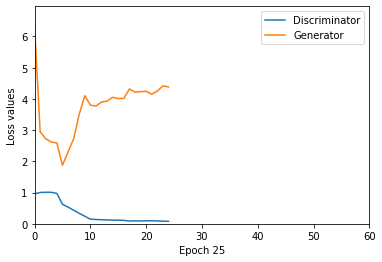

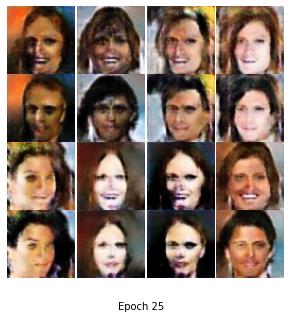

Epoch [26/60], Step [1/686], D_loss: 0.0530, G_loss: 5.6280
Epoch [26/60], Step [2/686], D_loss: 0.0615, G_loss: 4.6773
Epoch [26/60], Step [3/686], D_loss: 0.0378, G_loss: 4.2431
Epoch [26/60], Step [4/686], D_loss: 0.1102, G_loss: 4.4040
Epoch [26/60], Step [5/686], D_loss: 0.0782, G_loss: 4.5467
Epoch [26/60], Step [6/686], D_loss: 0.0573, G_loss: 5.2577
Epoch [26/60], Step [7/686], D_loss: 0.0494, G_loss: 4.7826
Epoch [26/60], Step [8/686], D_loss: 0.0388, G_loss: 4.6210
Epoch [26/60], Step [9/686], D_loss: 0.0980, G_loss: 4.2862
Epoch [26/60], Step [10/686], D_loss: 0.0843, G_loss: 5.1134
Epoch [26/60], Step [11/686], D_loss: 0.0620, G_loss: 4.4104
Epoch [26/60], Step [12/686], D_loss: 0.0330, G_loss: 5.3327
Epoch [26/60], Step [13/686], D_loss: 0.0895, G_loss: 4.1429
Epoch [26/60], Step [14/686], D_loss: 0.0367, G_loss: 3.7421
Epoch [26/60], Step [15/686], D_loss: 0.0925, G_loss: 4.5663
Epoch [26/60], Step [16/686], D_loss: 0.0630, G_loss: 3.9504
Epoch [26/60], Step [17/686], D_l

Epoch [26/60], Step [135/686], D_loss: 0.0728, G_loss: 5.4925
Epoch [26/60], Step [136/686], D_loss: 0.0960, G_loss: 3.7859
Epoch [26/60], Step [137/686], D_loss: 0.1211, G_loss: 4.5095
Epoch [26/60], Step [138/686], D_loss: 0.0331, G_loss: 4.8239
Epoch [26/60], Step [139/686], D_loss: 0.0515, G_loss: 4.9997
Epoch [26/60], Step [140/686], D_loss: 0.0652, G_loss: 3.7646
Epoch [26/60], Step [141/686], D_loss: 0.0464, G_loss: 4.5391
Epoch [26/60], Step [142/686], D_loss: 0.0299, G_loss: 4.7535
Epoch [26/60], Step [143/686], D_loss: 0.0221, G_loss: 4.5903
Epoch [26/60], Step [144/686], D_loss: 0.0562, G_loss: 5.4215
Epoch [26/60], Step [145/686], D_loss: 0.0353, G_loss: 4.7206
Epoch [26/60], Step [146/686], D_loss: 0.0301, G_loss: 4.6122
Epoch [26/60], Step [147/686], D_loss: 0.1124, G_loss: 5.0449
Epoch [26/60], Step [148/686], D_loss: 0.0596, G_loss: 4.6970
Epoch [26/60], Step [149/686], D_loss: 0.0629, G_loss: 4.8059
Epoch [26/60], Step [150/686], D_loss: 0.0573, G_loss: 5.1944
Epoch [2

Epoch [26/60], Step [268/686], D_loss: 0.0582, G_loss: 4.3687
Epoch [26/60], Step [269/686], D_loss: 0.2026, G_loss: 5.0289
Epoch [26/60], Step [270/686], D_loss: 0.0238, G_loss: 4.4981
Epoch [26/60], Step [271/686], D_loss: 0.0868, G_loss: 3.1193
Epoch [26/60], Step [272/686], D_loss: 0.0661, G_loss: 5.2225
Epoch [26/60], Step [273/686], D_loss: 0.0670, G_loss: 4.9317
Epoch [26/60], Step [274/686], D_loss: 0.0481, G_loss: 4.4721
Epoch [26/60], Step [275/686], D_loss: 0.0920, G_loss: 5.1230
Epoch [26/60], Step [276/686], D_loss: 0.0691, G_loss: 3.9278
Epoch [26/60], Step [277/686], D_loss: 0.1844, G_loss: 3.7867
Epoch [26/60], Step [278/686], D_loss: 0.0918, G_loss: 5.9006
Epoch [26/60], Step [279/686], D_loss: 0.0501, G_loss: 5.9439
Epoch [26/60], Step [280/686], D_loss: 0.1337, G_loss: 4.3607
Epoch [26/60], Step [281/686], D_loss: 0.0784, G_loss: 5.4261
Epoch [26/60], Step [282/686], D_loss: 0.0334, G_loss: 4.8731
Epoch [26/60], Step [283/686], D_loss: 0.0672, G_loss: 5.5849
Epoch [2

Epoch [26/60], Step [401/686], D_loss: 0.0565, G_loss: 4.7670
Epoch [26/60], Step [402/686], D_loss: 0.0479, G_loss: 4.7591
Epoch [26/60], Step [403/686], D_loss: 0.1094, G_loss: 4.9471
Epoch [26/60], Step [404/686], D_loss: 0.0701, G_loss: 3.9400
Epoch [26/60], Step [405/686], D_loss: 0.0625, G_loss: 3.7536
Epoch [26/60], Step [406/686], D_loss: 0.0747, G_loss: 4.7179
Epoch [26/60], Step [407/686], D_loss: 0.1191, G_loss: 4.7635
Epoch [26/60], Step [408/686], D_loss: 0.1072, G_loss: 4.4400
Epoch [26/60], Step [409/686], D_loss: 0.0380, G_loss: 3.9011
Epoch [26/60], Step [410/686], D_loss: 0.0226, G_loss: 3.6830
Epoch [26/60], Step [411/686], D_loss: 0.1074, G_loss: 5.3301
Epoch [26/60], Step [412/686], D_loss: 0.0659, G_loss: 3.2775
Epoch [26/60], Step [413/686], D_loss: 0.1337, G_loss: 3.1203
Epoch [26/60], Step [414/686], D_loss: 0.0755, G_loss: 4.5335
Epoch [26/60], Step [415/686], D_loss: 0.1385, G_loss: 4.2253
Epoch [26/60], Step [416/686], D_loss: 0.0993, G_loss: 4.5305
Epoch [2

Epoch [26/60], Step [534/686], D_loss: 0.0870, G_loss: 4.7953
Epoch [26/60], Step [535/686], D_loss: 0.1023, G_loss: 3.8307
Epoch [26/60], Step [536/686], D_loss: 0.0321, G_loss: 4.9661
Epoch [26/60], Step [537/686], D_loss: 0.0864, G_loss: 5.3191
Epoch [26/60], Step [538/686], D_loss: 0.0553, G_loss: 4.4251
Epoch [26/60], Step [539/686], D_loss: 0.0239, G_loss: 4.4403
Epoch [26/60], Step [540/686], D_loss: 0.0395, G_loss: 4.7738
Epoch [26/60], Step [541/686], D_loss: 0.0379, G_loss: 4.8857
Epoch [26/60], Step [542/686], D_loss: 0.1009, G_loss: 5.1195
Epoch [26/60], Step [543/686], D_loss: 0.0346, G_loss: 5.1242
Epoch [26/60], Step [544/686], D_loss: 0.0685, G_loss: 5.0854
Epoch [26/60], Step [545/686], D_loss: 0.0511, G_loss: 5.9846
Epoch [26/60], Step [546/686], D_loss: 0.1407, G_loss: 5.4903
Epoch [26/60], Step [547/686], D_loss: 0.0771, G_loss: 5.3558
Epoch [26/60], Step [548/686], D_loss: 0.0451, G_loss: 5.6023
Epoch [26/60], Step [549/686], D_loss: 0.0732, G_loss: 5.2654
Epoch [2

Epoch [26/60], Step [667/686], D_loss: 0.0433, G_loss: 4.7199
Epoch [26/60], Step [668/686], D_loss: 0.0271, G_loss: 4.3217
Epoch [26/60], Step [669/686], D_loss: 0.0478, G_loss: 4.6363
Epoch [26/60], Step [670/686], D_loss: 0.0340, G_loss: 4.5241
Epoch [26/60], Step [671/686], D_loss: 0.0517, G_loss: 4.5481
Epoch [26/60], Step [672/686], D_loss: 0.0496, G_loss: 4.7938
Epoch [26/60], Step [673/686], D_loss: 0.0460, G_loss: 4.8815
Epoch [26/60], Step [674/686], D_loss: 0.0359, G_loss: 5.0120
Epoch [26/60], Step [675/686], D_loss: 0.0671, G_loss: 5.4451
Epoch [26/60], Step [676/686], D_loss: 0.0544, G_loss: 5.6479
Epoch [26/60], Step [677/686], D_loss: 0.0525, G_loss: 4.7506
Epoch [26/60], Step [678/686], D_loss: 0.0447, G_loss: 4.6379
Epoch [26/60], Step [679/686], D_loss: 0.0694, G_loss: 4.5291
Epoch [26/60], Step [680/686], D_loss: 0.0625, G_loss: 4.8758
Epoch [26/60], Step [681/686], D_loss: 0.0507, G_loss: 3.9487
Epoch [26/60], Step [682/686], D_loss: 0.0475, G_loss: 5.1820
Epoch [2

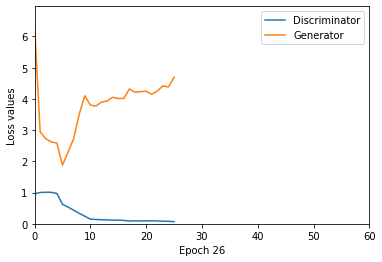

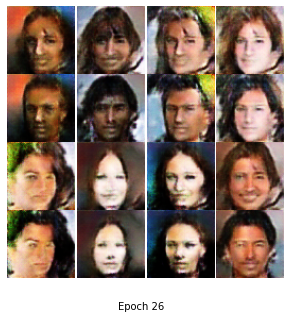

Epoch [27/60], Step [1/686], D_loss: 0.0867, G_loss: 5.8900
Epoch [27/60], Step [2/686], D_loss: 0.0715, G_loss: 5.7471
Epoch [27/60], Step [3/686], D_loss: 0.0500, G_loss: 4.5727
Epoch [27/60], Step [4/686], D_loss: 0.1255, G_loss: 4.0242
Epoch [27/60], Step [5/686], D_loss: 0.0745, G_loss: 4.3315
Epoch [27/60], Step [6/686], D_loss: 0.0660, G_loss: 3.7035
Epoch [27/60], Step [7/686], D_loss: 0.0905, G_loss: 4.5921
Epoch [27/60], Step [8/686], D_loss: 0.0567, G_loss: 4.6613
Epoch [27/60], Step [9/686], D_loss: 0.0420, G_loss: 4.5075
Epoch [27/60], Step [10/686], D_loss: 0.0737, G_loss: 3.8470
Epoch [27/60], Step [11/686], D_loss: 0.0742, G_loss: 4.1444
Epoch [27/60], Step [12/686], D_loss: 0.0335, G_loss: 4.0364
Epoch [27/60], Step [13/686], D_loss: 0.0870, G_loss: 4.5118
Epoch [27/60], Step [14/686], D_loss: 0.0515, G_loss: 4.3184
Epoch [27/60], Step [15/686], D_loss: 0.0767, G_loss: 4.5167
Epoch [27/60], Step [16/686], D_loss: 0.0328, G_loss: 5.1102
Epoch [27/60], Step [17/686], D_l

Epoch [27/60], Step [135/686], D_loss: 0.0665, G_loss: 3.4583
Epoch [27/60], Step [136/686], D_loss: 0.0905, G_loss: 3.8572
Epoch [27/60], Step [137/686], D_loss: 0.1348, G_loss: 4.0700
Epoch [27/60], Step [138/686], D_loss: 0.1230, G_loss: 5.1809
Epoch [27/60], Step [139/686], D_loss: 0.0529, G_loss: 4.6779
Epoch [27/60], Step [140/686], D_loss: 0.0483, G_loss: 5.5502
Epoch [27/60], Step [141/686], D_loss: 0.0544, G_loss: 4.1764
Epoch [27/60], Step [142/686], D_loss: 0.0437, G_loss: 5.0348
Epoch [27/60], Step [143/686], D_loss: 0.0347, G_loss: 5.0424
Epoch [27/60], Step [144/686], D_loss: 0.0820, G_loss: 5.0119
Epoch [27/60], Step [145/686], D_loss: 0.0537, G_loss: 4.9842
Epoch [27/60], Step [146/686], D_loss: 0.0566, G_loss: 3.8860
Epoch [27/60], Step [147/686], D_loss: 0.1347, G_loss: 4.5708
Epoch [27/60], Step [148/686], D_loss: 0.0741, G_loss: 4.7832
Epoch [27/60], Step [149/686], D_loss: 0.0563, G_loss: 3.6105
Epoch [27/60], Step [150/686], D_loss: 0.0666, G_loss: 5.0402
Epoch [2

Epoch [27/60], Step [268/686], D_loss: 0.0384, G_loss: 4.3666
Epoch [27/60], Step [269/686], D_loss: 0.2126, G_loss: 3.8311
Epoch [27/60], Step [270/686], D_loss: 0.0479, G_loss: 3.3305
Epoch [27/60], Step [271/686], D_loss: 0.0630, G_loss: 4.4178
Epoch [27/60], Step [272/686], D_loss: 0.1438, G_loss: 5.2240
Epoch [27/60], Step [273/686], D_loss: 0.0571, G_loss: 4.6924
Epoch [27/60], Step [274/686], D_loss: 0.1062, G_loss: 4.5747
Epoch [27/60], Step [275/686], D_loss: 0.0900, G_loss: 4.4610
Epoch [27/60], Step [276/686], D_loss: 0.0550, G_loss: 3.6084
Epoch [27/60], Step [277/686], D_loss: 0.2053, G_loss: 3.4485
Epoch [27/60], Step [278/686], D_loss: 0.0577, G_loss: 2.7810
Epoch [27/60], Step [279/686], D_loss: 0.0636, G_loss: 3.3646
Epoch [27/60], Step [280/686], D_loss: 0.1723, G_loss: 4.9409
Epoch [27/60], Step [281/686], D_loss: 0.1342, G_loss: 3.5815
Epoch [27/60], Step [282/686], D_loss: 0.0471, G_loss: 4.0019
Epoch [27/60], Step [283/686], D_loss: 0.0859, G_loss: 4.7745
Epoch [2

Epoch [27/60], Step [401/686], D_loss: 0.0773, G_loss: 5.2279
Epoch [27/60], Step [402/686], D_loss: 0.0435, G_loss: 4.7572
Epoch [27/60], Step [403/686], D_loss: 0.0942, G_loss: 4.3494
Epoch [27/60], Step [404/686], D_loss: 0.0989, G_loss: 4.9919
Epoch [27/60], Step [405/686], D_loss: 0.0668, G_loss: 4.3366
Epoch [27/60], Step [406/686], D_loss: 0.0912, G_loss: 4.3653
Epoch [27/60], Step [407/686], D_loss: 0.1084, G_loss: 4.9609
Epoch [27/60], Step [408/686], D_loss: 0.1204, G_loss: 5.1450
Epoch [27/60], Step [409/686], D_loss: 0.0279, G_loss: 3.6434
Epoch [27/60], Step [410/686], D_loss: 0.0338, G_loss: 6.0010
Epoch [27/60], Step [411/686], D_loss: 0.0874, G_loss: 5.0427
Epoch [27/60], Step [412/686], D_loss: 0.0838, G_loss: 4.4600
Epoch [27/60], Step [413/686], D_loss: 0.1661, G_loss: 4.6660
Epoch [27/60], Step [414/686], D_loss: 0.0218, G_loss: 4.1812
Epoch [27/60], Step [415/686], D_loss: 0.1356, G_loss: 4.0590
Epoch [27/60], Step [416/686], D_loss: 0.0965, G_loss: 4.2735
Epoch [2

Epoch [27/60], Step [534/686], D_loss: 0.0630, G_loss: 3.8494
Epoch [27/60], Step [535/686], D_loss: 0.1019, G_loss: 3.8597
Epoch [27/60], Step [536/686], D_loss: 0.0309, G_loss: 4.5679
Epoch [27/60], Step [537/686], D_loss: 0.0776, G_loss: 3.0897
Epoch [27/60], Step [538/686], D_loss: 0.0931, G_loss: 4.8371
Epoch [27/60], Step [539/686], D_loss: 0.0653, G_loss: 4.1992
Epoch [27/60], Step [540/686], D_loss: 0.0577, G_loss: 4.3003
Epoch [27/60], Step [541/686], D_loss: 0.0499, G_loss: 4.5076
Epoch [27/60], Step [542/686], D_loss: 0.0999, G_loss: 3.7756
Epoch [27/60], Step [543/686], D_loss: 0.0354, G_loss: 4.3113
Epoch [27/60], Step [544/686], D_loss: 0.0288, G_loss: 4.1791
Epoch [27/60], Step [545/686], D_loss: 0.0515, G_loss: 4.8486
Epoch [27/60], Step [546/686], D_loss: 0.1369, G_loss: 5.0624
Epoch [27/60], Step [547/686], D_loss: 0.0434, G_loss: 6.1837
Epoch [27/60], Step [548/686], D_loss: 0.0289, G_loss: 4.7583
Epoch [27/60], Step [549/686], D_loss: 0.1218, G_loss: 4.4057
Epoch [2

Epoch [27/60], Step [667/686], D_loss: 0.1081, G_loss: 4.7586
Epoch [27/60], Step [668/686], D_loss: 0.0533, G_loss: 4.7875
Epoch [27/60], Step [669/686], D_loss: 0.0650, G_loss: 4.9178
Epoch [27/60], Step [670/686], D_loss: 0.0261, G_loss: 4.8049
Epoch [27/60], Step [671/686], D_loss: 0.0234, G_loss: 5.0822
Epoch [27/60], Step [672/686], D_loss: 0.0747, G_loss: 4.8090
Epoch [27/60], Step [673/686], D_loss: 0.0375, G_loss: 4.9152
Epoch [27/60], Step [674/686], D_loss: 0.0589, G_loss: 4.7469
Epoch [27/60], Step [675/686], D_loss: 0.0454, G_loss: 3.9249
Epoch [27/60], Step [676/686], D_loss: 0.0504, G_loss: 4.6768
Epoch [27/60], Step [677/686], D_loss: 0.1036, G_loss: 3.8442
Epoch [27/60], Step [678/686], D_loss: 0.0521, G_loss: 5.0484
Epoch [27/60], Step [679/686], D_loss: 0.0808, G_loss: 4.9140
Epoch [27/60], Step [680/686], D_loss: 0.1231, G_loss: 4.7066
Epoch [27/60], Step [681/686], D_loss: 0.0527, G_loss: 6.0005
Epoch [27/60], Step [682/686], D_loss: 0.0595, G_loss: 4.7562
Epoch [2

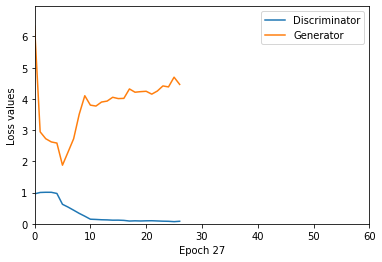

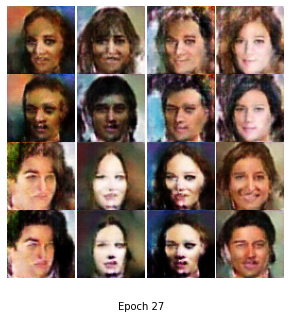

Epoch [28/60], Step [1/686], D_loss: 0.0800, G_loss: 3.8323
Epoch [28/60], Step [2/686], D_loss: 0.0408, G_loss: 4.1466
Epoch [28/60], Step [3/686], D_loss: 0.0366, G_loss: 4.3249
Epoch [28/60], Step [4/686], D_loss: 0.1225, G_loss: 3.9786
Epoch [28/60], Step [5/686], D_loss: 0.0693, G_loss: 4.0068
Epoch [28/60], Step [6/686], D_loss: 0.0610, G_loss: 4.0768
Epoch [28/60], Step [7/686], D_loss: 0.1012, G_loss: 3.7571
Epoch [28/60], Step [8/686], D_loss: 0.1233, G_loss: 4.7179
Epoch [28/60], Step [9/686], D_loss: 0.1009, G_loss: 4.7024
Epoch [28/60], Step [10/686], D_loss: 0.0790, G_loss: 6.2308
Epoch [28/60], Step [11/686], D_loss: 0.0542, G_loss: 4.6202
Epoch [28/60], Step [12/686], D_loss: 0.0591, G_loss: 4.9004
Epoch [28/60], Step [13/686], D_loss: 0.0777, G_loss: 3.4027
Epoch [28/60], Step [14/686], D_loss: 0.0528, G_loss: 4.4024
Epoch [28/60], Step [15/686], D_loss: 0.0856, G_loss: 4.8409
Epoch [28/60], Step [16/686], D_loss: 0.0627, G_loss: 4.5656
Epoch [28/60], Step [17/686], D_l

Epoch [28/60], Step [135/686], D_loss: 0.1380, G_loss: 4.1984
Epoch [28/60], Step [136/686], D_loss: 0.0702, G_loss: 4.9365
Epoch [28/60], Step [137/686], D_loss: 0.0713, G_loss: 3.8394
Epoch [28/60], Step [138/686], D_loss: 0.1128, G_loss: 4.7925
Epoch [28/60], Step [139/686], D_loss: 0.0562, G_loss: 4.5770
Epoch [28/60], Step [140/686], D_loss: 0.0343, G_loss: 4.2873
Epoch [28/60], Step [141/686], D_loss: 0.0467, G_loss: 3.6004
Epoch [28/60], Step [142/686], D_loss: 0.0722, G_loss: 5.8141
Epoch [28/60], Step [143/686], D_loss: 0.0449, G_loss: 4.7535
Epoch [28/60], Step [144/686], D_loss: 0.0560, G_loss: 5.4901
Epoch [28/60], Step [145/686], D_loss: 0.0545, G_loss: 5.3539
Epoch [28/60], Step [146/686], D_loss: 0.0648, G_loss: 5.1134
Epoch [28/60], Step [147/686], D_loss: 0.1487, G_loss: 5.1131
Epoch [28/60], Step [148/686], D_loss: 0.0383, G_loss: 4.7774
Epoch [28/60], Step [149/686], D_loss: 0.0475, G_loss: 3.4841
Epoch [28/60], Step [150/686], D_loss: 0.0466, G_loss: 4.8065
Epoch [2

Epoch [28/60], Step [268/686], D_loss: 0.0291, G_loss: 5.1955
Epoch [28/60], Step [269/686], D_loss: 0.1574, G_loss: 5.0889
Epoch [28/60], Step [270/686], D_loss: 0.0180, G_loss: 2.7155
Epoch [28/60], Step [271/686], D_loss: 0.0404, G_loss: 4.7595
Epoch [28/60], Step [272/686], D_loss: 0.0694, G_loss: 3.9418
Epoch [28/60], Step [273/686], D_loss: 0.0366, G_loss: 4.7287
Epoch [28/60], Step [274/686], D_loss: 0.0602, G_loss: 4.5161
Epoch [28/60], Step [275/686], D_loss: 0.0706, G_loss: 3.9108
Epoch [28/60], Step [276/686], D_loss: 0.0469, G_loss: 5.4363
Epoch [28/60], Step [277/686], D_loss: 0.1512, G_loss: 4.0244
Epoch [28/60], Step [278/686], D_loss: 0.0917, G_loss: 4.1917
Epoch [28/60], Step [279/686], D_loss: 0.0263, G_loss: 4.5179
Epoch [28/60], Step [280/686], D_loss: 0.0648, G_loss: 4.2953
Epoch [28/60], Step [281/686], D_loss: 0.0893, G_loss: 5.1512
Epoch [28/60], Step [282/686], D_loss: 0.0692, G_loss: 3.5927
Epoch [28/60], Step [283/686], D_loss: 0.0869, G_loss: 4.9376
Epoch [2

Epoch [28/60], Step [401/686], D_loss: 0.0577, G_loss: 5.5007
Epoch [28/60], Step [402/686], D_loss: 0.0905, G_loss: 4.5250
Epoch [28/60], Step [403/686], D_loss: 0.0991, G_loss: 5.0574
Epoch [28/60], Step [404/686], D_loss: 0.0767, G_loss: 5.0474
Epoch [28/60], Step [405/686], D_loss: 0.0590, G_loss: 4.3251
Epoch [28/60], Step [406/686], D_loss: 0.0623, G_loss: 3.9119
Epoch [28/60], Step [407/686], D_loss: 0.0823, G_loss: 4.7817
Epoch [28/60], Step [408/686], D_loss: 0.1121, G_loss: 5.0130
Epoch [28/60], Step [409/686], D_loss: 0.0333, G_loss: 5.7758
Epoch [28/60], Step [410/686], D_loss: 0.0203, G_loss: 4.4195
Epoch [28/60], Step [411/686], D_loss: 0.1140, G_loss: 5.0810
Epoch [28/60], Step [412/686], D_loss: 0.0756, G_loss: 4.6684
Epoch [28/60], Step [413/686], D_loss: 0.1346, G_loss: 6.0155
Epoch [28/60], Step [414/686], D_loss: 0.0476, G_loss: 3.9353
Epoch [28/60], Step [415/686], D_loss: 0.1125, G_loss: 4.5157
Epoch [28/60], Step [416/686], D_loss: 0.0470, G_loss: 5.4656
Epoch [2

Epoch [28/60], Step [534/686], D_loss: 0.0286, G_loss: 5.2067
Epoch [28/60], Step [535/686], D_loss: 0.0739, G_loss: 4.7407
Epoch [28/60], Step [536/686], D_loss: 0.0184, G_loss: 4.2995
Epoch [28/60], Step [537/686], D_loss: 0.0596, G_loss: 4.7744
Epoch [28/60], Step [538/686], D_loss: 0.0758, G_loss: 5.2461
Epoch [28/60], Step [539/686], D_loss: 0.0424, G_loss: 5.0828
Epoch [28/60], Step [540/686], D_loss: 0.0503, G_loss: 5.1942
Epoch [28/60], Step [541/686], D_loss: 0.0506, G_loss: 5.5786
Epoch [28/60], Step [542/686], D_loss: 0.0840, G_loss: 4.5857
Epoch [28/60], Step [543/686], D_loss: 0.0176, G_loss: 4.6183
Epoch [28/60], Step [544/686], D_loss: 0.0386, G_loss: 4.1739
Epoch [28/60], Step [545/686], D_loss: 0.0246, G_loss: 5.1355
Epoch [28/60], Step [546/686], D_loss: 0.0752, G_loss: 4.9005
Epoch [28/60], Step [547/686], D_loss: 0.0505, G_loss: 4.4495
Epoch [28/60], Step [548/686], D_loss: 0.0272, G_loss: 3.9901
Epoch [28/60], Step [549/686], D_loss: 0.0671, G_loss: 4.6605
Epoch [2

Epoch [28/60], Step [667/686], D_loss: 0.0666, G_loss: 5.1330
Epoch [28/60], Step [668/686], D_loss: 0.0224, G_loss: 4.2176
Epoch [28/60], Step [669/686], D_loss: 0.0379, G_loss: 4.5578
Epoch [28/60], Step [670/686], D_loss: 0.0653, G_loss: 5.7695
Epoch [28/60], Step [671/686], D_loss: 0.0180, G_loss: 5.4325
Epoch [28/60], Step [672/686], D_loss: 0.0561, G_loss: 5.6016
Epoch [28/60], Step [673/686], D_loss: 0.0309, G_loss: 5.0765
Epoch [28/60], Step [674/686], D_loss: 0.0249, G_loss: 5.0417
Epoch [28/60], Step [675/686], D_loss: 0.0567, G_loss: 5.8386
Epoch [28/60], Step [676/686], D_loss: 0.0489, G_loss: 4.7893
Epoch [28/60], Step [677/686], D_loss: 0.0405, G_loss: 5.8694
Epoch [28/60], Step [678/686], D_loss: 0.0590, G_loss: 4.7899
Epoch [28/60], Step [679/686], D_loss: 0.0927, G_loss: 4.8452
Epoch [28/60], Step [680/686], D_loss: 0.0492, G_loss: 5.0403
Epoch [28/60], Step [681/686], D_loss: 0.0326, G_loss: 4.6630
Epoch [28/60], Step [682/686], D_loss: 0.0501, G_loss: 5.0260
Epoch [2

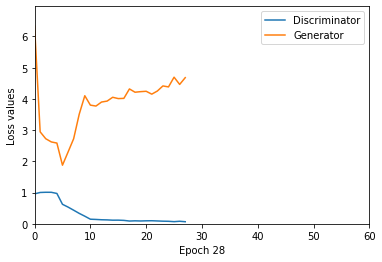

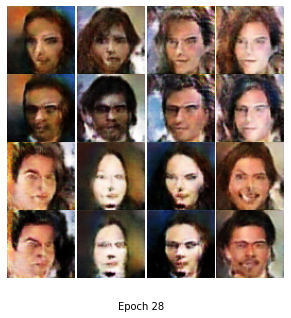

Epoch [29/60], Step [1/686], D_loss: 0.0552, G_loss: 4.6385
Epoch [29/60], Step [2/686], D_loss: 0.0588, G_loss: 5.5284
Epoch [29/60], Step [3/686], D_loss: 0.0305, G_loss: 4.9135
Epoch [29/60], Step [4/686], D_loss: 0.0786, G_loss: 5.2399
Epoch [29/60], Step [5/686], D_loss: 0.1055, G_loss: 4.1954
Epoch [29/60], Step [6/686], D_loss: 0.0482, G_loss: 4.4874
Epoch [29/60], Step [7/686], D_loss: 0.0978, G_loss: 3.9759
Epoch [29/60], Step [8/686], D_loss: 0.1023, G_loss: 4.3122
Epoch [29/60], Step [9/686], D_loss: 0.0480, G_loss: 5.3235
Epoch [29/60], Step [10/686], D_loss: 0.0933, G_loss: 4.8781
Epoch [29/60], Step [11/686], D_loss: 0.0822, G_loss: 5.5817
Epoch [29/60], Step [12/686], D_loss: 0.0591, G_loss: 5.5057
Epoch [29/60], Step [13/686], D_loss: 0.0802, G_loss: 4.7331
Epoch [29/60], Step [14/686], D_loss: 0.0641, G_loss: 5.6389
Epoch [29/60], Step [15/686], D_loss: 0.0204, G_loss: 5.4345
Epoch [29/60], Step [16/686], D_loss: 0.0485, G_loss: 6.4398
Epoch [29/60], Step [17/686], D_l

Epoch [29/60], Step [135/686], D_loss: 0.0606, G_loss: 4.7965
Epoch [29/60], Step [136/686], D_loss: 0.0516, G_loss: 4.6993
Epoch [29/60], Step [137/686], D_loss: 0.1157, G_loss: 5.2738
Epoch [29/60], Step [138/686], D_loss: 0.0508, G_loss: 5.0118
Epoch [29/60], Step [139/686], D_loss: 0.0958, G_loss: 4.5169
Epoch [29/60], Step [140/686], D_loss: 0.0364, G_loss: 4.2669
Epoch [29/60], Step [141/686], D_loss: 0.0681, G_loss: 4.0512
Epoch [29/60], Step [142/686], D_loss: 0.0450, G_loss: 4.5558
Epoch [29/60], Step [143/686], D_loss: 0.0212, G_loss: 4.5728
Epoch [29/60], Step [144/686], D_loss: 0.0660, G_loss: 5.3047
Epoch [29/60], Step [145/686], D_loss: 0.0710, G_loss: 4.4216
Epoch [29/60], Step [146/686], D_loss: 0.0276, G_loss: 4.8104
Epoch [29/60], Step [147/686], D_loss: 0.1049, G_loss: 2.9043
Epoch [29/60], Step [148/686], D_loss: 0.0636, G_loss: 4.4775
Epoch [29/60], Step [149/686], D_loss: 0.0797, G_loss: 4.7550
Epoch [29/60], Step [150/686], D_loss: 0.0349, G_loss: 5.6169
Epoch [2

Epoch [29/60], Step [268/686], D_loss: 0.0463, G_loss: 4.8753
Epoch [29/60], Step [269/686], D_loss: 0.1764, G_loss: 4.5727
Epoch [29/60], Step [270/686], D_loss: 0.0395, G_loss: 4.3942
Epoch [29/60], Step [271/686], D_loss: 0.0841, G_loss: 3.4119
Epoch [29/60], Step [272/686], D_loss: 0.0979, G_loss: 5.5422
Epoch [29/60], Step [273/686], D_loss: 0.0442, G_loss: 3.5840
Epoch [29/60], Step [274/686], D_loss: 0.0598, G_loss: 5.2396
Epoch [29/60], Step [275/686], D_loss: 0.0737, G_loss: 4.8417
Epoch [29/60], Step [276/686], D_loss: 0.0718, G_loss: 5.1617
Epoch [29/60], Step [277/686], D_loss: 0.2020, G_loss: 4.2457
Epoch [29/60], Step [278/686], D_loss: 0.0678, G_loss: 5.1983
Epoch [29/60], Step [279/686], D_loss: 0.1291, G_loss: 3.8346
Epoch [29/60], Step [280/686], D_loss: 0.0992, G_loss: 5.4549
Epoch [29/60], Step [281/686], D_loss: 0.0844, G_loss: 4.6176
Epoch [29/60], Step [282/686], D_loss: 0.0411, G_loss: 4.5957
Epoch [29/60], Step [283/686], D_loss: 0.0443, G_loss: 4.3412
Epoch [2

Epoch [29/60], Step [401/686], D_loss: 0.0566, G_loss: 4.5299
Epoch [29/60], Step [402/686], D_loss: 0.0792, G_loss: 5.8645
Epoch [29/60], Step [403/686], D_loss: 0.1337, G_loss: 4.3831
Epoch [29/60], Step [404/686], D_loss: 0.0575, G_loss: 3.9773
Epoch [29/60], Step [405/686], D_loss: 0.0747, G_loss: 3.7059
Epoch [29/60], Step [406/686], D_loss: 0.0489, G_loss: 4.9149
Epoch [29/60], Step [407/686], D_loss: 0.0503, G_loss: 4.9633
Epoch [29/60], Step [408/686], D_loss: 0.0540, G_loss: 4.4646
Epoch [29/60], Step [409/686], D_loss: 0.1124, G_loss: 4.0851
Epoch [29/60], Step [410/686], D_loss: 0.0388, G_loss: 4.9116
Epoch [29/60], Step [411/686], D_loss: 0.0988, G_loss: 4.7698
Epoch [29/60], Step [412/686], D_loss: 0.0380, G_loss: 5.4257
Epoch [29/60], Step [413/686], D_loss: 0.0943, G_loss: 4.2063
Epoch [29/60], Step [414/686], D_loss: 0.0493, G_loss: 4.0205
Epoch [29/60], Step [415/686], D_loss: 0.0860, G_loss: 4.0349
Epoch [29/60], Step [416/686], D_loss: 0.0508, G_loss: 4.0552
Epoch [2

Epoch [29/60], Step [534/686], D_loss: 0.0518, G_loss: 4.0591
Epoch [29/60], Step [535/686], D_loss: 0.1356, G_loss: 4.9912
Epoch [29/60], Step [536/686], D_loss: 0.0311, G_loss: 4.5692
Epoch [29/60], Step [537/686], D_loss: 0.0896, G_loss: 5.0488
Epoch [29/60], Step [538/686], D_loss: 0.0891, G_loss: 4.5838
Epoch [29/60], Step [539/686], D_loss: 0.0341, G_loss: 4.3700
Epoch [29/60], Step [540/686], D_loss: 0.0319, G_loss: 4.0873
Epoch [29/60], Step [541/686], D_loss: 0.0314, G_loss: 5.4420
Epoch [29/60], Step [542/686], D_loss: 0.0601, G_loss: 4.3546
Epoch [29/60], Step [543/686], D_loss: 0.0312, G_loss: 4.6420
Epoch [29/60], Step [544/686], D_loss: 0.0473, G_loss: 5.1014
Epoch [29/60], Step [545/686], D_loss: 0.0357, G_loss: 5.5746
Epoch [29/60], Step [546/686], D_loss: 0.0832, G_loss: 4.1110
Epoch [29/60], Step [547/686], D_loss: 0.0314, G_loss: 3.1414
Epoch [29/60], Step [548/686], D_loss: 0.0438, G_loss: 4.9655
Epoch [29/60], Step [549/686], D_loss: 0.0829, G_loss: 4.4632
Epoch [2

Epoch [29/60], Step [667/686], D_loss: 0.0582, G_loss: 4.9582
Epoch [29/60], Step [668/686], D_loss: 0.0701, G_loss: 4.7589
Epoch [29/60], Step [669/686], D_loss: 0.0336, G_loss: 5.0621
Epoch [29/60], Step [670/686], D_loss: 0.0257, G_loss: 4.7040
Epoch [29/60], Step [671/686], D_loss: 0.0261, G_loss: 4.5708
Epoch [29/60], Step [672/686], D_loss: 0.0568, G_loss: 4.5197
Epoch [29/60], Step [673/686], D_loss: 0.0265, G_loss: 5.1880
Epoch [29/60], Step [674/686], D_loss: 0.0428, G_loss: 4.4997
Epoch [29/60], Step [675/686], D_loss: 0.0621, G_loss: 5.2437
Epoch [29/60], Step [676/686], D_loss: 0.0778, G_loss: 5.1375
Epoch [29/60], Step [677/686], D_loss: 0.0422, G_loss: 4.6887
Epoch [29/60], Step [678/686], D_loss: 0.0387, G_loss: 4.9433
Epoch [29/60], Step [679/686], D_loss: 0.0630, G_loss: 4.0441
Epoch [29/60], Step [680/686], D_loss: 0.0595, G_loss: 4.7089
Epoch [29/60], Step [681/686], D_loss: 0.0260, G_loss: 4.3893
Epoch [29/60], Step [682/686], D_loss: 0.0405, G_loss: 4.4887
Epoch [2

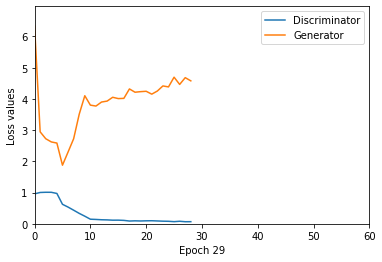

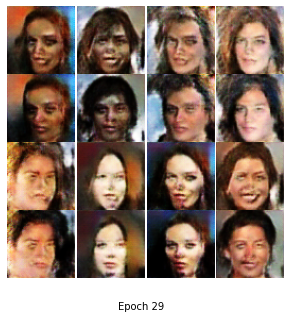

Epoch [30/60], Step [1/686], D_loss: 0.0837, G_loss: 4.1383
Epoch [30/60], Step [2/686], D_loss: 0.0454, G_loss: 4.3335
Epoch [30/60], Step [3/686], D_loss: 0.0705, G_loss: 4.4716
Epoch [30/60], Step [4/686], D_loss: 0.0957, G_loss: 4.9702
Epoch [30/60], Step [5/686], D_loss: 0.0689, G_loss: 5.0767
Epoch [30/60], Step [6/686], D_loss: 0.0562, G_loss: 3.6076
Epoch [30/60], Step [7/686], D_loss: 0.0857, G_loss: 3.6172
Epoch [30/60], Step [8/686], D_loss: 0.0434, G_loss: 3.9948
Epoch [30/60], Step [9/686], D_loss: 0.0644, G_loss: 4.8456
Epoch [30/60], Step [10/686], D_loss: 0.0699, G_loss: 4.6111
Epoch [30/60], Step [11/686], D_loss: 0.0635, G_loss: 3.6074
Epoch [30/60], Step [12/686], D_loss: 0.0433, G_loss: 3.3816
Epoch [30/60], Step [13/686], D_loss: 0.0507, G_loss: 4.6279
Epoch [30/60], Step [14/686], D_loss: 0.0896, G_loss: 4.6468
Epoch [30/60], Step [15/686], D_loss: 0.0286, G_loss: 5.1093
Epoch [30/60], Step [16/686], D_loss: 0.0261, G_loss: 4.0798
Epoch [30/60], Step [17/686], D_l

Epoch [30/60], Step [135/686], D_loss: 0.0686, G_loss: 6.6416
Epoch [30/60], Step [136/686], D_loss: 0.1227, G_loss: 4.4888
Epoch [30/60], Step [137/686], D_loss: 0.0641, G_loss: 4.2169
Epoch [30/60], Step [138/686], D_loss: 0.0597, G_loss: 4.2065
Epoch [30/60], Step [139/686], D_loss: 0.0519, G_loss: 5.1833
Epoch [30/60], Step [140/686], D_loss: 0.0669, G_loss: 4.0237
Epoch [30/60], Step [141/686], D_loss: 0.0297, G_loss: 4.9024
Epoch [30/60], Step [142/686], D_loss: 0.0591, G_loss: 4.6763
Epoch [30/60], Step [143/686], D_loss: 0.0351, G_loss: 4.7883
Epoch [30/60], Step [144/686], D_loss: 0.0662, G_loss: 4.9290
Epoch [30/60], Step [145/686], D_loss: 0.0677, G_loss: 5.2737
Epoch [30/60], Step [146/686], D_loss: 0.0533, G_loss: 5.4816
Epoch [30/60], Step [147/686], D_loss: 0.1201, G_loss: 4.0148
Epoch [30/60], Step [148/686], D_loss: 0.0455, G_loss: 4.6242
Epoch [30/60], Step [149/686], D_loss: 0.0603, G_loss: 5.3126
Epoch [30/60], Step [150/686], D_loss: 0.0538, G_loss: 4.5005
Epoch [3

Epoch [30/60], Step [268/686], D_loss: 0.0404, G_loss: 4.8151
Epoch [30/60], Step [269/686], D_loss: 0.2222, G_loss: 4.7545
Epoch [30/60], Step [270/686], D_loss: 0.0455, G_loss: 4.4037
Epoch [30/60], Step [271/686], D_loss: 0.0426, G_loss: 4.1923
Epoch [30/60], Step [272/686], D_loss: 0.0475, G_loss: 4.6392
Epoch [30/60], Step [273/686], D_loss: 0.0575, G_loss: 3.8999
Epoch [30/60], Step [274/686], D_loss: 0.1015, G_loss: 4.8394
Epoch [30/60], Step [275/686], D_loss: 0.1439, G_loss: 4.9865
Epoch [30/60], Step [276/686], D_loss: 0.0355, G_loss: 4.9651
Epoch [30/60], Step [277/686], D_loss: 0.2180, G_loss: 5.1345
Epoch [30/60], Step [278/686], D_loss: 0.0974, G_loss: 3.7559
Epoch [30/60], Step [279/686], D_loss: 0.0904, G_loss: 3.8387
Epoch [30/60], Step [280/686], D_loss: 0.0514, G_loss: 4.1262
Epoch [30/60], Step [281/686], D_loss: 0.0746, G_loss: 5.2550
Epoch [30/60], Step [282/686], D_loss: 0.0837, G_loss: 5.2775
Epoch [30/60], Step [283/686], D_loss: 0.0905, G_loss: 4.9415
Epoch [3

Epoch [30/60], Step [401/686], D_loss: 0.0575, G_loss: 4.9696
Epoch [30/60], Step [402/686], D_loss: 0.1004, G_loss: 4.7356
Epoch [30/60], Step [403/686], D_loss: 0.0870, G_loss: 4.2823
Epoch [30/60], Step [404/686], D_loss: 0.0973, G_loss: 3.9808
Epoch [30/60], Step [405/686], D_loss: 0.1256, G_loss: 4.9629
Epoch [30/60], Step [406/686], D_loss: 0.0453, G_loss: 5.3766
Epoch [30/60], Step [407/686], D_loss: 0.0519, G_loss: 5.3803
Epoch [30/60], Step [408/686], D_loss: 0.0762, G_loss: 4.4881
Epoch [30/60], Step [409/686], D_loss: 0.0156, G_loss: 4.0530
Epoch [30/60], Step [410/686], D_loss: 0.0684, G_loss: 4.9135
Epoch [30/60], Step [411/686], D_loss: 0.1126, G_loss: 3.7247
Epoch [30/60], Step [412/686], D_loss: 0.0550, G_loss: 4.4956
Epoch [30/60], Step [413/686], D_loss: 0.0935, G_loss: 3.9244
Epoch [30/60], Step [414/686], D_loss: 0.0430, G_loss: 4.8860
Epoch [30/60], Step [415/686], D_loss: 0.0710, G_loss: 4.5412
Epoch [30/60], Step [416/686], D_loss: 0.0304, G_loss: 3.5152
Epoch [3

Epoch [30/60], Step [534/686], D_loss: 0.0607, G_loss: 5.5820
Epoch [30/60], Step [535/686], D_loss: 0.1037, G_loss: 4.6353
Epoch [30/60], Step [536/686], D_loss: 0.0775, G_loss: 4.5126
Epoch [30/60], Step [537/686], D_loss: 0.0718, G_loss: 4.8103
Epoch [30/60], Step [538/686], D_loss: 0.1184, G_loss: 4.6821
Epoch [30/60], Step [539/686], D_loss: 0.0479, G_loss: 5.8326
Epoch [30/60], Step [540/686], D_loss: 0.0370, G_loss: 3.9611
Epoch [30/60], Step [541/686], D_loss: 0.0416, G_loss: 4.7024
Epoch [30/60], Step [542/686], D_loss: 0.0800, G_loss: 4.5720
Epoch [30/60], Step [543/686], D_loss: 0.0361, G_loss: 4.8386
Epoch [30/60], Step [544/686], D_loss: 0.0687, G_loss: 4.4859
Epoch [30/60], Step [545/686], D_loss: 0.0405, G_loss: 4.1603
Epoch [30/60], Step [546/686], D_loss: 0.1502, G_loss: 4.7964
Epoch [30/60], Step [547/686], D_loss: 0.0548, G_loss: 4.7706
Epoch [30/60], Step [548/686], D_loss: 0.0487, G_loss: 4.2141
Epoch [30/60], Step [549/686], D_loss: 0.0597, G_loss: 5.1483
Epoch [3

Epoch [30/60], Step [667/686], D_loss: 0.0824, G_loss: 3.9432
Epoch [30/60], Step [668/686], D_loss: 0.0453, G_loss: 4.8589
Epoch [30/60], Step [669/686], D_loss: 0.0565, G_loss: 5.3196
Epoch [30/60], Step [670/686], D_loss: 0.0729, G_loss: 3.8363
Epoch [30/60], Step [671/686], D_loss: 0.0376, G_loss: 6.2637
Epoch [30/60], Step [672/686], D_loss: 0.0825, G_loss: 4.7447
Epoch [30/60], Step [673/686], D_loss: 0.0391, G_loss: 4.9847
Epoch [30/60], Step [674/686], D_loss: 0.0179, G_loss: 5.7417
Epoch [30/60], Step [675/686], D_loss: 0.0860, G_loss: 4.2365
Epoch [30/60], Step [676/686], D_loss: 0.0281, G_loss: 5.3793
Epoch [30/60], Step [677/686], D_loss: 0.0673, G_loss: 3.9938
Epoch [30/60], Step [678/686], D_loss: 0.0404, G_loss: 5.3576
Epoch [30/60], Step [679/686], D_loss: 0.0804, G_loss: 5.2535
Epoch [30/60], Step [680/686], D_loss: 0.0709, G_loss: 4.1097
Epoch [30/60], Step [681/686], D_loss: 0.0666, G_loss: 5.1244
Epoch [30/60], Step [682/686], D_loss: 0.0904, G_loss: 5.6037
Epoch [3

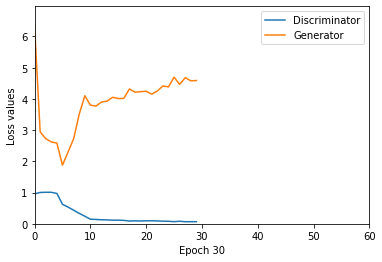

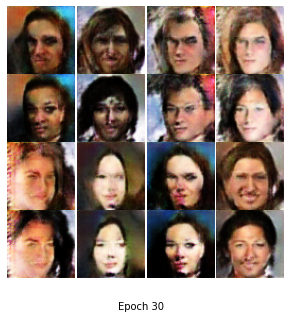

Epoch [31/60], Step [1/686], D_loss: 0.0600, G_loss: 4.8258
Epoch [31/60], Step [2/686], D_loss: 0.0227, G_loss: 5.4249
Epoch [31/60], Step [3/686], D_loss: 0.0372, G_loss: 5.1032
Epoch [31/60], Step [4/686], D_loss: 0.1320, G_loss: 4.9422
Epoch [31/60], Step [5/686], D_loss: 0.1029, G_loss: 4.3243
Epoch [31/60], Step [6/686], D_loss: 0.0881, G_loss: 4.5847
Epoch [31/60], Step [7/686], D_loss: 0.1022, G_loss: 3.9833
Epoch [31/60], Step [8/686], D_loss: 0.1197, G_loss: 4.5284
Epoch [31/60], Step [9/686], D_loss: 0.0689, G_loss: 3.7521
Epoch [31/60], Step [10/686], D_loss: 0.0732, G_loss: 5.1192
Epoch [31/60], Step [11/686], D_loss: 0.0918, G_loss: 3.2916
Epoch [31/60], Step [12/686], D_loss: 0.0265, G_loss: 5.2051
Epoch [31/60], Step [13/686], D_loss: 0.0567, G_loss: 4.3182
Epoch [31/60], Step [14/686], D_loss: 0.0554, G_loss: 5.6545
Epoch [31/60], Step [15/686], D_loss: 0.0606, G_loss: 5.4698
Epoch [31/60], Step [16/686], D_loss: 0.0267, G_loss: 4.1498
Epoch [31/60], Step [17/686], D_l

Epoch [31/60], Step [135/686], D_loss: 0.1016, G_loss: 3.9145
Epoch [31/60], Step [136/686], D_loss: 0.1160, G_loss: 4.2760
Epoch [31/60], Step [137/686], D_loss: 0.0622, G_loss: 3.7069
Epoch [31/60], Step [138/686], D_loss: 0.1226, G_loss: 3.8721
Epoch [31/60], Step [139/686], D_loss: 0.0385, G_loss: 5.6023
Epoch [31/60], Step [140/686], D_loss: 0.0604, G_loss: 5.3684
Epoch [31/60], Step [141/686], D_loss: 0.0434, G_loss: 4.9732
Epoch [31/60], Step [142/686], D_loss: 0.1209, G_loss: 5.2740
Epoch [31/60], Step [143/686], D_loss: 0.0398, G_loss: 4.4409
Epoch [31/60], Step [144/686], D_loss: 0.0664, G_loss: 4.6059
Epoch [31/60], Step [145/686], D_loss: 0.0513, G_loss: 3.8346
Epoch [31/60], Step [146/686], D_loss: 0.0400, G_loss: 5.2191
Epoch [31/60], Step [147/686], D_loss: 0.1177, G_loss: 4.5766
Epoch [31/60], Step [148/686], D_loss: 0.1735, G_loss: 4.8220
Epoch [31/60], Step [149/686], D_loss: 0.0827, G_loss: 5.2813
Epoch [31/60], Step [150/686], D_loss: 0.0488, G_loss: 4.4703
Epoch [3

Epoch [31/60], Step [268/686], D_loss: 0.0533, G_loss: 4.8518
Epoch [31/60], Step [269/686], D_loss: 0.2379, G_loss: 4.4120
Epoch [31/60], Step [270/686], D_loss: 0.0328, G_loss: 4.6494
Epoch [31/60], Step [271/686], D_loss: 0.0652, G_loss: 3.7771
Epoch [31/60], Step [272/686], D_loss: 0.0390, G_loss: 4.2918
Epoch [31/60], Step [273/686], D_loss: 0.0776, G_loss: 5.4282
Epoch [31/60], Step [274/686], D_loss: 0.0653, G_loss: 5.4971
Epoch [31/60], Step [275/686], D_loss: 0.0968, G_loss: 3.8579
Epoch [31/60], Step [276/686], D_loss: 0.0558, G_loss: 4.2647
Epoch [31/60], Step [277/686], D_loss: 0.1839, G_loss: 4.5615
Epoch [31/60], Step [278/686], D_loss: 0.1178, G_loss: 5.3504
Epoch [31/60], Step [279/686], D_loss: 0.1067, G_loss: 4.1661
Epoch [31/60], Step [280/686], D_loss: 0.0557, G_loss: 4.6179
Epoch [31/60], Step [281/686], D_loss: 0.1313, G_loss: 4.3970
Epoch [31/60], Step [282/686], D_loss: 0.0458, G_loss: 6.2832
Epoch [31/60], Step [283/686], D_loss: 0.1237, G_loss: 4.0477
Epoch [3

Epoch [31/60], Step [401/686], D_loss: 0.0974, G_loss: 5.1125
Epoch [31/60], Step [402/686], D_loss: 0.0778, G_loss: 4.7287
Epoch [31/60], Step [403/686], D_loss: 0.0812, G_loss: 4.3388
Epoch [31/60], Step [404/686], D_loss: 0.0447, G_loss: 4.9690
Epoch [31/60], Step [405/686], D_loss: 0.0607, G_loss: 4.3701
Epoch [31/60], Step [406/686], D_loss: 0.0376, G_loss: 4.1307
Epoch [31/60], Step [407/686], D_loss: 0.0609, G_loss: 3.0886
Epoch [31/60], Step [408/686], D_loss: 0.0778, G_loss: 4.8380
Epoch [31/60], Step [409/686], D_loss: 0.0439, G_loss: 3.7681
Epoch [31/60], Step [410/686], D_loss: 0.0288, G_loss: 4.4575
Epoch [31/60], Step [411/686], D_loss: 0.0949, G_loss: 5.3888
Epoch [31/60], Step [412/686], D_loss: 0.1300, G_loss: 5.8000
Epoch [31/60], Step [413/686], D_loss: 0.0954, G_loss: 5.0625
Epoch [31/60], Step [414/686], D_loss: 0.0372, G_loss: 4.3912
Epoch [31/60], Step [415/686], D_loss: 0.1136, G_loss: 5.1778
Epoch [31/60], Step [416/686], D_loss: 0.0613, G_loss: 4.6617
Epoch [3

Epoch [31/60], Step [534/686], D_loss: 0.0662, G_loss: 5.2427
Epoch [31/60], Step [535/686], D_loss: 0.0550, G_loss: 3.7690
Epoch [31/60], Step [536/686], D_loss: 0.0353, G_loss: 5.1503
Epoch [31/60], Step [537/686], D_loss: 0.0661, G_loss: 5.3193
Epoch [31/60], Step [538/686], D_loss: 0.0826, G_loss: 5.4033
Epoch [31/60], Step [539/686], D_loss: 0.0446, G_loss: 4.0672
Epoch [31/60], Step [540/686], D_loss: 0.0598, G_loss: 3.9306
Epoch [31/60], Step [541/686], D_loss: 0.0462, G_loss: 5.6530
Epoch [31/60], Step [542/686], D_loss: 0.1022, G_loss: 5.9077
Epoch [31/60], Step [543/686], D_loss: 0.0246, G_loss: 5.5468
Epoch [31/60], Step [544/686], D_loss: 0.0436, G_loss: 4.5627
Epoch [31/60], Step [545/686], D_loss: 0.0649, G_loss: 6.4382
Epoch [31/60], Step [546/686], D_loss: 0.0941, G_loss: 4.9760
Epoch [31/60], Step [547/686], D_loss: 0.0731, G_loss: 4.5655
Epoch [31/60], Step [548/686], D_loss: 0.0284, G_loss: 5.5629
Epoch [31/60], Step [549/686], D_loss: 0.1405, G_loss: 5.5350
Epoch [3

Epoch [31/60], Step [667/686], D_loss: 0.0515, G_loss: 4.5389
Epoch [31/60], Step [668/686], D_loss: 0.0372, G_loss: 5.1976
Epoch [31/60], Step [669/686], D_loss: 0.0391, G_loss: 6.0389
Epoch [31/60], Step [670/686], D_loss: 0.0360, G_loss: 5.3954
Epoch [31/60], Step [671/686], D_loss: 0.0307, G_loss: 4.8046
Epoch [31/60], Step [672/686], D_loss: 0.0405, G_loss: 4.7787
Epoch [31/60], Step [673/686], D_loss: 0.0352, G_loss: 4.1872
Epoch [31/60], Step [674/686], D_loss: 0.0206, G_loss: 5.5120
Epoch [31/60], Step [675/686], D_loss: 0.0556, G_loss: 4.7843
Epoch [31/60], Step [676/686], D_loss: 0.0293, G_loss: 5.0244
Epoch [31/60], Step [677/686], D_loss: 0.0462, G_loss: 4.0163
Epoch [31/60], Step [678/686], D_loss: 0.0502, G_loss: 4.0437
Epoch [31/60], Step [679/686], D_loss: 0.0579, G_loss: 4.8157
Epoch [31/60], Step [680/686], D_loss: 0.0435, G_loss: 3.3819
Epoch [31/60], Step [681/686], D_loss: 0.0370, G_loss: 5.2853
Epoch [31/60], Step [682/686], D_loss: 0.0482, G_loss: 3.2227
Epoch [3

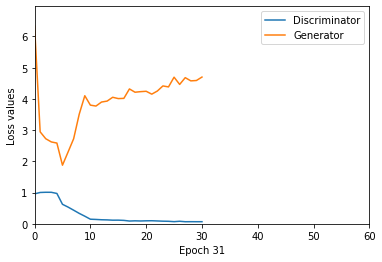

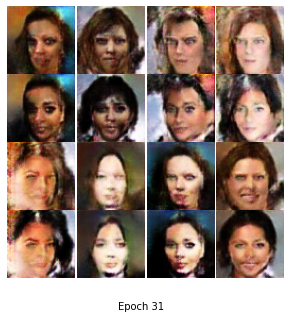

Epoch [32/60], Step [1/686], D_loss: 0.0740, G_loss: 4.5892
Epoch [32/60], Step [2/686], D_loss: 0.0572, G_loss: 3.9525
Epoch [32/60], Step [3/686], D_loss: 0.0353, G_loss: 4.2354
Epoch [32/60], Step [4/686], D_loss: 0.1174, G_loss: 4.5783
Epoch [32/60], Step [5/686], D_loss: 0.0743, G_loss: 5.2225
Epoch [32/60], Step [6/686], D_loss: 0.0551, G_loss: 4.9873
Epoch [32/60], Step [7/686], D_loss: 0.0751, G_loss: 3.2149
Epoch [32/60], Step [8/686], D_loss: 0.1318, G_loss: 4.8987
Epoch [32/60], Step [9/686], D_loss: 0.0765, G_loss: 4.9999
Epoch [32/60], Step [10/686], D_loss: 0.0934, G_loss: 4.5204
Epoch [32/60], Step [11/686], D_loss: 0.0548, G_loss: 4.0781
Epoch [32/60], Step [12/686], D_loss: 0.0471, G_loss: 4.6163
Epoch [32/60], Step [13/686], D_loss: 0.0423, G_loss: 5.9136
Epoch [32/60], Step [14/686], D_loss: 0.0394, G_loss: 4.7055
Epoch [32/60], Step [15/686], D_loss: 0.0361, G_loss: 4.8877
Epoch [32/60], Step [16/686], D_loss: 0.0218, G_loss: 3.7430
Epoch [32/60], Step [17/686], D_l

Epoch [32/60], Step [135/686], D_loss: 0.0454, G_loss: 3.9492
Epoch [32/60], Step [136/686], D_loss: 0.0485, G_loss: 5.0255
Epoch [32/60], Step [137/686], D_loss: 0.1229, G_loss: 2.5159
Epoch [32/60], Step [138/686], D_loss: 0.0682, G_loss: 4.2756
Epoch [32/60], Step [139/686], D_loss: 0.0404, G_loss: 4.3182
Epoch [32/60], Step [140/686], D_loss: 0.0570, G_loss: 4.9594
Epoch [32/60], Step [141/686], D_loss: 0.0537, G_loss: 3.8752
Epoch [32/60], Step [142/686], D_loss: 0.0595, G_loss: 4.7445
Epoch [32/60], Step [143/686], D_loss: 0.0419, G_loss: 4.0575
Epoch [32/60], Step [144/686], D_loss: 0.1144, G_loss: 4.0826
Epoch [32/60], Step [145/686], D_loss: 0.0421, G_loss: 4.6337
Epoch [32/60], Step [146/686], D_loss: 0.0259, G_loss: 4.2785
Epoch [32/60], Step [147/686], D_loss: 0.1318, G_loss: 4.7023
Epoch [32/60], Step [148/686], D_loss: 0.0611, G_loss: 4.2938
Epoch [32/60], Step [149/686], D_loss: 0.1201, G_loss: 3.6073
Epoch [32/60], Step [150/686], D_loss: 0.0885, G_loss: 4.9069
Epoch [3

Epoch [32/60], Step [268/686], D_loss: 0.0288, G_loss: 3.9959
Epoch [32/60], Step [269/686], D_loss: 0.2265, G_loss: 3.5561
Epoch [32/60], Step [270/686], D_loss: 0.0369, G_loss: 4.1478
Epoch [32/60], Step [271/686], D_loss: 0.0717, G_loss: 4.6260
Epoch [32/60], Step [272/686], D_loss: 0.0661, G_loss: 3.7833
Epoch [32/60], Step [273/686], D_loss: 0.0339, G_loss: 4.1534
Epoch [32/60], Step [274/686], D_loss: 0.0758, G_loss: 3.5827
Epoch [32/60], Step [275/686], D_loss: 0.0811, G_loss: 4.3285
Epoch [32/60], Step [276/686], D_loss: 0.0654, G_loss: 4.3046
Epoch [32/60], Step [277/686], D_loss: 0.1739, G_loss: 3.0883
Epoch [32/60], Step [278/686], D_loss: 0.0683, G_loss: 3.8320
Epoch [32/60], Step [279/686], D_loss: 0.0736, G_loss: 3.6635
Epoch [32/60], Step [280/686], D_loss: 0.0913, G_loss: 5.1354
Epoch [32/60], Step [281/686], D_loss: 0.0558, G_loss: 5.1663
Epoch [32/60], Step [282/686], D_loss: 0.1115, G_loss: 4.0205
Epoch [32/60], Step [283/686], D_loss: 0.0754, G_loss: 5.4871
Epoch [3

Epoch [32/60], Step [401/686], D_loss: 0.0761, G_loss: 3.8522
Epoch [32/60], Step [402/686], D_loss: 0.0557, G_loss: 5.1654
Epoch [32/60], Step [403/686], D_loss: 0.0747, G_loss: 4.6803
Epoch [32/60], Step [404/686], D_loss: 0.0375, G_loss: 4.2310
Epoch [32/60], Step [405/686], D_loss: 0.0766, G_loss: 4.5114
Epoch [32/60], Step [406/686], D_loss: 0.0464, G_loss: 4.0309
Epoch [32/60], Step [407/686], D_loss: 0.0767, G_loss: 4.5045
Epoch [32/60], Step [408/686], D_loss: 0.1817, G_loss: 5.0166
Epoch [32/60], Step [409/686], D_loss: 0.0213, G_loss: 4.7234
Epoch [32/60], Step [410/686], D_loss: 0.0419, G_loss: 5.3683
Epoch [32/60], Step [411/686], D_loss: 0.1342, G_loss: 4.3738
Epoch [32/60], Step [412/686], D_loss: 0.0576, G_loss: 3.9817
Epoch [32/60], Step [413/686], D_loss: 0.0937, G_loss: 3.7358
Epoch [32/60], Step [414/686], D_loss: 0.0789, G_loss: 4.7497
Epoch [32/60], Step [415/686], D_loss: 0.1055, G_loss: 4.7035
Epoch [32/60], Step [416/686], D_loss: 0.0859, G_loss: 4.6122
Epoch [3

Epoch [32/60], Step [534/686], D_loss: 0.0619, G_loss: 4.5838
Epoch [32/60], Step [535/686], D_loss: 0.0706, G_loss: 3.2249
Epoch [32/60], Step [536/686], D_loss: 0.0320, G_loss: 4.5409
Epoch [32/60], Step [537/686], D_loss: 0.0637, G_loss: 4.7873
Epoch [32/60], Step [538/686], D_loss: 0.0703, G_loss: 4.6793
Epoch [32/60], Step [539/686], D_loss: 0.0369, G_loss: 4.1199
Epoch [32/60], Step [540/686], D_loss: 0.0222, G_loss: 3.2714
Epoch [32/60], Step [541/686], D_loss: 0.0562, G_loss: 3.6270
Epoch [32/60], Step [542/686], D_loss: 0.0911, G_loss: 4.0462
Epoch [32/60], Step [543/686], D_loss: 0.0500, G_loss: 3.6410
Epoch [32/60], Step [544/686], D_loss: 0.0299, G_loss: 4.2978
Epoch [32/60], Step [545/686], D_loss: 0.0238, G_loss: 3.6288
Epoch [32/60], Step [546/686], D_loss: 0.0828, G_loss: 5.5710
Epoch [32/60], Step [547/686], D_loss: 0.0514, G_loss: 4.4496
Epoch [32/60], Step [548/686], D_loss: 0.0265, G_loss: 4.2308
Epoch [32/60], Step [549/686], D_loss: 0.1134, G_loss: 4.5680
Epoch [3

Epoch [32/60], Step [667/686], D_loss: 0.0697, G_loss: 4.2437
Epoch [32/60], Step [668/686], D_loss: 0.0325, G_loss: 4.4671
Epoch [32/60], Step [669/686], D_loss: 0.0820, G_loss: 4.5198
Epoch [32/60], Step [670/686], D_loss: 0.0443, G_loss: 4.5055
Epoch [32/60], Step [671/686], D_loss: 0.0312, G_loss: 4.3541
Epoch [32/60], Step [672/686], D_loss: 0.0876, G_loss: 4.8195
Epoch [32/60], Step [673/686], D_loss: 0.0214, G_loss: 4.5062
Epoch [32/60], Step [674/686], D_loss: 0.0515, G_loss: 4.3907
Epoch [32/60], Step [675/686], D_loss: 0.0790, G_loss: 5.2637
Epoch [32/60], Step [676/686], D_loss: 0.0642, G_loss: 4.9249
Epoch [32/60], Step [677/686], D_loss: 0.0956, G_loss: 5.0449
Epoch [32/60], Step [678/686], D_loss: 0.0299, G_loss: 5.0560
Epoch [32/60], Step [679/686], D_loss: 0.0920, G_loss: 5.2624
Epoch [32/60], Step [680/686], D_loss: 0.0806, G_loss: 4.6423
Epoch [32/60], Step [681/686], D_loss: 0.0365, G_loss: 3.9763
Epoch [32/60], Step [682/686], D_loss: 0.0915, G_loss: 4.2594
Epoch [3

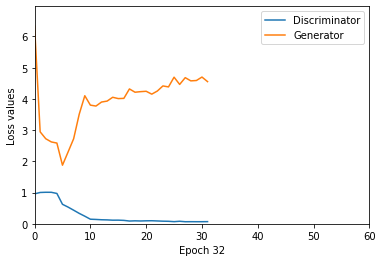

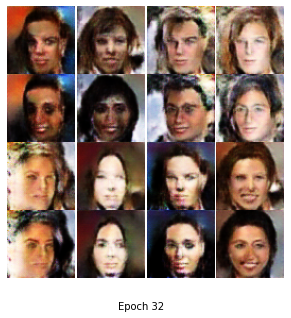

Epoch [33/60], Step [1/686], D_loss: 0.0537, G_loss: 3.9311
Epoch [33/60], Step [2/686], D_loss: 0.0357, G_loss: 3.9520
Epoch [33/60], Step [3/686], D_loss: 0.0424, G_loss: 4.0831
Epoch [33/60], Step [4/686], D_loss: 0.0862, G_loss: 4.7206
Epoch [33/60], Step [5/686], D_loss: 0.0772, G_loss: 4.3544
Epoch [33/60], Step [6/686], D_loss: 0.0864, G_loss: 4.7142
Epoch [33/60], Step [7/686], D_loss: 0.0710, G_loss: 4.6240
Epoch [33/60], Step [8/686], D_loss: 0.0547, G_loss: 4.8395
Epoch [33/60], Step [9/686], D_loss: 0.0909, G_loss: 5.2403
Epoch [33/60], Step [10/686], D_loss: 0.0907, G_loss: 4.3623
Epoch [33/60], Step [11/686], D_loss: 0.0738, G_loss: 4.7463
Epoch [33/60], Step [12/686], D_loss: 0.0549, G_loss: 4.5720
Epoch [33/60], Step [13/686], D_loss: 0.0644, G_loss: 3.3445
Epoch [33/60], Step [14/686], D_loss: 0.0418, G_loss: 4.5732
Epoch [33/60], Step [15/686], D_loss: 0.0618, G_loss: 3.9688
Epoch [33/60], Step [16/686], D_loss: 0.0546, G_loss: 4.2186
Epoch [33/60], Step [17/686], D_l

Epoch [33/60], Step [135/686], D_loss: 0.0683, G_loss: 4.9133
Epoch [33/60], Step [136/686], D_loss: 0.0879, G_loss: 4.7469
Epoch [33/60], Step [137/686], D_loss: 0.0658, G_loss: 3.7283
Epoch [33/60], Step [138/686], D_loss: 0.0500, G_loss: 4.5727
Epoch [33/60], Step [139/686], D_loss: 0.0954, G_loss: 3.9039
Epoch [33/60], Step [140/686], D_loss: 0.0593, G_loss: 4.0285
Epoch [33/60], Step [141/686], D_loss: 0.0680, G_loss: 3.6980
Epoch [33/60], Step [142/686], D_loss: 0.0977, G_loss: 4.8866
Epoch [33/60], Step [143/686], D_loss: 0.0311, G_loss: 5.2943
Epoch [33/60], Step [144/686], D_loss: 0.0692, G_loss: 3.9224
Epoch [33/60], Step [145/686], D_loss: 0.0591, G_loss: 5.4933
Epoch [33/60], Step [146/686], D_loss: 0.0330, G_loss: 5.2201
Epoch [33/60], Step [147/686], D_loss: 0.1716, G_loss: 4.7039
Epoch [33/60], Step [148/686], D_loss: 0.0497, G_loss: 4.7388
Epoch [33/60], Step [149/686], D_loss: 0.0730, G_loss: 3.6030
Epoch [33/60], Step [150/686], D_loss: 0.0398, G_loss: 4.1304
Epoch [3

Epoch [33/60], Step [268/686], D_loss: 0.0751, G_loss: 3.4948
Epoch [33/60], Step [269/686], D_loss: 0.1262, G_loss: 4.6204
Epoch [33/60], Step [270/686], D_loss: 0.0515, G_loss: 4.3473
Epoch [33/60], Step [271/686], D_loss: 0.0519, G_loss: 3.4064
Epoch [33/60], Step [272/686], D_loss: 0.0920, G_loss: 4.5871
Epoch [33/60], Step [273/686], D_loss: 0.0705, G_loss: 4.4024
Epoch [33/60], Step [274/686], D_loss: 0.0590, G_loss: 5.1307
Epoch [33/60], Step [275/686], D_loss: 0.0905, G_loss: 4.7064
Epoch [33/60], Step [276/686], D_loss: 0.0812, G_loss: 5.2804
Epoch [33/60], Step [277/686], D_loss: 0.1660, G_loss: 4.0199
Epoch [33/60], Step [278/686], D_loss: 0.0785, G_loss: 3.4665
Epoch [33/60], Step [279/686], D_loss: 0.0364, G_loss: 4.7233
Epoch [33/60], Step [280/686], D_loss: 0.0759, G_loss: 4.5291
Epoch [33/60], Step [281/686], D_loss: 0.0806, G_loss: 4.5175
Epoch [33/60], Step [282/686], D_loss: 0.0451, G_loss: 5.4489
Epoch [33/60], Step [283/686], D_loss: 0.0935, G_loss: 4.3631
Epoch [3

Epoch [33/60], Step [401/686], D_loss: 0.0848, G_loss: 5.4768
Epoch [33/60], Step [402/686], D_loss: 0.0748, G_loss: 6.0613
Epoch [33/60], Step [403/686], D_loss: 0.0945, G_loss: 5.8313
Epoch [33/60], Step [404/686], D_loss: 0.0494, G_loss: 5.6445
Epoch [33/60], Step [405/686], D_loss: 0.0725, G_loss: 5.2541
Epoch [33/60], Step [406/686], D_loss: 0.0368, G_loss: 5.4743
Epoch [33/60], Step [407/686], D_loss: 0.1448, G_loss: 4.7674
Epoch [33/60], Step [408/686], D_loss: 0.1052, G_loss: 5.1183
Epoch [33/60], Step [409/686], D_loss: 0.0210, G_loss: 4.9934
Epoch [33/60], Step [410/686], D_loss: 0.0339, G_loss: 4.8026
Epoch [33/60], Step [411/686], D_loss: 0.0785, G_loss: 5.6815
Epoch [33/60], Step [412/686], D_loss: 0.0632, G_loss: 3.9061
Epoch [33/60], Step [413/686], D_loss: 0.1023, G_loss: 5.3219
Epoch [33/60], Step [414/686], D_loss: 0.0749, G_loss: 5.2240
Epoch [33/60], Step [415/686], D_loss: 0.0889, G_loss: 5.4269
Epoch [33/60], Step [416/686], D_loss: 0.0425, G_loss: 4.5707
Epoch [3

Epoch [33/60], Step [534/686], D_loss: 0.0409, G_loss: 3.5959
Epoch [33/60], Step [535/686], D_loss: 0.0483, G_loss: 5.2454
Epoch [33/60], Step [536/686], D_loss: 0.0764, G_loss: 4.6645
Epoch [33/60], Step [537/686], D_loss: 0.0795, G_loss: 6.2338
Epoch [33/60], Step [538/686], D_loss: 0.0371, G_loss: 4.5773
Epoch [33/60], Step [539/686], D_loss: 0.0284, G_loss: 5.5279
Epoch [33/60], Step [540/686], D_loss: 0.0247, G_loss: 4.8746
Epoch [33/60], Step [541/686], D_loss: 0.0295, G_loss: 5.5776
Epoch [33/60], Step [542/686], D_loss: 0.0743, G_loss: 5.0126
Epoch [33/60], Step [543/686], D_loss: 0.0457, G_loss: 4.5210
Epoch [33/60], Step [544/686], D_loss: 0.0811, G_loss: 4.5419
Epoch [33/60], Step [545/686], D_loss: 0.0267, G_loss: 5.7182
Epoch [33/60], Step [546/686], D_loss: 0.0741, G_loss: 4.9857
Epoch [33/60], Step [547/686], D_loss: 0.0518, G_loss: 4.7274
Epoch [33/60], Step [548/686], D_loss: 0.0238, G_loss: 4.4847
Epoch [33/60], Step [549/686], D_loss: 0.0731, G_loss: 4.2567
Epoch [3

Epoch [33/60], Step [667/686], D_loss: 0.0318, G_loss: 3.9081
Epoch [33/60], Step [668/686], D_loss: 0.0483, G_loss: 4.2620
Epoch [33/60], Step [669/686], D_loss: 0.0622, G_loss: 3.5476
Epoch [33/60], Step [670/686], D_loss: 0.0402, G_loss: 4.3342
Epoch [33/60], Step [671/686], D_loss: 0.0612, G_loss: 5.5417
Epoch [33/60], Step [672/686], D_loss: 0.0597, G_loss: 4.8587
Epoch [33/60], Step [673/686], D_loss: 0.0198, G_loss: 6.0125
Epoch [33/60], Step [674/686], D_loss: 0.0245, G_loss: 6.2954
Epoch [33/60], Step [675/686], D_loss: 0.0307, G_loss: 5.2502
Epoch [33/60], Step [676/686], D_loss: 0.0439, G_loss: 4.7700
Epoch [33/60], Step [677/686], D_loss: 0.0574, G_loss: 5.6733
Epoch [33/60], Step [678/686], D_loss: 0.0311, G_loss: 5.0073
Epoch [33/60], Step [679/686], D_loss: 0.0631, G_loss: 3.9643
Epoch [33/60], Step [680/686], D_loss: 0.0559, G_loss: 4.2587
Epoch [33/60], Step [681/686], D_loss: 0.0427, G_loss: 4.1310
Epoch [33/60], Step [682/686], D_loss: 0.0297, G_loss: 4.3362
Epoch [3

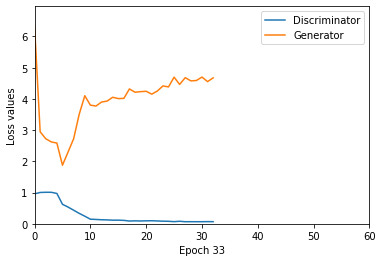

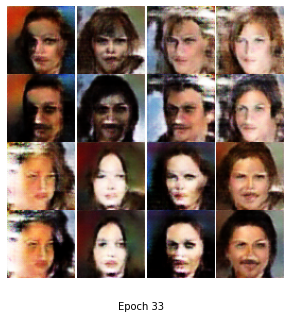

Epoch [34/60], Step [1/686], D_loss: 0.0612, G_loss: 5.0564
Epoch [34/60], Step [2/686], D_loss: 0.0337, G_loss: 5.3103
Epoch [34/60], Step [3/686], D_loss: 0.0471, G_loss: 4.2594
Epoch [34/60], Step [4/686], D_loss: 0.1299, G_loss: 3.9369
Epoch [34/60], Step [5/686], D_loss: 0.0529, G_loss: 4.6880
Epoch [34/60], Step [6/686], D_loss: 0.0567, G_loss: 5.2049
Epoch [34/60], Step [7/686], D_loss: 0.1143, G_loss: 5.7485
Epoch [34/60], Step [8/686], D_loss: 0.0588, G_loss: 4.9919
Epoch [34/60], Step [9/686], D_loss: 0.0673, G_loss: 5.8653
Epoch [34/60], Step [10/686], D_loss: 0.0560, G_loss: 3.8243
Epoch [34/60], Step [11/686], D_loss: 0.1269, G_loss: 4.8037
Epoch [34/60], Step [12/686], D_loss: 0.0240, G_loss: 4.2800
Epoch [34/60], Step [13/686], D_loss: 0.1010, G_loss: 4.1558
Epoch [34/60], Step [14/686], D_loss: 0.0387, G_loss: 4.4221
Epoch [34/60], Step [15/686], D_loss: 0.0355, G_loss: 4.9086
Epoch [34/60], Step [16/686], D_loss: 0.0312, G_loss: 4.6686
Epoch [34/60], Step [17/686], D_l

Epoch [34/60], Step [135/686], D_loss: 0.0662, G_loss: 3.9670
Epoch [34/60], Step [136/686], D_loss: 0.1460, G_loss: 5.0757
Epoch [34/60], Step [137/686], D_loss: 0.0599, G_loss: 4.7332
Epoch [34/60], Step [138/686], D_loss: 0.0856, G_loss: 4.6020
Epoch [34/60], Step [139/686], D_loss: 0.0464, G_loss: 4.6004
Epoch [34/60], Step [140/686], D_loss: 0.0517, G_loss: 4.9709
Epoch [34/60], Step [141/686], D_loss: 0.0564, G_loss: 4.8022
Epoch [34/60], Step [142/686], D_loss: 0.0606, G_loss: 5.4595
Epoch [34/60], Step [143/686], D_loss: 0.0203, G_loss: 4.3511
Epoch [34/60], Step [144/686], D_loss: 0.0527, G_loss: 4.2839
Epoch [34/60], Step [145/686], D_loss: 0.0526, G_loss: 4.5798
Epoch [34/60], Step [146/686], D_loss: 0.0254, G_loss: 4.1371
Epoch [34/60], Step [147/686], D_loss: 0.1485, G_loss: 3.5139
Epoch [34/60], Step [148/686], D_loss: 0.0771, G_loss: 4.9060
Epoch [34/60], Step [149/686], D_loss: 0.0547, G_loss: 3.8195
Epoch [34/60], Step [150/686], D_loss: 0.0255, G_loss: 4.2518
Epoch [3

Epoch [34/60], Step [268/686], D_loss: 0.0726, G_loss: 5.0113
Epoch [34/60], Step [269/686], D_loss: 0.1052, G_loss: 5.3087
Epoch [34/60], Step [270/686], D_loss: 0.0353, G_loss: 4.6877
Epoch [34/60], Step [271/686], D_loss: 0.0621, G_loss: 5.3734
Epoch [34/60], Step [272/686], D_loss: 0.0659, G_loss: 4.2844
Epoch [34/60], Step [273/686], D_loss: 0.0386, G_loss: 5.1440
Epoch [34/60], Step [274/686], D_loss: 0.0391, G_loss: 5.7588
Epoch [34/60], Step [275/686], D_loss: 0.0604, G_loss: 5.0034
Epoch [34/60], Step [276/686], D_loss: 0.0250, G_loss: 4.5656
Epoch [34/60], Step [277/686], D_loss: 0.1020, G_loss: 4.4130
Epoch [34/60], Step [278/686], D_loss: 0.1015, G_loss: 4.0182
Epoch [34/60], Step [279/686], D_loss: 0.0425, G_loss: 4.4240
Epoch [34/60], Step [280/686], D_loss: 0.0444, G_loss: 3.6513
Epoch [34/60], Step [281/686], D_loss: 0.0612, G_loss: 3.9746
Epoch [34/60], Step [282/686], D_loss: 0.0611, G_loss: 4.6043
Epoch [34/60], Step [283/686], D_loss: 0.0478, G_loss: 5.2439
Epoch [3

Epoch [34/60], Step [401/686], D_loss: 0.0574, G_loss: 6.0537
Epoch [34/60], Step [402/686], D_loss: 0.0425, G_loss: 5.5246
Epoch [34/60], Step [403/686], D_loss: 0.0613, G_loss: 4.9612
Epoch [34/60], Step [404/686], D_loss: 0.0397, G_loss: 4.4373
Epoch [34/60], Step [405/686], D_loss: 0.0461, G_loss: 4.9243
Epoch [34/60], Step [406/686], D_loss: 0.0314, G_loss: 6.5397
Epoch [34/60], Step [407/686], D_loss: 0.0836, G_loss: 4.4285
Epoch [34/60], Step [408/686], D_loss: 0.0947, G_loss: 3.2076
Epoch [34/60], Step [409/686], D_loss: 0.0138, G_loss: 4.6082
Epoch [34/60], Step [410/686], D_loss: 0.0693, G_loss: 4.6033
Epoch [34/60], Step [411/686], D_loss: 0.1251, G_loss: 4.5204
Epoch [34/60], Step [412/686], D_loss: 0.0323, G_loss: 5.2423
Epoch [34/60], Step [413/686], D_loss: 0.1208, G_loss: 4.7902
Epoch [34/60], Step [414/686], D_loss: 0.0527, G_loss: 4.5639
Epoch [34/60], Step [415/686], D_loss: 0.0850, G_loss: 4.9873
Epoch [34/60], Step [416/686], D_loss: 0.0468, G_loss: 3.8031
Epoch [3

Epoch [34/60], Step [534/686], D_loss: 0.0817, G_loss: 3.9159
Epoch [34/60], Step [535/686], D_loss: 0.0862, G_loss: 3.5180
Epoch [34/60], Step [536/686], D_loss: 0.0164, G_loss: 3.5420
Epoch [34/60], Step [537/686], D_loss: 0.0455, G_loss: 3.0707
Epoch [34/60], Step [538/686], D_loss: 0.0414, G_loss: 3.1262
Epoch [34/60], Step [539/686], D_loss: 0.0598, G_loss: 4.4523
Epoch [34/60], Step [540/686], D_loss: 0.0542, G_loss: 4.3135
Epoch [34/60], Step [541/686], D_loss: 0.1047, G_loss: 4.9732
Epoch [34/60], Step [542/686], D_loss: 0.1574, G_loss: 3.7892
Epoch [34/60], Step [543/686], D_loss: 0.0184, G_loss: 2.8523
Epoch [34/60], Step [544/686], D_loss: 0.0279, G_loss: 3.1806
Epoch [34/60], Step [545/686], D_loss: 0.0287, G_loss: 2.7345
Epoch [34/60], Step [546/686], D_loss: 0.0725, G_loss: 3.3335
Epoch [34/60], Step [547/686], D_loss: 0.0518, G_loss: 4.3520
Epoch [34/60], Step [548/686], D_loss: 0.1318, G_loss: 5.2870
Epoch [34/60], Step [549/686], D_loss: 0.1200, G_loss: 4.1113
Epoch [3

Epoch [34/60], Step [667/686], D_loss: 0.0389, G_loss: 4.0616
Epoch [34/60], Step [668/686], D_loss: 0.0587, G_loss: 4.2374
Epoch [34/60], Step [669/686], D_loss: 0.0526, G_loss: 3.6161
Epoch [34/60], Step [670/686], D_loss: 0.0461, G_loss: 4.9320
Epoch [34/60], Step [671/686], D_loss: 0.0481, G_loss: 4.5669
Epoch [34/60], Step [672/686], D_loss: 0.0652, G_loss: 4.1740
Epoch [34/60], Step [673/686], D_loss: 0.0555, G_loss: 3.7762
Epoch [34/60], Step [674/686], D_loss: 0.0858, G_loss: 4.5025
Epoch [34/60], Step [675/686], D_loss: 0.0438, G_loss: 4.9142
Epoch [34/60], Step [676/686], D_loss: 0.0328, G_loss: 5.4211
Epoch [34/60], Step [677/686], D_loss: 0.0641, G_loss: 4.1158
Epoch [34/60], Step [678/686], D_loss: 0.0597, G_loss: 5.4778
Epoch [34/60], Step [679/686], D_loss: 0.1169, G_loss: 4.0516
Epoch [34/60], Step [680/686], D_loss: 0.0980, G_loss: 4.4443
Epoch [34/60], Step [681/686], D_loss: 0.1058, G_loss: 5.5992
Epoch [34/60], Step [682/686], D_loss: 0.0862, G_loss: 4.0152
Epoch [3

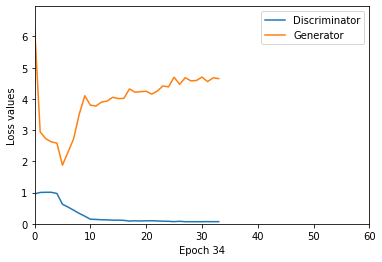

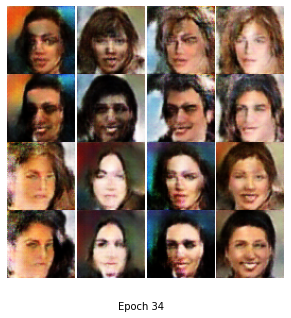

Epoch [35/60], Step [1/686], D_loss: 0.0937, G_loss: 3.5935
Epoch [35/60], Step [2/686], D_loss: 0.0339, G_loss: 3.0559
Epoch [35/60], Step [3/686], D_loss: 0.0451, G_loss: 4.7882
Epoch [35/60], Step [4/686], D_loss: 0.1538, G_loss: 4.1838
Epoch [35/60], Step [5/686], D_loss: 0.0961, G_loss: 4.2790
Epoch [35/60], Step [6/686], D_loss: 0.0767, G_loss: 2.3460
Epoch [35/60], Step [7/686], D_loss: 0.0820, G_loss: 3.7505
Epoch [35/60], Step [8/686], D_loss: 0.0677, G_loss: 3.8641
Epoch [35/60], Step [9/686], D_loss: 0.1285, G_loss: 3.6240
Epoch [35/60], Step [10/686], D_loss: 0.0949, G_loss: 4.8056
Epoch [35/60], Step [11/686], D_loss: 0.0955, G_loss: 3.9328
Epoch [35/60], Step [12/686], D_loss: 0.0939, G_loss: 5.5334
Epoch [35/60], Step [13/686], D_loss: 0.0591, G_loss: 4.6292
Epoch [35/60], Step [14/686], D_loss: 0.0997, G_loss: 4.0558
Epoch [35/60], Step [15/686], D_loss: 0.0658, G_loss: 4.3058
Epoch [35/60], Step [16/686], D_loss: 0.0379, G_loss: 5.2700
Epoch [35/60], Step [17/686], D_l

Epoch [35/60], Step [135/686], D_loss: 0.0596, G_loss: 3.9290
Epoch [35/60], Step [136/686], D_loss: 0.0755, G_loss: 4.4243
Epoch [35/60], Step [137/686], D_loss: 0.0865, G_loss: 4.4689
Epoch [35/60], Step [138/686], D_loss: 0.1536, G_loss: 4.2588
Epoch [35/60], Step [139/686], D_loss: 0.0419, G_loss: 5.3882
Epoch [35/60], Step [140/686], D_loss: 0.0700, G_loss: 4.9464
Epoch [35/60], Step [141/686], D_loss: 0.0635, G_loss: 4.0748
Epoch [35/60], Step [142/686], D_loss: 0.0881, G_loss: 4.5858
Epoch [35/60], Step [143/686], D_loss: 0.0326, G_loss: 5.5565
Epoch [35/60], Step [144/686], D_loss: 0.0809, G_loss: 4.9085
Epoch [35/60], Step [145/686], D_loss: 0.0686, G_loss: 4.3585
Epoch [35/60], Step [146/686], D_loss: 0.0496, G_loss: 4.0731
Epoch [35/60], Step [147/686], D_loss: 0.1050, G_loss: 4.6233
Epoch [35/60], Step [148/686], D_loss: 0.0499, G_loss: 4.7175
Epoch [35/60], Step [149/686], D_loss: 0.0545, G_loss: 3.2655
Epoch [35/60], Step [150/686], D_loss: 0.0421, G_loss: 4.4843
Epoch [3

Epoch [35/60], Step [268/686], D_loss: 0.0708, G_loss: 4.0121
Epoch [35/60], Step [269/686], D_loss: 0.1784, G_loss: 4.3354
Epoch [35/60], Step [270/686], D_loss: 0.0699, G_loss: 4.7971
Epoch [35/60], Step [271/686], D_loss: 0.0602, G_loss: 4.7527
Epoch [35/60], Step [272/686], D_loss: 0.0614, G_loss: 3.5957
Epoch [35/60], Step [273/686], D_loss: 0.0412, G_loss: 5.0254
Epoch [35/60], Step [274/686], D_loss: 0.0896, G_loss: 3.6069
Epoch [35/60], Step [275/686], D_loss: 0.0743, G_loss: 4.6132
Epoch [35/60], Step [276/686], D_loss: 0.0488, G_loss: 4.8598
Epoch [35/60], Step [277/686], D_loss: 0.1158, G_loss: 4.4850
Epoch [35/60], Step [278/686], D_loss: 0.0913, G_loss: 4.3215
Epoch [35/60], Step [279/686], D_loss: 0.1145, G_loss: 4.1409
Epoch [35/60], Step [280/686], D_loss: 0.0606, G_loss: 4.0520
Epoch [35/60], Step [281/686], D_loss: 0.1154, G_loss: 4.6319
Epoch [35/60], Step [282/686], D_loss: 0.0510, G_loss: 5.1681
Epoch [35/60], Step [283/686], D_loss: 0.0720, G_loss: 4.5153
Epoch [3

Epoch [35/60], Step [401/686], D_loss: 0.0334, G_loss: 5.4909
Epoch [35/60], Step [402/686], D_loss: 0.0904, G_loss: 4.7625
Epoch [35/60], Step [403/686], D_loss: 0.0838, G_loss: 4.5777
Epoch [35/60], Step [404/686], D_loss: 0.0288, G_loss: 4.8036
Epoch [35/60], Step [405/686], D_loss: 0.1120, G_loss: 4.6591
Epoch [35/60], Step [406/686], D_loss: 0.0272, G_loss: 6.2095
Epoch [35/60], Step [407/686], D_loss: 0.0655, G_loss: 4.7353
Epoch [35/60], Step [408/686], D_loss: 0.1028, G_loss: 4.3765
Epoch [35/60], Step [409/686], D_loss: 0.0474, G_loss: 3.6963
Epoch [35/60], Step [410/686], D_loss: 0.0383, G_loss: 4.8916
Epoch [35/60], Step [411/686], D_loss: 0.0766, G_loss: 4.8394
Epoch [35/60], Step [412/686], D_loss: 0.0578, G_loss: 4.2624
Epoch [35/60], Step [413/686], D_loss: 0.0755, G_loss: 6.2286
Epoch [35/60], Step [414/686], D_loss: 0.0377, G_loss: 4.5961
Epoch [35/60], Step [415/686], D_loss: 0.0701, G_loss: 3.7894
Epoch [35/60], Step [416/686], D_loss: 0.0396, G_loss: 3.9382
Epoch [3

Epoch [35/60], Step [534/686], D_loss: 0.0430, G_loss: 5.3055
Epoch [35/60], Step [535/686], D_loss: 0.0836, G_loss: 4.9557
Epoch [35/60], Step [536/686], D_loss: 0.0223, G_loss: 3.8075
Epoch [35/60], Step [537/686], D_loss: 0.0770, G_loss: 5.7153
Epoch [35/60], Step [538/686], D_loss: 0.0432, G_loss: 3.6057
Epoch [35/60], Step [539/686], D_loss: 0.0204, G_loss: 5.8813
Epoch [35/60], Step [540/686], D_loss: 0.1308, G_loss: 5.3653
Epoch [35/60], Step [541/686], D_loss: 0.0444, G_loss: 4.7580
Epoch [35/60], Step [542/686], D_loss: 0.1228, G_loss: 5.3706
Epoch [35/60], Step [543/686], D_loss: 0.0225, G_loss: 4.8501
Epoch [35/60], Step [544/686], D_loss: 0.0382, G_loss: 5.8626
Epoch [35/60], Step [545/686], D_loss: 0.0180, G_loss: 5.1242
Epoch [35/60], Step [546/686], D_loss: 0.0622, G_loss: 3.5573
Epoch [35/60], Step [547/686], D_loss: 0.0382, G_loss: 4.4422
Epoch [35/60], Step [548/686], D_loss: 0.0739, G_loss: 4.5559
Epoch [35/60], Step [549/686], D_loss: 0.0688, G_loss: 4.7747
Epoch [3

Epoch [35/60], Step [667/686], D_loss: 0.0483, G_loss: 4.8452
Epoch [35/60], Step [668/686], D_loss: 0.0267, G_loss: 5.1906
Epoch [35/60], Step [669/686], D_loss: 0.0487, G_loss: 4.0687
Epoch [35/60], Step [670/686], D_loss: 0.0284, G_loss: 3.4334
Epoch [35/60], Step [671/686], D_loss: 0.0388, G_loss: 5.1558
Epoch [35/60], Step [672/686], D_loss: 0.0633, G_loss: 3.7024
Epoch [35/60], Step [673/686], D_loss: 0.0223, G_loss: 5.0447
Epoch [35/60], Step [674/686], D_loss: 0.0358, G_loss: 4.0617
Epoch [35/60], Step [675/686], D_loss: 0.0356, G_loss: 5.2034
Epoch [35/60], Step [676/686], D_loss: 0.0446, G_loss: 5.1452
Epoch [35/60], Step [677/686], D_loss: 0.1041, G_loss: 4.7259
Epoch [35/60], Step [678/686], D_loss: 0.0263, G_loss: 5.9947
Epoch [35/60], Step [679/686], D_loss: 0.0690, G_loss: 6.1866
Epoch [35/60], Step [680/686], D_loss: 0.0987, G_loss: 5.6284
Epoch [35/60], Step [681/686], D_loss: 0.0579, G_loss: 4.7384
Epoch [35/60], Step [682/686], D_loss: 0.0422, G_loss: 4.4668
Epoch [3

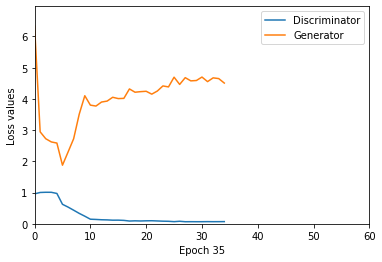

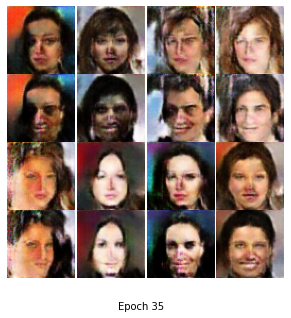

Epoch [36/60], Step [1/686], D_loss: 0.0455, G_loss: 3.4453
Epoch [36/60], Step [2/686], D_loss: 0.0862, G_loss: 5.0438
Epoch [36/60], Step [3/686], D_loss: 0.0541, G_loss: 5.1934
Epoch [36/60], Step [4/686], D_loss: 0.1384, G_loss: 5.5398
Epoch [36/60], Step [5/686], D_loss: 0.0710, G_loss: 5.0826
Epoch [36/60], Step [6/686], D_loss: 0.0347, G_loss: 4.5625
Epoch [36/60], Step [7/686], D_loss: 0.0701, G_loss: 4.1020
Epoch [36/60], Step [8/686], D_loss: 0.0325, G_loss: 4.7118
Epoch [36/60], Step [9/686], D_loss: 0.0816, G_loss: 3.9986
Epoch [36/60], Step [10/686], D_loss: 0.0556, G_loss: 3.1406
Epoch [36/60], Step [11/686], D_loss: 0.1938, G_loss: 4.4005
Epoch [36/60], Step [12/686], D_loss: 0.0526, G_loss: 5.3097
Epoch [36/60], Step [13/686], D_loss: 0.0743, G_loss: 4.9075
Epoch [36/60], Step [14/686], D_loss: 0.0791, G_loss: 4.2266
Epoch [36/60], Step [15/686], D_loss: 0.0453, G_loss: 5.4192
Epoch [36/60], Step [16/686], D_loss: 0.0292, G_loss: 5.1729
Epoch [36/60], Step [17/686], D_l

Epoch [36/60], Step [135/686], D_loss: 0.0644, G_loss: 4.7136
Epoch [36/60], Step [136/686], D_loss: 0.0709, G_loss: 3.7178
Epoch [36/60], Step [137/686], D_loss: 0.0433, G_loss: 4.6362
Epoch [36/60], Step [138/686], D_loss: 0.1760, G_loss: 4.7601
Epoch [36/60], Step [139/686], D_loss: 0.0959, G_loss: 4.3379
Epoch [36/60], Step [140/686], D_loss: 0.0641, G_loss: 4.1694
Epoch [36/60], Step [141/686], D_loss: 0.0235, G_loss: 4.8477
Epoch [36/60], Step [142/686], D_loss: 0.0351, G_loss: 4.8136
Epoch [36/60], Step [143/686], D_loss: 0.0306, G_loss: 5.3131
Epoch [36/60], Step [144/686], D_loss: 0.0477, G_loss: 4.7885
Epoch [36/60], Step [145/686], D_loss: 0.0594, G_loss: 4.3081
Epoch [36/60], Step [146/686], D_loss: 0.0425, G_loss: 3.6967
Epoch [36/60], Step [147/686], D_loss: 0.1534, G_loss: 3.9536
Epoch [36/60], Step [148/686], D_loss: 0.0530, G_loss: 3.8430
Epoch [36/60], Step [149/686], D_loss: 0.0681, G_loss: 4.5287
Epoch [36/60], Step [150/686], D_loss: 0.0428, G_loss: 4.0402
Epoch [3

Epoch [36/60], Step [268/686], D_loss: 0.0538, G_loss: 4.2740
Epoch [36/60], Step [269/686], D_loss: 0.2454, G_loss: 5.0852
Epoch [36/60], Step [270/686], D_loss: 0.1076, G_loss: 4.8672
Epoch [36/60], Step [271/686], D_loss: 0.0638, G_loss: 5.9045
Epoch [36/60], Step [272/686], D_loss: 0.0892, G_loss: 5.3400
Epoch [36/60], Step [273/686], D_loss: 0.0507, G_loss: 4.8916
Epoch [36/60], Step [274/686], D_loss: 0.0592, G_loss: 4.0128
Epoch [36/60], Step [275/686], D_loss: 0.0765, G_loss: 4.2059
Epoch [36/60], Step [276/686], D_loss: 0.0241, G_loss: 4.6350
Epoch [36/60], Step [277/686], D_loss: 0.0678, G_loss: 3.3517
Epoch [36/60], Step [278/686], D_loss: 0.1589, G_loss: 4.2804
Epoch [36/60], Step [279/686], D_loss: 0.0302, G_loss: 4.5548
Epoch [36/60], Step [280/686], D_loss: 0.0451, G_loss: 4.6060
Epoch [36/60], Step [281/686], D_loss: 0.0517, G_loss: 4.3969
Epoch [36/60], Step [282/686], D_loss: 0.0311, G_loss: 4.5334
Epoch [36/60], Step [283/686], D_loss: 0.0580, G_loss: 3.3663
Epoch [3

Epoch [36/60], Step [401/686], D_loss: 0.0572, G_loss: 4.6829
Epoch [36/60], Step [402/686], D_loss: 0.0467, G_loss: 4.8208
Epoch [36/60], Step [403/686], D_loss: 0.0570, G_loss: 6.2269
Epoch [36/60], Step [404/686], D_loss: 0.0429, G_loss: 4.3912
Epoch [36/60], Step [405/686], D_loss: 0.0499, G_loss: 4.7081
Epoch [36/60], Step [406/686], D_loss: 0.0343, G_loss: 3.6833
Epoch [36/60], Step [407/686], D_loss: 0.0930, G_loss: 4.5183
Epoch [36/60], Step [408/686], D_loss: 0.1000, G_loss: 5.1909
Epoch [36/60], Step [409/686], D_loss: 0.0273, G_loss: 4.3126
Epoch [36/60], Step [410/686], D_loss: 0.0376, G_loss: 3.5078
Epoch [36/60], Step [411/686], D_loss: 0.0725, G_loss: 4.7946
Epoch [36/60], Step [412/686], D_loss: 0.0691, G_loss: 5.3360
Epoch [36/60], Step [413/686], D_loss: 0.1146, G_loss: 4.6806
Epoch [36/60], Step [414/686], D_loss: 0.0380, G_loss: 6.0856
Epoch [36/60], Step [415/686], D_loss: 0.1432, G_loss: 5.5434
Epoch [36/60], Step [416/686], D_loss: 0.0336, G_loss: 4.5878
Epoch [3

Epoch [36/60], Step [534/686], D_loss: 0.0436, G_loss: 4.2587
Epoch [36/60], Step [535/686], D_loss: 0.0919, G_loss: 5.1704
Epoch [36/60], Step [536/686], D_loss: 0.0288, G_loss: 4.1811
Epoch [36/60], Step [537/686], D_loss: 0.1030, G_loss: 4.2747
Epoch [36/60], Step [538/686], D_loss: 0.0520, G_loss: 5.2409
Epoch [36/60], Step [539/686], D_loss: 0.0590, G_loss: 4.4359
Epoch [36/60], Step [540/686], D_loss: 0.0567, G_loss: 4.5858
Epoch [36/60], Step [541/686], D_loss: 0.0734, G_loss: 3.7829
Epoch [36/60], Step [542/686], D_loss: 0.0999, G_loss: 4.4020
Epoch [36/60], Step [543/686], D_loss: 0.0485, G_loss: 5.0659
Epoch [36/60], Step [544/686], D_loss: 0.0502, G_loss: 5.3043
Epoch [36/60], Step [545/686], D_loss: 0.0247, G_loss: 5.0998
Epoch [36/60], Step [546/686], D_loss: 0.0972, G_loss: 6.1797
Epoch [36/60], Step [547/686], D_loss: 0.0499, G_loss: 5.1258
Epoch [36/60], Step [548/686], D_loss: 0.0345, G_loss: 5.3029
Epoch [36/60], Step [549/686], D_loss: 0.0779, G_loss: 4.4417
Epoch [3

Epoch [36/60], Step [667/686], D_loss: 0.0565, G_loss: 4.4707
Epoch [36/60], Step [668/686], D_loss: 0.0221, G_loss: 4.8011
Epoch [36/60], Step [669/686], D_loss: 0.0619, G_loss: 4.8779
Epoch [36/60], Step [670/686], D_loss: 0.0327, G_loss: 3.6352
Epoch [36/60], Step [671/686], D_loss: 0.0371, G_loss: 3.9026
Epoch [36/60], Step [672/686], D_loss: 0.1331, G_loss: 4.7836
Epoch [36/60], Step [673/686], D_loss: 0.0767, G_loss: 5.1547
Epoch [36/60], Step [674/686], D_loss: 0.0373, G_loss: 6.3704
Epoch [36/60], Step [675/686], D_loss: 0.0788, G_loss: 4.8261
Epoch [36/60], Step [676/686], D_loss: 0.0270, G_loss: 5.7103
Epoch [36/60], Step [677/686], D_loss: 0.0512, G_loss: 5.7459
Epoch [36/60], Step [678/686], D_loss: 0.0458, G_loss: 5.0707
Epoch [36/60], Step [679/686], D_loss: 0.0709, G_loss: 4.4426
Epoch [36/60], Step [680/686], D_loss: 0.0508, G_loss: 4.8180
Epoch [36/60], Step [681/686], D_loss: 0.0891, G_loss: 3.7464
Epoch [36/60], Step [682/686], D_loss: 0.0550, G_loss: 4.0679
Epoch [3

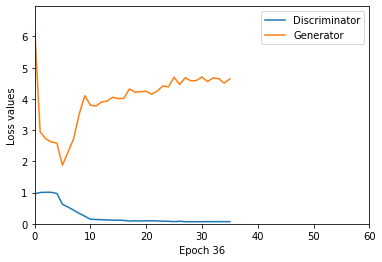

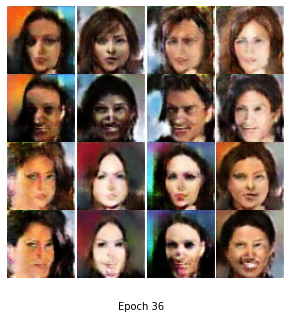

Epoch [37/60], Step [1/686], D_loss: 0.0698, G_loss: 4.3379
Epoch [37/60], Step [2/686], D_loss: 0.0286, G_loss: 3.7723
Epoch [37/60], Step [3/686], D_loss: 0.0559, G_loss: 3.9528
Epoch [37/60], Step [4/686], D_loss: 0.0977, G_loss: 4.5276
Epoch [37/60], Step [5/686], D_loss: 0.0728, G_loss: 4.3450
Epoch [37/60], Step [6/686], D_loss: 0.0660, G_loss: 4.1194
Epoch [37/60], Step [7/686], D_loss: 0.0793, G_loss: 4.3590
Epoch [37/60], Step [8/686], D_loss: 0.0941, G_loss: 4.7201
Epoch [37/60], Step [9/686], D_loss: 0.0641, G_loss: 3.8291
Epoch [37/60], Step [10/686], D_loss: 0.0536, G_loss: 5.3856
Epoch [37/60], Step [11/686], D_loss: 0.0710, G_loss: 4.1684
Epoch [37/60], Step [12/686], D_loss: 0.0950, G_loss: 5.1364
Epoch [37/60], Step [13/686], D_loss: 0.0694, G_loss: 5.3695
Epoch [37/60], Step [14/686], D_loss: 0.0820, G_loss: 5.5887
Epoch [37/60], Step [15/686], D_loss: 0.0464, G_loss: 5.6928
Epoch [37/60], Step [16/686], D_loss: 0.0200, G_loss: 3.9486
Epoch [37/60], Step [17/686], D_l

Epoch [37/60], Step [135/686], D_loss: 0.0982, G_loss: 4.1244
Epoch [37/60], Step [136/686], D_loss: 0.0671, G_loss: 4.9378
Epoch [37/60], Step [137/686], D_loss: 0.0858, G_loss: 4.2779
Epoch [37/60], Step [138/686], D_loss: 0.0505, G_loss: 5.4202
Epoch [37/60], Step [139/686], D_loss: 0.0505, G_loss: 3.9537
Epoch [37/60], Step [140/686], D_loss: 0.0404, G_loss: 4.4822
Epoch [37/60], Step [141/686], D_loss: 0.0320, G_loss: 3.5635
Epoch [37/60], Step [142/686], D_loss: 0.0583, G_loss: 5.1105
Epoch [37/60], Step [143/686], D_loss: 0.0227, G_loss: 4.9027
Epoch [37/60], Step [144/686], D_loss: 0.0377, G_loss: 4.2891
Epoch [37/60], Step [145/686], D_loss: 0.0990, G_loss: 5.5901
Epoch [37/60], Step [146/686], D_loss: 0.0350, G_loss: 5.1114
Epoch [37/60], Step [147/686], D_loss: 0.1179, G_loss: 5.3120
Epoch [37/60], Step [148/686], D_loss: 0.0396, G_loss: 5.1289
Epoch [37/60], Step [149/686], D_loss: 0.0678, G_loss: 4.6187
Epoch [37/60], Step [150/686], D_loss: 0.0556, G_loss: 5.3989
Epoch [3

Epoch [37/60], Step [268/686], D_loss: 0.0308, G_loss: 4.6643
Epoch [37/60], Step [269/686], D_loss: 0.1305, G_loss: 3.8873
Epoch [37/60], Step [270/686], D_loss: 0.0964, G_loss: 4.9405
Epoch [37/60], Step [271/686], D_loss: 0.0408, G_loss: 5.3490
Epoch [37/60], Step [272/686], D_loss: 0.0518, G_loss: 5.7115
Epoch [37/60], Step [273/686], D_loss: 0.0664, G_loss: 5.2280
Epoch [37/60], Step [274/686], D_loss: 0.0485, G_loss: 4.2331
Epoch [37/60], Step [275/686], D_loss: 0.1032, G_loss: 3.5981
Epoch [37/60], Step [276/686], D_loss: 0.0655, G_loss: 4.4025
Epoch [37/60], Step [277/686], D_loss: 0.1019, G_loss: 5.0045
Epoch [37/60], Step [278/686], D_loss: 0.0440, G_loss: 3.6994
Epoch [37/60], Step [279/686], D_loss: 0.0724, G_loss: 4.3207
Epoch [37/60], Step [280/686], D_loss: 0.0387, G_loss: 4.5366
Epoch [37/60], Step [281/686], D_loss: 0.0408, G_loss: 3.3841
Epoch [37/60], Step [282/686], D_loss: 0.0272, G_loss: 4.5424
Epoch [37/60], Step [283/686], D_loss: 0.1203, G_loss: 5.2747
Epoch [3

Epoch [37/60], Step [401/686], D_loss: 0.0849, G_loss: 5.4186
Epoch [37/60], Step [402/686], D_loss: 0.0266, G_loss: 6.0147
Epoch [37/60], Step [403/686], D_loss: 0.0707, G_loss: 4.6284
Epoch [37/60], Step [404/686], D_loss: 0.0514, G_loss: 5.3911
Epoch [37/60], Step [405/686], D_loss: 0.0822, G_loss: 5.2862
Epoch [37/60], Step [406/686], D_loss: 0.0262, G_loss: 3.5790
Epoch [37/60], Step [407/686], D_loss: 0.0726, G_loss: 3.6075
Epoch [37/60], Step [408/686], D_loss: 0.0899, G_loss: 5.1728
Epoch [37/60], Step [409/686], D_loss: 0.0444, G_loss: 5.4362
Epoch [37/60], Step [410/686], D_loss: 0.0333, G_loss: 4.0250
Epoch [37/60], Step [411/686], D_loss: 0.1129, G_loss: 3.9154
Epoch [37/60], Step [412/686], D_loss: 0.0391, G_loss: 4.2361
Epoch [37/60], Step [413/686], D_loss: 0.1327, G_loss: 4.8778
Epoch [37/60], Step [414/686], D_loss: 0.1276, G_loss: 4.9428
Epoch [37/60], Step [415/686], D_loss: 0.1426, G_loss: 4.2978
Epoch [37/60], Step [416/686], D_loss: 0.0283, G_loss: 5.9826
Epoch [3

Epoch [37/60], Step [534/686], D_loss: 0.0393, G_loss: 4.2579
Epoch [37/60], Step [535/686], D_loss: 0.0942, G_loss: 4.8571
Epoch [37/60], Step [536/686], D_loss: 0.0244, G_loss: 4.8819
Epoch [37/60], Step [537/686], D_loss: 0.1108, G_loss: 4.3750
Epoch [37/60], Step [538/686], D_loss: 0.0527, G_loss: 5.2855
Epoch [37/60], Step [539/686], D_loss: 0.0568, G_loss: 5.4192
Epoch [37/60], Step [540/686], D_loss: 0.0512, G_loss: 5.4731
Epoch [37/60], Step [541/686], D_loss: 0.0876, G_loss: 4.8567
Epoch [37/60], Step [542/686], D_loss: 0.1214, G_loss: 3.5349
Epoch [37/60], Step [543/686], D_loss: 0.0252, G_loss: 3.6735
Epoch [37/60], Step [544/686], D_loss: 0.0262, G_loss: 3.8828
Epoch [37/60], Step [545/686], D_loss: 0.0557, G_loss: 5.5519
Epoch [37/60], Step [546/686], D_loss: 0.0544, G_loss: 3.6813
Epoch [37/60], Step [547/686], D_loss: 0.0655, G_loss: 5.1322
Epoch [37/60], Step [548/686], D_loss: 0.0613, G_loss: 4.9330
Epoch [37/60], Step [549/686], D_loss: 0.1134, G_loss: 4.1923
Epoch [3

Epoch [37/60], Step [667/686], D_loss: 0.0564, G_loss: 4.6085
Epoch [37/60], Step [668/686], D_loss: 0.0131, G_loss: 4.8200
Epoch [37/60], Step [669/686], D_loss: 0.0635, G_loss: 4.1576
Epoch [37/60], Step [670/686], D_loss: 0.0452, G_loss: 4.7467
Epoch [37/60], Step [671/686], D_loss: 0.0560, G_loss: 4.5527
Epoch [37/60], Step [672/686], D_loss: 0.0652, G_loss: 5.8443
Epoch [37/60], Step [673/686], D_loss: 0.0282, G_loss: 4.5214
Epoch [37/60], Step [674/686], D_loss: 0.0207, G_loss: 4.2700
Epoch [37/60], Step [675/686], D_loss: 0.0596, G_loss: 4.2702
Epoch [37/60], Step [676/686], D_loss: 0.0328, G_loss: 4.0629
Epoch [37/60], Step [677/686], D_loss: 0.0482, G_loss: 4.1648
Epoch [37/60], Step [678/686], D_loss: 0.0499, G_loss: 4.4969
Epoch [37/60], Step [679/686], D_loss: 0.0661, G_loss: 4.7536
Epoch [37/60], Step [680/686], D_loss: 0.0492, G_loss: 4.3214
Epoch [37/60], Step [681/686], D_loss: 0.0816, G_loss: 5.2179
Epoch [37/60], Step [682/686], D_loss: 0.0443, G_loss: 3.8117
Epoch [3

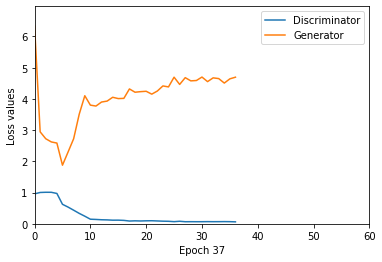

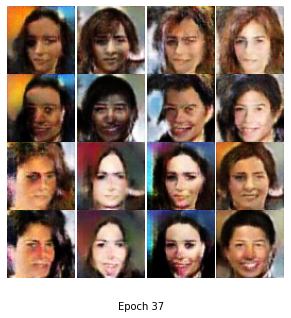

Epoch [38/60], Step [1/686], D_loss: 0.0425, G_loss: 4.6122
Epoch [38/60], Step [2/686], D_loss: 0.0398, G_loss: 4.7945
Epoch [38/60], Step [3/686], D_loss: 0.0695, G_loss: 4.2418
Epoch [38/60], Step [4/686], D_loss: 0.1352, G_loss: 5.8391
Epoch [38/60], Step [5/686], D_loss: 0.0569, G_loss: 4.8758
Epoch [38/60], Step [6/686], D_loss: 0.0343, G_loss: 4.4210
Epoch [38/60], Step [7/686], D_loss: 0.0653, G_loss: 5.2497
Epoch [38/60], Step [8/686], D_loss: 0.0676, G_loss: 4.5840
Epoch [38/60], Step [9/686], D_loss: 0.0443, G_loss: 4.1617
Epoch [38/60], Step [10/686], D_loss: 0.0614, G_loss: 4.8128
Epoch [38/60], Step [11/686], D_loss: 0.0838, G_loss: 6.4041
Epoch [38/60], Step [12/686], D_loss: 0.0331, G_loss: 4.7036
Epoch [38/60], Step [13/686], D_loss: 0.0865, G_loss: 4.1501
Epoch [38/60], Step [14/686], D_loss: 0.1343, G_loss: 4.6305
Epoch [38/60], Step [15/686], D_loss: 0.0493, G_loss: 6.8813
Epoch [38/60], Step [16/686], D_loss: 0.0344, G_loss: 6.1514
Epoch [38/60], Step [17/686], D_l

Epoch [38/60], Step [135/686], D_loss: 0.0871, G_loss: 5.3237
Epoch [38/60], Step [136/686], D_loss: 0.0860, G_loss: 4.0371
Epoch [38/60], Step [137/686], D_loss: 0.0898, G_loss: 3.9322
Epoch [38/60], Step [138/686], D_loss: 0.1312, G_loss: 5.2424
Epoch [38/60], Step [139/686], D_loss: 0.0690, G_loss: 5.9935
Epoch [38/60], Step [140/686], D_loss: 0.0589, G_loss: 5.7988
Epoch [38/60], Step [141/686], D_loss: 0.0455, G_loss: 5.6690
Epoch [38/60], Step [142/686], D_loss: 0.0431, G_loss: 5.4354
Epoch [38/60], Step [143/686], D_loss: 0.0231, G_loss: 5.6734
Epoch [38/60], Step [144/686], D_loss: 0.0573, G_loss: 3.7241
Epoch [38/60], Step [145/686], D_loss: 0.1082, G_loss: 4.1743
Epoch [38/60], Step [146/686], D_loss: 0.0377, G_loss: 5.6653
Epoch [38/60], Step [147/686], D_loss: 0.1204, G_loss: 4.0771
Epoch [38/60], Step [148/686], D_loss: 0.0697, G_loss: 4.3238
Epoch [38/60], Step [149/686], D_loss: 0.0739, G_loss: 5.1723
Epoch [38/60], Step [150/686], D_loss: 0.0192, G_loss: 3.9787
Epoch [3

Epoch [38/60], Step [268/686], D_loss: 0.0255, G_loss: 5.3340
Epoch [38/60], Step [269/686], D_loss: 0.1359, G_loss: 3.7187
Epoch [38/60], Step [270/686], D_loss: 0.0762, G_loss: 4.8833
Epoch [38/60], Step [271/686], D_loss: 0.0487, G_loss: 4.4964
Epoch [38/60], Step [272/686], D_loss: 0.0622, G_loss: 4.5940
Epoch [38/60], Step [273/686], D_loss: 0.0507, G_loss: 5.0337
Epoch [38/60], Step [274/686], D_loss: 0.0635, G_loss: 4.2174
Epoch [38/60], Step [275/686], D_loss: 0.0889, G_loss: 4.6364
Epoch [38/60], Step [276/686], D_loss: 0.0779, G_loss: 5.5312
Epoch [38/60], Step [277/686], D_loss: 0.1004, G_loss: 4.8202
Epoch [38/60], Step [278/686], D_loss: 0.0779, G_loss: 4.9299
Epoch [38/60], Step [279/686], D_loss: 0.0280, G_loss: 3.4104
Epoch [38/60], Step [280/686], D_loss: 0.0474, G_loss: 5.5432
Epoch [38/60], Step [281/686], D_loss: 0.0567, G_loss: 4.3070
Epoch [38/60], Step [282/686], D_loss: 0.0494, G_loss: 5.3380
Epoch [38/60], Step [283/686], D_loss: 0.0653, G_loss: 4.2350
Epoch [3

Epoch [38/60], Step [401/686], D_loss: 0.0329, G_loss: 5.0497
Epoch [38/60], Step [402/686], D_loss: 0.0288, G_loss: 4.1939
Epoch [38/60], Step [403/686], D_loss: 0.0520, G_loss: 4.8524
Epoch [38/60], Step [404/686], D_loss: 0.0368, G_loss: 4.5512
Epoch [38/60], Step [405/686], D_loss: 0.0782, G_loss: 5.0380
Epoch [38/60], Step [406/686], D_loss: 0.0350, G_loss: 4.2622
Epoch [38/60], Step [407/686], D_loss: 0.0954, G_loss: 4.9413
Epoch [38/60], Step [408/686], D_loss: 0.0780, G_loss: 4.2470
Epoch [38/60], Step [409/686], D_loss: 0.0152, G_loss: 5.6845
Epoch [38/60], Step [410/686], D_loss: 0.0330, G_loss: 4.7534
Epoch [38/60], Step [411/686], D_loss: 0.0557, G_loss: 5.9245
Epoch [38/60], Step [412/686], D_loss: 0.0642, G_loss: 5.4814
Epoch [38/60], Step [413/686], D_loss: 0.1155, G_loss: 4.4627
Epoch [38/60], Step [414/686], D_loss: 0.0243, G_loss: 5.2082
Epoch [38/60], Step [415/686], D_loss: 0.0904, G_loss: 5.0274
Epoch [38/60], Step [416/686], D_loss: 0.0678, G_loss: 4.6548
Epoch [3

Epoch [38/60], Step [534/686], D_loss: 0.0426, G_loss: 4.3555
Epoch [38/60], Step [535/686], D_loss: 0.0464, G_loss: 4.3834
Epoch [38/60], Step [536/686], D_loss: 0.0133, G_loss: 5.0505
Epoch [38/60], Step [537/686], D_loss: 0.0652, G_loss: 4.3099
Epoch [38/60], Step [538/686], D_loss: 0.0410, G_loss: 5.0197
Epoch [38/60], Step [539/686], D_loss: 0.0479, G_loss: 4.5117
Epoch [38/60], Step [540/686], D_loss: 0.0272, G_loss: 5.1603
Epoch [38/60], Step [541/686], D_loss: 0.0948, G_loss: 4.9952
Epoch [38/60], Step [542/686], D_loss: 0.0829, G_loss: 4.2788
Epoch [38/60], Step [543/686], D_loss: 0.0485, G_loss: 3.7831
Epoch [38/60], Step [544/686], D_loss: 0.0564, G_loss: 5.4780
Epoch [38/60], Step [545/686], D_loss: 0.0348, G_loss: 4.3710
Epoch [38/60], Step [546/686], D_loss: 0.0735, G_loss: 5.8606
Epoch [38/60], Step [547/686], D_loss: 0.0481, G_loss: 4.8276
Epoch [38/60], Step [548/686], D_loss: 0.0415, G_loss: 5.9797
Epoch [38/60], Step [549/686], D_loss: 0.0570, G_loss: 5.0345
Epoch [3

Epoch [38/60], Step [667/686], D_loss: 0.0536, G_loss: 5.1019
Epoch [38/60], Step [668/686], D_loss: 0.1207, G_loss: 5.4411
Epoch [38/60], Step [669/686], D_loss: 0.0569, G_loss: 5.7358
Epoch [38/60], Step [670/686], D_loss: 0.0360, G_loss: 4.9199
Epoch [38/60], Step [671/686], D_loss: 0.0236, G_loss: 4.7264
Epoch [38/60], Step [672/686], D_loss: 0.0737, G_loss: 5.6375
Epoch [38/60], Step [673/686], D_loss: 0.0403, G_loss: 4.8813
Epoch [38/60], Step [674/686], D_loss: 0.0255, G_loss: 4.9591
Epoch [38/60], Step [675/686], D_loss: 0.0505, G_loss: 6.3323
Epoch [38/60], Step [676/686], D_loss: 0.0436, G_loss: 5.2079
Epoch [38/60], Step [677/686], D_loss: 0.0497, G_loss: 4.1954
Epoch [38/60], Step [678/686], D_loss: 0.0317, G_loss: 5.7864
Epoch [38/60], Step [679/686], D_loss: 0.0746, G_loss: 5.3354
Epoch [38/60], Step [680/686], D_loss: 0.0378, G_loss: 5.6163
Epoch [38/60], Step [681/686], D_loss: 0.0393, G_loss: 5.3391
Epoch [38/60], Step [682/686], D_loss: 0.0347, G_loss: 5.0165
Epoch [3

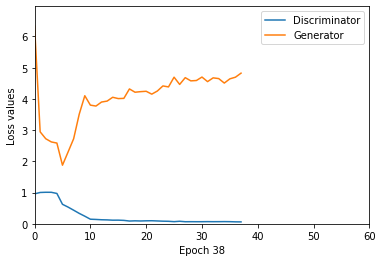

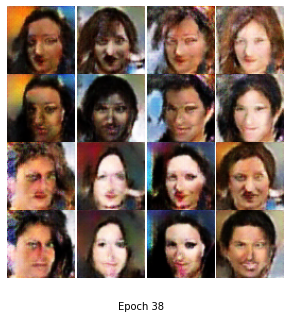

Epoch [39/60], Step [1/686], D_loss: 0.0578, G_loss: 5.9891
Epoch [39/60], Step [2/686], D_loss: 0.0373, G_loss: 5.2834
Epoch [39/60], Step [3/686], D_loss: 0.0367, G_loss: 4.7382
Epoch [39/60], Step [4/686], D_loss: 0.1235, G_loss: 3.7425
Epoch [39/60], Step [5/686], D_loss: 0.0428, G_loss: 4.7551
Epoch [39/60], Step [6/686], D_loss: 0.0480, G_loss: 3.4145
Epoch [39/60], Step [7/686], D_loss: 0.0725, G_loss: 5.3700
Epoch [39/60], Step [8/686], D_loss: 0.0597, G_loss: 3.6455
Epoch [39/60], Step [9/686], D_loss: 0.0732, G_loss: 5.2166
Epoch [39/60], Step [10/686], D_loss: 0.0735, G_loss: 6.3075
Epoch [39/60], Step [11/686], D_loss: 0.0464, G_loss: 4.7208
Epoch [39/60], Step [12/686], D_loss: 0.0335, G_loss: 5.9313
Epoch [39/60], Step [13/686], D_loss: 0.0736, G_loss: 5.6113
Epoch [39/60], Step [14/686], D_loss: 0.0754, G_loss: 4.8388
Epoch [39/60], Step [15/686], D_loss: 0.0358, G_loss: 6.0051
Epoch [39/60], Step [16/686], D_loss: 0.0250, G_loss: 5.0850
Epoch [39/60], Step [17/686], D_l

Epoch [39/60], Step [135/686], D_loss: 0.0443, G_loss: 4.4759
Epoch [39/60], Step [136/686], D_loss: 0.0687, G_loss: 5.2005
Epoch [39/60], Step [137/686], D_loss: 0.0723, G_loss: 3.7938
Epoch [39/60], Step [138/686], D_loss: 0.0666, G_loss: 3.6173
Epoch [39/60], Step [139/686], D_loss: 0.0602, G_loss: 4.6606
Epoch [39/60], Step [140/686], D_loss: 0.0430, G_loss: 4.9770
Epoch [39/60], Step [141/686], D_loss: 0.1358, G_loss: 5.7144
Epoch [39/60], Step [142/686], D_loss: 0.0441, G_loss: 5.6489
Epoch [39/60], Step [143/686], D_loss: 0.0439, G_loss: 6.5229
Epoch [39/60], Step [144/686], D_loss: 0.0531, G_loss: 5.5889
Epoch [39/60], Step [145/686], D_loss: 0.0767, G_loss: 4.4232
Epoch [39/60], Step [146/686], D_loss: 0.0305, G_loss: 5.3285
Epoch [39/60], Step [147/686], D_loss: 0.1939, G_loss: 5.6044
Epoch [39/60], Step [148/686], D_loss: 0.0376, G_loss: 3.9491
Epoch [39/60], Step [149/686], D_loss: 0.0713, G_loss: 5.7885
Epoch [39/60], Step [150/686], D_loss: 0.0564, G_loss: 5.1895
Epoch [3

Epoch [39/60], Step [268/686], D_loss: 0.0466, G_loss: 5.3149
Epoch [39/60], Step [269/686], D_loss: 0.1433, G_loss: 6.2833
Epoch [39/60], Step [270/686], D_loss: 0.0398, G_loss: 5.2871
Epoch [39/60], Step [271/686], D_loss: 0.0370, G_loss: 5.3204
Epoch [39/60], Step [272/686], D_loss: 0.0669, G_loss: 5.4412
Epoch [39/60], Step [273/686], D_loss: 0.0872, G_loss: 5.0542
Epoch [39/60], Step [274/686], D_loss: 0.0364, G_loss: 4.7953
Epoch [39/60], Step [275/686], D_loss: 0.0877, G_loss: 4.9622
Epoch [39/60], Step [276/686], D_loss: 0.0452, G_loss: 5.5598
Epoch [39/60], Step [277/686], D_loss: 0.1160, G_loss: 3.7741
Epoch [39/60], Step [278/686], D_loss: 0.0567, G_loss: 3.7246
Epoch [39/60], Step [279/686], D_loss: 0.0453, G_loss: 4.7895
Epoch [39/60], Step [280/686], D_loss: 0.0499, G_loss: 3.9477
Epoch [39/60], Step [281/686], D_loss: 0.0550, G_loss: 3.6899
Epoch [39/60], Step [282/686], D_loss: 0.1116, G_loss: 5.8900
Epoch [39/60], Step [283/686], D_loss: 0.0571, G_loss: 5.1763
Epoch [3

Epoch [39/60], Step [401/686], D_loss: 0.0394, G_loss: 4.9654
Epoch [39/60], Step [402/686], D_loss: 0.0369, G_loss: 5.7053
Epoch [39/60], Step [403/686], D_loss: 0.0556, G_loss: 4.0842
Epoch [39/60], Step [404/686], D_loss: 0.0611, G_loss: 4.5719
Epoch [39/60], Step [405/686], D_loss: 0.0364, G_loss: 4.5337
Epoch [39/60], Step [406/686], D_loss: 0.0569, G_loss: 5.6802
Epoch [39/60], Step [407/686], D_loss: 0.0793, G_loss: 4.5983
Epoch [39/60], Step [408/686], D_loss: 0.0685, G_loss: 4.5003
Epoch [39/60], Step [409/686], D_loss: 0.0160, G_loss: 5.3012
Epoch [39/60], Step [410/686], D_loss: 0.0392, G_loss: 4.7691
Epoch [39/60], Step [411/686], D_loss: 0.0676, G_loss: 5.7080
Epoch [39/60], Step [412/686], D_loss: 0.0301, G_loss: 4.2055
Epoch [39/60], Step [413/686], D_loss: 0.0825, G_loss: 5.1103
Epoch [39/60], Step [414/686], D_loss: 0.0438, G_loss: 4.6603
Epoch [39/60], Step [415/686], D_loss: 0.0722, G_loss: 5.1068
Epoch [39/60], Step [416/686], D_loss: 0.0634, G_loss: 4.9159
Epoch [3

Epoch [39/60], Step [534/686], D_loss: 0.0394, G_loss: 5.1216
Epoch [39/60], Step [535/686], D_loss: 0.0534, G_loss: 3.5271
Epoch [39/60], Step [536/686], D_loss: 0.0328, G_loss: 4.8768
Epoch [39/60], Step [537/686], D_loss: 0.0555, G_loss: 4.4514
Epoch [39/60], Step [538/686], D_loss: 0.0563, G_loss: 4.8514
Epoch [39/60], Step [539/686], D_loss: 0.0609, G_loss: 5.3608
Epoch [39/60], Step [540/686], D_loss: 0.0372, G_loss: 6.4585
Epoch [39/60], Step [541/686], D_loss: 0.0954, G_loss: 6.3168
Epoch [39/60], Step [542/686], D_loss: 0.1715, G_loss: 4.3381
Epoch [39/60], Step [543/686], D_loss: 0.0250, G_loss: 4.7253
Epoch [39/60], Step [544/686], D_loss: 0.2699, G_loss: 5.6661
Epoch [39/60], Step [545/686], D_loss: 0.0332, G_loss: 6.3085
Epoch [39/60], Step [546/686], D_loss: 0.1060, G_loss: 5.5620
Epoch [39/60], Step [547/686], D_loss: 0.0789, G_loss: 5.1066
Epoch [39/60], Step [548/686], D_loss: 0.0282, G_loss: 5.7294
Epoch [39/60], Step [549/686], D_loss: 0.0939, G_loss: 4.9623
Epoch [3

Epoch [39/60], Step [667/686], D_loss: 0.0609, G_loss: 5.8270
Epoch [39/60], Step [668/686], D_loss: 0.0346, G_loss: 5.2096
Epoch [39/60], Step [669/686], D_loss: 0.0383, G_loss: 5.1769
Epoch [39/60], Step [670/686], D_loss: 0.0189, G_loss: 5.2596
Epoch [39/60], Step [671/686], D_loss: 0.0460, G_loss: 4.8129
Epoch [39/60], Step [672/686], D_loss: 0.0642, G_loss: 4.7511
Epoch [39/60], Step [673/686], D_loss: 0.0248, G_loss: 5.5979
Epoch [39/60], Step [674/686], D_loss: 0.0130, G_loss: 5.1742
Epoch [39/60], Step [675/686], D_loss: 0.0734, G_loss: 5.6818
Epoch [39/60], Step [676/686], D_loss: 0.0303, G_loss: 7.7446
Epoch [39/60], Step [677/686], D_loss: 0.0471, G_loss: 5.5004
Epoch [39/60], Step [678/686], D_loss: 0.0765, G_loss: 5.2231
Epoch [39/60], Step [679/686], D_loss: 0.0882, G_loss: 6.2708
Epoch [39/60], Step [680/686], D_loss: 0.0942, G_loss: 5.8400
Epoch [39/60], Step [681/686], D_loss: 0.0308, G_loss: 5.8029
Epoch [39/60], Step [682/686], D_loss: 0.0537, G_loss: 4.6354
Epoch [3

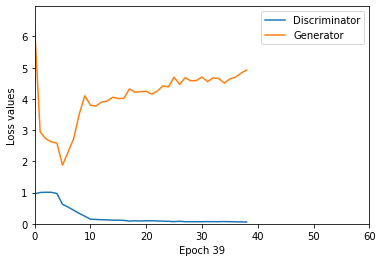

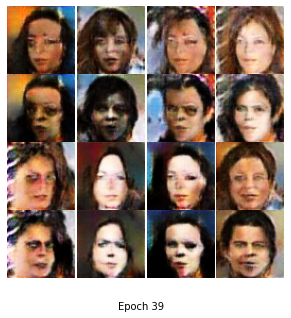

Epoch [40/60], Step [1/686], D_loss: 0.0751, G_loss: 5.4266
Epoch [40/60], Step [2/686], D_loss: 0.0259, G_loss: 5.2982
Epoch [40/60], Step [3/686], D_loss: 0.0257, G_loss: 4.9147
Epoch [40/60], Step [4/686], D_loss: 0.1178, G_loss: 5.0593
Epoch [40/60], Step [5/686], D_loss: 0.0362, G_loss: 4.1937
Epoch [40/60], Step [6/686], D_loss: 0.0460, G_loss: 3.9977
Epoch [40/60], Step [7/686], D_loss: 0.0737, G_loss: 5.5296
Epoch [40/60], Step [8/686], D_loss: 0.0626, G_loss: 5.8161
Epoch [40/60], Step [9/686], D_loss: 0.0476, G_loss: 5.2646
Epoch [40/60], Step [10/686], D_loss: 0.0425, G_loss: 4.4050
Epoch [40/60], Step [11/686], D_loss: 0.0334, G_loss: 4.5580
Epoch [40/60], Step [12/686], D_loss: 0.0262, G_loss: 4.3402
Epoch [40/60], Step [13/686], D_loss: 0.0380, G_loss: 5.7227
Epoch [40/60], Step [14/686], D_loss: 0.0703, G_loss: 4.9487
Epoch [40/60], Step [15/686], D_loss: 0.0233, G_loss: 5.1279
Epoch [40/60], Step [16/686], D_loss: 0.0233, G_loss: 6.0457
Epoch [40/60], Step [17/686], D_l

Epoch [40/60], Step [135/686], D_loss: 0.0441, G_loss: 5.4121
Epoch [40/60], Step [136/686], D_loss: 0.0708, G_loss: 5.0048
Epoch [40/60], Step [137/686], D_loss: 0.0687, G_loss: 4.1468
Epoch [40/60], Step [138/686], D_loss: 0.0525, G_loss: 2.9274
Epoch [40/60], Step [139/686], D_loss: 0.0684, G_loss: 3.8967
Epoch [40/60], Step [140/686], D_loss: 0.0721, G_loss: 4.2219
Epoch [40/60], Step [141/686], D_loss: 0.0466, G_loss: 4.9563
Epoch [40/60], Step [142/686], D_loss: 0.0535, G_loss: 5.2508
Epoch [40/60], Step [143/686], D_loss: 0.0475, G_loss: 5.6190
Epoch [40/60], Step [144/686], D_loss: 0.0430, G_loss: 4.6871
Epoch [40/60], Step [145/686], D_loss: 0.0965, G_loss: 5.3446
Epoch [40/60], Step [146/686], D_loss: 0.0687, G_loss: 6.3397
Epoch [40/60], Step [147/686], D_loss: 0.1661, G_loss: 5.4951
Epoch [40/60], Step [148/686], D_loss: 0.0222, G_loss: 4.3742
Epoch [40/60], Step [149/686], D_loss: 0.0608, G_loss: 4.9626
Epoch [40/60], Step [150/686], D_loss: 0.0652, G_loss: 4.6220
Epoch [4

Epoch [40/60], Step [268/686], D_loss: 0.0125, G_loss: 5.3211
Epoch [40/60], Step [269/686], D_loss: 0.1379, G_loss: 4.1654
Epoch [40/60], Step [270/686], D_loss: 0.0662, G_loss: 3.8528
Epoch [40/60], Step [271/686], D_loss: 0.0159, G_loss: 4.7760
Epoch [40/60], Step [272/686], D_loss: 0.0887, G_loss: 5.9122
Epoch [40/60], Step [273/686], D_loss: 0.0300, G_loss: 5.6041
Epoch [40/60], Step [274/686], D_loss: 0.0430, G_loss: 5.6297
Epoch [40/60], Step [275/686], D_loss: 0.0443, G_loss: 4.6570
Epoch [40/60], Step [276/686], D_loss: 0.0594, G_loss: 3.6430
Epoch [40/60], Step [277/686], D_loss: 0.1527, G_loss: 4.3995
Epoch [40/60], Step [278/686], D_loss: 0.0467, G_loss: 4.5646
Epoch [40/60], Step [279/686], D_loss: 0.0823, G_loss: 4.6951
Epoch [40/60], Step [280/686], D_loss: 0.0657, G_loss: 4.3947
Epoch [40/60], Step [281/686], D_loss: 0.0547, G_loss: 5.4351
Epoch [40/60], Step [282/686], D_loss: 0.0581, G_loss: 5.1215
Epoch [40/60], Step [283/686], D_loss: 0.0678, G_loss: 5.1279
Epoch [4

Epoch [40/60], Step [401/686], D_loss: 0.0283, G_loss: 5.2972
Epoch [40/60], Step [402/686], D_loss: 0.0607, G_loss: 5.7736
Epoch [40/60], Step [403/686], D_loss: 0.0602, G_loss: 4.7915
Epoch [40/60], Step [404/686], D_loss: 0.0438, G_loss: 5.0255
Epoch [40/60], Step [405/686], D_loss: 0.0508, G_loss: 4.6462
Epoch [40/60], Step [406/686], D_loss: 0.0890, G_loss: 5.1131
Epoch [40/60], Step [407/686], D_loss: 0.0511, G_loss: 5.3322
Epoch [40/60], Step [408/686], D_loss: 0.1120, G_loss: 5.0710
Epoch [40/60], Step [409/686], D_loss: 0.0161, G_loss: 5.2293
Epoch [40/60], Step [410/686], D_loss: 0.0179, G_loss: 3.8449
Epoch [40/60], Step [411/686], D_loss: 0.0372, G_loss: 4.7549
Epoch [40/60], Step [412/686], D_loss: 0.0416, G_loss: 4.4625
Epoch [40/60], Step [413/686], D_loss: 0.1832, G_loss: 4.6046
Epoch [40/60], Step [414/686], D_loss: 0.0326, G_loss: 6.1150
Epoch [40/60], Step [415/686], D_loss: 0.0763, G_loss: 4.8045
Epoch [40/60], Step [416/686], D_loss: 0.0212, G_loss: 4.6217
Epoch [4

Epoch [40/60], Step [534/686], D_loss: 0.0309, G_loss: 5.0657
Epoch [40/60], Step [535/686], D_loss: 0.0370, G_loss: 3.3083
Epoch [40/60], Step [536/686], D_loss: 0.0109, G_loss: 5.6599
Epoch [40/60], Step [537/686], D_loss: 0.0530, G_loss: 4.2145
Epoch [40/60], Step [538/686], D_loss: 0.0562, G_loss: 3.4989
Epoch [40/60], Step [539/686], D_loss: 0.0243, G_loss: 5.7361
Epoch [40/60], Step [540/686], D_loss: 0.0253, G_loss: 5.4092
Epoch [40/60], Step [541/686], D_loss: 0.0792, G_loss: 5.3169
Epoch [40/60], Step [542/686], D_loss: 0.0717, G_loss: 5.4129
Epoch [40/60], Step [543/686], D_loss: 0.0431, G_loss: 4.8225
Epoch [40/60], Step [544/686], D_loss: 0.0395, G_loss: 6.6416
Epoch [40/60], Step [545/686], D_loss: 0.0156, G_loss: 5.0514
Epoch [40/60], Step [546/686], D_loss: 0.0431, G_loss: 5.0199
Epoch [40/60], Step [547/686], D_loss: 0.0393, G_loss: 5.3249
Epoch [40/60], Step [548/686], D_loss: 0.0318, G_loss: 4.8245
Epoch [40/60], Step [549/686], D_loss: 0.0662, G_loss: 4.8457
Epoch [4

Epoch [40/60], Step [667/686], D_loss: 0.0360, G_loss: 5.3019
Epoch [40/60], Step [668/686], D_loss: 0.0387, G_loss: 4.9405
Epoch [40/60], Step [669/686], D_loss: 0.0351, G_loss: 5.1877
Epoch [40/60], Step [670/686], D_loss: 0.0302, G_loss: 5.0684
Epoch [40/60], Step [671/686], D_loss: 0.0406, G_loss: 4.4495
Epoch [40/60], Step [672/686], D_loss: 0.0484, G_loss: 5.0097
Epoch [40/60], Step [673/686], D_loss: 0.0272, G_loss: 5.1715
Epoch [40/60], Step [674/686], D_loss: 0.0337, G_loss: 5.8985
Epoch [40/60], Step [675/686], D_loss: 0.0441, G_loss: 5.8016
Epoch [40/60], Step [676/686], D_loss: 0.0566, G_loss: 5.6065
Epoch [40/60], Step [677/686], D_loss: 0.0288, G_loss: 6.2270
Epoch [40/60], Step [678/686], D_loss: 0.0424, G_loss: 5.3969
Epoch [40/60], Step [679/686], D_loss: 0.0661, G_loss: 4.8518
Epoch [40/60], Step [680/686], D_loss: 0.0379, G_loss: 4.7915
Epoch [40/60], Step [681/686], D_loss: 0.0385, G_loss: 5.0124
Epoch [40/60], Step [682/686], D_loss: 0.0594, G_loss: 4.6690
Epoch [4

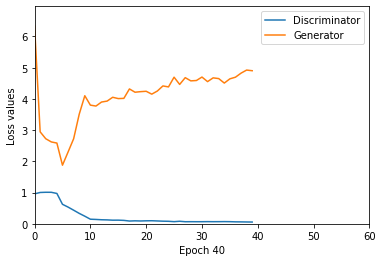

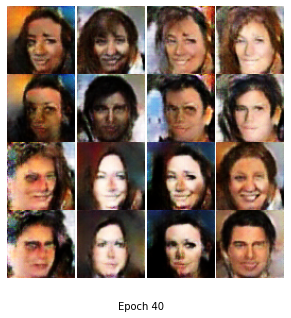

Epoch [41/60], Step [1/686], D_loss: 0.1001, G_loss: 5.4059
Epoch [41/60], Step [2/686], D_loss: 0.0468, G_loss: 5.6675
Epoch [41/60], Step [3/686], D_loss: 0.0272, G_loss: 6.1425
Epoch [41/60], Step [4/686], D_loss: 0.0997, G_loss: 5.8124
Epoch [41/60], Step [5/686], D_loss: 0.0488, G_loss: 5.1897
Epoch [41/60], Step [6/686], D_loss: 0.0339, G_loss: 5.3024
Epoch [41/60], Step [7/686], D_loss: 0.0481, G_loss: 5.2887
Epoch [41/60], Step [8/686], D_loss: 0.0410, G_loss: 5.2867
Epoch [41/60], Step [9/686], D_loss: 0.0524, G_loss: 5.1382
Epoch [41/60], Step [10/686], D_loss: 0.0475, G_loss: 5.6093
Epoch [41/60], Step [11/686], D_loss: 0.0624, G_loss: 5.5620
Epoch [41/60], Step [12/686], D_loss: 0.0137, G_loss: 6.5315
Epoch [41/60], Step [13/686], D_loss: 0.0446, G_loss: 4.4243
Epoch [41/60], Step [14/686], D_loss: 0.0695, G_loss: 4.7076
Epoch [41/60], Step [15/686], D_loss: 0.0220, G_loss: 4.9042
Epoch [41/60], Step [16/686], D_loss: 0.0383, G_loss: 6.1440
Epoch [41/60], Step [17/686], D_l

Epoch [41/60], Step [135/686], D_loss: 0.0445, G_loss: 5.0289
Epoch [41/60], Step [136/686], D_loss: 0.0611, G_loss: 4.7496
Epoch [41/60], Step [137/686], D_loss: 0.0498, G_loss: 4.7122
Epoch [41/60], Step [138/686], D_loss: 0.1290, G_loss: 4.5162
Epoch [41/60], Step [139/686], D_loss: 0.0380, G_loss: 5.0030
Epoch [41/60], Step [140/686], D_loss: 0.0622, G_loss: 5.4243
Epoch [41/60], Step [141/686], D_loss: 0.0354, G_loss: 5.2268
Epoch [41/60], Step [142/686], D_loss: 0.0474, G_loss: 4.5240
Epoch [41/60], Step [143/686], D_loss: 0.0330, G_loss: 6.2466
Epoch [41/60], Step [144/686], D_loss: 0.0319, G_loss: 4.8464
Epoch [41/60], Step [145/686], D_loss: 0.0447, G_loss: 4.5681
Epoch [41/60], Step [146/686], D_loss: 0.0311, G_loss: 5.1986
Epoch [41/60], Step [147/686], D_loss: 0.0774, G_loss: 5.1178
Epoch [41/60], Step [148/686], D_loss: 0.0574, G_loss: 4.9244
Epoch [41/60], Step [149/686], D_loss: 0.0819, G_loss: 5.9151
Epoch [41/60], Step [150/686], D_loss: 0.0403, G_loss: 5.4797
Epoch [4

Epoch [41/60], Step [268/686], D_loss: 0.0303, G_loss: 5.0548
Epoch [41/60], Step [269/686], D_loss: 0.1225, G_loss: 4.3204
Epoch [41/60], Step [270/686], D_loss: 0.0393, G_loss: 4.7822
Epoch [41/60], Step [271/686], D_loss: 0.0466, G_loss: 4.9193
Epoch [41/60], Step [272/686], D_loss: 0.0837, G_loss: 4.4109
Epoch [41/60], Step [273/686], D_loss: 0.0284, G_loss: 4.1044
Epoch [41/60], Step [274/686], D_loss: 0.0539, G_loss: 4.8396
Epoch [41/60], Step [275/686], D_loss: 0.0650, G_loss: 5.1224
Epoch [41/60], Step [276/686], D_loss: 0.0694, G_loss: 5.3337
Epoch [41/60], Step [277/686], D_loss: 0.1156, G_loss: 3.9546
Epoch [41/60], Step [278/686], D_loss: 0.0843, G_loss: 3.9480
Epoch [41/60], Step [279/686], D_loss: 0.0360, G_loss: 4.1424
Epoch [41/60], Step [280/686], D_loss: 0.0667, G_loss: 5.0585
Epoch [41/60], Step [281/686], D_loss: 0.0621, G_loss: 5.9498
Epoch [41/60], Step [282/686], D_loss: 0.0653, G_loss: 5.2179
Epoch [41/60], Step [283/686], D_loss: 0.0736, G_loss: 5.8145
Epoch [4

Epoch [41/60], Step [401/686], D_loss: 0.0434, G_loss: 5.8685
Epoch [41/60], Step [402/686], D_loss: 0.0602, G_loss: 5.8348
Epoch [41/60], Step [403/686], D_loss: 0.0838, G_loss: 4.4555
Epoch [41/60], Step [404/686], D_loss: 0.0685, G_loss: 3.6876
Epoch [41/60], Step [405/686], D_loss: 0.0417, G_loss: 5.6744
Epoch [41/60], Step [406/686], D_loss: 0.0582, G_loss: 5.2360
Epoch [41/60], Step [407/686], D_loss: 0.0931, G_loss: 4.1947
Epoch [41/60], Step [408/686], D_loss: 0.0534, G_loss: 4.3772
Epoch [41/60], Step [409/686], D_loss: 0.0182, G_loss: 5.0806
Epoch [41/60], Step [410/686], D_loss: 0.0484, G_loss: 3.7787
Epoch [41/60], Step [411/686], D_loss: 0.0896, G_loss: 5.3082
Epoch [41/60], Step [412/686], D_loss: 0.0318, G_loss: 4.6376
Epoch [41/60], Step [413/686], D_loss: 0.0907, G_loss: 4.3335
Epoch [41/60], Step [414/686], D_loss: 0.0622, G_loss: 4.2814
Epoch [41/60], Step [415/686], D_loss: 0.0531, G_loss: 4.5065
Epoch [41/60], Step [416/686], D_loss: 0.0363, G_loss: 4.3839
Epoch [4

Epoch [41/60], Step [534/686], D_loss: 0.0418, G_loss: 4.3158
Epoch [41/60], Step [535/686], D_loss: 0.0880, G_loss: 4.0170
Epoch [41/60], Step [536/686], D_loss: 0.0349, G_loss: 4.2343
Epoch [41/60], Step [537/686], D_loss: 0.1180, G_loss: 5.1454
Epoch [41/60], Step [538/686], D_loss: 0.0784, G_loss: 4.7967
Epoch [41/60], Step [539/686], D_loss: 0.0259, G_loss: 5.5102
Epoch [41/60], Step [540/686], D_loss: 0.0253, G_loss: 5.0959
Epoch [41/60], Step [541/686], D_loss: 0.0696, G_loss: 5.3462
Epoch [41/60], Step [542/686], D_loss: 0.1068, G_loss: 4.9840
Epoch [41/60], Step [543/686], D_loss: 0.0219, G_loss: 3.9961
Epoch [41/60], Step [544/686], D_loss: 0.1132, G_loss: 4.5857
Epoch [41/60], Step [545/686], D_loss: 0.0258, G_loss: 4.2172
Epoch [41/60], Step [546/686], D_loss: 0.0763, G_loss: 6.1580
Epoch [41/60], Step [547/686], D_loss: 0.0470, G_loss: 5.1477
Epoch [41/60], Step [548/686], D_loss: 0.0327, G_loss: 5.0656
Epoch [41/60], Step [549/686], D_loss: 0.0798, G_loss: 4.8204
Epoch [4

Epoch [41/60], Step [667/686], D_loss: 0.0512, G_loss: 3.0872
Epoch [41/60], Step [668/686], D_loss: 0.0570, G_loss: 4.9822
Epoch [41/60], Step [669/686], D_loss: 0.0484, G_loss: 4.7980
Epoch [41/60], Step [670/686], D_loss: 0.0206, G_loss: 4.7184
Epoch [41/60], Step [671/686], D_loss: 0.0230, G_loss: 4.6583
Epoch [41/60], Step [672/686], D_loss: 0.0502, G_loss: 5.1556
Epoch [41/60], Step [673/686], D_loss: 0.0255, G_loss: 5.1158
Epoch [41/60], Step [674/686], D_loss: 0.0240, G_loss: 5.2620
Epoch [41/60], Step [675/686], D_loss: 0.0575, G_loss: 4.8843
Epoch [41/60], Step [676/686], D_loss: 0.0623, G_loss: 4.3566
Epoch [41/60], Step [677/686], D_loss: 0.0449, G_loss: 4.0617
Epoch [41/60], Step [678/686], D_loss: 0.0500, G_loss: 4.8587
Epoch [41/60], Step [679/686], D_loss: 0.0403, G_loss: 5.0335
Epoch [41/60], Step [680/686], D_loss: 0.0728, G_loss: 4.2221
Epoch [41/60], Step [681/686], D_loss: 0.0431, G_loss: 3.1958
Epoch [41/60], Step [682/686], D_loss: 0.0395, G_loss: 4.4126
Epoch [4

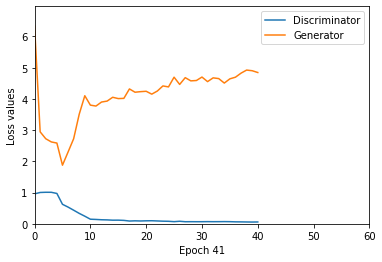

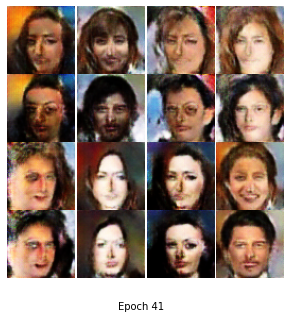

Epoch [42/60], Step [1/686], D_loss: 0.0658, G_loss: 4.7993
Epoch [42/60], Step [2/686], D_loss: 0.0747, G_loss: 5.5583
Epoch [42/60], Step [3/686], D_loss: 0.0472, G_loss: 5.2153
Epoch [42/60], Step [4/686], D_loss: 0.0941, G_loss: 4.6381
Epoch [42/60], Step [5/686], D_loss: 0.0871, G_loss: 5.7656
Epoch [42/60], Step [6/686], D_loss: 0.0590, G_loss: 3.9586
Epoch [42/60], Step [7/686], D_loss: 0.0695, G_loss: 4.0040
Epoch [42/60], Step [8/686], D_loss: 0.0573, G_loss: 5.0760
Epoch [42/60], Step [9/686], D_loss: 0.0570, G_loss: 5.5039
Epoch [42/60], Step [10/686], D_loss: 0.0507, G_loss: 5.7139
Epoch [42/60], Step [11/686], D_loss: 0.0518, G_loss: 3.9098
Epoch [42/60], Step [12/686], D_loss: 0.0604, G_loss: 5.3202
Epoch [42/60], Step [13/686], D_loss: 0.0690, G_loss: 5.2391
Epoch [42/60], Step [14/686], D_loss: 0.0373, G_loss: 5.0078
Epoch [42/60], Step [15/686], D_loss: 0.0357, G_loss: 6.0189
Epoch [42/60], Step [16/686], D_loss: 0.0173, G_loss: 4.5735
Epoch [42/60], Step [17/686], D_l

Epoch [42/60], Step [135/686], D_loss: 0.0900, G_loss: 5.1712
Epoch [42/60], Step [136/686], D_loss: 0.0954, G_loss: 4.8847
Epoch [42/60], Step [137/686], D_loss: 0.0649, G_loss: 4.0005
Epoch [42/60], Step [138/686], D_loss: 0.0427, G_loss: 5.0905
Epoch [42/60], Step [139/686], D_loss: 0.0371, G_loss: 4.0447
Epoch [42/60], Step [140/686], D_loss: 0.0625, G_loss: 3.4434
Epoch [42/60], Step [141/686], D_loss: 0.0485, G_loss: 5.1775
Epoch [42/60], Step [142/686], D_loss: 0.0561, G_loss: 4.7092
Epoch [42/60], Step [143/686], D_loss: 0.0618, G_loss: 5.6270
Epoch [42/60], Step [144/686], D_loss: 0.0249, G_loss: 5.5496
Epoch [42/60], Step [145/686], D_loss: 0.0630, G_loss: 5.1326
Epoch [42/60], Step [146/686], D_loss: 0.0210, G_loss: 5.0688
Epoch [42/60], Step [147/686], D_loss: 0.0754, G_loss: 4.5133
Epoch [42/60], Step [148/686], D_loss: 0.0268, G_loss: 4.3131
Epoch [42/60], Step [149/686], D_loss: 0.0920, G_loss: 3.9280
Epoch [42/60], Step [150/686], D_loss: 0.0266, G_loss: 4.4817
Epoch [4

Epoch [42/60], Step [268/686], D_loss: 0.0397, G_loss: 4.7546
Epoch [42/60], Step [269/686], D_loss: 0.1338, G_loss: 4.3469
Epoch [42/60], Step [270/686], D_loss: 0.0264, G_loss: 5.1792
Epoch [42/60], Step [271/686], D_loss: 0.0350, G_loss: 4.7041
Epoch [42/60], Step [272/686], D_loss: 0.0475, G_loss: 4.8972
Epoch [42/60], Step [273/686], D_loss: 0.0631, G_loss: 5.1108
Epoch [42/60], Step [274/686], D_loss: 0.0716, G_loss: 3.8894
Epoch [42/60], Step [275/686], D_loss: 0.1109, G_loss: 5.2912
Epoch [42/60], Step [276/686], D_loss: 0.0500, G_loss: 4.6612
Epoch [42/60], Step [277/686], D_loss: 0.1362, G_loss: 3.3824
Epoch [42/60], Step [278/686], D_loss: 0.1239, G_loss: 4.0584
Epoch [42/60], Step [279/686], D_loss: 0.0383, G_loss: 4.9588
Epoch [42/60], Step [280/686], D_loss: 0.0636, G_loss: 3.5243
Epoch [42/60], Step [281/686], D_loss: 0.0863, G_loss: 5.0003
Epoch [42/60], Step [282/686], D_loss: 0.0767, G_loss: 4.6844
Epoch [42/60], Step [283/686], D_loss: 0.0830, G_loss: 4.5915
Epoch [4

Epoch [42/60], Step [401/686], D_loss: 0.0206, G_loss: 5.5724
Epoch [42/60], Step [402/686], D_loss: 0.0440, G_loss: 4.8301
Epoch [42/60], Step [403/686], D_loss: 0.0374, G_loss: 4.8302
Epoch [42/60], Step [404/686], D_loss: 0.0236, G_loss: 4.4630
Epoch [42/60], Step [405/686], D_loss: 0.0423, G_loss: 4.7434
Epoch [42/60], Step [406/686], D_loss: 0.0527, G_loss: 5.7395
Epoch [42/60], Step [407/686], D_loss: 0.0538, G_loss: 5.3183
Epoch [42/60], Step [408/686], D_loss: 0.0535, G_loss: 5.5701
Epoch [42/60], Step [409/686], D_loss: 0.0194, G_loss: 6.1046
Epoch [42/60], Step [410/686], D_loss: 0.0321, G_loss: 4.9787
Epoch [42/60], Step [411/686], D_loss: 0.0733, G_loss: 5.4009
Epoch [42/60], Step [412/686], D_loss: 0.0221, G_loss: 4.9172
Epoch [42/60], Step [413/686], D_loss: 0.0451, G_loss: 4.2627
Epoch [42/60], Step [414/686], D_loss: 0.0385, G_loss: 5.7252
Epoch [42/60], Step [415/686], D_loss: 0.0329, G_loss: 5.1582
Epoch [42/60], Step [416/686], D_loss: 0.0335, G_loss: 5.0699
Epoch [4

Epoch [42/60], Step [534/686], D_loss: 0.0517, G_loss: 5.3438
Epoch [42/60], Step [535/686], D_loss: 0.0769, G_loss: 5.1844
Epoch [42/60], Step [536/686], D_loss: 0.0338, G_loss: 4.5545
Epoch [42/60], Step [537/686], D_loss: 0.0644, G_loss: 3.9401
Epoch [42/60], Step [538/686], D_loss: 0.0518, G_loss: 3.9709
Epoch [42/60], Step [539/686], D_loss: 0.0435, G_loss: 5.6912
Epoch [42/60], Step [540/686], D_loss: 0.0364, G_loss: 4.6132
Epoch [42/60], Step [541/686], D_loss: 0.0538, G_loss: 4.3362
Epoch [42/60], Step [542/686], D_loss: 0.1011, G_loss: 4.1445
Epoch [42/60], Step [543/686], D_loss: 0.0240, G_loss: 5.2768
Epoch [42/60], Step [544/686], D_loss: 0.0840, G_loss: 4.5841
Epoch [42/60], Step [545/686], D_loss: 0.0565, G_loss: 4.9474
Epoch [42/60], Step [546/686], D_loss: 0.0660, G_loss: 5.9859
Epoch [42/60], Step [547/686], D_loss: 0.0648, G_loss: 4.3807
Epoch [42/60], Step [548/686], D_loss: 0.0248, G_loss: 4.7572
Epoch [42/60], Step [549/686], D_loss: 0.0873, G_loss: 4.4987
Epoch [4

Epoch [42/60], Step [667/686], D_loss: 0.0525, G_loss: 4.5381
Epoch [42/60], Step [668/686], D_loss: 0.0696, G_loss: 4.4942
Epoch [42/60], Step [669/686], D_loss: 0.0959, G_loss: 5.5677
Epoch [42/60], Step [670/686], D_loss: 0.0428, G_loss: 5.2639
Epoch [42/60], Step [671/686], D_loss: 0.0269, G_loss: 7.1633
Epoch [42/60], Step [672/686], D_loss: 0.0840, G_loss: 5.5295
Epoch [42/60], Step [673/686], D_loss: 0.0391, G_loss: 4.2913
Epoch [42/60], Step [674/686], D_loss: 0.0437, G_loss: 5.2924
Epoch [42/60], Step [675/686], D_loss: 0.0643, G_loss: 3.5401
Epoch [42/60], Step [676/686], D_loss: 0.0396, G_loss: 4.0753
Epoch [42/60], Step [677/686], D_loss: 0.0631, G_loss: 5.0448
Epoch [42/60], Step [678/686], D_loss: 0.0587, G_loss: 3.7309
Epoch [42/60], Step [679/686], D_loss: 0.1080, G_loss: 3.2271
Epoch [42/60], Step [680/686], D_loss: 0.0698, G_loss: 3.9042
Epoch [42/60], Step [681/686], D_loss: 0.0485, G_loss: 4.3769
Epoch [42/60], Step [682/686], D_loss: 0.0577, G_loss: 4.2598
Epoch [4

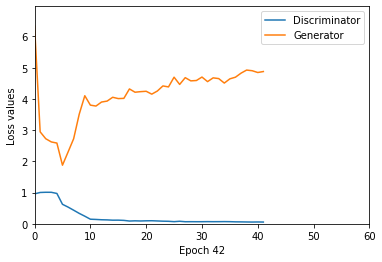

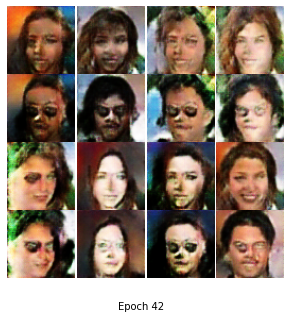

Epoch [43/60], Step [1/686], D_loss: 0.1259, G_loss: 3.4831
Epoch [43/60], Step [2/686], D_loss: 0.0848, G_loss: 5.1431
Epoch [43/60], Step [3/686], D_loss: 0.0674, G_loss: 2.8474
Epoch [43/60], Step [4/686], D_loss: 0.1610, G_loss: 4.5196
Epoch [43/60], Step [5/686], D_loss: 0.0947, G_loss: 5.2453
Epoch [43/60], Step [6/686], D_loss: 0.0834, G_loss: 4.3049
Epoch [43/60], Step [7/686], D_loss: 0.1447, G_loss: 5.8567
Epoch [43/60], Step [8/686], D_loss: 0.0672, G_loss: 5.2181
Epoch [43/60], Step [9/686], D_loss: 0.0619, G_loss: 5.2223
Epoch [43/60], Step [10/686], D_loss: 0.0629, G_loss: 4.9802
Epoch [43/60], Step [11/686], D_loss: 0.0551, G_loss: 3.5302
Epoch [43/60], Step [12/686], D_loss: 0.0388, G_loss: 4.7882
Epoch [43/60], Step [13/686], D_loss: 0.0812, G_loss: 4.7395
Epoch [43/60], Step [14/686], D_loss: 0.0584, G_loss: 5.0307
Epoch [43/60], Step [15/686], D_loss: 0.0473, G_loss: 5.7435
Epoch [43/60], Step [16/686], D_loss: 0.0313, G_loss: 4.9839
Epoch [43/60], Step [17/686], D_l

Epoch [43/60], Step [135/686], D_loss: 0.0526, G_loss: 5.2961
Epoch [43/60], Step [136/686], D_loss: 0.0548, G_loss: 5.2645
Epoch [43/60], Step [137/686], D_loss: 0.0611, G_loss: 4.6599
Epoch [43/60], Step [138/686], D_loss: 0.0547, G_loss: 5.6499
Epoch [43/60], Step [139/686], D_loss: 0.0316, G_loss: 5.1217
Epoch [43/60], Step [140/686], D_loss: 0.0637, G_loss: 4.0918
Epoch [43/60], Step [141/686], D_loss: 0.0688, G_loss: 4.6856
Epoch [43/60], Step [142/686], D_loss: 0.0539, G_loss: 4.7614
Epoch [43/60], Step [143/686], D_loss: 0.0257, G_loss: 4.8115
Epoch [43/60], Step [144/686], D_loss: 0.0537, G_loss: 4.3969
Epoch [43/60], Step [145/686], D_loss: 0.0715, G_loss: 4.7456
Epoch [43/60], Step [146/686], D_loss: 0.0168, G_loss: 4.3548
Epoch [43/60], Step [147/686], D_loss: 0.0703, G_loss: 4.1727
Epoch [43/60], Step [148/686], D_loss: 0.0447, G_loss: 5.5898
Epoch [43/60], Step [149/686], D_loss: 0.0572, G_loss: 3.4559
Epoch [43/60], Step [150/686], D_loss: 0.0230, G_loss: 4.0115
Epoch [4

Epoch [43/60], Step [268/686], D_loss: 0.0554, G_loss: 5.8122
Epoch [43/60], Step [269/686], D_loss: 0.1589, G_loss: 5.5483
Epoch [43/60], Step [270/686], D_loss: 0.0364, G_loss: 6.7114
Epoch [43/60], Step [271/686], D_loss: 0.0478, G_loss: 5.9608
Epoch [43/60], Step [272/686], D_loss: 0.0580, G_loss: 5.5693
Epoch [43/60], Step [273/686], D_loss: 0.0221, G_loss: 5.6747
Epoch [43/60], Step [274/686], D_loss: 0.0242, G_loss: 4.9069
Epoch [43/60], Step [275/686], D_loss: 0.0245, G_loss: 5.2553
Epoch [43/60], Step [276/686], D_loss: 0.0325, G_loss: 4.3120
Epoch [43/60], Step [277/686], D_loss: 0.0947, G_loss: 4.4287
Epoch [43/60], Step [278/686], D_loss: 0.0363, G_loss: 6.0975
Epoch [43/60], Step [279/686], D_loss: 0.0302, G_loss: 4.7605
Epoch [43/60], Step [280/686], D_loss: 0.0232, G_loss: 6.1271
Epoch [43/60], Step [281/686], D_loss: 0.0507, G_loss: 5.1379
Epoch [43/60], Step [282/686], D_loss: 0.0358, G_loss: 4.7035
Epoch [43/60], Step [283/686], D_loss: 0.0288, G_loss: 3.9722
Epoch [4

Epoch [43/60], Step [401/686], D_loss: 0.0369, G_loss: 6.0504
Epoch [43/60], Step [402/686], D_loss: 0.0199, G_loss: 4.5111
Epoch [43/60], Step [403/686], D_loss: 0.0556, G_loss: 4.5587
Epoch [43/60], Step [404/686], D_loss: 0.0274, G_loss: 4.3403
Epoch [43/60], Step [405/686], D_loss: 0.0281, G_loss: 4.7642
Epoch [43/60], Step [406/686], D_loss: 0.0435, G_loss: 4.4209
Epoch [43/60], Step [407/686], D_loss: 0.0439, G_loss: 5.7751
Epoch [43/60], Step [408/686], D_loss: 0.0465, G_loss: 4.8992
Epoch [43/60], Step [409/686], D_loss: 0.0506, G_loss: 3.4765
Epoch [43/60], Step [410/686], D_loss: 0.0099, G_loss: 5.1879
Epoch [43/60], Step [411/686], D_loss: 0.0415, G_loss: 4.0465
Epoch [43/60], Step [412/686], D_loss: 0.0336, G_loss: 4.4289
Epoch [43/60], Step [413/686], D_loss: 0.0370, G_loss: 5.1886
Epoch [43/60], Step [414/686], D_loss: 0.0490, G_loss: 4.4703
Epoch [43/60], Step [415/686], D_loss: 0.0579, G_loss: 5.0602
Epoch [43/60], Step [416/686], D_loss: 0.0446, G_loss: 5.0269
Epoch [4

Epoch [43/60], Step [534/686], D_loss: 0.0377, G_loss: 5.0204
Epoch [43/60], Step [535/686], D_loss: 0.0432, G_loss: 5.3198
Epoch [43/60], Step [536/686], D_loss: 0.0205, G_loss: 4.4015
Epoch [43/60], Step [537/686], D_loss: 0.0520, G_loss: 4.4233
Epoch [43/60], Step [538/686], D_loss: 0.0327, G_loss: 3.5510
Epoch [43/60], Step [539/686], D_loss: 0.0202, G_loss: 4.5714
Epoch [43/60], Step [540/686], D_loss: 0.0613, G_loss: 4.7875
Epoch [43/60], Step [541/686], D_loss: 0.0420, G_loss: 6.0421
Epoch [43/60], Step [542/686], D_loss: 0.0820, G_loss: 4.2143
Epoch [43/60], Step [543/686], D_loss: 0.0333, G_loss: 4.8597
Epoch [43/60], Step [544/686], D_loss: 0.0235, G_loss: 5.3353
Epoch [43/60], Step [545/686], D_loss: 0.0256, G_loss: 4.7673
Epoch [43/60], Step [546/686], D_loss: 0.0711, G_loss: 5.2635
Epoch [43/60], Step [547/686], D_loss: 0.0365, G_loss: 5.7674
Epoch [43/60], Step [548/686], D_loss: 0.0523, G_loss: 5.6858
Epoch [43/60], Step [549/686], D_loss: 0.0845, G_loss: 4.5943
Epoch [4

Epoch [43/60], Step [667/686], D_loss: 0.0576, G_loss: 4.1587
Epoch [43/60], Step [668/686], D_loss: 0.0278, G_loss: 4.9430
Epoch [43/60], Step [669/686], D_loss: 0.0331, G_loss: 5.4795
Epoch [43/60], Step [670/686], D_loss: 0.0197, G_loss: 5.0360
Epoch [43/60], Step [671/686], D_loss: 0.0352, G_loss: 6.0170
Epoch [43/60], Step [672/686], D_loss: 0.0556, G_loss: 4.7828
Epoch [43/60], Step [673/686], D_loss: 0.0458, G_loss: 5.6292
Epoch [43/60], Step [674/686], D_loss: 0.0334, G_loss: 5.4893
Epoch [43/60], Step [675/686], D_loss: 0.0528, G_loss: 6.2322
Epoch [43/60], Step [676/686], D_loss: 0.0447, G_loss: 4.7000
Epoch [43/60], Step [677/686], D_loss: 0.0360, G_loss: 5.7761
Epoch [43/60], Step [678/686], D_loss: 0.0449, G_loss: 5.4504
Epoch [43/60], Step [679/686], D_loss: 0.0472, G_loss: 5.7326
Epoch [43/60], Step [680/686], D_loss: 0.0622, G_loss: 5.4065
Epoch [43/60], Step [681/686], D_loss: 0.0339, G_loss: 5.0641
Epoch [43/60], Step [682/686], D_loss: 0.0238, G_loss: 4.5265
Epoch [4

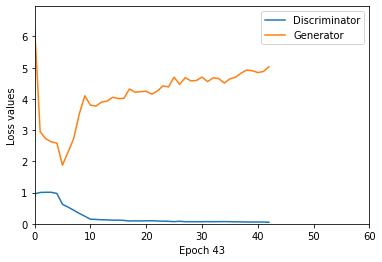

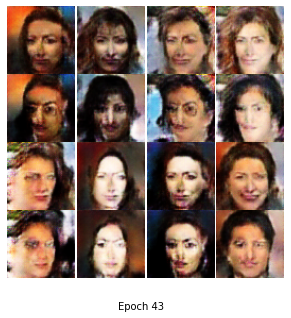

Epoch [44/60], Step [1/686], D_loss: 0.0853, G_loss: 4.7447
Epoch [44/60], Step [2/686], D_loss: 0.0364, G_loss: 3.8917
Epoch [44/60], Step [3/686], D_loss: 0.0553, G_loss: 4.3577
Epoch [44/60], Step [4/686], D_loss: 0.0871, G_loss: 4.5199
Epoch [44/60], Step [5/686], D_loss: 0.0561, G_loss: 4.3382
Epoch [44/60], Step [6/686], D_loss: 0.0382, G_loss: 4.6361
Epoch [44/60], Step [7/686], D_loss: 0.0633, G_loss: 4.4821
Epoch [44/60], Step [8/686], D_loss: 0.0901, G_loss: 4.7022
Epoch [44/60], Step [9/686], D_loss: 0.0390, G_loss: 5.0079
Epoch [44/60], Step [10/686], D_loss: 0.0483, G_loss: 4.5586
Epoch [44/60], Step [11/686], D_loss: 0.0569, G_loss: 4.8673
Epoch [44/60], Step [12/686], D_loss: 0.0667, G_loss: 4.3734
Epoch [44/60], Step [13/686], D_loss: 0.0468, G_loss: 5.9688
Epoch [44/60], Step [14/686], D_loss: 0.0407, G_loss: 5.2839
Epoch [44/60], Step [15/686], D_loss: 0.0205, G_loss: 4.8750
Epoch [44/60], Step [16/686], D_loss: 0.0251, G_loss: 5.8698
Epoch [44/60], Step [17/686], D_l

Epoch [44/60], Step [135/686], D_loss: 0.0632, G_loss: 4.6053
Epoch [44/60], Step [136/686], D_loss: 0.0753, G_loss: 4.6946
Epoch [44/60], Step [137/686], D_loss: 0.0464, G_loss: 3.3547
Epoch [44/60], Step [138/686], D_loss: 0.0481, G_loss: 4.2382
Epoch [44/60], Step [139/686], D_loss: 0.0642, G_loss: 4.7317
Epoch [44/60], Step [140/686], D_loss: 0.0408, G_loss: 4.9475
Epoch [44/60], Step [141/686], D_loss: 0.0483, G_loss: 5.5559
Epoch [44/60], Step [142/686], D_loss: 0.0449, G_loss: 5.3700
Epoch [44/60], Step [143/686], D_loss: 0.0163, G_loss: 4.8341
Epoch [44/60], Step [144/686], D_loss: 0.0537, G_loss: 5.7537
Epoch [44/60], Step [145/686], D_loss: 0.0418, G_loss: 6.0002
Epoch [44/60], Step [146/686], D_loss: 0.0131, G_loss: 5.5799
Epoch [44/60], Step [147/686], D_loss: 0.1067, G_loss: 4.1481
Epoch [44/60], Step [148/686], D_loss: 0.0303, G_loss: 4.8416
Epoch [44/60], Step [149/686], D_loss: 0.1095, G_loss: 4.1324
Epoch [44/60], Step [150/686], D_loss: 0.0352, G_loss: 3.3542
Epoch [4

Epoch [44/60], Step [268/686], D_loss: 0.0196, G_loss: 5.3496
Epoch [44/60], Step [269/686], D_loss: 0.1280, G_loss: 4.5316
Epoch [44/60], Step [270/686], D_loss: 0.0385, G_loss: 4.7399
Epoch [44/60], Step [271/686], D_loss: 0.0361, G_loss: 4.8274
Epoch [44/60], Step [272/686], D_loss: 0.0332, G_loss: 4.1345
Epoch [44/60], Step [273/686], D_loss: 0.0327, G_loss: 4.9202
Epoch [44/60], Step [274/686], D_loss: 0.0440, G_loss: 5.1475
Epoch [44/60], Step [275/686], D_loss: 0.0694, G_loss: 5.5523
Epoch [44/60], Step [276/686], D_loss: 0.0628, G_loss: 4.3588
Epoch [44/60], Step [277/686], D_loss: 0.1788, G_loss: 3.1519
Epoch [44/60], Step [278/686], D_loss: 0.1488, G_loss: 3.2306
Epoch [44/60], Step [279/686], D_loss: 0.0555, G_loss: 5.0929
Epoch [44/60], Step [280/686], D_loss: 0.0239, G_loss: 4.8784
Epoch [44/60], Step [281/686], D_loss: 0.0639, G_loss: 5.4048
Epoch [44/60], Step [282/686], D_loss: 0.0610, G_loss: 5.1279
Epoch [44/60], Step [283/686], D_loss: 0.0896, G_loss: 4.7516
Epoch [4

Epoch [44/60], Step [401/686], D_loss: 0.0352, G_loss: 4.8864
Epoch [44/60], Step [402/686], D_loss: 0.0393, G_loss: 4.1152
Epoch [44/60], Step [403/686], D_loss: 0.0462, G_loss: 5.0375
Epoch [44/60], Step [404/686], D_loss: 0.0334, G_loss: 4.8059
Epoch [44/60], Step [405/686], D_loss: 0.0354, G_loss: 4.7125
Epoch [44/60], Step [406/686], D_loss: 0.0632, G_loss: 5.6465
Epoch [44/60], Step [407/686], D_loss: 0.0656, G_loss: 4.6112
Epoch [44/60], Step [408/686], D_loss: 0.0547, G_loss: 4.8623
Epoch [44/60], Step [409/686], D_loss: 0.0189, G_loss: 3.7955
Epoch [44/60], Step [410/686], D_loss: 0.0321, G_loss: 5.2051
Epoch [44/60], Step [411/686], D_loss: 0.0720, G_loss: 5.6225
Epoch [44/60], Step [412/686], D_loss: 0.0279, G_loss: 4.4675
Epoch [44/60], Step [413/686], D_loss: 0.0861, G_loss: 4.7131
Epoch [44/60], Step [414/686], D_loss: 0.0443, G_loss: 5.3603
Epoch [44/60], Step [415/686], D_loss: 0.0653, G_loss: 4.3349
Epoch [44/60], Step [416/686], D_loss: 0.0371, G_loss: 5.0467
Epoch [4

Epoch [44/60], Step [534/686], D_loss: 0.1157, G_loss: 4.2033
Epoch [44/60], Step [535/686], D_loss: 0.0781, G_loss: 6.2140
Epoch [44/60], Step [536/686], D_loss: 0.0242, G_loss: 4.8471
Epoch [44/60], Step [537/686], D_loss: 0.0582, G_loss: 5.8017
Epoch [44/60], Step [538/686], D_loss: 0.0434, G_loss: 5.6779
Epoch [44/60], Step [539/686], D_loss: 0.0249, G_loss: 6.5024
Epoch [44/60], Step [540/686], D_loss: 0.0141, G_loss: 5.7865
Epoch [44/60], Step [541/686], D_loss: 0.0710, G_loss: 4.9082
Epoch [44/60], Step [542/686], D_loss: 0.1278, G_loss: 4.6441
Epoch [44/60], Step [543/686], D_loss: 0.0303, G_loss: 4.7485
Epoch [44/60], Step [544/686], D_loss: 0.0296, G_loss: 5.5283
Epoch [44/60], Step [545/686], D_loss: 0.0214, G_loss: 4.6482
Epoch [44/60], Step [546/686], D_loss: 0.0818, G_loss: 5.2369
Epoch [44/60], Step [547/686], D_loss: 0.0396, G_loss: 5.6220
Epoch [44/60], Step [548/686], D_loss: 0.0367, G_loss: 6.2034
Epoch [44/60], Step [549/686], D_loss: 0.0598, G_loss: 5.0764
Epoch [4

Epoch [44/60], Step [667/686], D_loss: 0.0349, G_loss: 5.6124
Epoch [44/60], Step [668/686], D_loss: 0.0206, G_loss: 4.6207
Epoch [44/60], Step [669/686], D_loss: 0.0691, G_loss: 5.7696
Epoch [44/60], Step [670/686], D_loss: 0.0408, G_loss: 4.8263
Epoch [44/60], Step [671/686], D_loss: 0.0161, G_loss: 5.1071
Epoch [44/60], Step [672/686], D_loss: 0.0595, G_loss: 5.3746
Epoch [44/60], Step [673/686], D_loss: 0.0199, G_loss: 5.3091
Epoch [44/60], Step [674/686], D_loss: 0.0455, G_loss: 4.3985
Epoch [44/60], Step [675/686], D_loss: 0.0653, G_loss: 5.4196
Epoch [44/60], Step [676/686], D_loss: 0.0280, G_loss: 5.5512
Epoch [44/60], Step [677/686], D_loss: 0.0285, G_loss: 4.9672
Epoch [44/60], Step [678/686], D_loss: 0.0379, G_loss: 4.4458
Epoch [44/60], Step [679/686], D_loss: 0.0354, G_loss: 4.9445
Epoch [44/60], Step [680/686], D_loss: 0.0755, G_loss: 4.0601
Epoch [44/60], Step [681/686], D_loss: 0.0485, G_loss: 4.0976
Epoch [44/60], Step [682/686], D_loss: 0.0367, G_loss: 4.4477
Epoch [4

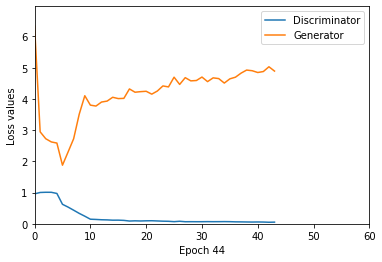

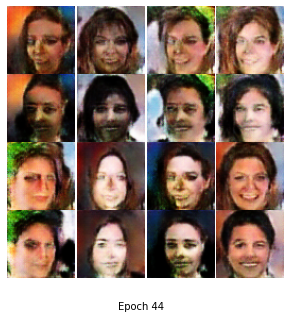

Epoch [45/60], Step [1/686], D_loss: 0.0663, G_loss: 5.2250
Epoch [45/60], Step [2/686], D_loss: 0.0340, G_loss: 5.0361
Epoch [45/60], Step [3/686], D_loss: 0.0320, G_loss: 5.3955
Epoch [45/60], Step [4/686], D_loss: 0.0868, G_loss: 4.8316
Epoch [45/60], Step [5/686], D_loss: 0.0453, G_loss: 4.4702
Epoch [45/60], Step [6/686], D_loss: 0.0340, G_loss: 4.7267
Epoch [45/60], Step [7/686], D_loss: 0.0661, G_loss: 4.3465
Epoch [45/60], Step [8/686], D_loss: 0.0559, G_loss: 4.2378
Epoch [45/60], Step [9/686], D_loss: 0.0487, G_loss: 3.9440
Epoch [45/60], Step [10/686], D_loss: 0.0455, G_loss: 5.1938
Epoch [45/60], Step [11/686], D_loss: 0.0539, G_loss: 5.6319
Epoch [45/60], Step [12/686], D_loss: 0.0300, G_loss: 5.8198
Epoch [45/60], Step [13/686], D_loss: 0.0303, G_loss: 5.3726
Epoch [45/60], Step [14/686], D_loss: 0.0344, G_loss: 5.0311
Epoch [45/60], Step [15/686], D_loss: 0.0340, G_loss: 4.4721
Epoch [45/60], Step [16/686], D_loss: 0.0307, G_loss: 5.1936
Epoch [45/60], Step [17/686], D_l

Epoch [45/60], Step [135/686], D_loss: 0.0409, G_loss: 5.9813
Epoch [45/60], Step [136/686], D_loss: 0.0760, G_loss: 4.6845
Epoch [45/60], Step [137/686], D_loss: 0.0315, G_loss: 3.6118
Epoch [45/60], Step [138/686], D_loss: 0.0552, G_loss: 3.8406
Epoch [45/60], Step [139/686], D_loss: 0.0204, G_loss: 4.6731
Epoch [45/60], Step [140/686], D_loss: 0.0601, G_loss: 4.6771
Epoch [45/60], Step [141/686], D_loss: 0.0381, G_loss: 5.4086
Epoch [45/60], Step [142/686], D_loss: 0.0528, G_loss: 5.2756
Epoch [45/60], Step [143/686], D_loss: 0.0267, G_loss: 4.5338
Epoch [45/60], Step [144/686], D_loss: 0.0401, G_loss: 5.0331
Epoch [45/60], Step [145/686], D_loss: 0.0664, G_loss: 5.3121
Epoch [45/60], Step [146/686], D_loss: 0.0237, G_loss: 5.8666
Epoch [45/60], Step [147/686], D_loss: 0.0703, G_loss: 4.6010
Epoch [45/60], Step [148/686], D_loss: 0.0361, G_loss: 4.7329
Epoch [45/60], Step [149/686], D_loss: 0.0620, G_loss: 5.5726
Epoch [45/60], Step [150/686], D_loss: 0.0317, G_loss: 5.6941
Epoch [4

Epoch [45/60], Step [268/686], D_loss: 0.0241, G_loss: 5.2793
Epoch [45/60], Step [269/686], D_loss: 0.0912, G_loss: 4.6424
Epoch [45/60], Step [270/686], D_loss: 0.0601, G_loss: 5.4361
Epoch [45/60], Step [271/686], D_loss: 0.0318, G_loss: 6.2274
Epoch [45/60], Step [272/686], D_loss: 0.0524, G_loss: 4.5577
Epoch [45/60], Step [273/686], D_loss: 0.0596, G_loss: 5.7455
Epoch [45/60], Step [274/686], D_loss: 0.0485, G_loss: 4.7768
Epoch [45/60], Step [275/686], D_loss: 0.0611, G_loss: 4.7809
Epoch [45/60], Step [276/686], D_loss: 0.0227, G_loss: 3.7589
Epoch [45/60], Step [277/686], D_loss: 0.1107, G_loss: 3.3797
Epoch [45/60], Step [278/686], D_loss: 0.0427, G_loss: 5.3343
Epoch [45/60], Step [279/686], D_loss: 0.0374, G_loss: 3.5048
Epoch [45/60], Step [280/686], D_loss: 0.0453, G_loss: 4.3011
Epoch [45/60], Step [281/686], D_loss: 0.0489, G_loss: 4.3447
Epoch [45/60], Step [282/686], D_loss: 0.0364, G_loss: 5.6279
Epoch [45/60], Step [283/686], D_loss: 0.0435, G_loss: 5.2089
Epoch [4

Epoch [45/60], Step [401/686], D_loss: 0.0436, G_loss: 5.5903
Epoch [45/60], Step [402/686], D_loss: 0.0410, G_loss: 5.8472
Epoch [45/60], Step [403/686], D_loss: 0.0538, G_loss: 5.5637
Epoch [45/60], Step [404/686], D_loss: 0.0251, G_loss: 5.3388
Epoch [45/60], Step [405/686], D_loss: 0.0455, G_loss: 5.3000
Epoch [45/60], Step [406/686], D_loss: 0.0151, G_loss: 4.6669
Epoch [45/60], Step [407/686], D_loss: 0.0481, G_loss: 4.5157
Epoch [45/60], Step [408/686], D_loss: 0.0567, G_loss: 5.3089
Epoch [45/60], Step [409/686], D_loss: 0.0290, G_loss: 4.9692
Epoch [45/60], Step [410/686], D_loss: 0.0160, G_loss: 5.6778
Epoch [45/60], Step [411/686], D_loss: 0.0542, G_loss: 5.3814
Epoch [45/60], Step [412/686], D_loss: 0.0335, G_loss: 4.2846
Epoch [45/60], Step [413/686], D_loss: 0.0473, G_loss: 4.1111
Epoch [45/60], Step [414/686], D_loss: 0.0562, G_loss: 4.8356
Epoch [45/60], Step [415/686], D_loss: 0.0703, G_loss: 5.6202
Epoch [45/60], Step [416/686], D_loss: 0.0362, G_loss: 4.8988
Epoch [4

Epoch [45/60], Step [534/686], D_loss: 0.0540, G_loss: 5.4211
Epoch [45/60], Step [535/686], D_loss: 0.0564, G_loss: 5.2877
Epoch [45/60], Step [536/686], D_loss: 0.0192, G_loss: 5.5628
Epoch [45/60], Step [537/686], D_loss: 0.0392, G_loss: 4.5460
Epoch [45/60], Step [538/686], D_loss: 0.0358, G_loss: 5.3270
Epoch [45/60], Step [539/686], D_loss: 0.0177, G_loss: 5.3700
Epoch [45/60], Step [540/686], D_loss: 0.0556, G_loss: 5.0967
Epoch [45/60], Step [541/686], D_loss: 0.0541, G_loss: 5.1224
Epoch [45/60], Step [542/686], D_loss: 0.0839, G_loss: 5.2904
Epoch [45/60], Step [543/686], D_loss: 0.0346, G_loss: 5.0089
Epoch [45/60], Step [544/686], D_loss: 0.0246, G_loss: 5.9078
Epoch [45/60], Step [545/686], D_loss: 0.0222, G_loss: 3.8984
Epoch [45/60], Step [546/686], D_loss: 0.0508, G_loss: 6.0210
Epoch [45/60], Step [547/686], D_loss: 0.0315, G_loss: 6.2636
Epoch [45/60], Step [548/686], D_loss: 0.0173, G_loss: 4.7342
Epoch [45/60], Step [549/686], D_loss: 0.0594, G_loss: 5.6085
Epoch [4

Epoch [45/60], Step [667/686], D_loss: 0.0304, G_loss: 5.4772
Epoch [45/60], Step [668/686], D_loss: 0.0228, G_loss: 4.6861
Epoch [45/60], Step [669/686], D_loss: 0.0318, G_loss: 4.6527
Epoch [45/60], Step [670/686], D_loss: 0.0573, G_loss: 6.3056
Epoch [45/60], Step [671/686], D_loss: 0.0162, G_loss: 5.6226
Epoch [45/60], Step [672/686], D_loss: 0.0413, G_loss: 5.5593
Epoch [45/60], Step [673/686], D_loss: 0.0157, G_loss: 4.8422
Epoch [45/60], Step [674/686], D_loss: 0.0224, G_loss: 6.3385
Epoch [45/60], Step [675/686], D_loss: 0.0622, G_loss: 4.6401
Epoch [45/60], Step [676/686], D_loss: 0.0248, G_loss: 5.2168
Epoch [45/60], Step [677/686], D_loss: 0.0226, G_loss: 3.9717
Epoch [45/60], Step [678/686], D_loss: 0.0216, G_loss: 3.9730
Epoch [45/60], Step [679/686], D_loss: 0.0480, G_loss: 5.7673
Epoch [45/60], Step [680/686], D_loss: 0.0477, G_loss: 4.6101
Epoch [45/60], Step [681/686], D_loss: 0.0317, G_loss: 4.4443
Epoch [45/60], Step [682/686], D_loss: 0.0464, G_loss: 4.4706
Epoch [4

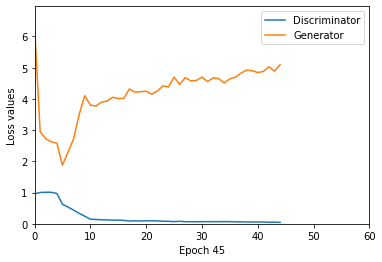

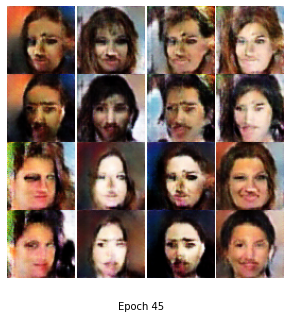

Epoch [46/60], Step [1/686], D_loss: 0.0605, G_loss: 5.2695
Epoch [46/60], Step [2/686], D_loss: 0.0230, G_loss: 4.7736
Epoch [46/60], Step [3/686], D_loss: 0.0216, G_loss: 4.9637
Epoch [46/60], Step [4/686], D_loss: 0.0698, G_loss: 5.2592
Epoch [46/60], Step [5/686], D_loss: 0.0339, G_loss: 4.9924
Epoch [46/60], Step [6/686], D_loss: 0.0558, G_loss: 3.4461
Epoch [46/60], Step [7/686], D_loss: 0.0686, G_loss: 5.0520
Epoch [46/60], Step [8/686], D_loss: 0.0436, G_loss: 5.3607
Epoch [46/60], Step [9/686], D_loss: 0.0294, G_loss: 5.8357
Epoch [46/60], Step [10/686], D_loss: 0.0560, G_loss: 5.2784
Epoch [46/60], Step [11/686], D_loss: 0.0468, G_loss: 4.4887
Epoch [46/60], Step [12/686], D_loss: 0.0124, G_loss: 5.4097
Epoch [46/60], Step [13/686], D_loss: 0.0721, G_loss: 4.3889
Epoch [46/60], Step [14/686], D_loss: 0.0256, G_loss: 5.1510
Epoch [46/60], Step [15/686], D_loss: 0.0412, G_loss: 5.9525
Epoch [46/60], Step [16/686], D_loss: 0.0157, G_loss: 6.0313
Epoch [46/60], Step [17/686], D_l

Epoch [46/60], Step [135/686], D_loss: 0.0429, G_loss: 5.7285
Epoch [46/60], Step [136/686], D_loss: 0.0948, G_loss: 5.6251
Epoch [46/60], Step [137/686], D_loss: 0.0257, G_loss: 5.3751
Epoch [46/60], Step [138/686], D_loss: 0.0356, G_loss: 4.8640
Epoch [46/60], Step [139/686], D_loss: 0.0155, G_loss: 5.8914
Epoch [46/60], Step [140/686], D_loss: 0.0349, G_loss: 4.5833
Epoch [46/60], Step [141/686], D_loss: 0.0299, G_loss: 5.1531
Epoch [46/60], Step [142/686], D_loss: 0.0201, G_loss: 5.3110
Epoch [46/60], Step [143/686], D_loss: 0.0247, G_loss: 4.3524
Epoch [46/60], Step [144/686], D_loss: 0.0186, G_loss: 4.5583
Epoch [46/60], Step [145/686], D_loss: 0.0356, G_loss: 4.5824
Epoch [46/60], Step [146/686], D_loss: 0.0160, G_loss: 4.8982
Epoch [46/60], Step [147/686], D_loss: 0.0784, G_loss: 4.7893
Epoch [46/60], Step [148/686], D_loss: 0.0688, G_loss: 4.9203
Epoch [46/60], Step [149/686], D_loss: 0.0495, G_loss: 4.4508
Epoch [46/60], Step [150/686], D_loss: 0.0270, G_loss: 5.0231
Epoch [4

Epoch [46/60], Step [268/686], D_loss: 0.0160, G_loss: 4.9050
Epoch [46/60], Step [269/686], D_loss: 0.1149, G_loss: 5.1475
Epoch [46/60], Step [270/686], D_loss: 0.0209, G_loss: 4.5907
Epoch [46/60], Step [271/686], D_loss: 0.0236, G_loss: 4.5697
Epoch [46/60], Step [272/686], D_loss: 0.0691, G_loss: 4.8873
Epoch [46/60], Step [273/686], D_loss: 0.0345, G_loss: 4.5727
Epoch [46/60], Step [274/686], D_loss: 0.0376, G_loss: 5.1666
Epoch [46/60], Step [275/686], D_loss: 0.1118, G_loss: 6.3918
Epoch [46/60], Step [276/686], D_loss: 0.0367, G_loss: 4.8203
Epoch [46/60], Step [277/686], D_loss: 0.1473, G_loss: 5.0998
Epoch [46/60], Step [278/686], D_loss: 0.0500, G_loss: 3.7213
Epoch [46/60], Step [279/686], D_loss: 0.0363, G_loss: 4.6632
Epoch [46/60], Step [280/686], D_loss: 0.0217, G_loss: 4.9919
Epoch [46/60], Step [281/686], D_loss: 0.0496, G_loss: 3.7251
Epoch [46/60], Step [282/686], D_loss: 0.0225, G_loss: 5.1842
Epoch [46/60], Step [283/686], D_loss: 0.0687, G_loss: 5.7786
Epoch [4

Epoch [46/60], Step [401/686], D_loss: 0.0287, G_loss: 4.4606
Epoch [46/60], Step [402/686], D_loss: 0.0302, G_loss: 5.7113
Epoch [46/60], Step [403/686], D_loss: 0.0572, G_loss: 5.5303
Epoch [46/60], Step [404/686], D_loss: 0.0257, G_loss: 5.0987
Epoch [46/60], Step [405/686], D_loss: 0.0390, G_loss: 5.3433
Epoch [46/60], Step [406/686], D_loss: 0.0425, G_loss: 5.5128
Epoch [46/60], Step [407/686], D_loss: 0.0803, G_loss: 4.9656
Epoch [46/60], Step [408/686], D_loss: 0.0638, G_loss: 4.8760
Epoch [46/60], Step [409/686], D_loss: 0.0199, G_loss: 4.4661
Epoch [46/60], Step [410/686], D_loss: 0.0125, G_loss: 4.8365
Epoch [46/60], Step [411/686], D_loss: 0.0412, G_loss: 4.9627
Epoch [46/60], Step [412/686], D_loss: 0.0329, G_loss: 5.0057
Epoch [46/60], Step [413/686], D_loss: 0.0982, G_loss: 5.7216
Epoch [46/60], Step [414/686], D_loss: 0.0316, G_loss: 5.3619
Epoch [46/60], Step [415/686], D_loss: 0.0660, G_loss: 4.6182
Epoch [46/60], Step [416/686], D_loss: 0.0343, G_loss: 3.8883
Epoch [4

Epoch [46/60], Step [534/686], D_loss: 0.0276, G_loss: 6.1794
Epoch [46/60], Step [535/686], D_loss: 0.0554, G_loss: 6.7501
Epoch [46/60], Step [536/686], D_loss: 0.0226, G_loss: 4.9882
Epoch [46/60], Step [537/686], D_loss: 0.0263, G_loss: 5.1425
Epoch [46/60], Step [538/686], D_loss: 0.0315, G_loss: 5.1856
Epoch [46/60], Step [539/686], D_loss: 0.0422, G_loss: 5.2255
Epoch [46/60], Step [540/686], D_loss: 0.0138, G_loss: 5.0295
Epoch [46/60], Step [541/686], D_loss: 0.0486, G_loss: 5.3786
Epoch [46/60], Step [542/686], D_loss: 0.0433, G_loss: 5.2305
Epoch [46/60], Step [543/686], D_loss: 0.0171, G_loss: 4.9759
Epoch [46/60], Step [544/686], D_loss: 0.0214, G_loss: 4.6954
Epoch [46/60], Step [545/686], D_loss: 0.0260, G_loss: 6.0585
Epoch [46/60], Step [546/686], D_loss: 0.0570, G_loss: 4.1910
Epoch [46/60], Step [547/686], D_loss: 0.0405, G_loss: 5.5458
Epoch [46/60], Step [548/686], D_loss: 0.0243, G_loss: 4.6147
Epoch [46/60], Step [549/686], D_loss: 0.0556, G_loss: 5.2064
Epoch [4

Epoch [46/60], Step [667/686], D_loss: 0.0218, G_loss: 4.9506
Epoch [46/60], Step [668/686], D_loss: 0.0150, G_loss: 4.7916
Epoch [46/60], Step [669/686], D_loss: 0.0741, G_loss: 5.0592
Epoch [46/60], Step [670/686], D_loss: 0.0369, G_loss: 5.1754
Epoch [46/60], Step [671/686], D_loss: 0.0200, G_loss: 6.1718
Epoch [46/60], Step [672/686], D_loss: 0.0388, G_loss: 6.3710
Epoch [46/60], Step [673/686], D_loss: 0.0223, G_loss: 5.1451
Epoch [46/60], Step [674/686], D_loss: 0.0155, G_loss: 6.0643
Epoch [46/60], Step [675/686], D_loss: 0.0520, G_loss: 4.7891
Epoch [46/60], Step [676/686], D_loss: 0.0239, G_loss: 5.1301
Epoch [46/60], Step [677/686], D_loss: 0.0730, G_loss: 5.4189
Epoch [46/60], Step [678/686], D_loss: 0.0186, G_loss: 5.5571
Epoch [46/60], Step [679/686], D_loss: 0.0352, G_loss: 5.9517
Epoch [46/60], Step [680/686], D_loss: 0.0380, G_loss: 5.4150
Epoch [46/60], Step [681/686], D_loss: 0.0371, G_loss: 4.6863
Epoch [46/60], Step [682/686], D_loss: 0.0266, G_loss: 4.6827
Epoch [4

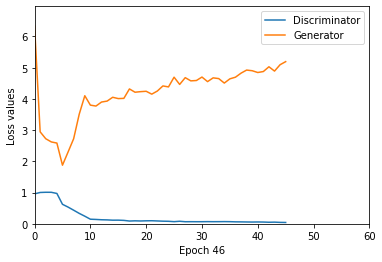

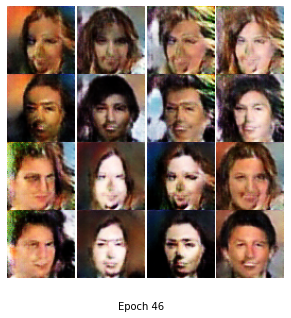

Epoch [47/60], Step [1/686], D_loss: 0.0585, G_loss: 5.0178
Epoch [47/60], Step [2/686], D_loss: 0.0234, G_loss: 5.8996
Epoch [47/60], Step [3/686], D_loss: 0.0892, G_loss: 5.8836
Epoch [47/60], Step [4/686], D_loss: 0.0657, G_loss: 5.8673
Epoch [47/60], Step [5/686], D_loss: 0.0631, G_loss: 6.3246
Epoch [47/60], Step [6/686], D_loss: 0.0593, G_loss: 6.2825
Epoch [47/60], Step [7/686], D_loss: 0.0342, G_loss: 4.2641
Epoch [47/60], Step [8/686], D_loss: 0.0490, G_loss: 5.9839
Epoch [47/60], Step [9/686], D_loss: 0.0283, G_loss: 4.8581
Epoch [47/60], Step [10/686], D_loss: 0.0550, G_loss: 4.8792
Epoch [47/60], Step [11/686], D_loss: 0.0954, G_loss: 6.2949
Epoch [47/60], Step [12/686], D_loss: 0.0328, G_loss: 5.6758
Epoch [47/60], Step [13/686], D_loss: 0.0439, G_loss: 5.0654
Epoch [47/60], Step [14/686], D_loss: 0.0216, G_loss: 5.3604
Epoch [47/60], Step [15/686], D_loss: 0.0145, G_loss: 5.6021
Epoch [47/60], Step [16/686], D_loss: 0.0193, G_loss: 4.9257
Epoch [47/60], Step [17/686], D_l

Epoch [47/60], Step [135/686], D_loss: 0.0364, G_loss: 4.6082
Epoch [47/60], Step [136/686], D_loss: 0.0803, G_loss: 5.0339
Epoch [47/60], Step [137/686], D_loss: 0.0303, G_loss: 4.8482
Epoch [47/60], Step [138/686], D_loss: 0.0651, G_loss: 5.1966
Epoch [47/60], Step [139/686], D_loss: 0.0282, G_loss: 5.1103
Epoch [47/60], Step [140/686], D_loss: 0.0273, G_loss: 5.8975
Epoch [47/60], Step [141/686], D_loss: 0.0160, G_loss: 5.5849
Epoch [47/60], Step [142/686], D_loss: 0.0286, G_loss: 5.2301
Epoch [47/60], Step [143/686], D_loss: 0.0236, G_loss: 6.4865
Epoch [47/60], Step [144/686], D_loss: 0.0375, G_loss: 5.8461
Epoch [47/60], Step [145/686], D_loss: 0.0300, G_loss: 5.2992
Epoch [47/60], Step [146/686], D_loss: 0.0218, G_loss: 4.9853
Epoch [47/60], Step [147/686], D_loss: 0.0919, G_loss: 5.5152
Epoch [47/60], Step [148/686], D_loss: 0.0280, G_loss: 5.2939
Epoch [47/60], Step [149/686], D_loss: 0.0409, G_loss: 5.1069
Epoch [47/60], Step [150/686], D_loss: 0.0424, G_loss: 5.3179
Epoch [4

Epoch [47/60], Step [268/686], D_loss: 0.0113, G_loss: 4.5657
Epoch [47/60], Step [269/686], D_loss: 0.0991, G_loss: 4.0960
Epoch [47/60], Step [270/686], D_loss: 0.0134, G_loss: 4.7328
Epoch [47/60], Step [271/686], D_loss: 0.0329, G_loss: 4.5940
Epoch [47/60], Step [272/686], D_loss: 0.0485, G_loss: 5.4006
Epoch [47/60], Step [273/686], D_loss: 0.0172, G_loss: 5.0498
Epoch [47/60], Step [274/686], D_loss: 0.0350, G_loss: 5.3770
Epoch [47/60], Step [275/686], D_loss: 0.0742, G_loss: 5.0163
Epoch [47/60], Step [276/686], D_loss: 0.0176, G_loss: 4.7216
Epoch [47/60], Step [277/686], D_loss: 0.0486, G_loss: 3.9821
Epoch [47/60], Step [278/686], D_loss: 0.0570, G_loss: 5.1399
Epoch [47/60], Step [279/686], D_loss: 0.0655, G_loss: 5.1009
Epoch [47/60], Step [280/686], D_loss: 0.0397, G_loss: 5.1579
Epoch [47/60], Step [281/686], D_loss: 0.0244, G_loss: 6.2073
Epoch [47/60], Step [282/686], D_loss: 0.0236, G_loss: 5.0881
Epoch [47/60], Step [283/686], D_loss: 0.0311, G_loss: 5.2141
Epoch [4

Epoch [47/60], Step [401/686], D_loss: 0.0389, G_loss: 5.8251
Epoch [47/60], Step [402/686], D_loss: 0.0218, G_loss: 5.1045
Epoch [47/60], Step [403/686], D_loss: 0.0411, G_loss: 5.7827
Epoch [47/60], Step [404/686], D_loss: 0.0399, G_loss: 6.4821
Epoch [47/60], Step [405/686], D_loss: 0.0294, G_loss: 6.2479
Epoch [47/60], Step [406/686], D_loss: 0.0206, G_loss: 5.5699
Epoch [47/60], Step [407/686], D_loss: 0.0538, G_loss: 4.2717
Epoch [47/60], Step [408/686], D_loss: 0.0734, G_loss: 5.0452
Epoch [47/60], Step [409/686], D_loss: 0.0309, G_loss: 5.4615
Epoch [47/60], Step [410/686], D_loss: 0.0138, G_loss: 5.5546
Epoch [47/60], Step [411/686], D_loss: 0.0804, G_loss: 5.8424
Epoch [47/60], Step [412/686], D_loss: 0.0411, G_loss: 6.0662
Epoch [47/60], Step [413/686], D_loss: 0.0486, G_loss: 4.9842
Epoch [47/60], Step [414/686], D_loss: 0.0498, G_loss: 3.6917
Epoch [47/60], Step [415/686], D_loss: 0.0674, G_loss: 4.8043
Epoch [47/60], Step [416/686], D_loss: 0.0234, G_loss: 3.9487
Epoch [4

Epoch [47/60], Step [534/686], D_loss: 0.0277, G_loss: 5.2936
Epoch [47/60], Step [535/686], D_loss: 0.0437, G_loss: 4.7849
Epoch [47/60], Step [536/686], D_loss: 0.0237, G_loss: 5.5675
Epoch [47/60], Step [537/686], D_loss: 0.0550, G_loss: 5.7575
Epoch [47/60], Step [538/686], D_loss: 0.0372, G_loss: 6.0388
Epoch [47/60], Step [539/686], D_loss: 0.0288, G_loss: 5.1860
Epoch [47/60], Step [540/686], D_loss: 0.0191, G_loss: 5.2530
Epoch [47/60], Step [541/686], D_loss: 0.0517, G_loss: 6.9623
Epoch [47/60], Step [542/686], D_loss: 0.0489, G_loss: 5.8324
Epoch [47/60], Step [543/686], D_loss: 0.0307, G_loss: 5.9850
Epoch [47/60], Step [544/686], D_loss: 0.0226, G_loss: 6.4682
Epoch [47/60], Step [545/686], D_loss: 0.0094, G_loss: 5.5010
Epoch [47/60], Step [546/686], D_loss: 0.0347, G_loss: 5.9259
Epoch [47/60], Step [547/686], D_loss: 0.0280, G_loss: 5.8016
Epoch [47/60], Step [548/686], D_loss: 0.0225, G_loss: 6.0870
Epoch [47/60], Step [549/686], D_loss: 0.0386, G_loss: 5.0652
Epoch [4

Epoch [47/60], Step [667/686], D_loss: 0.0251, G_loss: 5.4279
Epoch [47/60], Step [668/686], D_loss: 0.0400, G_loss: 5.6406
Epoch [47/60], Step [669/686], D_loss: 0.0206, G_loss: 4.5620
Epoch [47/60], Step [670/686], D_loss: 0.0297, G_loss: 5.6387
Epoch [47/60], Step [671/686], D_loss: 0.0149, G_loss: 5.7288
Epoch [47/60], Step [672/686], D_loss: 0.0354, G_loss: 5.5893
Epoch [47/60], Step [673/686], D_loss: 0.0468, G_loss: 5.7493
Epoch [47/60], Step [674/686], D_loss: 0.0355, G_loss: 6.5328
Epoch [47/60], Step [675/686], D_loss: 0.0298, G_loss: 5.4777
Epoch [47/60], Step [676/686], D_loss: 0.0294, G_loss: 6.4087
Epoch [47/60], Step [677/686], D_loss: 0.0412, G_loss: 5.8842
Epoch [47/60], Step [678/686], D_loss: 0.0229, G_loss: 5.6632
Epoch [47/60], Step [679/686], D_loss: 0.0380, G_loss: 5.5397
Epoch [47/60], Step [680/686], D_loss: 0.0278, G_loss: 6.1432
Epoch [47/60], Step [681/686], D_loss: 0.0215, G_loss: 5.1921
Epoch [47/60], Step [682/686], D_loss: 0.0629, G_loss: 4.9670
Epoch [4

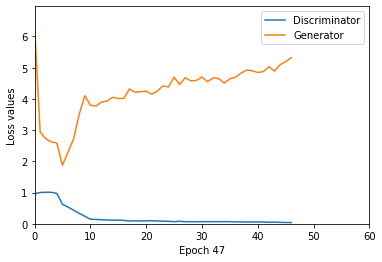

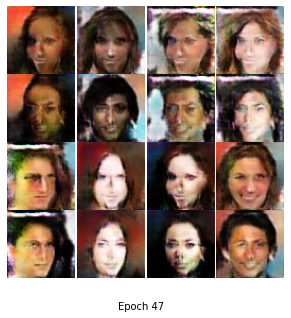

Epoch [48/60], Step [1/686], D_loss: 0.0401, G_loss: 5.3055
Epoch [48/60], Step [2/686], D_loss: 0.0117, G_loss: 5.1742
Epoch [48/60], Step [3/686], D_loss: 0.0207, G_loss: 6.0755
Epoch [48/60], Step [4/686], D_loss: 0.0580, G_loss: 5.7300
Epoch [48/60], Step [5/686], D_loss: 0.0426, G_loss: 4.6219
Epoch [48/60], Step [6/686], D_loss: 0.0347, G_loss: 6.4305
Epoch [48/60], Step [7/686], D_loss: 0.0522, G_loss: 4.0877
Epoch [48/60], Step [8/686], D_loss: 0.0891, G_loss: 6.0567
Epoch [48/60], Step [9/686], D_loss: 0.0344, G_loss: 5.9977
Epoch [48/60], Step [10/686], D_loss: 0.0493, G_loss: 5.4263
Epoch [48/60], Step [11/686], D_loss: 0.0318, G_loss: 5.3808
Epoch [48/60], Step [12/686], D_loss: 0.0298, G_loss: 6.1714
Epoch [48/60], Step [13/686], D_loss: 0.0318, G_loss: 6.2724
Epoch [48/60], Step [14/686], D_loss: 0.0387, G_loss: 5.2653
Epoch [48/60], Step [15/686], D_loss: 0.0217, G_loss: 4.7533
Epoch [48/60], Step [16/686], D_loss: 0.0405, G_loss: 5.7662
Epoch [48/60], Step [17/686], D_l

Epoch [48/60], Step [135/686], D_loss: 0.0326, G_loss: 6.4265
Epoch [48/60], Step [136/686], D_loss: 0.0920, G_loss: 4.7038
Epoch [48/60], Step [137/686], D_loss: 0.0760, G_loss: 5.6003
Epoch [48/60], Step [138/686], D_loss: 0.0551, G_loss: 5.0395
Epoch [48/60], Step [139/686], D_loss: 0.0830, G_loss: 5.1212
Epoch [48/60], Step [140/686], D_loss: 0.0526, G_loss: 5.1220
Epoch [48/60], Step [141/686], D_loss: 0.0329, G_loss: 5.9918
Epoch [48/60], Step [142/686], D_loss: 0.0359, G_loss: 5.5577
Epoch [48/60], Step [143/686], D_loss: 0.0271, G_loss: 5.6066
Epoch [48/60], Step [144/686], D_loss: 0.0318, G_loss: 5.5017
Epoch [48/60], Step [145/686], D_loss: 0.0968, G_loss: 6.2013
Epoch [48/60], Step [146/686], D_loss: 0.0157, G_loss: 6.4277
Epoch [48/60], Step [147/686], D_loss: 0.0795, G_loss: 4.2154
Epoch [48/60], Step [148/686], D_loss: 0.0544, G_loss: 5.2140
Epoch [48/60], Step [149/686], D_loss: 0.0556, G_loss: 4.7935
Epoch [48/60], Step [150/686], D_loss: 0.0206, G_loss: 4.1962
Epoch [4

Epoch [48/60], Step [268/686], D_loss: 0.0148, G_loss: 5.1861
Epoch [48/60], Step [269/686], D_loss: 0.1394, G_loss: 5.4274
Epoch [48/60], Step [270/686], D_loss: 0.0262, G_loss: 5.6860
Epoch [48/60], Step [271/686], D_loss: 0.0539, G_loss: 4.1074
Epoch [48/60], Step [272/686], D_loss: 0.0276, G_loss: 5.5328
Epoch [48/60], Step [273/686], D_loss: 0.0187, G_loss: 4.3330
Epoch [48/60], Step [274/686], D_loss: 0.0503, G_loss: 5.5928
Epoch [48/60], Step [275/686], D_loss: 0.0581, G_loss: 4.6731
Epoch [48/60], Step [276/686], D_loss: 0.0387, G_loss: 4.8417
Epoch [48/60], Step [277/686], D_loss: 0.0608, G_loss: 4.9791
Epoch [48/60], Step [278/686], D_loss: 0.0268, G_loss: 3.8398
Epoch [48/60], Step [279/686], D_loss: 0.0427, G_loss: 4.7754
Epoch [48/60], Step [280/686], D_loss: 0.0311, G_loss: 5.4620
Epoch [48/60], Step [281/686], D_loss: 0.0330, G_loss: 4.9764
Epoch [48/60], Step [282/686], D_loss: 0.0272, G_loss: 5.1255
Epoch [48/60], Step [283/686], D_loss: 0.0664, G_loss: 5.0579
Epoch [4

Epoch [48/60], Step [401/686], D_loss: 0.0226, G_loss: 5.5075
Epoch [48/60], Step [402/686], D_loss: 0.0173, G_loss: 5.9328
Epoch [48/60], Step [403/686], D_loss: 0.0323, G_loss: 4.3764
Epoch [48/60], Step [404/686], D_loss: 0.0443, G_loss: 4.9498
Epoch [48/60], Step [405/686], D_loss: 0.0653, G_loss: 6.4468
Epoch [48/60], Step [406/686], D_loss: 0.0228, G_loss: 5.2715
Epoch [48/60], Step [407/686], D_loss: 0.0974, G_loss: 5.7136
Epoch [48/60], Step [408/686], D_loss: 0.0301, G_loss: 5.0053
Epoch [48/60], Step [409/686], D_loss: 0.0208, G_loss: 4.9483
Epoch [48/60], Step [410/686], D_loss: 0.0187, G_loss: 5.3187
Epoch [48/60], Step [411/686], D_loss: 0.0551, G_loss: 5.4116
Epoch [48/60], Step [412/686], D_loss: 0.0435, G_loss: 5.2123
Epoch [48/60], Step [413/686], D_loss: 0.0401, G_loss: 5.2560
Epoch [48/60], Step [414/686], D_loss: 0.0321, G_loss: 5.3893
Epoch [48/60], Step [415/686], D_loss: 0.0585, G_loss: 6.1583
Epoch [48/60], Step [416/686], D_loss: 0.0267, G_loss: 5.0895
Epoch [4

Epoch [48/60], Step [534/686], D_loss: 0.0637, G_loss: 4.2228
Epoch [48/60], Step [535/686], D_loss: 0.0453, G_loss: 4.9315
Epoch [48/60], Step [536/686], D_loss: 0.0241, G_loss: 4.6176
Epoch [48/60], Step [537/686], D_loss: 0.0692, G_loss: 4.9909
Epoch [48/60], Step [538/686], D_loss: 0.0209, G_loss: 5.0624
Epoch [48/60], Step [539/686], D_loss: 0.0211, G_loss: 4.8642
Epoch [48/60], Step [540/686], D_loss: 0.0356, G_loss: 5.4617
Epoch [48/60], Step [541/686], D_loss: 0.0305, G_loss: 4.9909
Epoch [48/60], Step [542/686], D_loss: 0.1100, G_loss: 5.3930
Epoch [48/60], Step [543/686], D_loss: 0.0244, G_loss: 5.6238
Epoch [48/60], Step [544/686], D_loss: 0.0272, G_loss: 5.5595
Epoch [48/60], Step [545/686], D_loss: 0.0360, G_loss: 5.1516
Epoch [48/60], Step [546/686], D_loss: 0.0856, G_loss: 5.6147
Epoch [48/60], Step [547/686], D_loss: 0.0461, G_loss: 5.6973
Epoch [48/60], Step [548/686], D_loss: 0.0321, G_loss: 5.0098
Epoch [48/60], Step [549/686], D_loss: 0.0625, G_loss: 4.8819
Epoch [4

Epoch [48/60], Step [667/686], D_loss: 0.0476, G_loss: 5.6665
Epoch [48/60], Step [668/686], D_loss: 0.0318, G_loss: 5.4183
Epoch [48/60], Step [669/686], D_loss: 0.0492, G_loss: 5.6798
Epoch [48/60], Step [670/686], D_loss: 0.0317, G_loss: 4.0271
Epoch [48/60], Step [671/686], D_loss: 0.0222, G_loss: 6.1989
Epoch [48/60], Step [672/686], D_loss: 0.0596, G_loss: 4.8241
Epoch [48/60], Step [673/686], D_loss: 0.0298, G_loss: 4.9628
Epoch [48/60], Step [674/686], D_loss: 0.0221, G_loss: 4.6216
Epoch [48/60], Step [675/686], D_loss: 0.0512, G_loss: 5.3842
Epoch [48/60], Step [676/686], D_loss: 0.0386, G_loss: 4.9029
Epoch [48/60], Step [677/686], D_loss: 0.0233, G_loss: 5.2778
Epoch [48/60], Step [678/686], D_loss: 0.0206, G_loss: 5.6363
Epoch [48/60], Step [679/686], D_loss: 0.0607, G_loss: 4.3389
Epoch [48/60], Step [680/686], D_loss: 0.1104, G_loss: 6.1681
Epoch [48/60], Step [681/686], D_loss: 0.0312, G_loss: 4.7026
Epoch [48/60], Step [682/686], D_loss: 0.0389, G_loss: 4.3968
Epoch [4

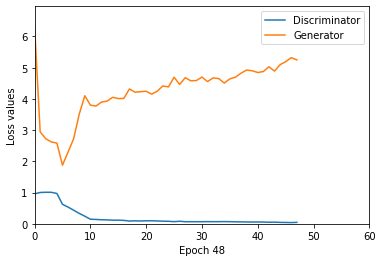

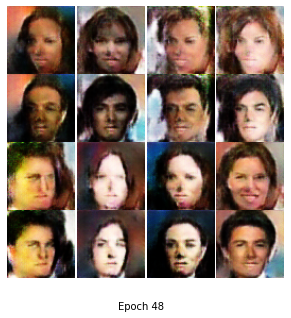

Epoch [49/60], Step [1/686], D_loss: 0.0469, G_loss: 5.2363
Epoch [49/60], Step [2/686], D_loss: 0.0481, G_loss: 4.4357
Epoch [49/60], Step [3/686], D_loss: 0.0286, G_loss: 5.3204
Epoch [49/60], Step [4/686], D_loss: 0.0493, G_loss: 4.9354
Epoch [49/60], Step [5/686], D_loss: 0.0591, G_loss: 4.0422
Epoch [49/60], Step [6/686], D_loss: 0.0490, G_loss: 5.4859
Epoch [49/60], Step [7/686], D_loss: 0.0720, G_loss: 4.9774
Epoch [49/60], Step [8/686], D_loss: 0.0990, G_loss: 4.7099
Epoch [49/60], Step [9/686], D_loss: 0.0477, G_loss: 6.0925
Epoch [49/60], Step [10/686], D_loss: 0.0419, G_loss: 3.7285
Epoch [49/60], Step [11/686], D_loss: 0.0564, G_loss: 6.5872
Epoch [49/60], Step [12/686], D_loss: 0.0642, G_loss: 5.9672
Epoch [49/60], Step [13/686], D_loss: 0.0577, G_loss: 6.2559
Epoch [49/60], Step [14/686], D_loss: 0.0558, G_loss: 5.5857
Epoch [49/60], Step [15/686], D_loss: 0.0260, G_loss: 4.9949
Epoch [49/60], Step [16/686], D_loss: 0.0263, G_loss: 6.1231
Epoch [49/60], Step [17/686], D_l

Epoch [49/60], Step [135/686], D_loss: 0.0370, G_loss: 3.7347
Epoch [49/60], Step [136/686], D_loss: 0.0550, G_loss: 4.7433
Epoch [49/60], Step [137/686], D_loss: 0.1022, G_loss: 4.6936
Epoch [49/60], Step [138/686], D_loss: 0.0827, G_loss: 5.2544
Epoch [49/60], Step [139/686], D_loss: 0.0845, G_loss: 5.5672
Epoch [49/60], Step [140/686], D_loss: 0.0621, G_loss: 7.3924
Epoch [49/60], Step [141/686], D_loss: 0.0238, G_loss: 6.1571
Epoch [49/60], Step [142/686], D_loss: 0.0419, G_loss: 6.0702
Epoch [49/60], Step [143/686], D_loss: 0.0178, G_loss: 5.9426
Epoch [49/60], Step [144/686], D_loss: 0.0390, G_loss: 5.9379
Epoch [49/60], Step [145/686], D_loss: 0.0411, G_loss: 5.7220
Epoch [49/60], Step [146/686], D_loss: 0.0127, G_loss: 3.4139
Epoch [49/60], Step [147/686], D_loss: 0.0390, G_loss: 5.9348
Epoch [49/60], Step [148/686], D_loss: 0.0357, G_loss: 5.5878
Epoch [49/60], Step [149/686], D_loss: 0.0585, G_loss: 4.8547
Epoch [49/60], Step [150/686], D_loss: 0.0282, G_loss: 3.9203
Epoch [4

Epoch [49/60], Step [268/686], D_loss: 0.1683, G_loss: 5.8734
Epoch [49/60], Step [269/686], D_loss: 0.1960, G_loss: 5.1814
Epoch [49/60], Step [270/686], D_loss: 0.0291, G_loss: 5.4133
Epoch [49/60], Step [271/686], D_loss: 0.0142, G_loss: 4.1667
Epoch [49/60], Step [272/686], D_loss: 0.0451, G_loss: 5.5903
Epoch [49/60], Step [273/686], D_loss: 0.0296, G_loss: 4.2246
Epoch [49/60], Step [274/686], D_loss: 0.0460, G_loss: 4.9662
Epoch [49/60], Step [275/686], D_loss: 0.0864, G_loss: 5.5876
Epoch [49/60], Step [276/686], D_loss: 0.0244, G_loss: 5.3798
Epoch [49/60], Step [277/686], D_loss: 0.1026, G_loss: 5.1614
Epoch [49/60], Step [278/686], D_loss: 0.0473, G_loss: 5.4569
Epoch [49/60], Step [279/686], D_loss: 0.0316, G_loss: 5.5373
Epoch [49/60], Step [280/686], D_loss: 0.0850, G_loss: 4.1785
Epoch [49/60], Step [281/686], D_loss: 0.0412, G_loss: 5.2504
Epoch [49/60], Step [282/686], D_loss: 0.0292, G_loss: 6.2543
Epoch [49/60], Step [283/686], D_loss: 0.0310, G_loss: 5.3121
Epoch [4

Epoch [49/60], Step [401/686], D_loss: 0.0312, G_loss: 5.4065
Epoch [49/60], Step [402/686], D_loss: 0.0134, G_loss: 5.8734
Epoch [49/60], Step [403/686], D_loss: 0.0572, G_loss: 4.7696
Epoch [49/60], Step [404/686], D_loss: 0.0285, G_loss: 6.3436
Epoch [49/60], Step [405/686], D_loss: 0.0313, G_loss: 5.2114
Epoch [49/60], Step [406/686], D_loss: 0.0332, G_loss: 6.3320
Epoch [49/60], Step [407/686], D_loss: 0.0404, G_loss: 6.3072
Epoch [49/60], Step [408/686], D_loss: 0.0807, G_loss: 6.0763
Epoch [49/60], Step [409/686], D_loss: 0.0216, G_loss: 5.1212
Epoch [49/60], Step [410/686], D_loss: 0.0215, G_loss: 5.6911
Epoch [49/60], Step [411/686], D_loss: 0.0509, G_loss: 4.4574
Epoch [49/60], Step [412/686], D_loss: 0.0277, G_loss: 3.3609
Epoch [49/60], Step [413/686], D_loss: 0.0610, G_loss: 4.4886
Epoch [49/60], Step [414/686], D_loss: 0.0178, G_loss: 5.2549
Epoch [49/60], Step [415/686], D_loss: 0.0510, G_loss: 5.4710
Epoch [49/60], Step [416/686], D_loss: 0.0285, G_loss: 6.2713
Epoch [4

Epoch [49/60], Step [534/686], D_loss: 0.0301, G_loss: 5.1792
Epoch [49/60], Step [535/686], D_loss: 0.0530, G_loss: 4.7433
Epoch [49/60], Step [536/686], D_loss: 0.0660, G_loss: 5.1834
Epoch [49/60], Step [537/686], D_loss: 0.0276, G_loss: 4.6024
Epoch [49/60], Step [538/686], D_loss: 0.0397, G_loss: 4.6271
Epoch [49/60], Step [539/686], D_loss: 0.0442, G_loss: 5.4680
Epoch [49/60], Step [540/686], D_loss: 0.0244, G_loss: 6.9878
Epoch [49/60], Step [541/686], D_loss: 0.0206, G_loss: 6.6723
Epoch [49/60], Step [542/686], D_loss: 0.0666, G_loss: 5.9526
Epoch [49/60], Step [543/686], D_loss: 0.0222, G_loss: 5.4607
Epoch [49/60], Step [544/686], D_loss: 0.0338, G_loss: 4.4892
Epoch [49/60], Step [545/686], D_loss: 0.0236, G_loss: 6.7419
Epoch [49/60], Step [546/686], D_loss: 0.0752, G_loss: 6.4849
Epoch [49/60], Step [547/686], D_loss: 0.0235, G_loss: 5.0698
Epoch [49/60], Step [548/686], D_loss: 0.0134, G_loss: 5.1288
Epoch [49/60], Step [549/686], D_loss: 0.0772, G_loss: 5.8322
Epoch [4

Epoch [49/60], Step [667/686], D_loss: 0.0307, G_loss: 5.3929
Epoch [49/60], Step [668/686], D_loss: 0.0179, G_loss: 5.3233
Epoch [49/60], Step [669/686], D_loss: 0.0393, G_loss: 5.2035
Epoch [49/60], Step [670/686], D_loss: 0.0164, G_loss: 5.7539
Epoch [49/60], Step [671/686], D_loss: 0.0091, G_loss: 5.0034
Epoch [49/60], Step [672/686], D_loss: 0.0391, G_loss: 4.7987
Epoch [49/60], Step [673/686], D_loss: 0.0368, G_loss: 5.7154
Epoch [49/60], Step [674/686], D_loss: 0.0149, G_loss: 4.7994
Epoch [49/60], Step [675/686], D_loss: 0.0659, G_loss: 5.5303
Epoch [49/60], Step [676/686], D_loss: 0.0186, G_loss: 4.9217
Epoch [49/60], Step [677/686], D_loss: 0.0509, G_loss: 5.3709
Epoch [49/60], Step [678/686], D_loss: 0.0183, G_loss: 5.5373
Epoch [49/60], Step [679/686], D_loss: 0.0896, G_loss: 4.4281
Epoch [49/60], Step [680/686], D_loss: 0.0607, G_loss: 5.4333
Epoch [49/60], Step [681/686], D_loss: 0.0305, G_loss: 4.8130
Epoch [49/60], Step [682/686], D_loss: 0.0477, G_loss: 4.0726
Epoch [4

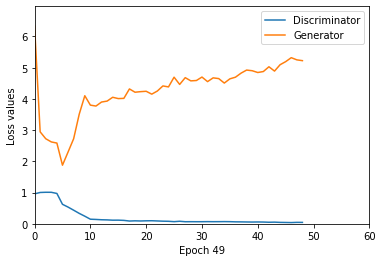

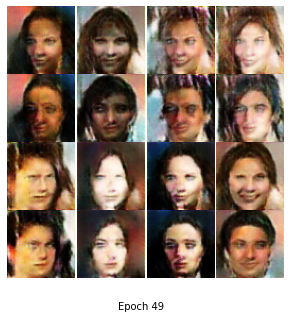

Epoch [50/60], Step [1/686], D_loss: 0.0488, G_loss: 5.3758
Epoch [50/60], Step [2/686], D_loss: 0.0315, G_loss: 5.2502
Epoch [50/60], Step [3/686], D_loss: 0.0290, G_loss: 5.7441
Epoch [50/60], Step [4/686], D_loss: 0.0611, G_loss: 4.7170
Epoch [50/60], Step [5/686], D_loss: 0.0388, G_loss: 5.3971
Epoch [50/60], Step [6/686], D_loss: 0.0277, G_loss: 5.1152
Epoch [50/60], Step [7/686], D_loss: 0.0552, G_loss: 5.1599
Epoch [50/60], Step [8/686], D_loss: 0.0617, G_loss: 5.2979
Epoch [50/60], Step [9/686], D_loss: 0.0309, G_loss: 5.0449
Epoch [50/60], Step [10/686], D_loss: 0.1242, G_loss: 4.7127
Epoch [50/60], Step [11/686], D_loss: 0.0715, G_loss: 6.3783
Epoch [50/60], Step [12/686], D_loss: 0.0215, G_loss: 6.2838
Epoch [50/60], Step [13/686], D_loss: 0.0429, G_loss: 5.3225
Epoch [50/60], Step [14/686], D_loss: 0.0356, G_loss: 5.4112
Epoch [50/60], Step [15/686], D_loss: 0.0149, G_loss: 5.9744
Epoch [50/60], Step [16/686], D_loss: 0.0372, G_loss: 6.7528
Epoch [50/60], Step [17/686], D_l

Epoch [50/60], Step [135/686], D_loss: 0.0800, G_loss: 4.3061
Epoch [50/60], Step [136/686], D_loss: 0.0510, G_loss: 5.4945
Epoch [50/60], Step [137/686], D_loss: 0.0409, G_loss: 4.0780
Epoch [50/60], Step [138/686], D_loss: 0.0262, G_loss: 4.9395
Epoch [50/60], Step [139/686], D_loss: 0.0520, G_loss: 4.1181
Epoch [50/60], Step [140/686], D_loss: 0.0488, G_loss: 5.8189
Epoch [50/60], Step [141/686], D_loss: 0.0648, G_loss: 7.0401
Epoch [50/60], Step [142/686], D_loss: 0.0238, G_loss: 6.0013
Epoch [50/60], Step [143/686], D_loss: 0.0146, G_loss: 6.3128
Epoch [50/60], Step [144/686], D_loss: 0.0390, G_loss: 5.2702
Epoch [50/60], Step [145/686], D_loss: 0.0404, G_loss: 5.6581
Epoch [50/60], Step [146/686], D_loss: 0.0194, G_loss: 5.5820
Epoch [50/60], Step [147/686], D_loss: 0.1074, G_loss: 4.7052
Epoch [50/60], Step [148/686], D_loss: 0.0187, G_loss: 5.0296
Epoch [50/60], Step [149/686], D_loss: 0.0305, G_loss: 3.6371
Epoch [50/60], Step [150/686], D_loss: 0.0308, G_loss: 4.3447
Epoch [5

Epoch [50/60], Step [268/686], D_loss: 0.0241, G_loss: 4.8159
Epoch [50/60], Step [269/686], D_loss: 0.0975, G_loss: 4.7729
Epoch [50/60], Step [270/686], D_loss: 0.0230, G_loss: 5.3684
Epoch [50/60], Step [271/686], D_loss: 0.0396, G_loss: 3.8108
Epoch [50/60], Step [272/686], D_loss: 0.0390, G_loss: 4.9365
Epoch [50/60], Step [273/686], D_loss: 0.0364, G_loss: 3.9288
Epoch [50/60], Step [274/686], D_loss: 0.0213, G_loss: 4.3679
Epoch [50/60], Step [275/686], D_loss: 0.0844, G_loss: 5.8015
Epoch [50/60], Step [276/686], D_loss: 0.0313, G_loss: 5.5756
Epoch [50/60], Step [277/686], D_loss: 0.1012, G_loss: 4.2581
Epoch [50/60], Step [278/686], D_loss: 0.0597, G_loss: 5.3576
Epoch [50/60], Step [279/686], D_loss: 0.0300, G_loss: 5.9703
Epoch [50/60], Step [280/686], D_loss: 0.0737, G_loss: 5.3829
Epoch [50/60], Step [281/686], D_loss: 0.0480, G_loss: 4.8162
Epoch [50/60], Step [282/686], D_loss: 0.0346, G_loss: 4.9338
Epoch [50/60], Step [283/686], D_loss: 0.0264, G_loss: 5.3705
Epoch [5

Epoch [50/60], Step [401/686], D_loss: 0.0085, G_loss: 4.1399
Epoch [50/60], Step [402/686], D_loss: 0.0226, G_loss: 4.6342
Epoch [50/60], Step [403/686], D_loss: 0.0400, G_loss: 4.3943
Epoch [50/60], Step [404/686], D_loss: 0.0722, G_loss: 5.8363
Epoch [50/60], Step [405/686], D_loss: 0.0450, G_loss: 5.1832
Epoch [50/60], Step [406/686], D_loss: 0.0175, G_loss: 6.0238
Epoch [50/60], Step [407/686], D_loss: 0.0345, G_loss: 4.5845
Epoch [50/60], Step [408/686], D_loss: 0.0803, G_loss: 6.7213
Epoch [50/60], Step [409/686], D_loss: 0.0152, G_loss: 5.8572
Epoch [50/60], Step [410/686], D_loss: 0.0109, G_loss: 6.7303
Epoch [50/60], Step [411/686], D_loss: 0.0345, G_loss: 5.2917
Epoch [50/60], Step [412/686], D_loss: 0.0239, G_loss: 5.2701
Epoch [50/60], Step [413/686], D_loss: 0.0755, G_loss: 5.0773
Epoch [50/60], Step [414/686], D_loss: 0.0228, G_loss: 4.5539
Epoch [50/60], Step [415/686], D_loss: 0.0502, G_loss: 4.0583
Epoch [50/60], Step [416/686], D_loss: 0.0469, G_loss: 5.3606
Epoch [5

Epoch [50/60], Step [534/686], D_loss: 0.0362, G_loss: 4.4890
Epoch [50/60], Step [535/686], D_loss: 0.0305, G_loss: 5.7900
Epoch [50/60], Step [536/686], D_loss: 0.0163, G_loss: 6.1462
Epoch [50/60], Step [537/686], D_loss: 0.0290, G_loss: 5.5513
Epoch [50/60], Step [538/686], D_loss: 0.0433, G_loss: 6.4682
Epoch [50/60], Step [539/686], D_loss: 0.0129, G_loss: 4.6938
Epoch [50/60], Step [540/686], D_loss: 0.0277, G_loss: 6.1408
Epoch [50/60], Step [541/686], D_loss: 0.0187, G_loss: 5.5205
Epoch [50/60], Step [542/686], D_loss: 0.0452, G_loss: 6.3488
Epoch [50/60], Step [543/686], D_loss: 0.0317, G_loss: 5.2651
Epoch [50/60], Step [544/686], D_loss: 0.0204, G_loss: 6.4205
Epoch [50/60], Step [545/686], D_loss: 0.0154, G_loss: 6.4060
Epoch [50/60], Step [546/686], D_loss: 0.0478, G_loss: 5.8190
Epoch [50/60], Step [547/686], D_loss: 0.0266, G_loss: 5.6102
Epoch [50/60], Step [548/686], D_loss: 0.0185, G_loss: 5.8749
Epoch [50/60], Step [549/686], D_loss: 0.0681, G_loss: 5.5341
Epoch [5

Epoch [50/60], Step [667/686], D_loss: 0.0493, G_loss: 4.7478
Epoch [50/60], Step [668/686], D_loss: 0.0357, G_loss: 3.8533
Epoch [50/60], Step [669/686], D_loss: 0.0285, G_loss: 5.0695
Epoch [50/60], Step [670/686], D_loss: 0.0177, G_loss: 5.8589
Epoch [50/60], Step [671/686], D_loss: 0.0118, G_loss: 6.0756
Epoch [50/60], Step [672/686], D_loss: 0.0350, G_loss: 5.6624
Epoch [50/60], Step [673/686], D_loss: 0.0150, G_loss: 6.3243
Epoch [50/60], Step [674/686], D_loss: 0.0155, G_loss: 5.8150
Epoch [50/60], Step [675/686], D_loss: 0.0419, G_loss: 5.1712
Epoch [50/60], Step [676/686], D_loss: 0.0175, G_loss: 5.8371
Epoch [50/60], Step [677/686], D_loss: 0.0268, G_loss: 5.9708
Epoch [50/60], Step [678/686], D_loss: 0.0110, G_loss: 5.8726
Epoch [50/60], Step [679/686], D_loss: 0.0179, G_loss: 5.3934
Epoch [50/60], Step [680/686], D_loss: 0.0595, G_loss: 6.4492
Epoch [50/60], Step [681/686], D_loss: 0.0300, G_loss: 5.6396
Epoch [50/60], Step [682/686], D_loss: 0.0373, G_loss: 5.6090
Epoch [5

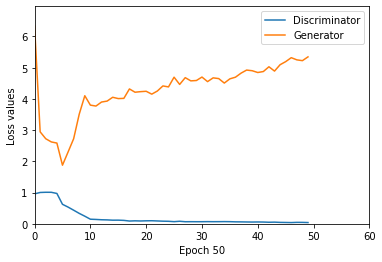

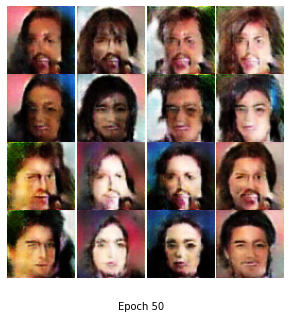

Epoch [51/60], Step [1/686], D_loss: 0.0464, G_loss: 5.7442
Epoch [51/60], Step [2/686], D_loss: 0.0181, G_loss: 5.1875
Epoch [51/60], Step [3/686], D_loss: 0.0346, G_loss: 6.0757
Epoch [51/60], Step [4/686], D_loss: 0.0424, G_loss: 6.4688
Epoch [51/60], Step [5/686], D_loss: 0.0312, G_loss: 5.7562
Epoch [51/60], Step [6/686], D_loss: 0.0421, G_loss: 4.4046
Epoch [51/60], Step [7/686], D_loss: 0.0403, G_loss: 5.0102
Epoch [51/60], Step [8/686], D_loss: 0.0271, G_loss: 5.4742
Epoch [51/60], Step [9/686], D_loss: 0.0427, G_loss: 5.4950
Epoch [51/60], Step [10/686], D_loss: 0.0532, G_loss: 5.7614
Epoch [51/60], Step [11/686], D_loss: 0.0377, G_loss: 6.9601
Epoch [51/60], Step [12/686], D_loss: 0.0434, G_loss: 6.2356
Epoch [51/60], Step [13/686], D_loss: 0.0295, G_loss: 5.5963
Epoch [51/60], Step [14/686], D_loss: 0.0863, G_loss: 4.3850
Epoch [51/60], Step [15/686], D_loss: 0.0345, G_loss: 5.5237
Epoch [51/60], Step [16/686], D_loss: 0.0254, G_loss: 5.8468
Epoch [51/60], Step [17/686], D_l

Epoch [51/60], Step [135/686], D_loss: 0.0246, G_loss: 5.5131
Epoch [51/60], Step [136/686], D_loss: 0.0228, G_loss: 4.6724
Epoch [51/60], Step [137/686], D_loss: 0.0486, G_loss: 5.7702
Epoch [51/60], Step [138/686], D_loss: 0.0242, G_loss: 4.5311
Epoch [51/60], Step [139/686], D_loss: 0.0288, G_loss: 5.7854
Epoch [51/60], Step [140/686], D_loss: 0.0187, G_loss: 5.9342
Epoch [51/60], Step [141/686], D_loss: 0.0138, G_loss: 5.7302
Epoch [51/60], Step [142/686], D_loss: 0.0169, G_loss: 6.0033
Epoch [51/60], Step [143/686], D_loss: 0.0109, G_loss: 6.2099
Epoch [51/60], Step [144/686], D_loss: 0.0598, G_loss: 7.3270
Epoch [51/60], Step [145/686], D_loss: 0.0449, G_loss: 6.7236
Epoch [51/60], Step [146/686], D_loss: 0.0148, G_loss: 6.6578
Epoch [51/60], Step [147/686], D_loss: 0.0626, G_loss: 5.3603
Epoch [51/60], Step [148/686], D_loss: 0.0606, G_loss: 5.1268
Epoch [51/60], Step [149/686], D_loss: 0.0398, G_loss: 4.9860
Epoch [51/60], Step [150/686], D_loss: 0.0151, G_loss: 5.2744
Epoch [5

Epoch [51/60], Step [268/686], D_loss: 0.0093, G_loss: 5.6994
Epoch [51/60], Step [269/686], D_loss: 0.0579, G_loss: 6.1690
Epoch [51/60], Step [270/686], D_loss: 0.0132, G_loss: 5.5631
Epoch [51/60], Step [271/686], D_loss: 0.0092, G_loss: 5.9736
Epoch [51/60], Step [272/686], D_loss: 0.0418, G_loss: 5.8937
Epoch [51/60], Step [273/686], D_loss: 0.0163, G_loss: 5.8760
Epoch [51/60], Step [274/686], D_loss: 0.0208, G_loss: 5.1576
Epoch [51/60], Step [275/686], D_loss: 0.0311, G_loss: 5.0053
Epoch [51/60], Step [276/686], D_loss: 0.0140, G_loss: 5.9642
Epoch [51/60], Step [277/686], D_loss: 0.0462, G_loss: 6.4921
Epoch [51/60], Step [278/686], D_loss: 0.0223, G_loss: 6.0734
Epoch [51/60], Step [279/686], D_loss: 0.0178, G_loss: 5.0413
Epoch [51/60], Step [280/686], D_loss: 0.0435, G_loss: 5.0583
Epoch [51/60], Step [281/686], D_loss: 0.0437, G_loss: 4.8621
Epoch [51/60], Step [282/686], D_loss: 0.0200, G_loss: 5.7220
Epoch [51/60], Step [283/686], D_loss: 0.0148, G_loss: 5.7522
Epoch [5

Epoch [51/60], Step [401/686], D_loss: 0.0556, G_loss: 6.4890
Epoch [51/60], Step [402/686], D_loss: 0.0960, G_loss: 6.3318
Epoch [51/60], Step [403/686], D_loss: 0.0123, G_loss: 6.3747
Epoch [51/60], Step [404/686], D_loss: 0.0218, G_loss: 5.6214
Epoch [51/60], Step [405/686], D_loss: 0.0649, G_loss: 5.6577
Epoch [51/60], Step [406/686], D_loss: 0.0337, G_loss: 5.2937
Epoch [51/60], Step [407/686], D_loss: 0.0254, G_loss: 5.0264
Epoch [51/60], Step [408/686], D_loss: 0.0286, G_loss: 3.7811
Epoch [51/60], Step [409/686], D_loss: 0.0236, G_loss: 5.3812
Epoch [51/60], Step [410/686], D_loss: 0.0278, G_loss: 5.4795
Epoch [51/60], Step [411/686], D_loss: 0.0321, G_loss: 6.0032
Epoch [51/60], Step [412/686], D_loss: 0.0388, G_loss: 7.1360
Epoch [51/60], Step [413/686], D_loss: 0.0498, G_loss: 5.6240
Epoch [51/60], Step [414/686], D_loss: 0.0208, G_loss: 6.5815
Epoch [51/60], Step [415/686], D_loss: 0.0402, G_loss: 5.3012
Epoch [51/60], Step [416/686], D_loss: 0.0180, G_loss: 4.9427
Epoch [5

Epoch [51/60], Step [534/686], D_loss: 0.0172, G_loss: 5.2533
Epoch [51/60], Step [535/686], D_loss: 0.0161, G_loss: 4.6678
Epoch [51/60], Step [536/686], D_loss: 0.0234, G_loss: 6.4745
Epoch [51/60], Step [537/686], D_loss: 0.0503, G_loss: 5.2975
Epoch [51/60], Step [538/686], D_loss: 0.0193, G_loss: 6.6750
Epoch [51/60], Step [539/686], D_loss: 0.0234, G_loss: 6.3512
Epoch [51/60], Step [540/686], D_loss: 0.0142, G_loss: 6.2791
Epoch [51/60], Step [541/686], D_loss: 0.0545, G_loss: 5.6822
Epoch [51/60], Step [542/686], D_loss: 0.0375, G_loss: 4.0086
Epoch [51/60], Step [543/686], D_loss: 0.0130, G_loss: 5.5035
Epoch [51/60], Step [544/686], D_loss: 0.0664, G_loss: 6.5410
Epoch [51/60], Step [545/686], D_loss: 0.0232, G_loss: 5.2523
Epoch [51/60], Step [546/686], D_loss: 0.0477, G_loss: 6.7482
Epoch [51/60], Step [547/686], D_loss: 0.0250, G_loss: 5.5586
Epoch [51/60], Step [548/686], D_loss: 0.0387, G_loss: 5.3032
Epoch [51/60], Step [549/686], D_loss: 0.0596, G_loss: 5.6734
Epoch [5

Epoch [51/60], Step [667/686], D_loss: 0.0547, G_loss: 5.6895
Epoch [51/60], Step [668/686], D_loss: 0.0368, G_loss: 4.9447
Epoch [51/60], Step [669/686], D_loss: 0.0226, G_loss: 5.2155
Epoch [51/60], Step [670/686], D_loss: 0.0416, G_loss: 5.4759
Epoch [51/60], Step [671/686], D_loss: 0.0240, G_loss: 5.5674
Epoch [51/60], Step [672/686], D_loss: 0.0459, G_loss: 6.2613
Epoch [51/60], Step [673/686], D_loss: 0.0366, G_loss: 4.8006
Epoch [51/60], Step [674/686], D_loss: 0.0116, G_loss: 4.7854
Epoch [51/60], Step [675/686], D_loss: 0.0280, G_loss: 5.1654
Epoch [51/60], Step [676/686], D_loss: 0.0122, G_loss: 6.0542
Epoch [51/60], Step [677/686], D_loss: 0.0220, G_loss: 5.2035
Epoch [51/60], Step [678/686], D_loss: 0.0233, G_loss: 5.9715
Epoch [51/60], Step [679/686], D_loss: 0.0267, G_loss: 5.3819
Epoch [51/60], Step [680/686], D_loss: 0.0589, G_loss: 4.2312
Epoch [51/60], Step [681/686], D_loss: 0.0274, G_loss: 4.1752
Epoch [51/60], Step [682/686], D_loss: 0.0287, G_loss: 6.5567
Epoch [5

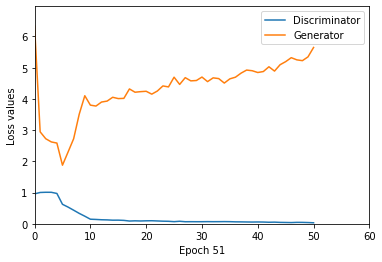

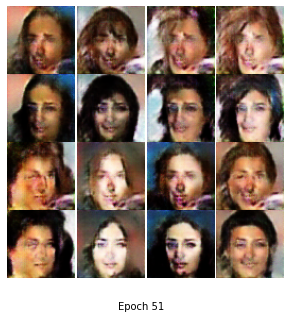

Epoch [52/60], Step [1/686], D_loss: 0.0496, G_loss: 5.6072
Epoch [52/60], Step [2/686], D_loss: 0.0491, G_loss: 6.3291
Epoch [52/60], Step [3/686], D_loss: 0.0235, G_loss: 6.9736
Epoch [52/60], Step [4/686], D_loss: 0.0845, G_loss: 5.5845
Epoch [52/60], Step [5/686], D_loss: 0.0530, G_loss: 6.2348
Epoch [52/60], Step [6/686], D_loss: 0.0370, G_loss: 5.0221
Epoch [52/60], Step [7/686], D_loss: 0.0577, G_loss: 4.5391
Epoch [52/60], Step [8/686], D_loss: 0.0395, G_loss: 4.6035
Epoch [52/60], Step [9/686], D_loss: 0.0384, G_loss: 5.1337
Epoch [52/60], Step [10/686], D_loss: 0.0443, G_loss: 3.6189
Epoch [52/60], Step [11/686], D_loss: 0.0571, G_loss: 5.2449
Epoch [52/60], Step [12/686], D_loss: 0.0261, G_loss: 6.1891
Epoch [52/60], Step [13/686], D_loss: 0.0172, G_loss: 3.5171
Epoch [52/60], Step [14/686], D_loss: 0.0528, G_loss: 4.6323
Epoch [52/60], Step [15/686], D_loss: 0.0241, G_loss: 5.8563
Epoch [52/60], Step [16/686], D_loss: 0.0497, G_loss: 5.4522
Epoch [52/60], Step [17/686], D_l

Epoch [52/60], Step [135/686], D_loss: 0.0322, G_loss: 4.5670
Epoch [52/60], Step [136/686], D_loss: 0.0401, G_loss: 4.8255
Epoch [52/60], Step [137/686], D_loss: 0.0477, G_loss: 4.7961
Epoch [52/60], Step [138/686], D_loss: 0.0361, G_loss: 4.8367
Epoch [52/60], Step [139/686], D_loss: 0.0373, G_loss: 5.6752
Epoch [52/60], Step [140/686], D_loss: 0.0274, G_loss: 4.3233
Epoch [52/60], Step [141/686], D_loss: 0.0537, G_loss: 5.0886
Epoch [52/60], Step [142/686], D_loss: 0.0232, G_loss: 5.0885
Epoch [52/60], Step [143/686], D_loss: 0.0253, G_loss: 4.1667
Epoch [52/60], Step [144/686], D_loss: 0.0344, G_loss: 5.3087
Epoch [52/60], Step [145/686], D_loss: 0.0468, G_loss: 6.3090
Epoch [52/60], Step [146/686], D_loss: 0.0482, G_loss: 5.5601
Epoch [52/60], Step [147/686], D_loss: 0.1047, G_loss: 5.3012
Epoch [52/60], Step [148/686], D_loss: 0.0245, G_loss: 6.4203
Epoch [52/60], Step [149/686], D_loss: 0.0522, G_loss: 4.3582
Epoch [52/60], Step [150/686], D_loss: 0.0198, G_loss: 5.8710
Epoch [5

Epoch [52/60], Step [268/686], D_loss: 0.0109, G_loss: 5.0898
Epoch [52/60], Step [269/686], D_loss: 0.0538, G_loss: 4.8249
Epoch [52/60], Step [270/686], D_loss: 0.0173, G_loss: 4.4299
Epoch [52/60], Step [271/686], D_loss: 0.0220, G_loss: 4.5634
Epoch [52/60], Step [272/686], D_loss: 0.0722, G_loss: 6.1368
Epoch [52/60], Step [273/686], D_loss: 0.0471, G_loss: 5.3297
Epoch [52/60], Step [274/686], D_loss: 0.0361, G_loss: 6.1838
Epoch [52/60], Step [275/686], D_loss: 0.0394, G_loss: 5.8595
Epoch [52/60], Step [276/686], D_loss: 0.0188, G_loss: 4.8134
Epoch [52/60], Step [277/686], D_loss: 0.0714, G_loss: 5.0382
Epoch [52/60], Step [278/686], D_loss: 0.0449, G_loss: 4.2502
Epoch [52/60], Step [279/686], D_loss: 0.0368, G_loss: 4.2018
Epoch [52/60], Step [280/686], D_loss: 0.0323, G_loss: 5.0189
Epoch [52/60], Step [281/686], D_loss: 0.0383, G_loss: 4.4301
Epoch [52/60], Step [282/686], D_loss: 0.0141, G_loss: 4.2678
Epoch [52/60], Step [283/686], D_loss: 0.0404, G_loss: 4.8527
Epoch [5

In [ ]:
# Training GAN
D_avg_losses = []
G_avg_losses = []

step = 0
for epoch in range(num_epochs):
    D_losses = []
    G_losses = []

    if epoch == 5 or epoch == 10:
        G_optimizer.param_groups[0]['lr'] /= 10
        D_optimizer.param_groups[0]['lr'] /= 10

    # minibatch training
    for i, (images, _) in enumerate(data_loader):

        # image data
        mini_batch = images.size()[0]
        x_ = Variable(images.cuda())

        # labels
        y_real_ = Variable(torch.ones(mini_batch).cuda())
        y_fake_ = Variable(torch.zeros(mini_batch).cuda())
        c_label_ = label[mini_batch*i:mini_batch*(i+1)]
        c_fill_ = Variable(fill[c_label_].cuda())

        # Train discriminator with real data
        D_real_decision = D(x_, c_fill_).squeeze()
        D_real_loss = criterion(D_real_decision, y_real_)

        # Train discriminator with fake data
        z_ = torch.randn(mini_batch, G_input_dim).view(-1, G_input_dim, 1, 1)
        z_ = Variable(z_.cuda())

        c_ = (torch.rand(mini_batch, 1) * label_dim).type(torch.LongTensor).squeeze()
        c_onehot_ = Variable(onehot[c_].cuda())
        gen_image = G(z_, c_onehot_)

        c_fill_ = Variable(fill[c_].cuda())
        D_fake_decision = D(gen_image, c_fill_).squeeze()
        D_fake_loss = criterion(D_fake_decision, y_fake_)

        # Back propagation
        D_loss = D_real_loss + D_fake_loss
        D.zero_grad()
        D_loss.backward()
        D_optimizer.step()

        # Train generator
        z_ = torch.randn(mini_batch, G_input_dim).view(-1, G_input_dim, 1, 1)
        z_ = Variable(z_.cuda())

        c_ = (torch.rand(mini_batch, 1) * label_dim).type(torch.LongTensor).squeeze()
        c_onehot_ = Variable(onehot[c_].cuda())
        gen_image = G(z_, c_onehot_)

        c_fill_ = Variable(fill[c_].cuda())
        D_fake_decision = D(gen_image, c_fill_).squeeze()
        G_loss = criterion(D_fake_decision, y_real_)

        # Back propagation
        G.zero_grad()
        G_loss.backward()
        G_optimizer.step()

        # loss values
        D_losses.append(D_loss.item())
        G_losses.append(G_loss.item())

        print('Epoch [%d/%d], Step [%d/%d], D_loss: %.4f, G_loss: %.4f'
              % (epoch+1, num_epochs, i+1, len(data_loader), D_loss.item(), G_loss.item()))

        # ============ TensorBoard logging ============#
        D_logger.scalar_summary('losses', D_loss.item(), step + 1)
        G_logger.scalar_summary('losses', G_loss.item(), step + 1)
        step += 1

    D_avg_loss = torch.mean(torch.FloatTensor(D_losses))
    G_avg_loss = torch.mean(torch.FloatTensor(G_losses))

    # avg loss values for plot
    D_avg_losses.append(D_avg_loss)
    G_avg_losses.append(G_avg_loss)

    plot_loss(D_avg_losses, G_avg_losses, epoch, save=True, save_dir=save_dir)

    # Show result for fixed noise
    plot_result(G, fixed_noise, fixed_label, epoch, save=True, save_dir=save_dir)

In [ ]:
# Make gif
loss_plots = []
gen_image_plots = []
for epoch in range(num_epochs):
    # plot for generating gif
    save_fn1 = save_dir + 'CelebA_cDCGAN_losses_epoch_{:d}'.format(epoch + 1) + '.png'
    loss_plots.append(imageio.imread(save_fn1))

    save_fn2 = save_dir + 'CelebA_cDCGAN_epoch_{:d}'.format(epoch + 1) + '.png'
    gen_image_plots.append(imageio.imread(save_fn2))

imageio.mimsave(save_dir + 'CelebA_cDCGAN_losses_epochs_{:d}'.format(num_epochs) + '.gif', loss_plots, fps=5)
imageio.mimsave(save_dir + 'CelebA_cDCGAN_epochs_{:d}'.format(num_epochs) + '.gif', gen_image_plots, fps=5)

In [ ]:
# plot noise morp result
plot_morp_result(G, save=True, save_dir=save_dir)